In [10]:
%matplotlib inline
import os
import numpy as np
import pickle
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker

# This script downloads and reformats the wikipedia link dataset found at: http://snap.stanford.edu/data/index.html

Run fourth (last)

1. 

### Input
`categories_to_names2020`
Dictionary that maps each new category index to category names.

`categories_to_categories2020.p`
Dict that contains the hyperlink information, abstracted to category level. Key is category index (start of edge), 
value is dictionary of category index: number of hyperlinks (end of edges).

`categories_to_domains2020.p`
Dictionary that maps each (included) category (re)index to one or more of the kept domains, reindexed.

`domains2020.npy`
Numpy array keeping ordered, unique set of domains.

`domains_to_names2020`
Dictionary that maps each domain index to its name.


### Output


In [2]:
wDir = '.' # the top level working directory
dataDir = '{0}/WIKIdata'.format(wDir) # where to find and store the data. 
# Unlink from git if necessary by adding to .gitignore in wDir; large files.

matDir = 'matrices2020' # where to store output matrices
figDir = 'figs2020' # where to store output figures

lower_limit = 3 # minimum number of categories per domain
upper_limit = 10 # maximum number of categories per domain

os.listdir(dataDir)

['pages_to_categories2020.p',
 'wiki-topcats.txt',
 'wiki-topcats-categories.txt',
 '.DS_Store',
 'numDomainsPerCatRaw.npy',
 'categories_to_domains2020.p',
 'matrices2020',
 'categories_to_names2020.p',
 'wiki-topcats-page-names.txt',
 'categories_to_categories2020.p',
 'domains_to_names2020.p',
 'domains2020.npy',
 'figs2020']

In [3]:
with open('{0}/categories_to_categories2020.p'.format(dataDir), 'rb') as pfile:
    catsCatsMappings = pickle.load(pfile)

with open('{0}/categories_to_names2020.p'.format(dataDir), 'rb') as pfile:
    categoryNames = pickle.load(pfile)

with open('{0}/domains_to_names2020.p'.format(dataDir), 'rb') as pfile:
    domainNames = pickle.load(pfile)

with open('{0}/categories_to_domains2020.p'.format(dataDir), 'rb') as pfile:
    catDomMappings = pickle.load(pfile)

# kept category (re)indicies
categoryIdxs = np.sort(list(categoryNames.keys()))
assert (categoryIdxs == np.arange(len(categoryIdxs))).all()

# check indexing is working correctly
print(categoryIdxs[0]) # print first category idx (should be 0)
print(categoryNames[categoryIdxs[0]]) # print this category
print(catDomMappings[categoryIdxs[0]][0]) # print which domain idx it is nested under
print(domainNames[catDomMappings[categoryIdxs[0]][0]]) # print domain name (should check out)

0
Laboulbeniomycetes
0
Fungus classes


In [8]:
class domainObject:
    def __init__(self, name, idx):
        self.name = name # string that is wikipedia name for domain
        self.idx = idx # our index for domain
        self.old_idx = idx
        self.categoryIdxs = [] # list of categories belonging to that domain
        self.C = None # number of categories in domain
        self.edges = {} # edge dictionary (should #self.C keys)
        self.categoryMappings = {} # mapping from local (domain-specific, contiguous, increasing) categoryIdx to global categoryIdx 
        self.categoryLabels = {} # mapping from local category index to category name

    def reduce_categories(self, categoryNames):
        """Use after compilation. Takes a list of possibly redundant category indices
        and reindexes them to ascending contiguous range for current domain.
        Adds label information to domain-specific category indices"""
        
        # ensure unique category indices
        self.categoryIdxs = list(set(self.categoryIdxs))
        
        # number of categories in this domain is length of this list
        self.C = len(self.categoryIdxs)
        
        # create mapping between new (key) and old (value) category indices
        for c, i in zip(self.categoryIdxs, np.arange(len(self.categoryIdxs))):
            self.categoryMappings[i] = c
            
        # create ordered list of category names that aligns with new / domain-specific category indices
        labels = []
        for i in np.arange(self.C):
            labels.append(categoryNames[self.categoryMappings[i]].replace('_', ' '))
        self.categoryLabels = labels
        assert len(self.categoryLabels) == self.C, "labels {} long, categories {} long".format(len(self.categoryLabels,
                                                                                         self.C))
    def reduce_edges(self, categoryNames):
        """Use after self.categories fully compiled and reduced. Only keep targets (endpoints) that
        are also in domain. Edge idxs are in terms of global category idxs."""
        tempEdges = {} # to ensure not overwritting
        for source, edges in self.edges.items(): # will be pair of source: {target: count, target2: count2, ...}
            edgeDict = dict(edges)
            tempEdges[source] = {} # fresh count dictionary
            for target, count in edgeDict.items(): # for target: count pairs within outgoing edges from source categoryIdx
                if target in self.categoryIdxs: # if the target is in domain
                    tempEdges[source][target] = count # update dictionary
                else:
                    continue
        self.edges = tempEdges # reset edge property with filtered dict
            
    def create_interaction_matrix(self):
        interactionMatrix = np.empty((self.C, self.C))
        for i in np.arange(self.C):
            baseCat = self.categoryMappings[i]
            for j in np.arange(self.C):
                targetCat = self.categoryMappings[j]
                try:
                    interactionMatrix[i, j] = self.edges[baseCat][targetCat]
                except:
                    interactionMatrix[i, j] = 0
                
        self.create_frequency_matrix(interactionMatrix)       
        self.interactionMatrix = interactionMatrix / np.sum(interactionMatrix, axis = 1)[:, np.newaxis]
        assert np.abs(np.sum(self.interactionMatrix[0, :]) - 1.0) < 0.01, "interactionMatrix[0, :]\
        sum not 1: instead, {0}".format(np.sum(self.interactionMatrix, axis = 1))
        
    def create_frequency_matrix(self, countMatrix):
        """Run after above. Counts number of out edges for each """
        freqVec = np.empty(self.C) # one element for each class
        for i in np.arange(self.C):
            # combined endpoint frequency calculated as follows
            freqVec[i] = np.sum(countMatrix[i, :]) + np.sum(countMatrix[:, i]) - countMatrix[i, i]
        self.freqVec = (freqVec / np.sum(freqVec))
        assert np.abs(np.sum(self.freqVec) - 1.0) < 0.01, "freqVec sum not 1: instead, {0}, {1}".format(self.freqVec, np.sum(self.freqVec))
        

    def plot_interaction_matrix(self, savePath=False):
        fig = plt.figure(constrained_layout=True)
        gs = fig.add_gridspec(nrows=4, ncols=11) #, left=0.05, right=0.48, wspace=0.05)

        ax1 = fig.add_subplot(gs[:, :6])
        ax1.matshow(self.interactionMatrix, vmin = 0, vmax = 1, cmap='Greys')
        ax1.set_title('Interactions')
        ax2 = fig.add_subplot(gs[:, 8:])
        plt.sca(ax2)
        myPlot = ax2.matshow(self.freqVec[:, np.newaxis], vmin = 0, vmax = 1, cmap='Greys')
        ax2.set_title('Freq')
        plt.suptitle('Interaction matrix for domain: {0}'.format(self.name))
        ax1.xaxis.set_major_locator(ticker.MultipleLocator(1))
        ax1.yaxis.set_major_locator(ticker.MultipleLocator(1))
        ax1.set_yticklabels([''] + self.categoryLabels)
        
        ax1.set_xticklabels([''] + self.categoryLabels)
        ax1.xaxis.set_ticks_position('bottom')
        ax1.set_xticklabels(ax1.get_xticklabels(), rotation = 45, ha="right")

        ax2.set_xticks([])
        ax2.set_yticks([])
        left, bottom, width, height = ax2.get_position().bounds
        cax = fig.add_axes([left + 0.3, bottom + height - 0.3, width * 0.5, 0.25])
        cbar = plt.colorbar(myPlot, cax = cax)
        
        if savePath:
            try:
                plt.savefig('{0}.png'.format(savePath), bbox_inches = 'tight', bbox_extra_artist=(cbar,))
            except Exception as e:
                print('exception to print: {}'.format(e))
                try:
                    plt.savefig('{0}.png'.format(savePath.replace(".","-")), bbox_inches = 'tight', bbox_extra_artist=(cbar,))
                except Exception as e:
                    print("further exception to print: {}".format(e))
                
        plt.show()
        plt.close('all')
        
    def save_matrices(self, savePath):
        print('saving data in: {0}'.format(savePath))
        np.savez('{0}'.format(savePath), intMat = self.interactionMatrix, freqVec = self.freqVec,
                name=np.asarray(self.name), categoryNames = self.categoryLabels, C = self.C)
        
testDomain = domainObject(domainNames[catDomMappings[categoryIdxs[0]][0]], catDomMappings[categoryIdxs[0]][0])
print(testDomain.name)


Fungus classes


saving data in: ./WIKIdata/matrices2020/wikipedia_system_0.npz


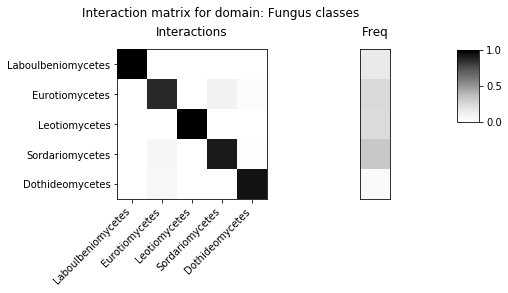

saving data in: ./WIKIdata/matrices2020/wikipedia_system_1.npz


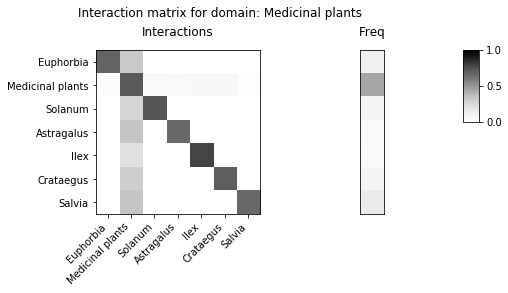

saving data in: ./WIKIdata/matrices2020/wikipedia_system_2.npz


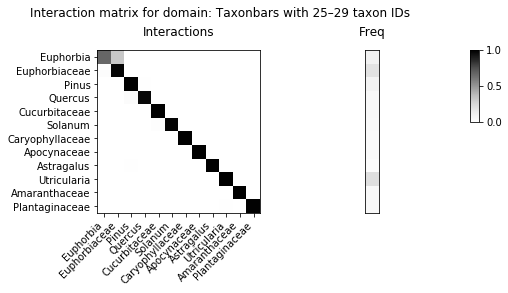

saving data in: ./WIKIdata/matrices2020/wikipedia_system_3.npz


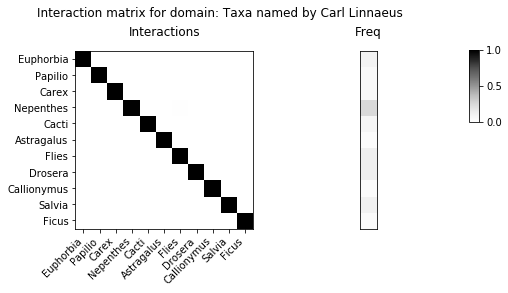

saving data in: ./WIKIdata/matrices2020/wikipedia_system_4.npz


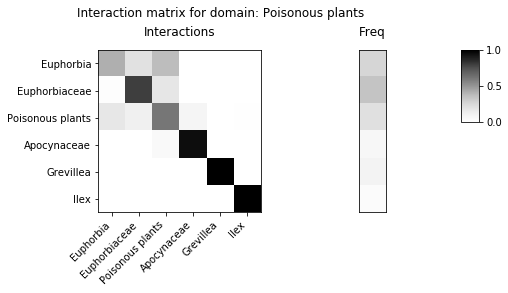

saving data in: ./WIKIdata/matrices2020/wikipedia_system_5.npz


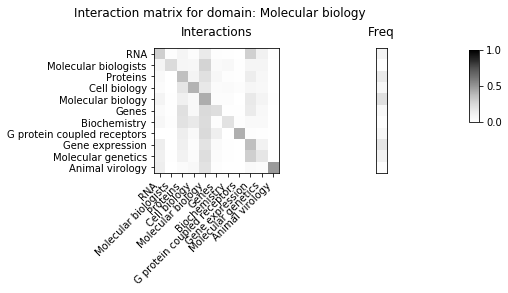

saving data in: ./WIKIdata/matrices2020/wikipedia_system_6.npz


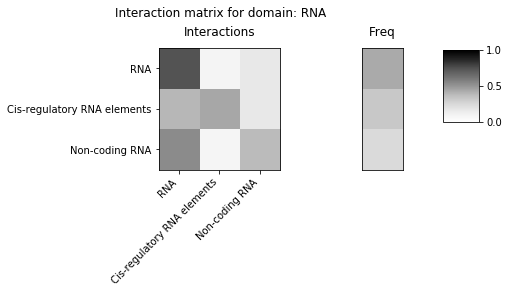

saving data in: ./WIKIdata/matrices2020/wikipedia_system_7.npz


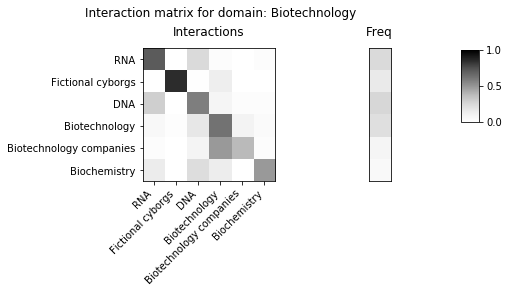

saving data in: ./WIKIdata/matrices2020/wikipedia_system_8.npz


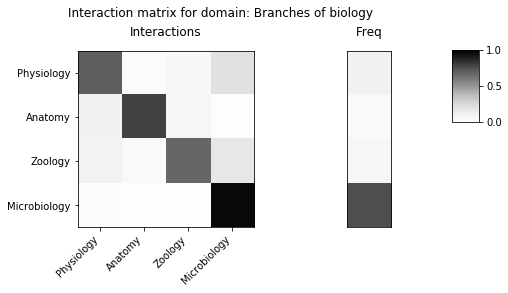

saving data in: ./WIKIdata/matrices2020/wikipedia_system_9.npz


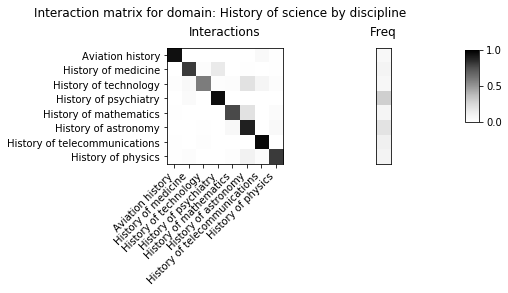

saving data in: ./WIKIdata/matrices2020/wikipedia_system_10.npz


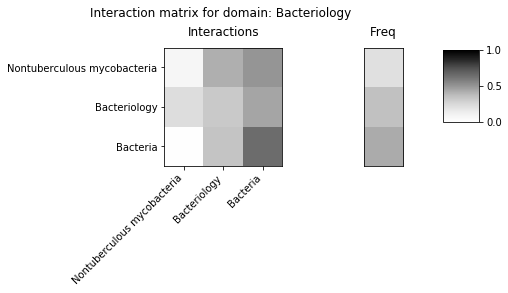

saving data in: ./WIKIdata/matrices2020/wikipedia_system_11.npz


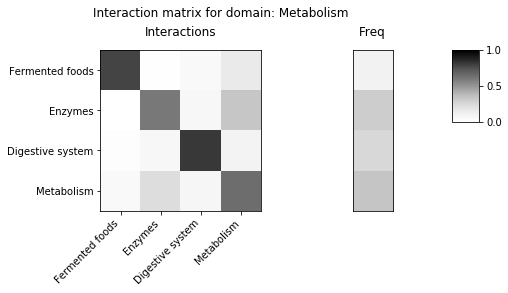

saving data in: ./WIKIdata/matrices2020/wikipedia_system_12.npz


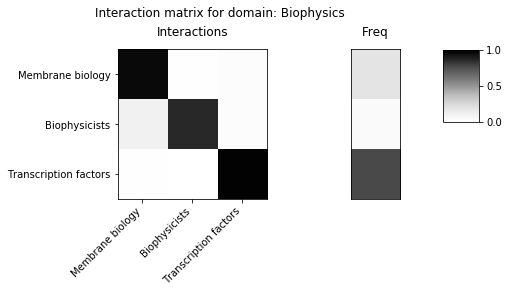

saving data in: ./WIKIdata/matrices2020/wikipedia_system_13.npz


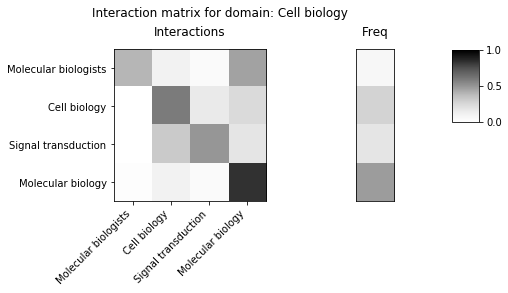

saving data in: ./WIKIdata/matrices2020/wikipedia_system_14.npz


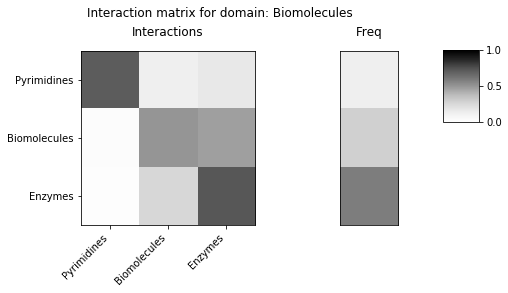

saving data in: ./WIKIdata/matrices2020/wikipedia_system_15.npz


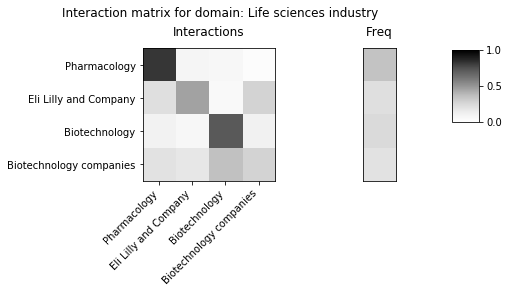

saving data in: ./WIKIdata/matrices2020/wikipedia_system_16.npz


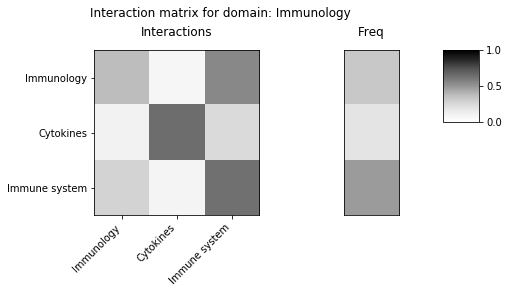

saving data in: ./WIKIdata/matrices2020/wikipedia_system_17.npz


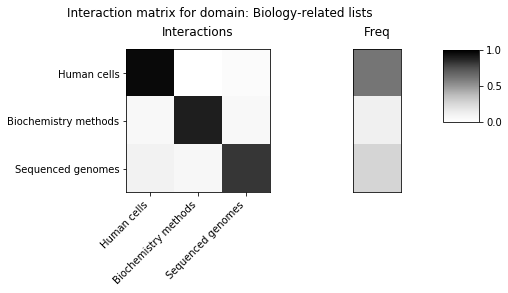

saving data in: ./WIKIdata/matrices2020/wikipedia_system_18.npz


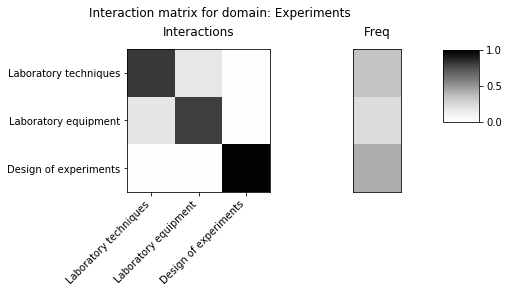

saving data in: ./WIKIdata/matrices2020/wikipedia_system_19.npz


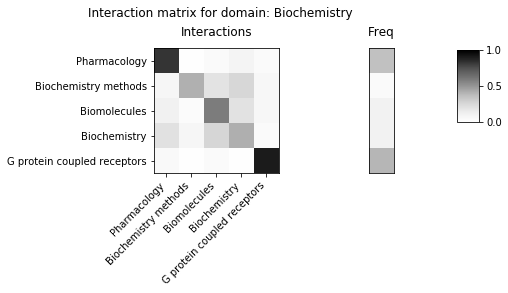

saving data in: ./WIKIdata/matrices2020/wikipedia_system_20.npz


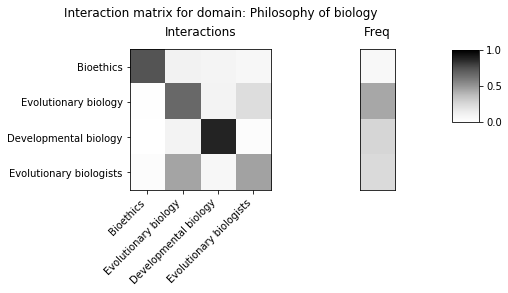

saving data in: ./WIKIdata/matrices2020/wikipedia_system_21.npz


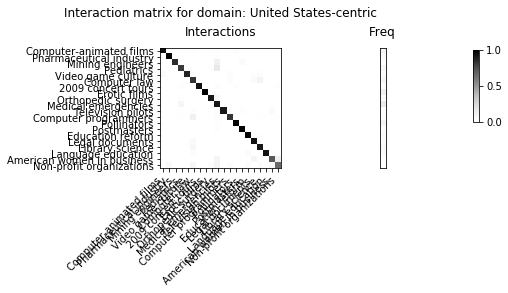

saving data in: ./WIKIdata/matrices2020/wikipedia_system_22.npz


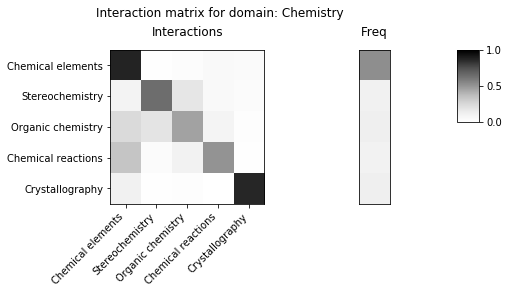

saving data in: ./WIKIdata/matrices2020/wikipedia_system_23.npz


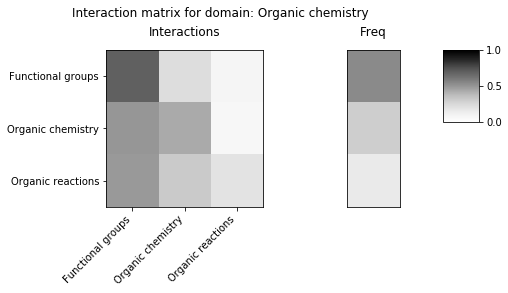

saving data in: ./WIKIdata/matrices2020/wikipedia_system_24.npz


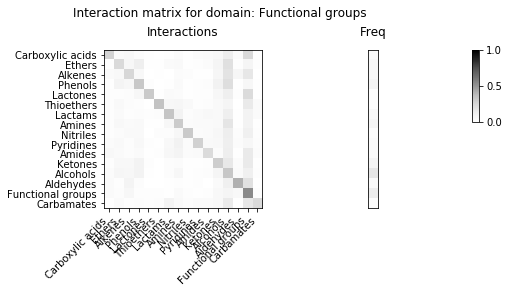

saving data in: ./WIKIdata/matrices2020/wikipedia_system_25.npz


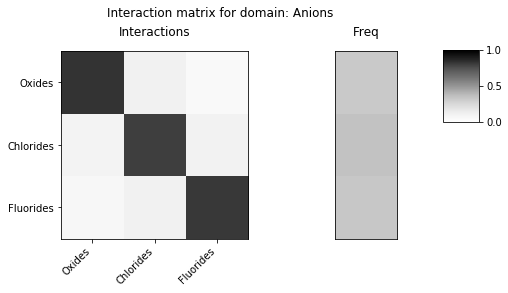

saving data in: ./WIKIdata/matrices2020/wikipedia_system_26.npz


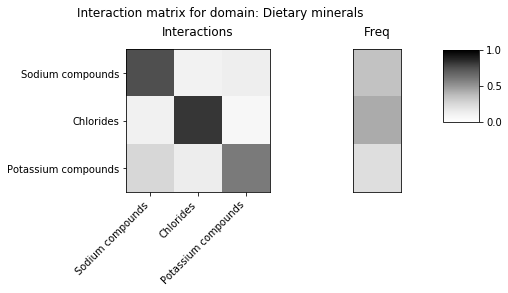

saving data in: ./WIKIdata/matrices2020/wikipedia_system_27.npz


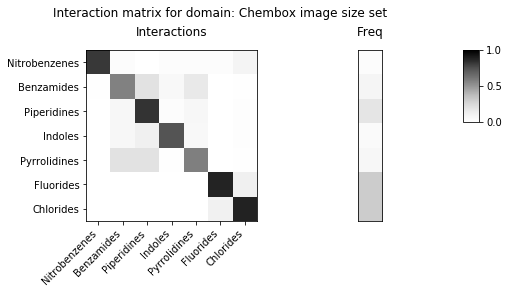

saving data in: ./WIKIdata/matrices2020/wikipedia_system_28.npz


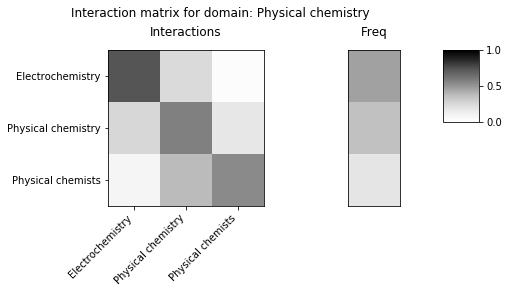

saving data in: ./WIKIdata/matrices2020/wikipedia_system_29.npz


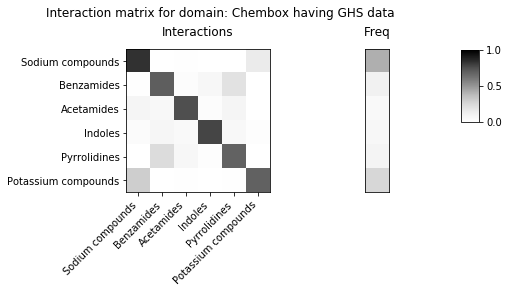

saving data in: ./WIKIdata/matrices2020/wikipedia_system_30.npz


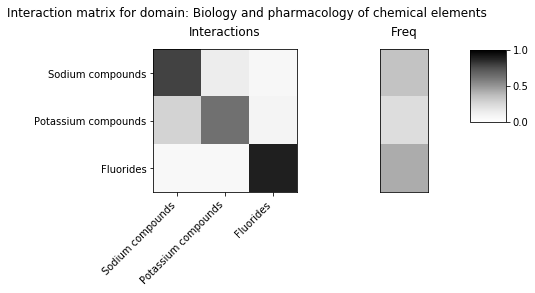

saving data in: ./WIKIdata/matrices2020/wikipedia_system_31.npz


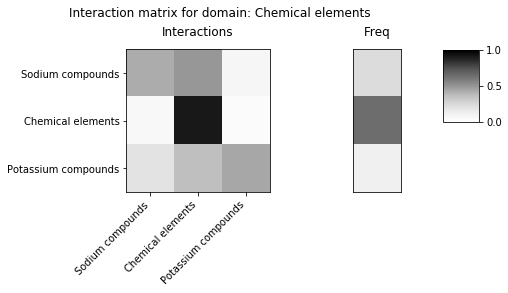

saving data in: ./WIKIdata/matrices2020/wikipedia_system_32.npz


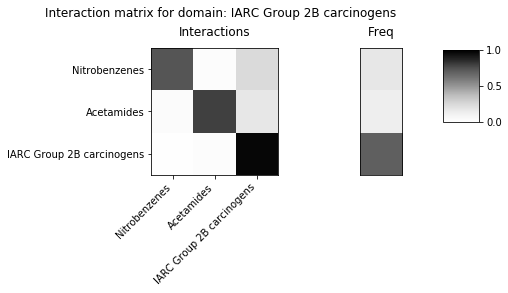

saving data in: ./WIKIdata/matrices2020/wikipedia_system_33.npz


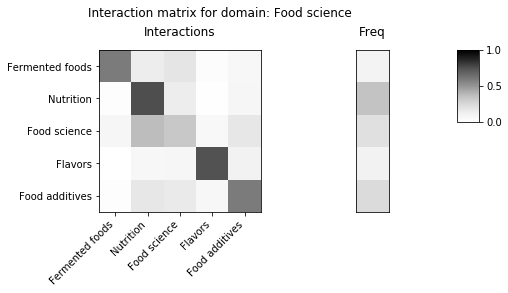

saving data in: ./WIKIdata/matrices2020/wikipedia_system_34.npz


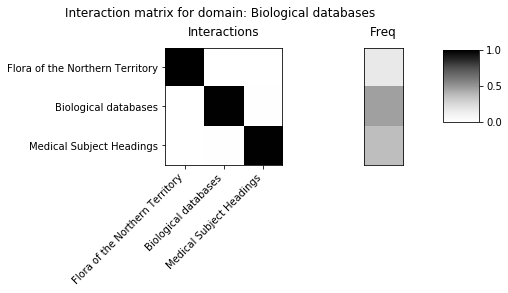

saving data in: ./WIKIdata/matrices2020/wikipedia_system_35.npz


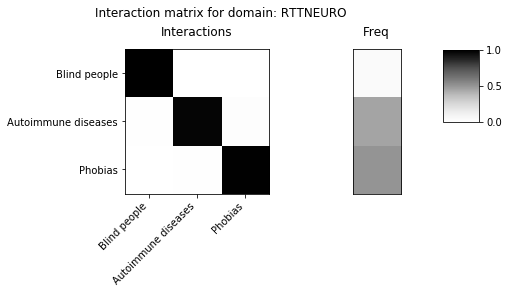

saving data in: ./WIKIdata/matrices2020/wikipedia_system_36.npz


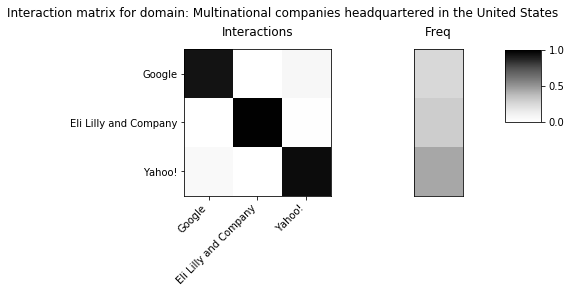

saving data in: ./WIKIdata/matrices2020/wikipedia_system_37.npz


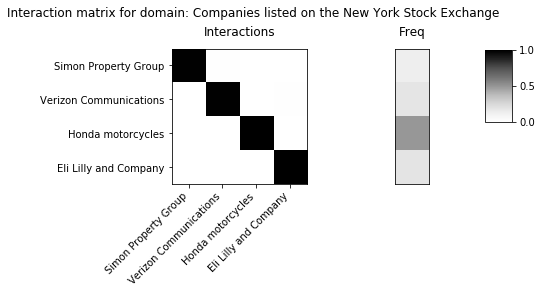

saving data in: ./WIKIdata/matrices2020/wikipedia_system_38.npz


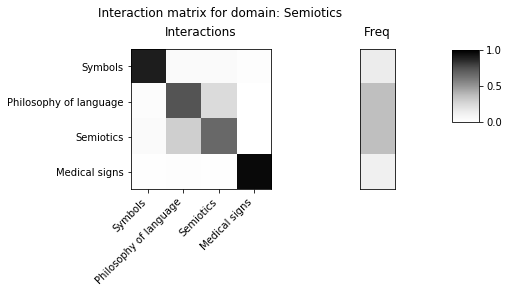

saving data in: ./WIKIdata/matrices2020/wikipedia_system_39.npz


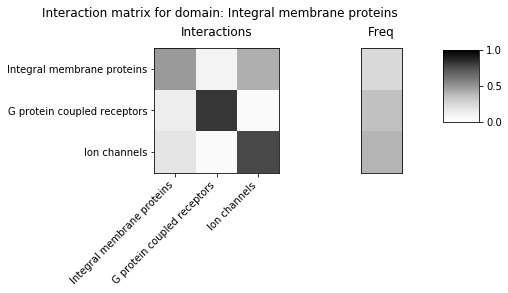

saving data in: ./WIKIdata/matrices2020/wikipedia_system_40.npz


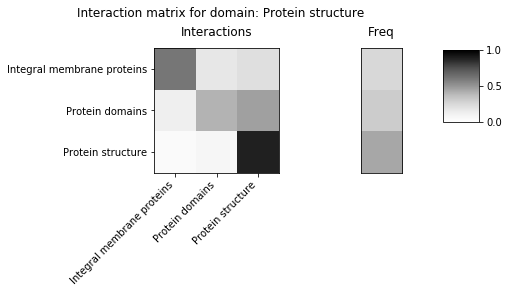

saving data in: ./WIKIdata/matrices2020/wikipedia_system_41.npz


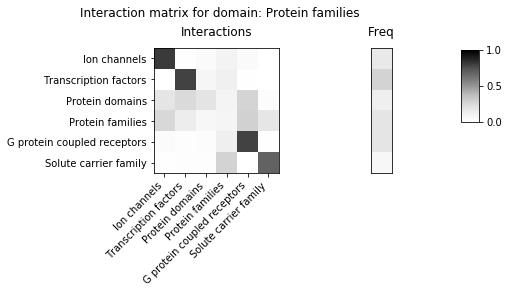

saving data in: ./WIKIdata/matrices2020/wikipedia_system_42.npz


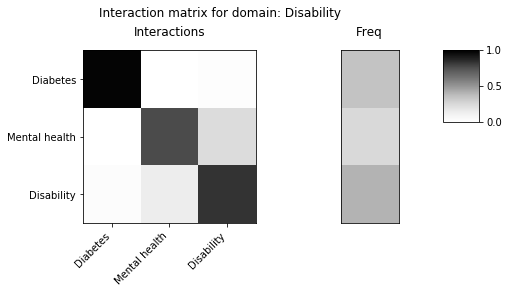

saving data in: ./WIKIdata/matrices2020/wikipedia_system_43.npz


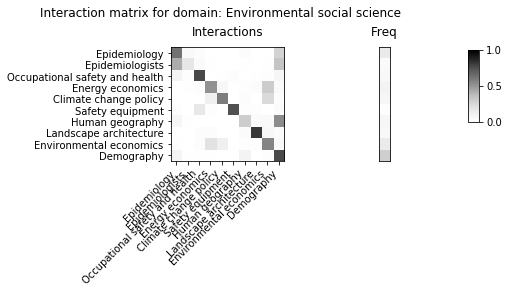

saving data in: ./WIKIdata/matrices2020/wikipedia_system_44.npz


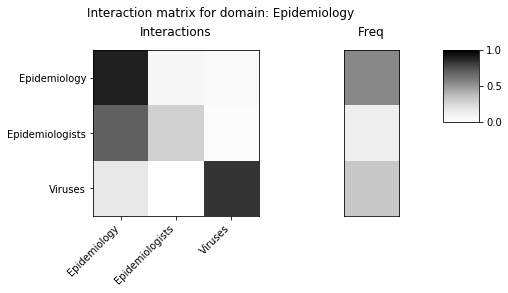

saving data in: ./WIKIdata/matrices2020/wikipedia_system_45.npz


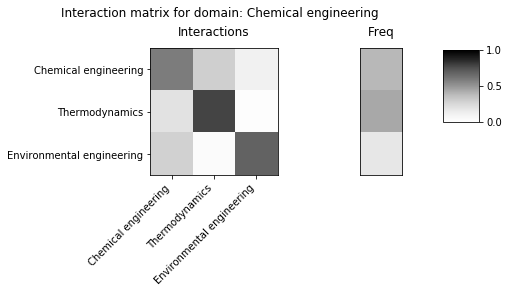

saving data in: ./WIKIdata/matrices2020/wikipedia_system_46.npz


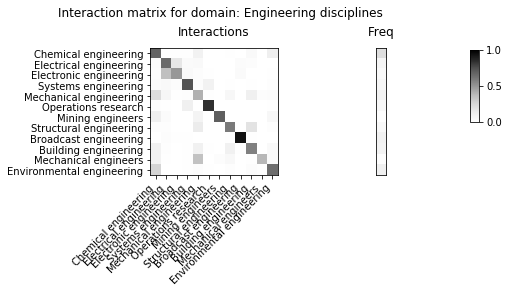

saving data in: ./WIKIdata/matrices2020/wikipedia_system_47.npz


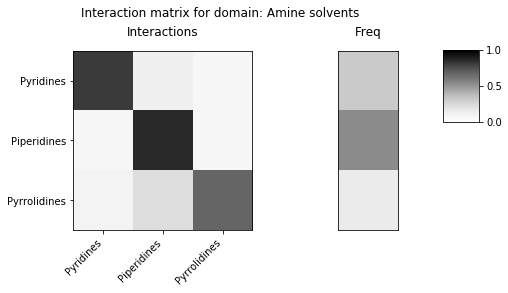

saving data in: ./WIKIdata/matrices2020/wikipedia_system_48.npz


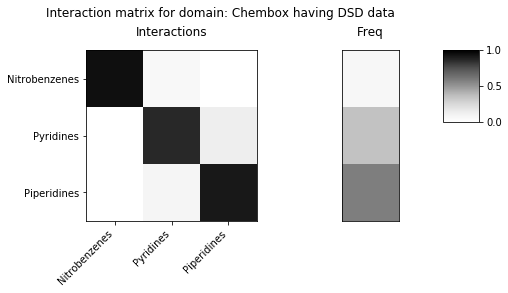

saving data in: ./WIKIdata/matrices2020/wikipedia_system_49.npz


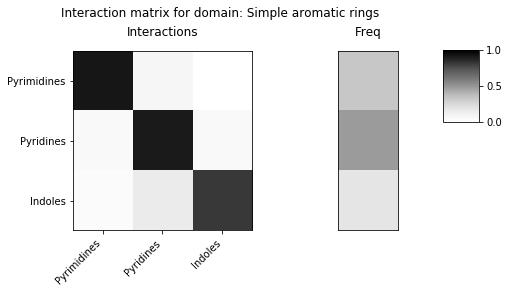

saving data in: ./WIKIdata/matrices2020/wikipedia_system_50.npz


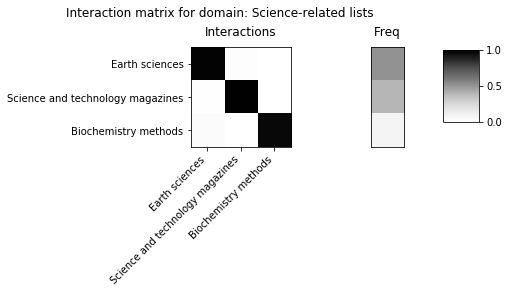

saving data in: ./WIKIdata/matrices2020/wikipedia_system_51.npz


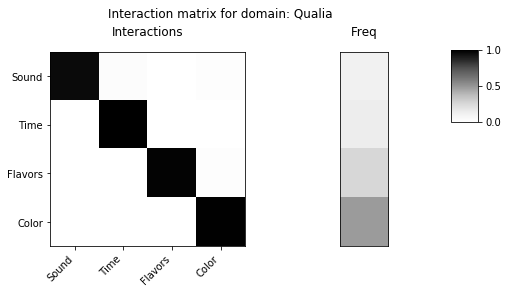

saving data in: ./WIKIdata/matrices2020/wikipedia_system_52.npz


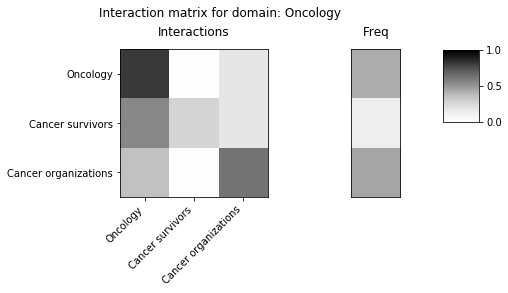

saving data in: ./WIKIdata/matrices2020/wikipedia_system_53.npz


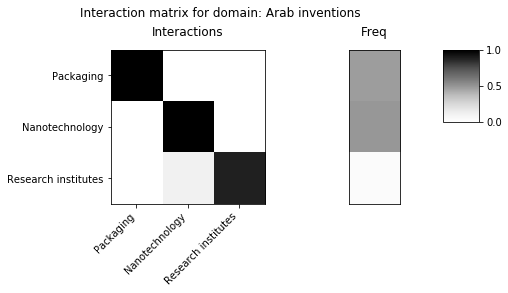

saving data in: ./WIKIdata/matrices2020/wikipedia_system_54.npz


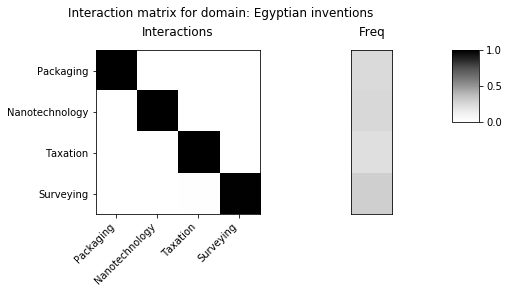

saving data in: ./WIKIdata/matrices2020/wikipedia_system_55.npz


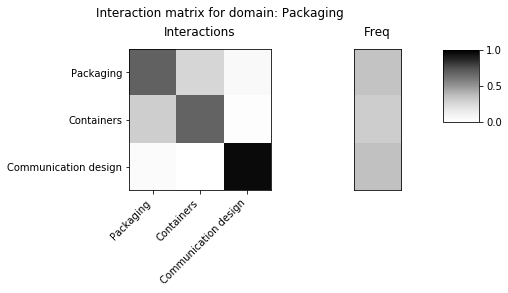

saving data in: ./WIKIdata/matrices2020/wikipedia_system_56.npz


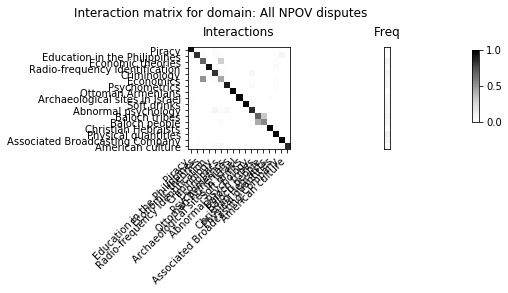

saving data in: ./WIKIdata/matrices2020/wikipedia_system_57.npz


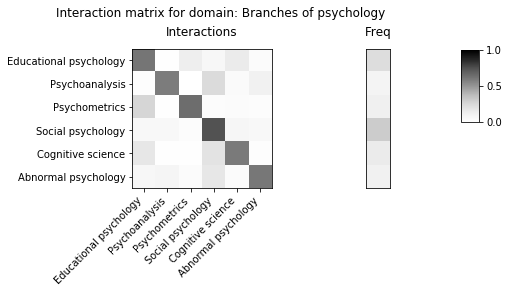

saving data in: ./WIKIdata/matrices2020/wikipedia_system_58.npz


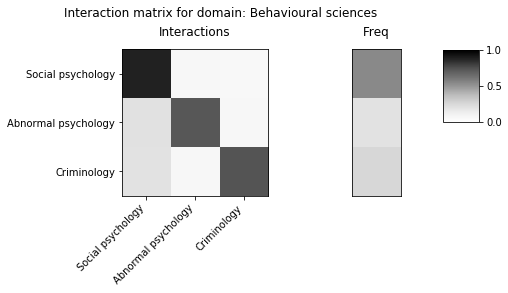

saving data in: ./WIKIdata/matrices2020/wikipedia_system_59.npz


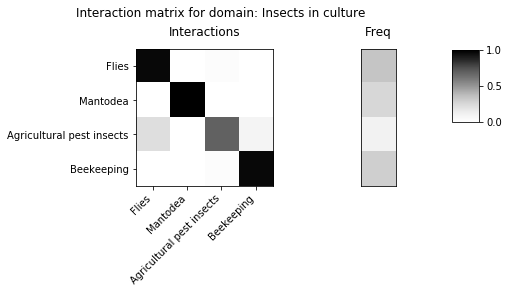

saving data in: ./WIKIdata/matrices2020/wikipedia_system_60.npz


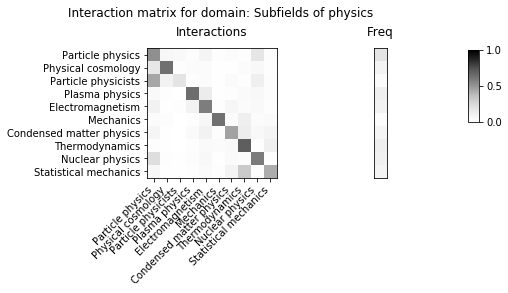

saving data in: ./WIKIdata/matrices2020/wikipedia_system_61.npz


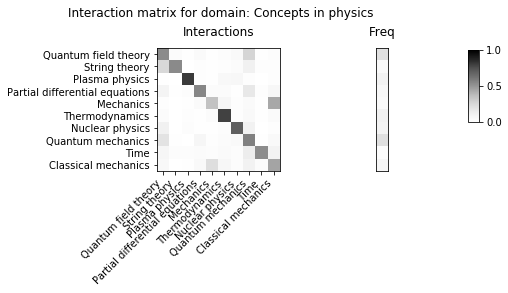

saving data in: ./WIKIdata/matrices2020/wikipedia_system_62.npz


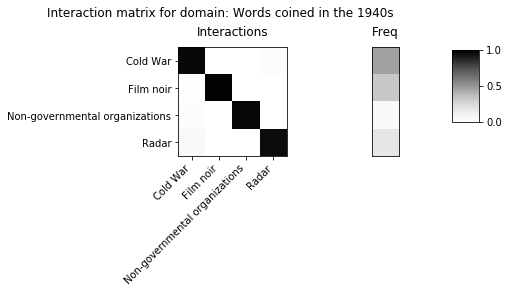

saving data in: ./WIKIdata/matrices2020/wikipedia_system_63.npz


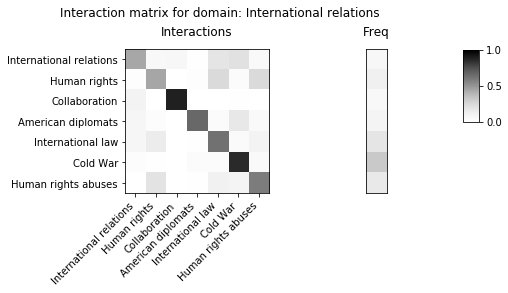

saving data in: ./WIKIdata/matrices2020/wikipedia_system_64.npz


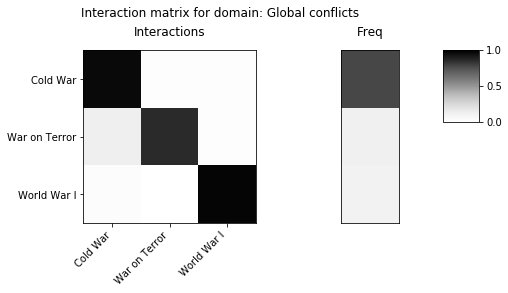

saving data in: ./WIKIdata/matrices2020/wikipedia_system_65.npz


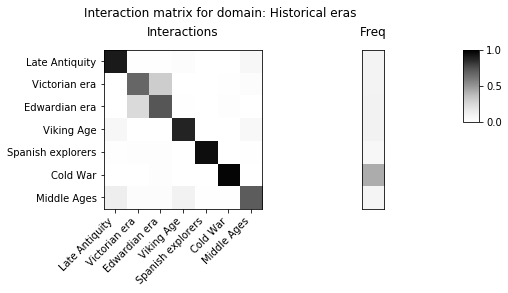

saving data in: ./WIKIdata/matrices2020/wikipedia_system_66.npz


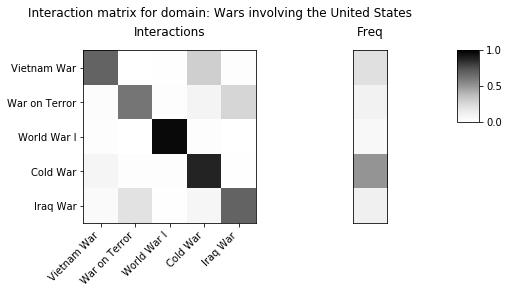

saving data in: ./WIKIdata/matrices2020/wikipedia_system_67.npz


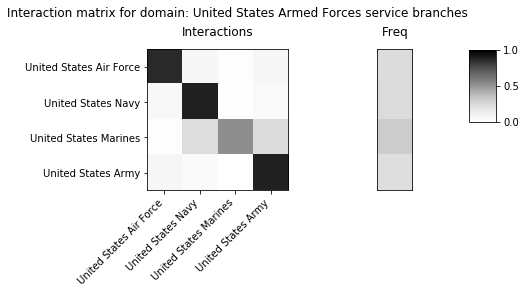

saving data in: ./WIKIdata/matrices2020/wikipedia_system_68.npz


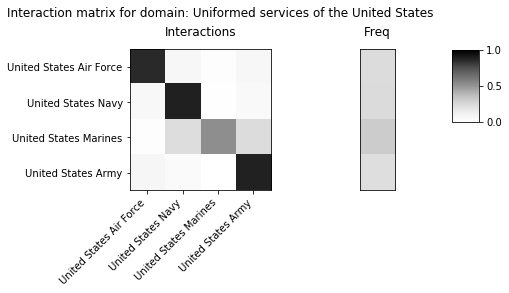

saving data in: ./WIKIdata/matrices2020/wikipedia_system_69.npz


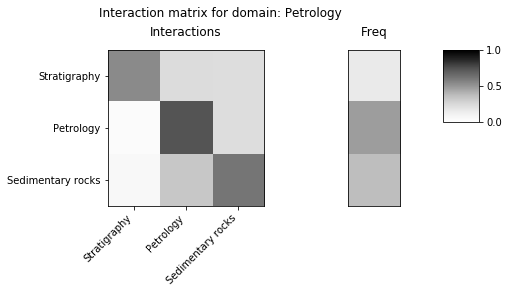

saving data in: ./WIKIdata/matrices2020/wikipedia_system_70.npz


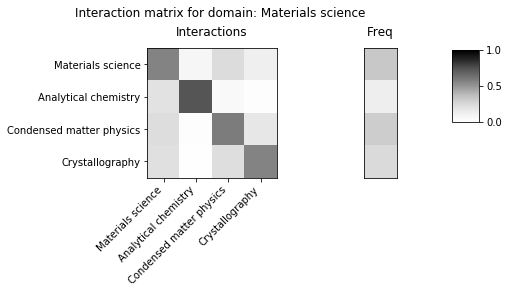

saving data in: ./WIKIdata/matrices2020/wikipedia_system_71.npz


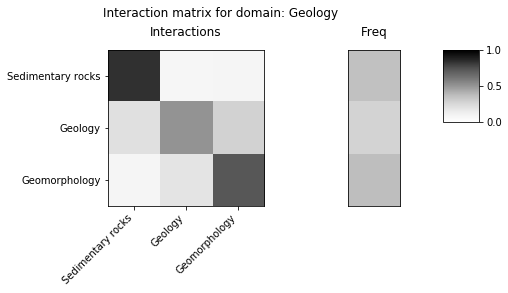

saving data in: ./WIKIdata/matrices2020/wikipedia_system_72.npz


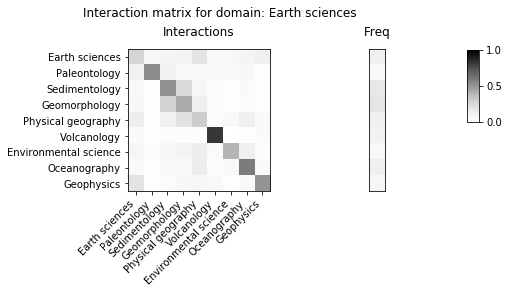

saving data in: ./WIKIdata/matrices2020/wikipedia_system_73.npz


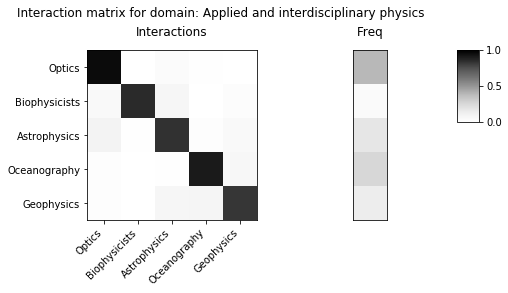

saving data in: ./WIKIdata/matrices2020/wikipedia_system_74.npz


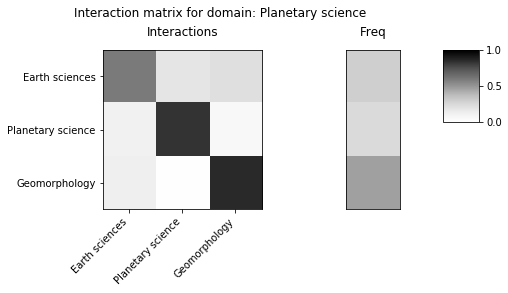

saving data in: ./WIKIdata/matrices2020/wikipedia_system_75.npz


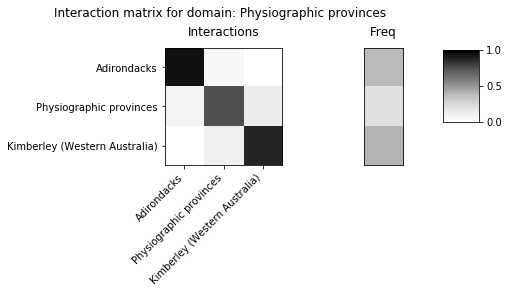

saving data in: ./WIKIdata/matrices2020/wikipedia_system_76.npz


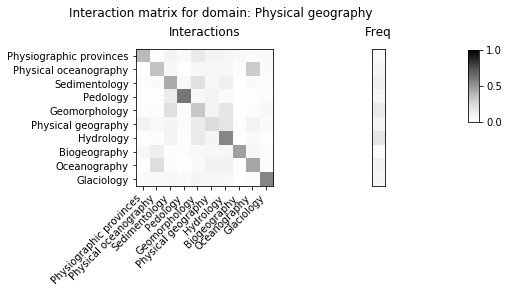

saving data in: ./WIKIdata/matrices2020/wikipedia_system_77.npz


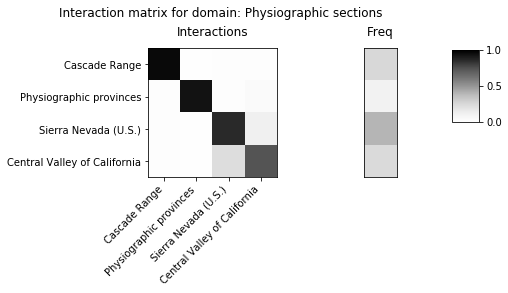

/Users/ruairidh/miniconda3/envs/blockmodels/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide


something wrong with building freq or int mat: interactionMatrix[0, :]        sum not 1: instead, [nan  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
saving data in: ./WIKIdata/matrices2020/wikipedia_system_78.npz


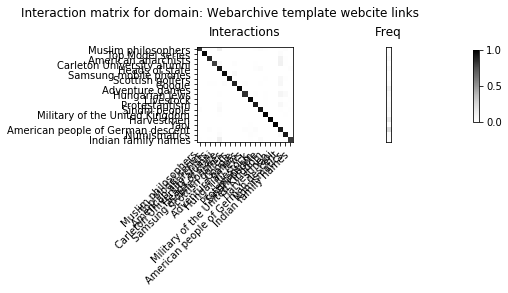

saving data in: ./WIKIdata/matrices2020/wikipedia_system_79.npz


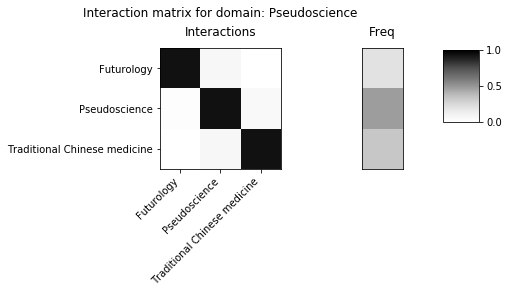

saving data in: ./WIKIdata/matrices2020/wikipedia_system_80.npz


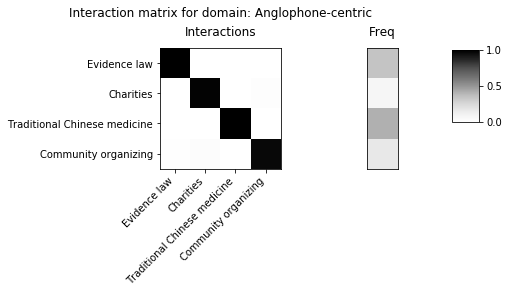

saving data in: ./WIKIdata/matrices2020/wikipedia_system_81.npz


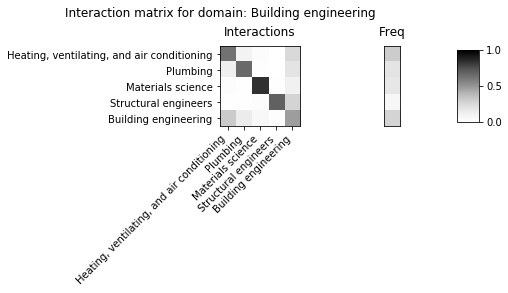

saving data in: ./WIKIdata/matrices2020/wikipedia_system_82.npz


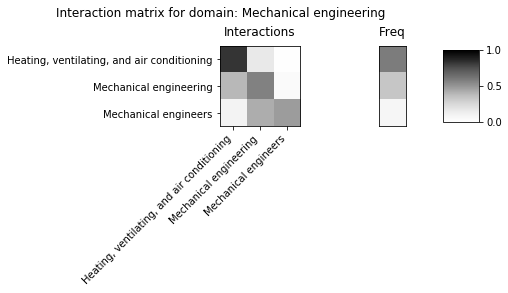

saving data in: ./WIKIdata/matrices2020/wikipedia_system_83.npz


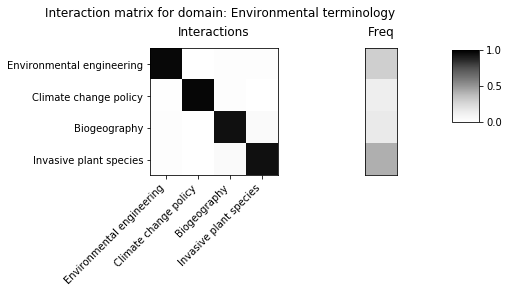

saving data in: ./WIKIdata/matrices2020/wikipedia_system_84.npz


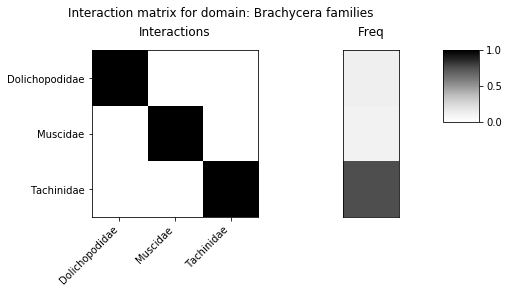

saving data in: ./WIKIdata/matrices2020/wikipedia_system_85.npz


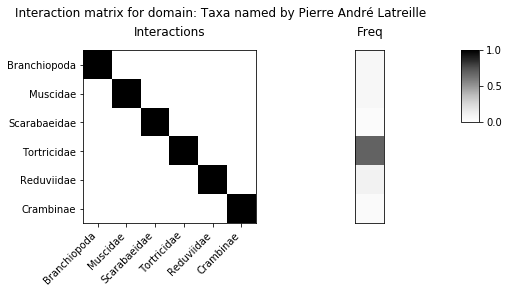

saving data in: ./WIKIdata/matrices2020/wikipedia_system_86.npz


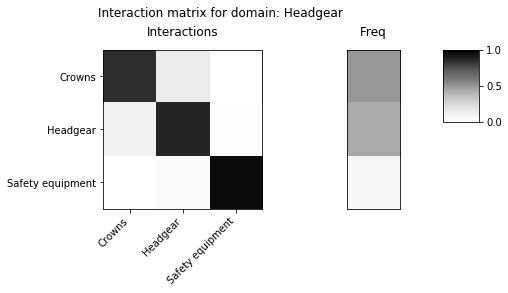

saving data in: ./WIKIdata/matrices2020/wikipedia_system_87.npz


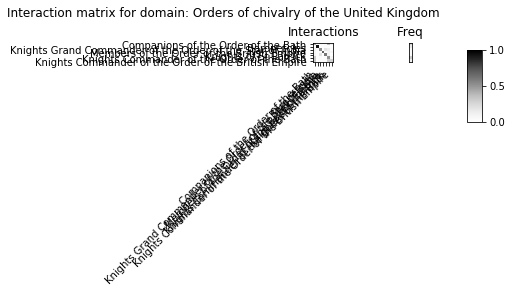

saving data in: ./WIKIdata/matrices2020/wikipedia_system_88.npz


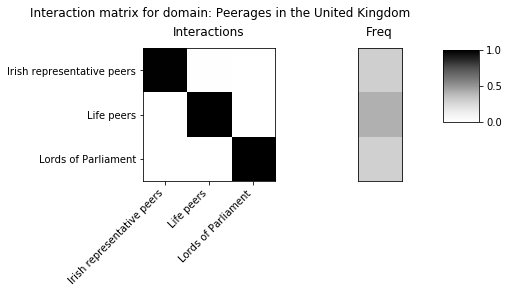

saving data in: ./WIKIdata/matrices2020/wikipedia_system_89.npz


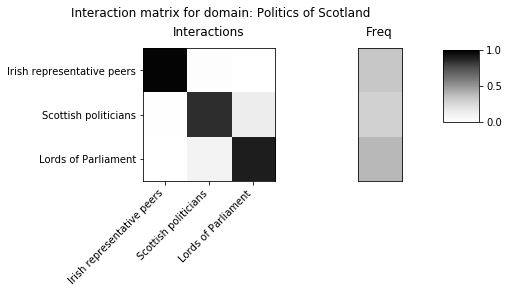

saving data in: ./WIKIdata/matrices2020/wikipedia_system_90.npz


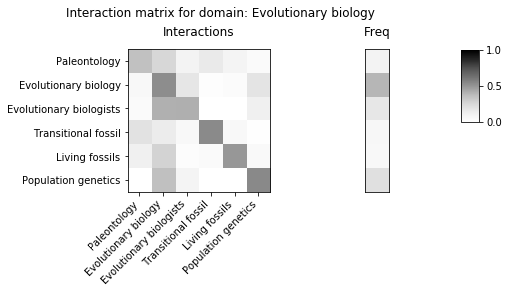

saving data in: ./WIKIdata/matrices2020/wikipedia_system_91.npz


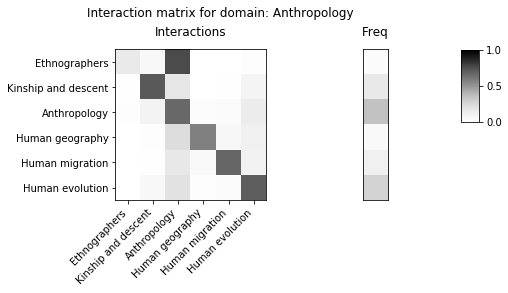

saving data in: ./WIKIdata/matrices2020/wikipedia_system_92.npz


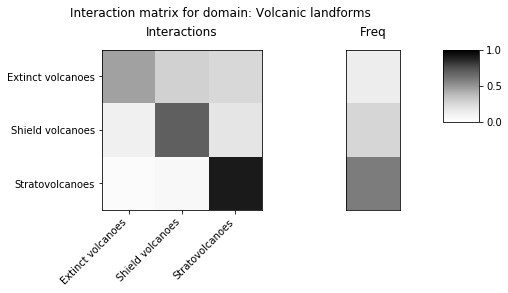

saving data in: ./WIKIdata/matrices2020/wikipedia_system_93.npz


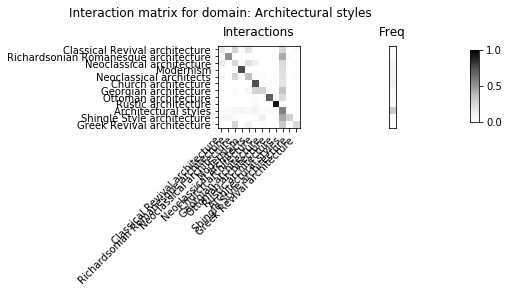

saving data in: ./WIKIdata/matrices2020/wikipedia_system_94.npz


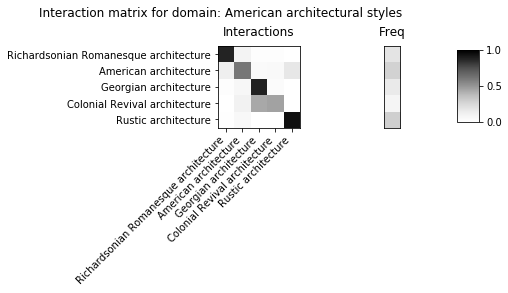

saving data in: ./WIKIdata/matrices2020/wikipedia_system_95.npz


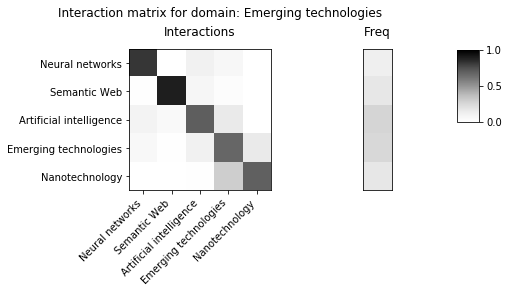

saving data in: ./WIKIdata/matrices2020/wikipedia_system_96.npz


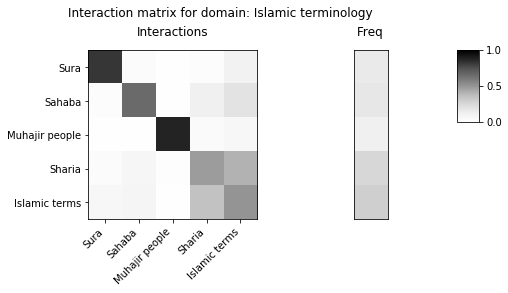

saving data in: ./WIKIdata/matrices2020/wikipedia_system_97.npz


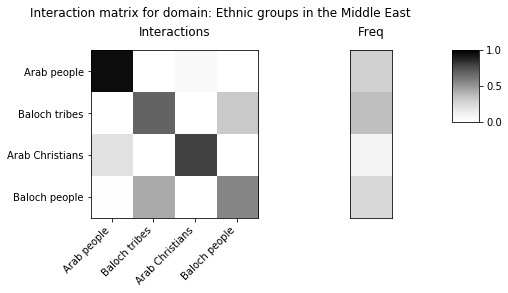

saving data in: ./WIKIdata/matrices2020/wikipedia_system_98.npz


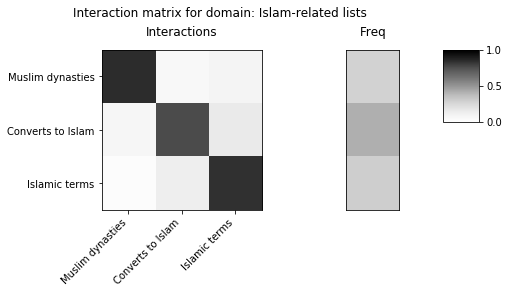

saving data in: ./WIKIdata/matrices2020/wikipedia_system_99.npz


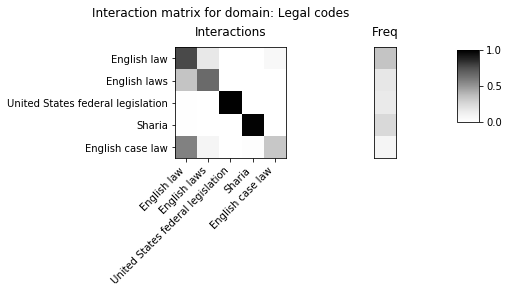

saving data in: ./WIKIdata/matrices2020/wikipedia_system_100.npz


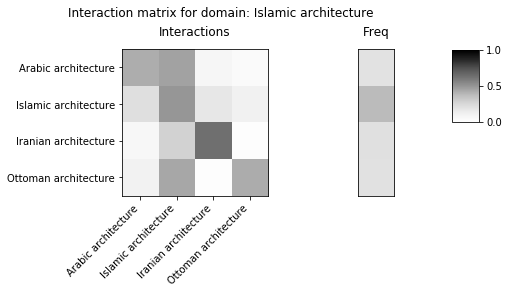

saving data in: ./WIKIdata/matrices2020/wikipedia_system_101.npz


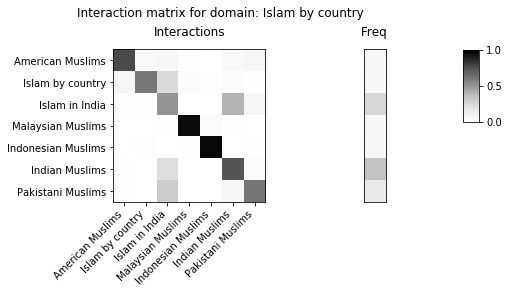

saving data in: ./WIKIdata/matrices2020/wikipedia_system_102.npz


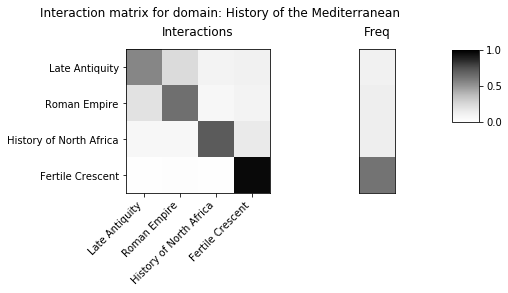

saving data in: ./WIKIdata/matrices2020/wikipedia_system_103.npz


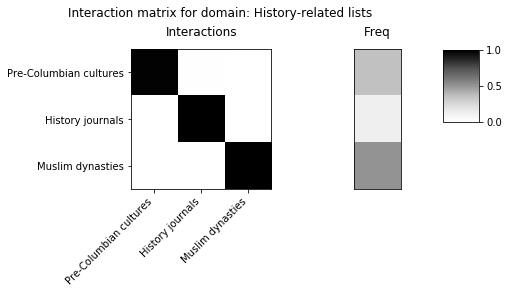

saving data in: ./WIKIdata/matrices2020/wikipedia_system_104.npz


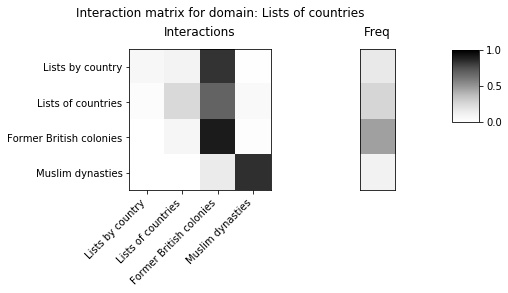

saving data in: ./WIKIdata/matrices2020/wikipedia_system_105.npz


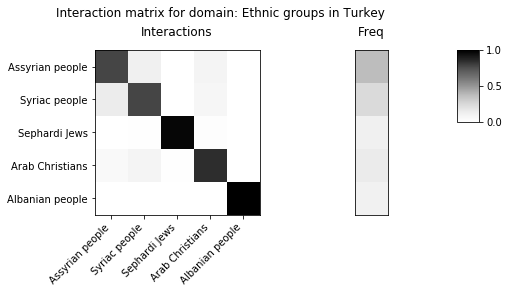

saving data in: ./WIKIdata/matrices2020/wikipedia_system_106.npz


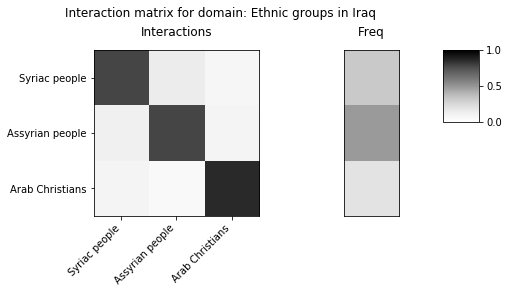

saving data in: ./WIKIdata/matrices2020/wikipedia_system_107.npz


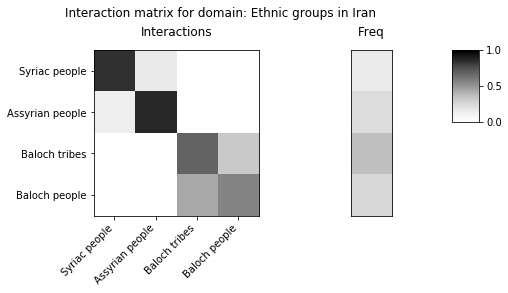

saving data in: ./WIKIdata/matrices2020/wikipedia_system_108.npz


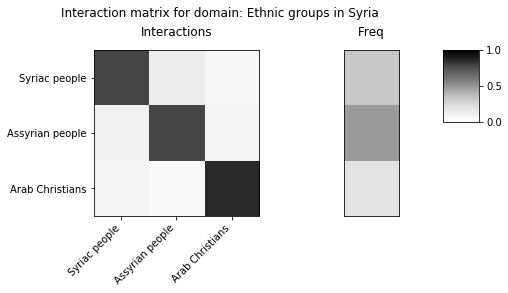

saving data in: ./WIKIdata/matrices2020/wikipedia_system_109.npz


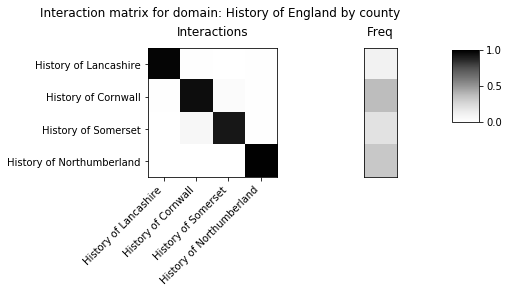

saving data in: ./WIKIdata/matrices2020/wikipedia_system_110.npz


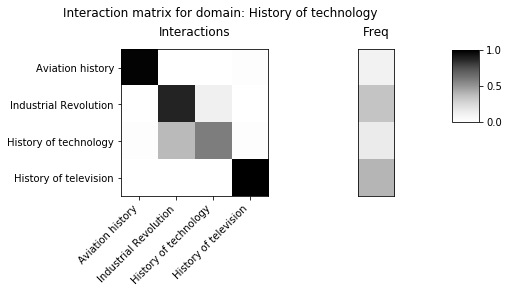

saving data in: ./WIKIdata/matrices2020/wikipedia_system_111.npz


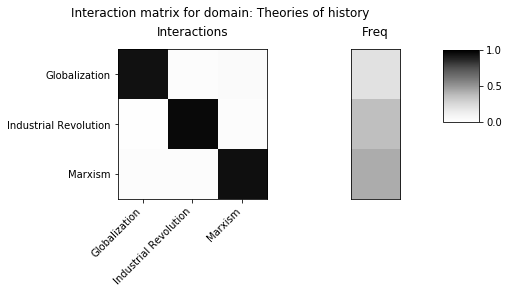

saving data in: ./WIKIdata/matrices2020/wikipedia_system_112.npz


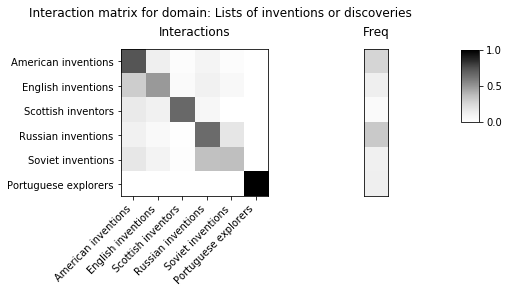

saving data in: ./WIKIdata/matrices2020/wikipedia_system_113.npz


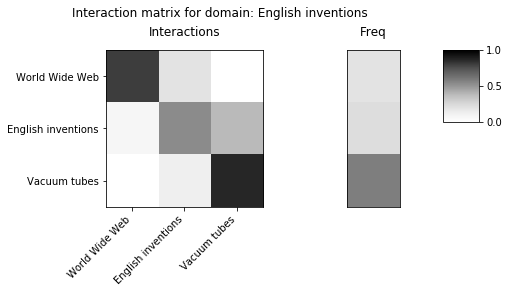

saving data in: ./WIKIdata/matrices2020/wikipedia_system_114.npz


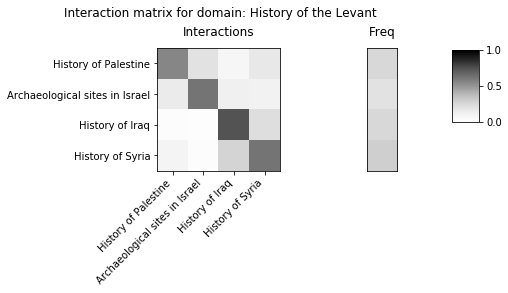

saving data in: ./WIKIdata/matrices2020/wikipedia_system_115.npz


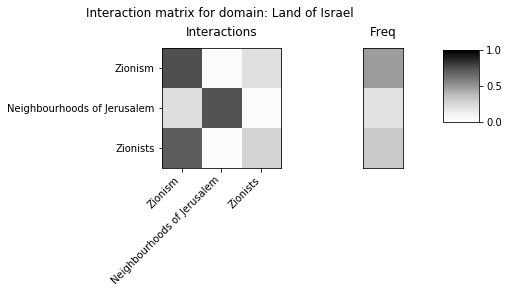

saving data in: ./WIKIdata/matrices2020/wikipedia_system_116.npz


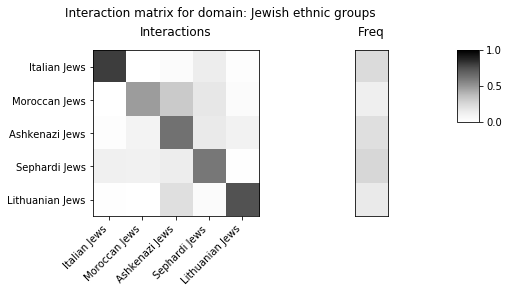

saving data in: ./WIKIdata/matrices2020/wikipedia_system_117.npz


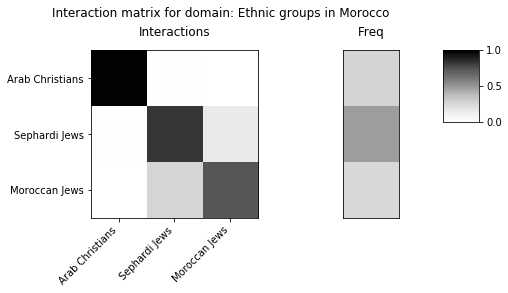

saving data in: ./WIKIdata/matrices2020/wikipedia_system_118.npz


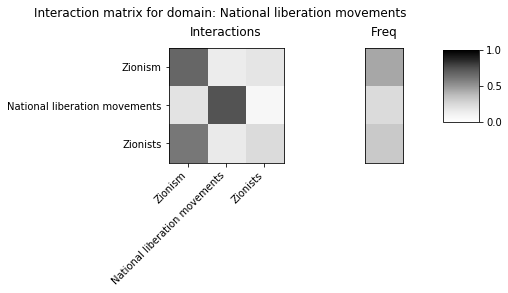

saving data in: ./WIKIdata/matrices2020/wikipedia_system_119.npz


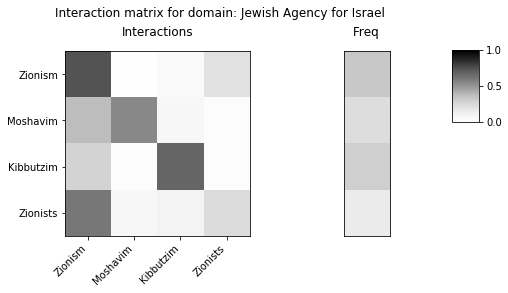

saving data in: ./WIKIdata/matrices2020/wikipedia_system_120.npz


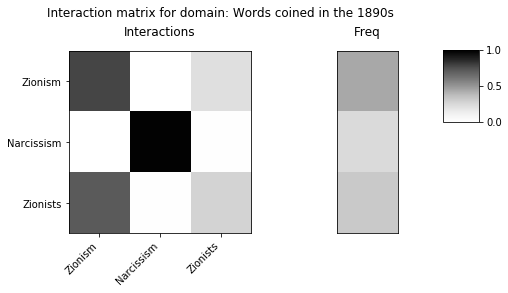

saving data in: ./WIKIdata/matrices2020/wikipedia_system_121.npz


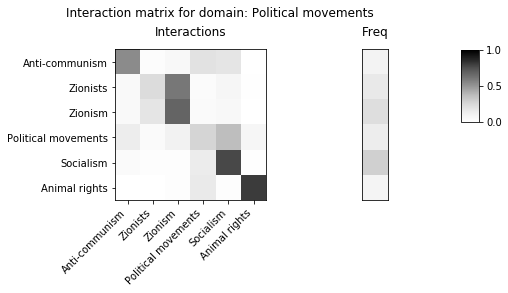

saving data in: ./WIKIdata/matrices2020/wikipedia_system_122.npz


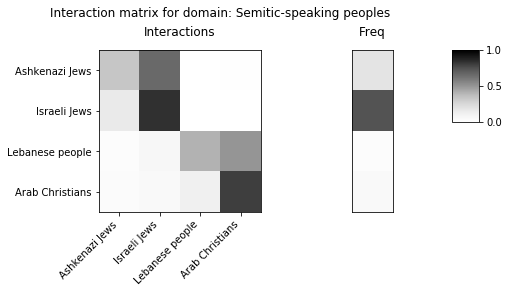

saving data in: ./WIKIdata/matrices2020/wikipedia_system_123.npz


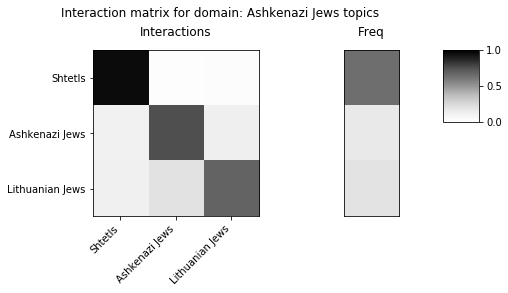

saving data in: ./WIKIdata/matrices2020/wikipedia_system_124.npz


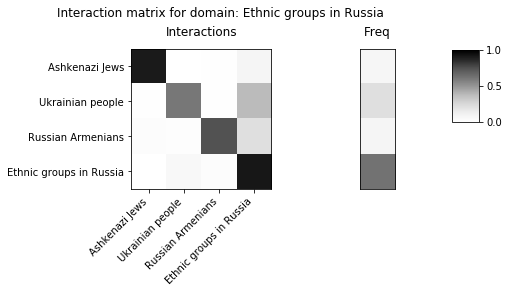

saving data in: ./WIKIdata/matrices2020/wikipedia_system_125.npz


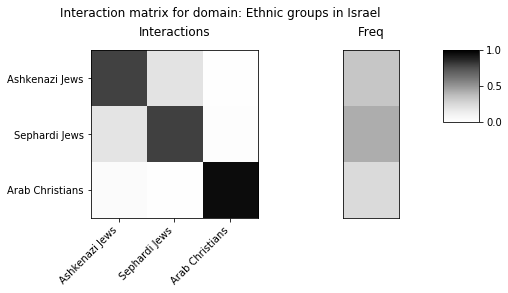

saving data in: ./WIKIdata/matrices2020/wikipedia_system_126.npz


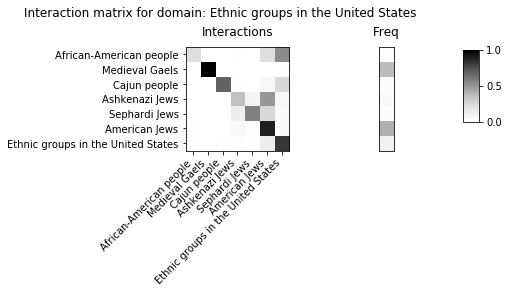

saving data in: ./WIKIdata/matrices2020/wikipedia_system_127.npz


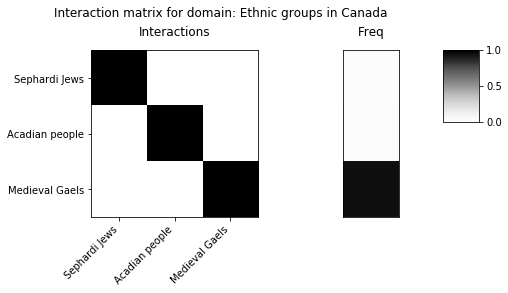

saving data in: ./WIKIdata/matrices2020/wikipedia_system_128.npz


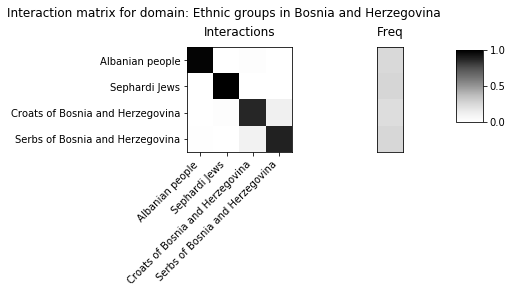

saving data in: ./WIKIdata/matrices2020/wikipedia_system_129.npz


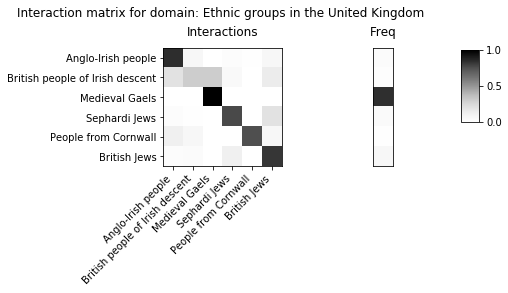

saving data in: ./WIKIdata/matrices2020/wikipedia_system_130.npz


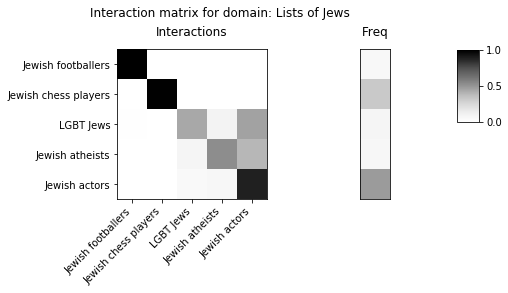

saving data in: ./WIKIdata/matrices2020/wikipedia_system_131.npz


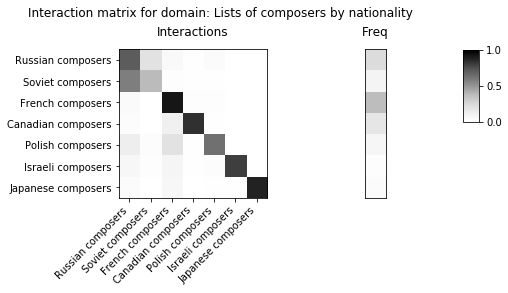

saving data in: ./WIKIdata/matrices2020/wikipedia_system_132.npz


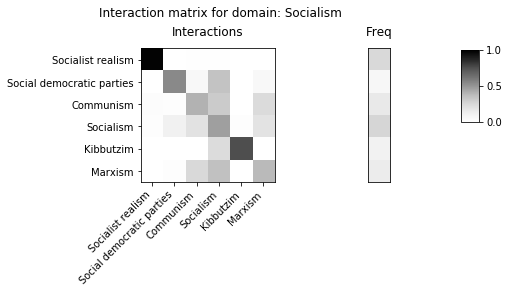

saving data in: ./WIKIdata/matrices2020/wikipedia_system_133.npz


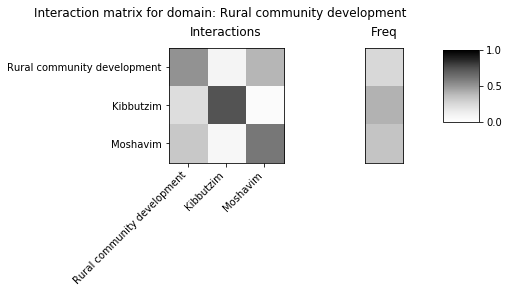

saving data in: ./WIKIdata/matrices2020/wikipedia_system_134.npz


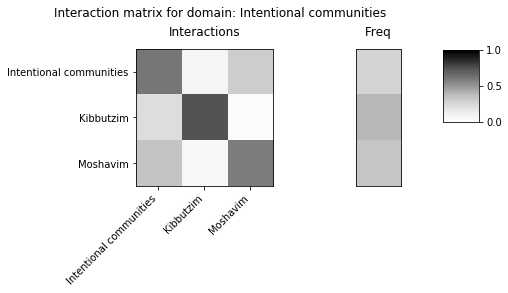

saving data in: ./WIKIdata/matrices2020/wikipedia_system_135.npz


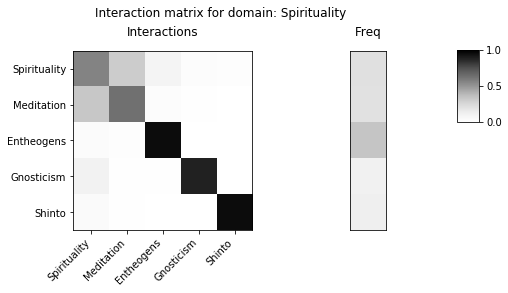

saving data in: ./WIKIdata/matrices2020/wikipedia_system_136.npz


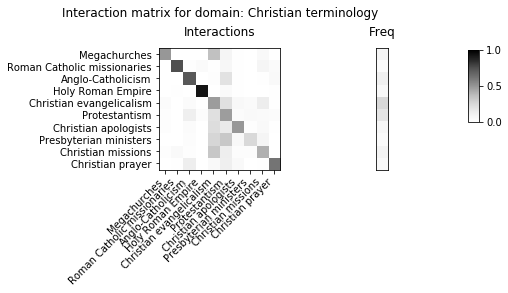

saving data in: ./WIKIdata/matrices2020/wikipedia_system_137.npz


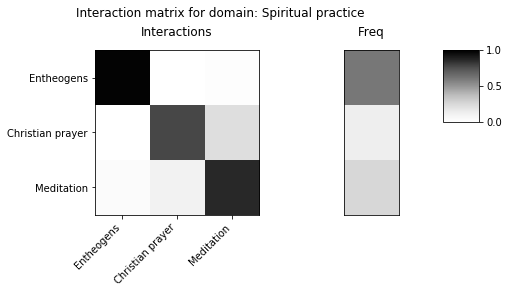

saving data in: ./WIKIdata/matrices2020/wikipedia_system_138.npz


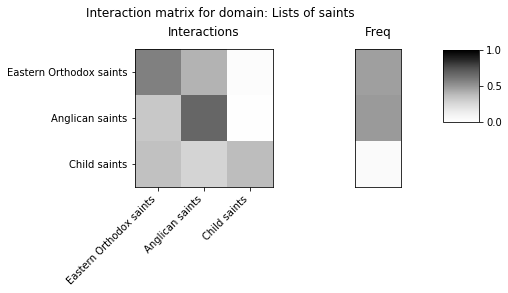

saving data in: ./WIKIdata/matrices2020/wikipedia_system_139.npz


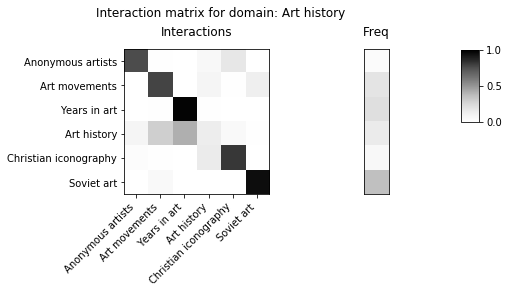

saving data in: ./WIKIdata/matrices2020/wikipedia_system_140.npz


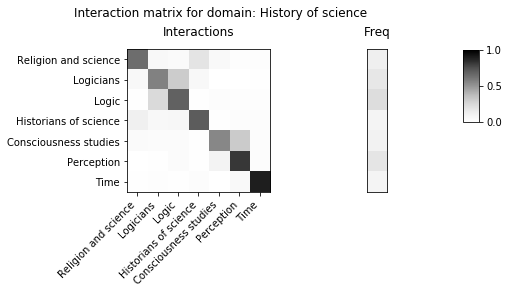

saving data in: ./WIKIdata/matrices2020/wikipedia_system_141.npz


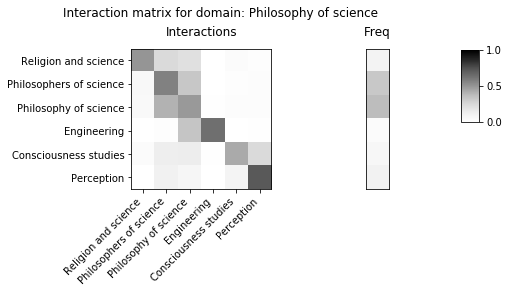

saving data in: ./WIKIdata/matrices2020/wikipedia_system_142.npz


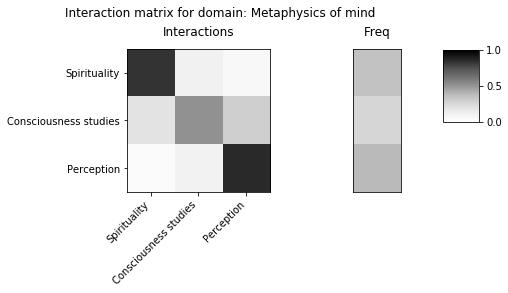

saving data in: ./WIKIdata/matrices2020/wikipedia_system_143.npz


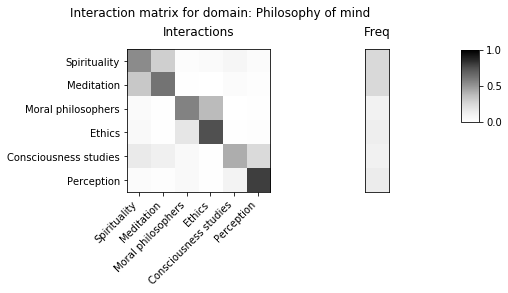

saving data in: ./WIKIdata/matrices2020/wikipedia_system_144.npz


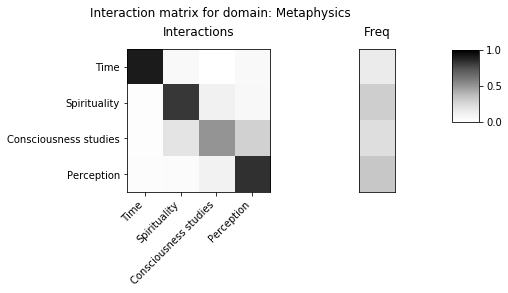

saving data in: ./WIKIdata/matrices2020/wikipedia_system_145.npz


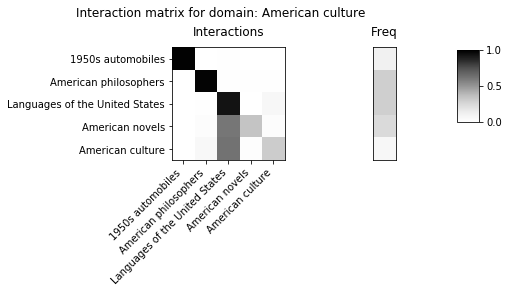

saving data in: ./WIKIdata/matrices2020/wikipedia_system_146.npz


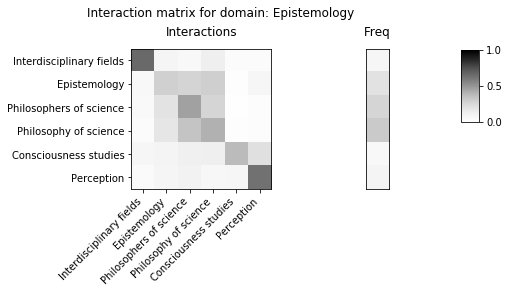

saving data in: ./WIKIdata/matrices2020/wikipedia_system_147.npz


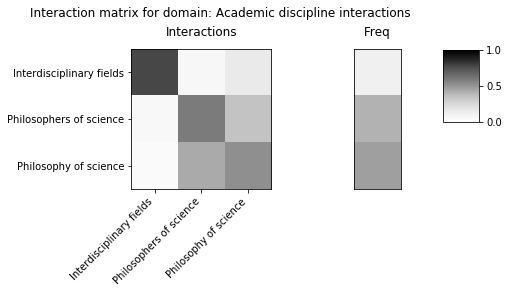

saving data in: ./WIKIdata/matrices2020/wikipedia_system_148.npz


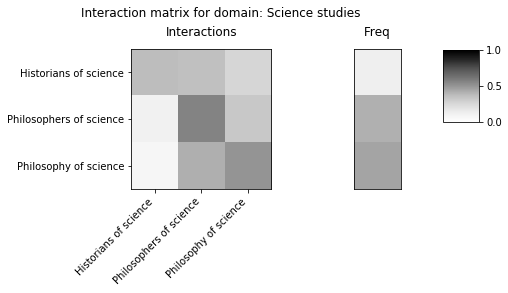

saving data in: ./WIKIdata/matrices2020/wikipedia_system_149.npz


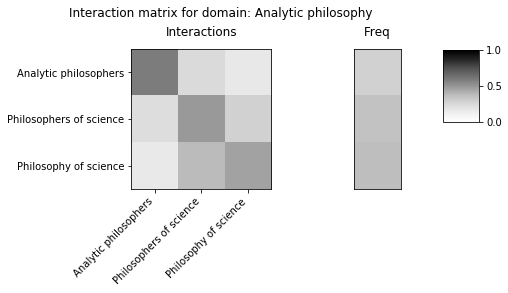

saving data in: ./WIKIdata/matrices2020/wikipedia_system_150.npz


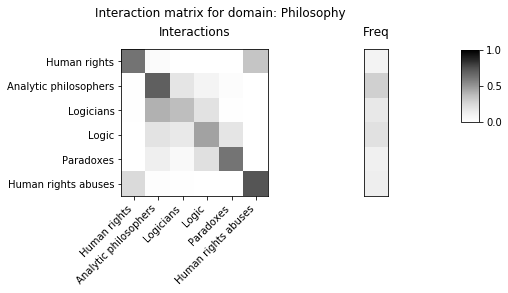

saving data in: ./WIKIdata/matrices2020/wikipedia_system_151.npz


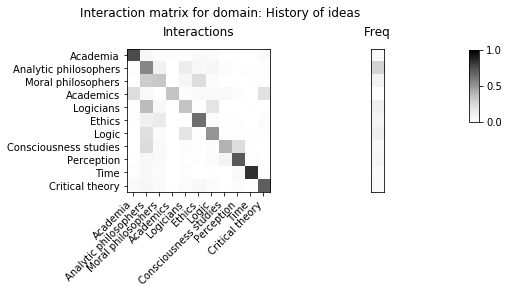

saving data in: ./WIKIdata/matrices2020/wikipedia_system_152.npz


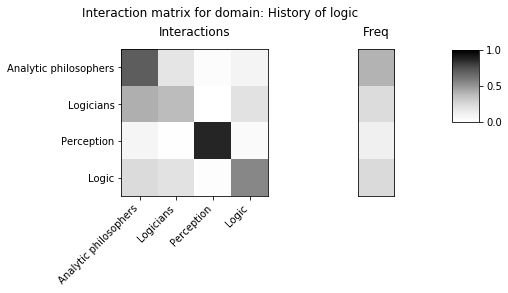

saving data in: ./WIKIdata/matrices2020/wikipedia_system_153.npz


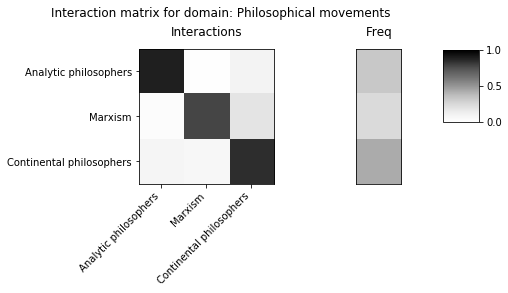

saving data in: ./WIKIdata/matrices2020/wikipedia_system_154.npz


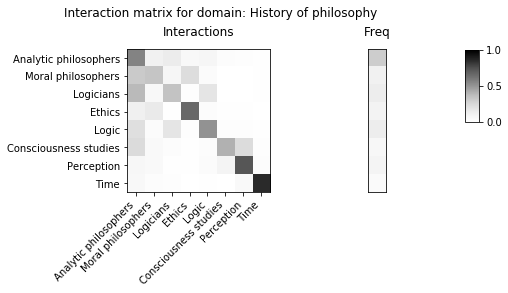

saving data in: ./WIKIdata/matrices2020/wikipedia_system_155.npz


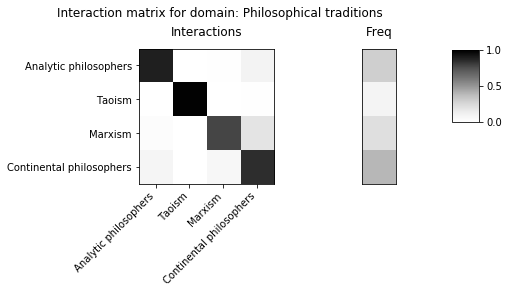

saving data in: ./WIKIdata/matrices2020/wikipedia_system_156.npz


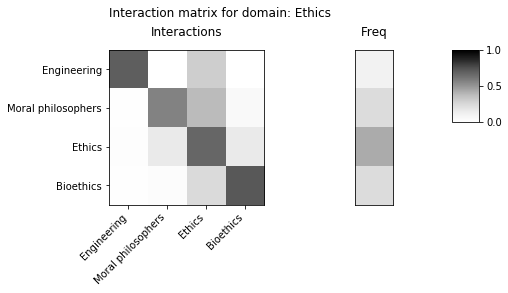

saving data in: ./WIKIdata/matrices2020/wikipedia_system_157.npz


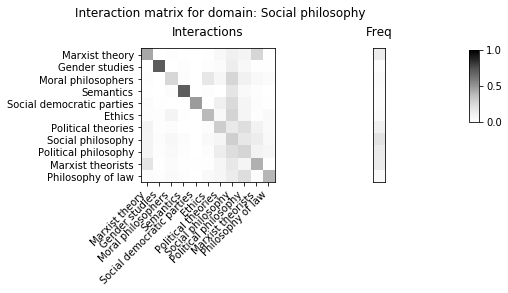

saving data in: ./WIKIdata/matrices2020/wikipedia_system_158.npz


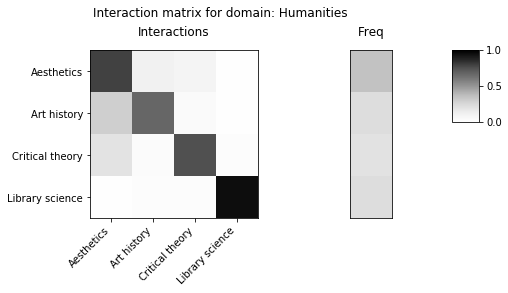

saving data in: ./WIKIdata/matrices2020/wikipedia_system_159.npz


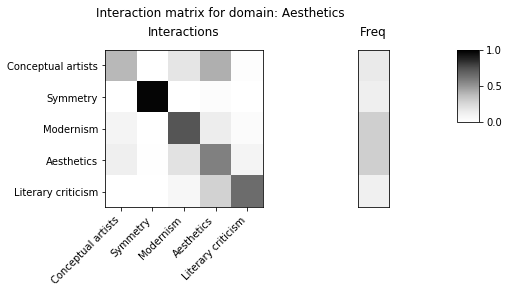

saving data in: ./WIKIdata/matrices2020/wikipedia_system_160.npz


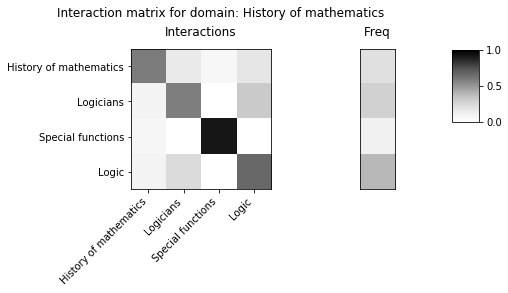

saving data in: ./WIKIdata/matrices2020/wikipedia_system_161.npz


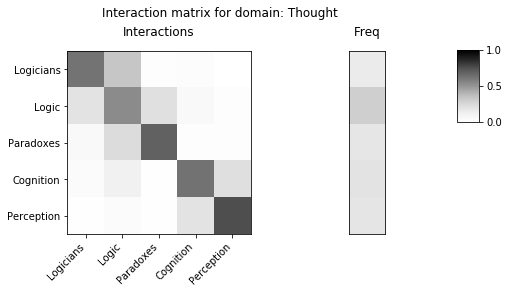

saving data in: ./WIKIdata/matrices2020/wikipedia_system_162.npz


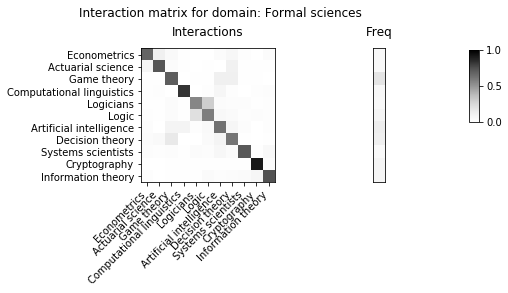

saving data in: ./WIKIdata/matrices2020/wikipedia_system_163.npz


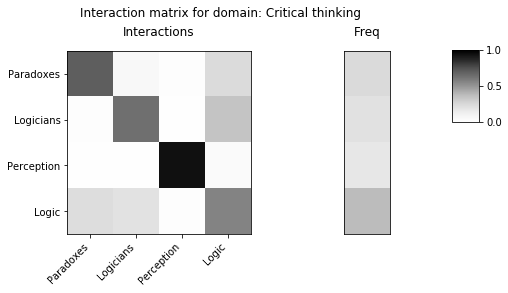

saving data in: ./WIKIdata/matrices2020/wikipedia_system_164.npz


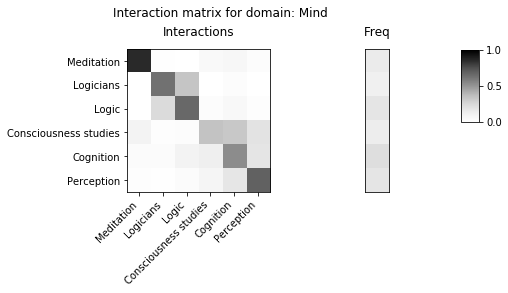

saving data in: ./WIKIdata/matrices2020/wikipedia_system_165.npz


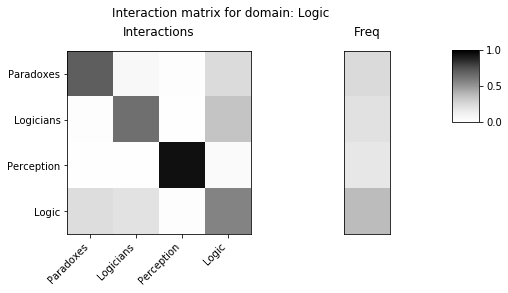

saving data in: ./WIKIdata/matrices2020/wikipedia_system_166.npz


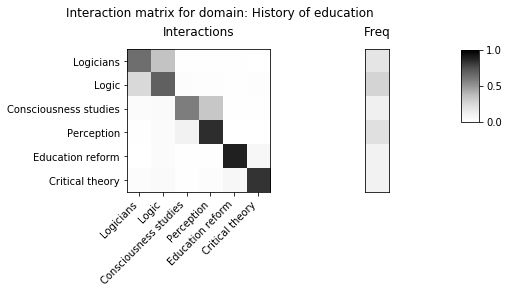

saving data in: ./WIKIdata/matrices2020/wikipedia_system_167.npz


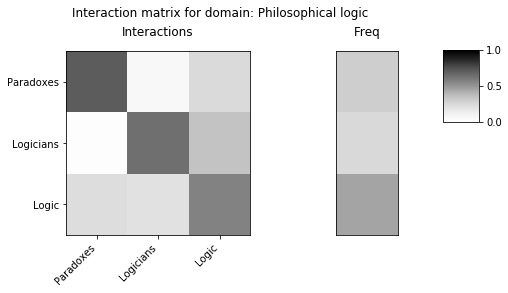

saving data in: ./WIKIdata/matrices2020/wikipedia_system_168.npz


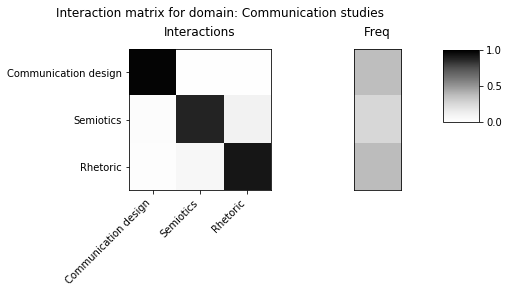

saving data in: ./WIKIdata/matrices2020/wikipedia_system_169.npz


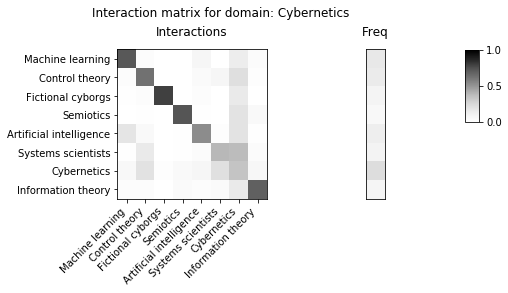

saving data in: ./WIKIdata/matrices2020/wikipedia_system_170.npz


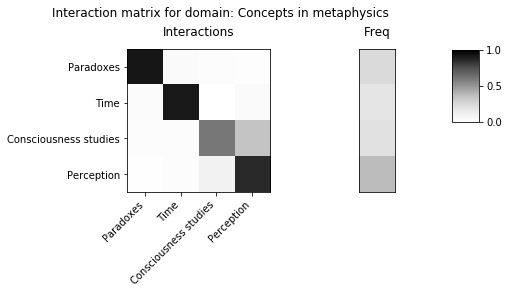

saving data in: ./WIKIdata/matrices2020/wikipedia_system_171.npz


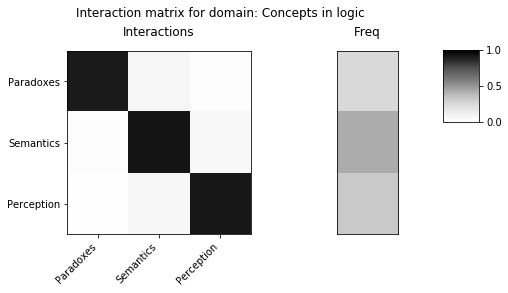

saving data in: ./WIKIdata/matrices2020/wikipedia_system_172.npz


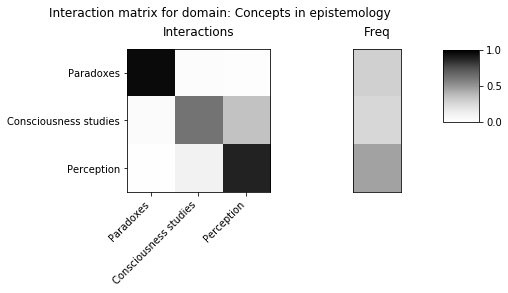

saving data in: ./WIKIdata/matrices2020/wikipedia_system_173.npz


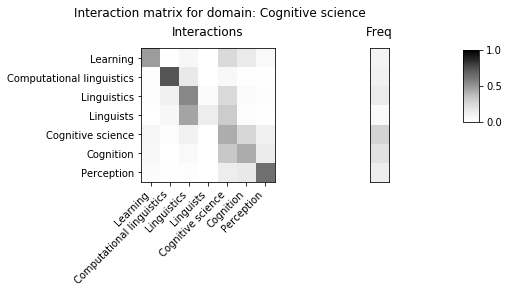

saving data in: ./WIKIdata/matrices2020/wikipedia_system_174.npz


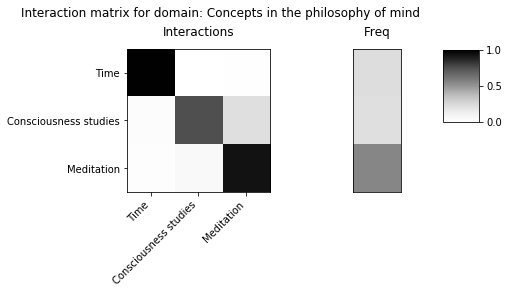

saving data in: ./WIKIdata/matrices2020/wikipedia_system_175.npz


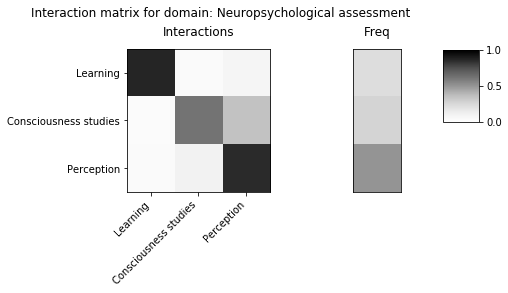

saving data in: ./WIKIdata/matrices2020/wikipedia_system_176.npz


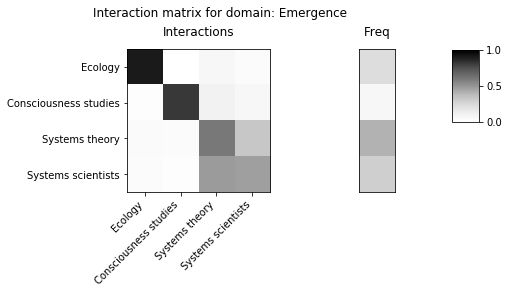

saving data in: ./WIKIdata/matrices2020/wikipedia_system_177.npz


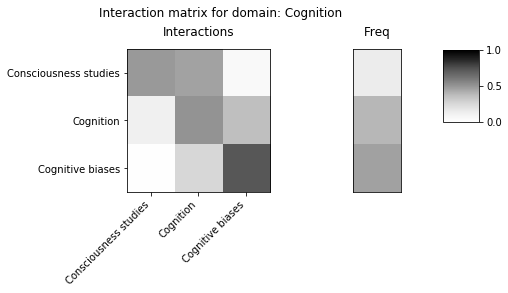

saving data in: ./WIKIdata/matrices2020/wikipedia_system_178.npz


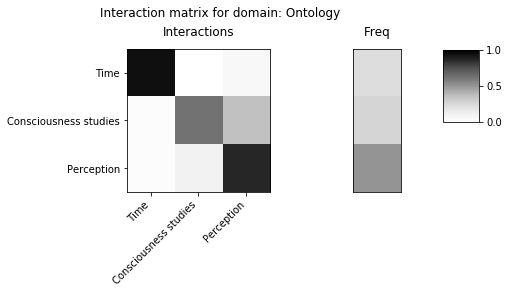

saving data in: ./WIKIdata/matrices2020/wikipedia_system_179.npz


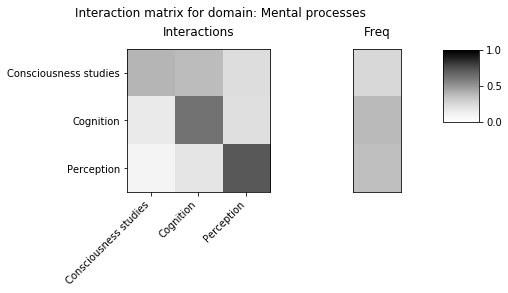

saving data in: ./WIKIdata/matrices2020/wikipedia_system_180.npz


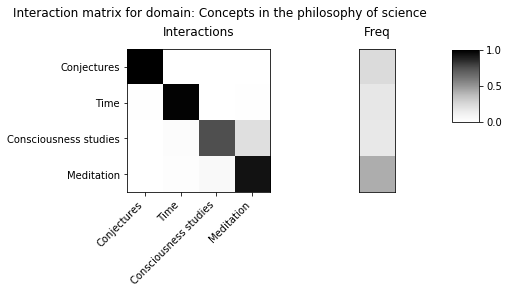

saving data in: ./WIKIdata/matrices2020/wikipedia_system_181.npz


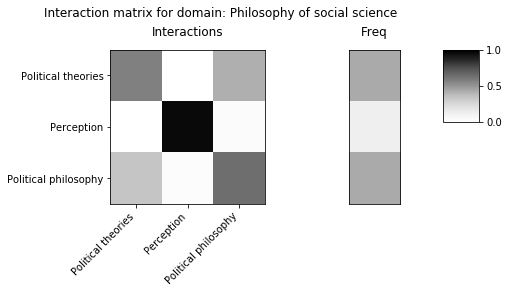

saving data in: ./WIKIdata/matrices2020/wikipedia_system_182.npz


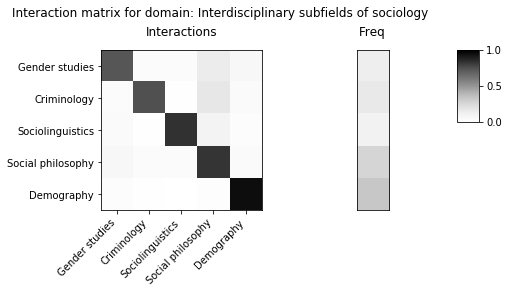

saving data in: ./WIKIdata/matrices2020/wikipedia_system_183.npz


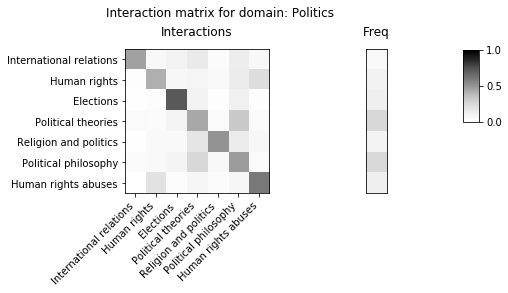

saving data in: ./WIKIdata/matrices2020/wikipedia_system_184.npz


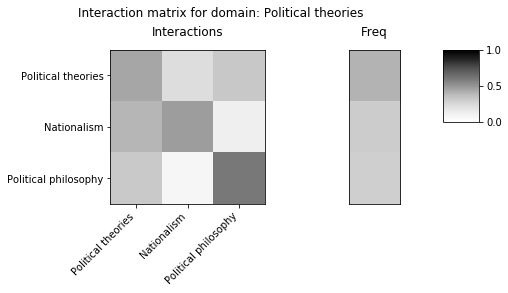

saving data in: ./WIKIdata/matrices2020/wikipedia_system_185.npz


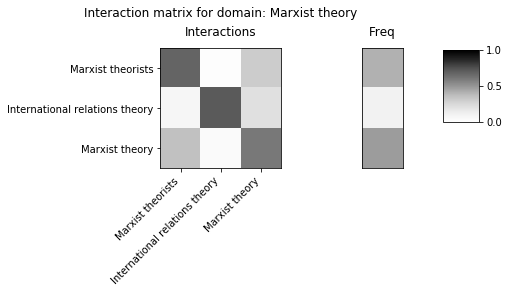

saving data in: ./WIKIdata/matrices2020/wikipedia_system_186.npz


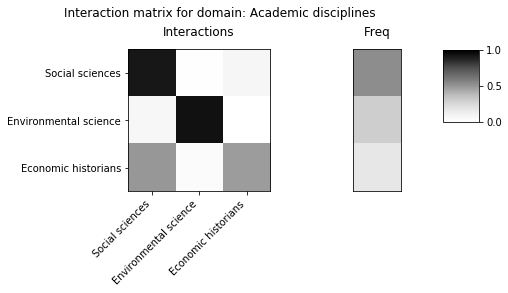

saving data in: ./WIKIdata/matrices2020/wikipedia_system_187.npz


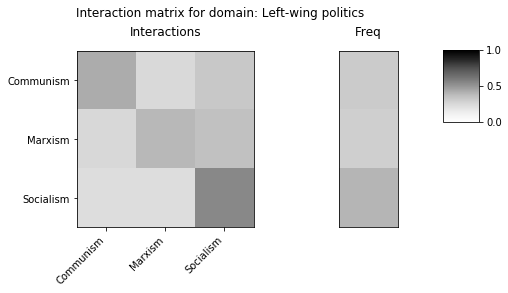

saving data in: ./WIKIdata/matrices2020/wikipedia_system_188.npz


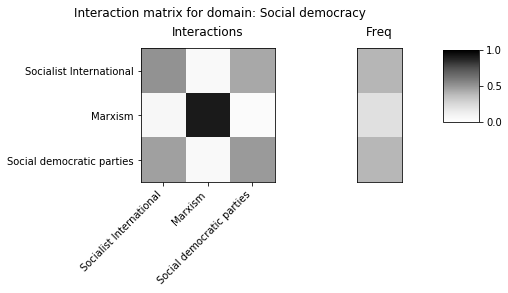

saving data in: ./WIKIdata/matrices2020/wikipedia_system_189.npz


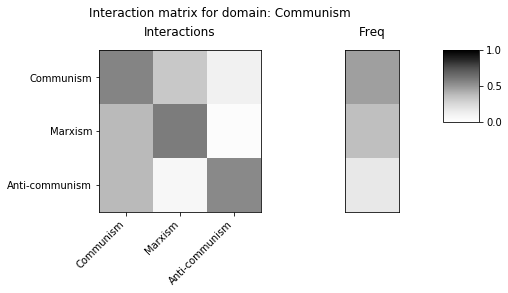

saving data in: ./WIKIdata/matrices2020/wikipedia_system_190.npz


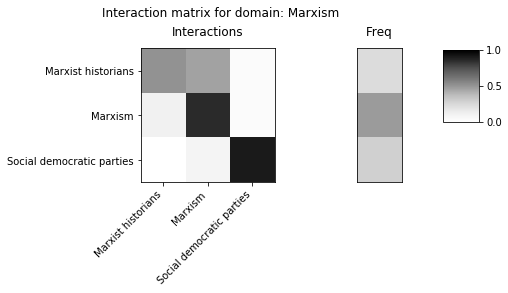

saving data in: ./WIKIdata/matrices2020/wikipedia_system_191.npz


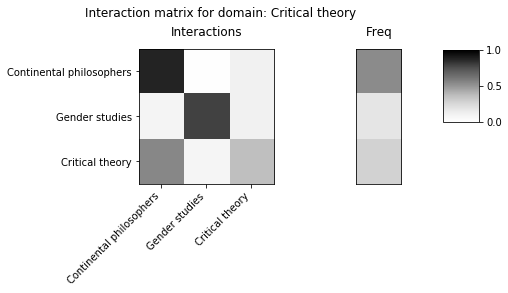

saving data in: ./WIKIdata/matrices2020/wikipedia_system_192.npz


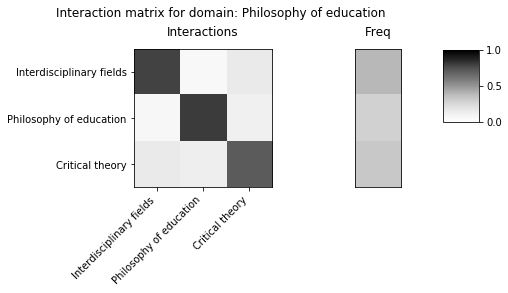

saving data in: ./WIKIdata/matrices2020/wikipedia_system_193.npz


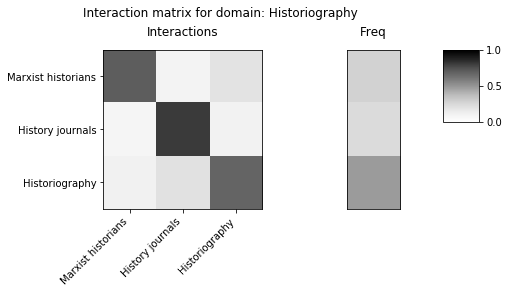

saving data in: ./WIKIdata/matrices2020/wikipedia_system_194.npz


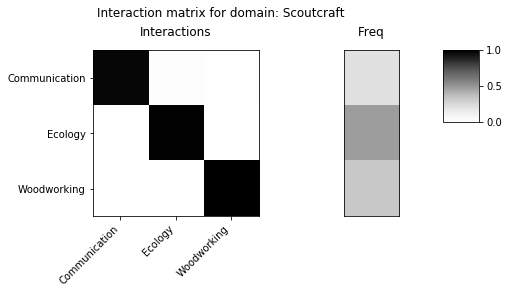

saving data in: ./WIKIdata/matrices2020/wikipedia_system_195.npz


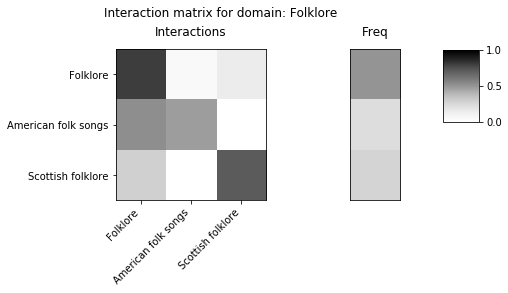

saving data in: ./WIKIdata/matrices2020/wikipedia_system_196.npz


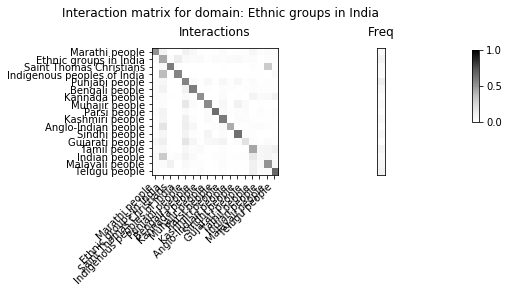

saving data in: ./WIKIdata/matrices2020/wikipedia_system_197.npz


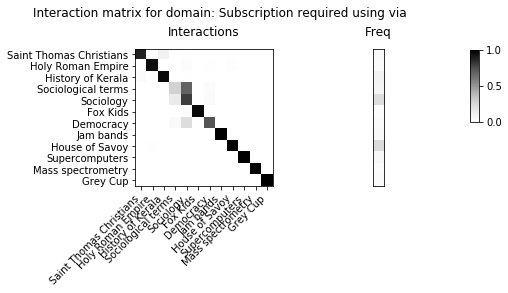

saving data in: ./WIKIdata/matrices2020/wikipedia_system_198.npz


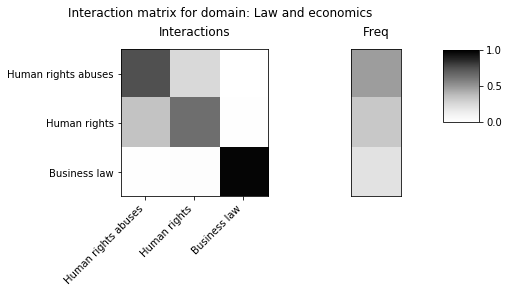

saving data in: ./WIKIdata/matrices2020/wikipedia_system_199.npz


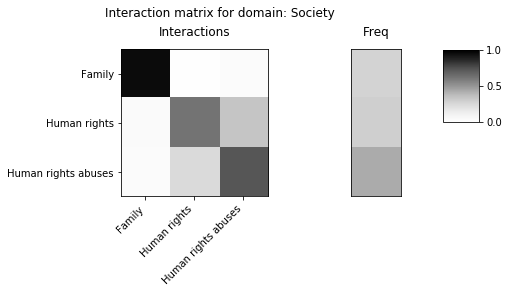

saving data in: ./WIKIdata/matrices2020/wikipedia_system_200.npz


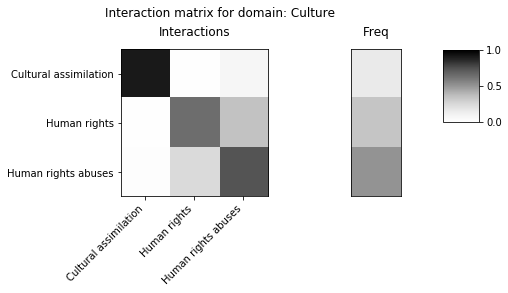

saving data in: ./WIKIdata/matrices2020/wikipedia_system_201.npz


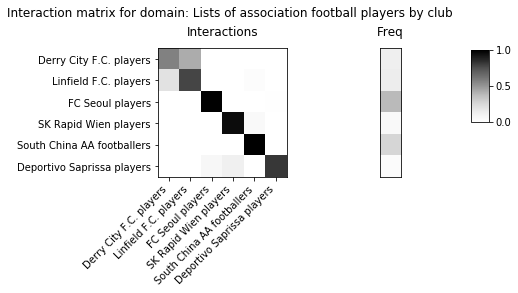

saving data in: ./WIKIdata/matrices2020/wikipedia_system_202.npz


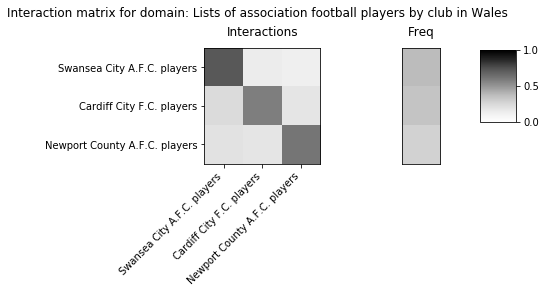

saving data in: ./WIKIdata/matrices2020/wikipedia_system_203.npz


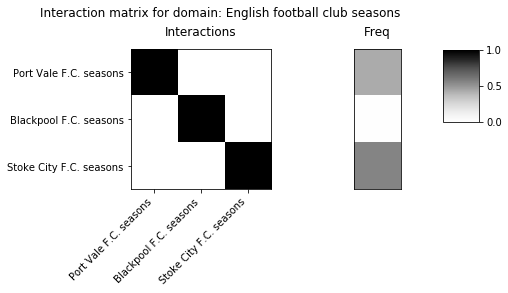

saving data in: ./WIKIdata/matrices2020/wikipedia_system_204.npz


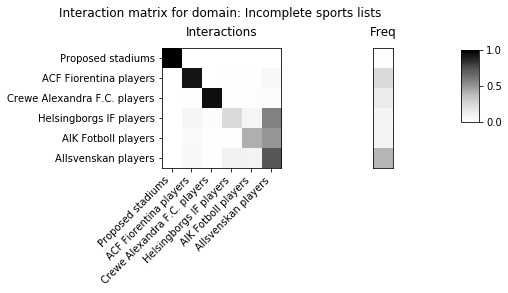

saving data in: ./WIKIdata/matrices2020/wikipedia_system_205.npz


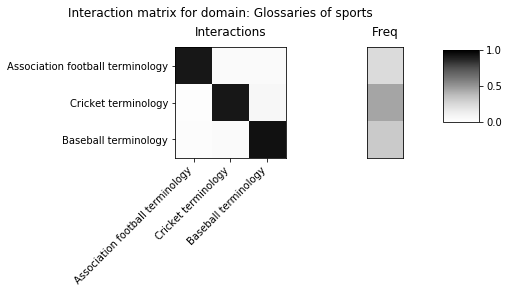

saving data in: ./WIKIdata/matrices2020/wikipedia_system_206.npz


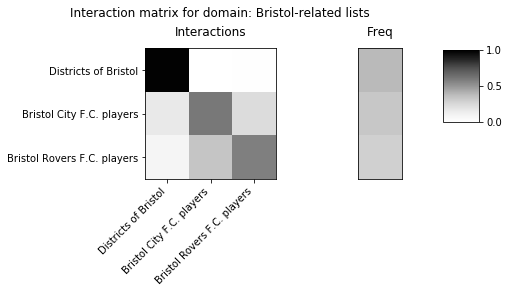

saving data in: ./WIKIdata/matrices2020/wikipedia_system_207.npz


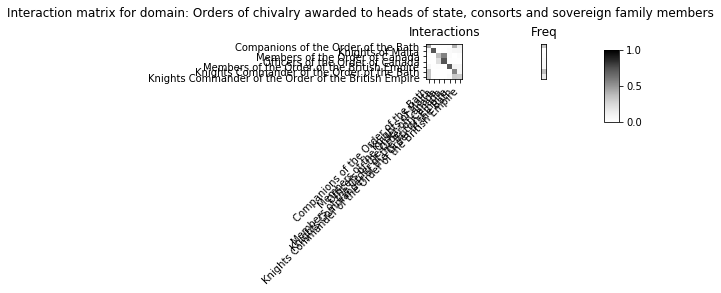

saving data in: ./WIKIdata/matrices2020/wikipedia_system_208.npz


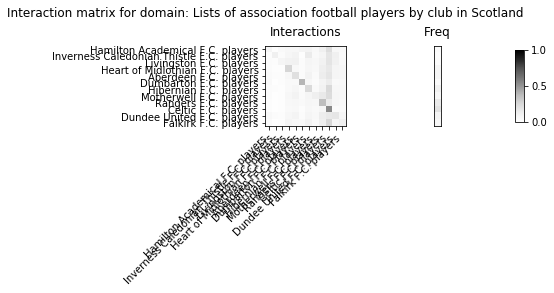

saving data in: ./WIKIdata/matrices2020/wikipedia_system_209.npz


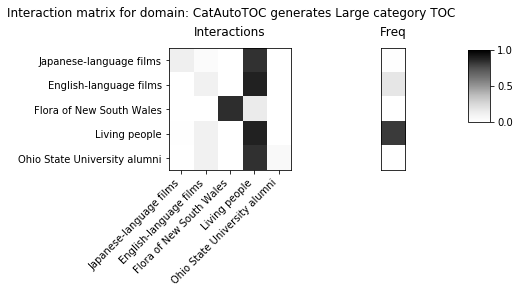

saving data in: ./WIKIdata/matrices2020/wikipedia_system_210.npz


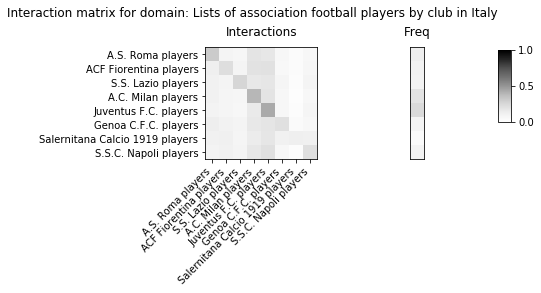

saving data in: ./WIKIdata/matrices2020/wikipedia_system_211.npz


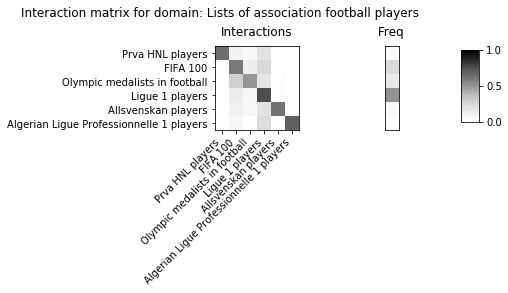

saving data in: ./WIKIdata/matrices2020/wikipedia_system_212.npz


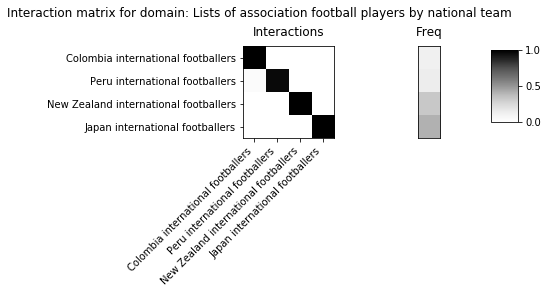

saving data in: ./WIKIdata/matrices2020/wikipedia_system_213.npz


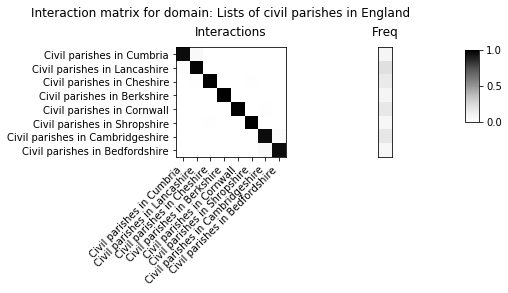

saving data in: ./WIKIdata/matrices2020/wikipedia_system_214.npz


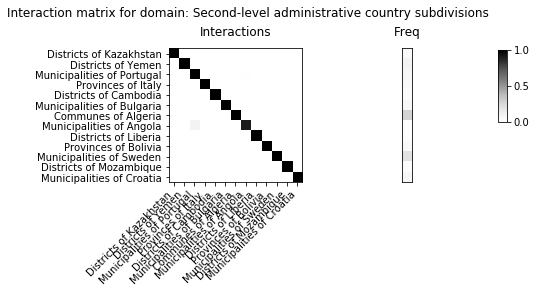

saving data in: ./WIKIdata/matrices2020/wikipedia_system_215.npz


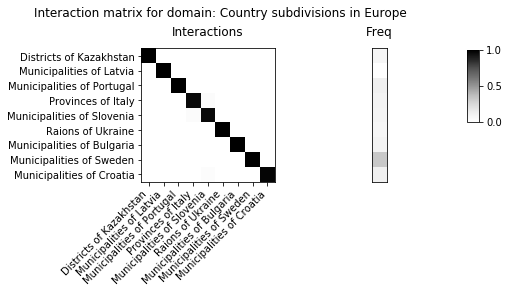

saving data in: ./WIKIdata/matrices2020/wikipedia_system_216.npz


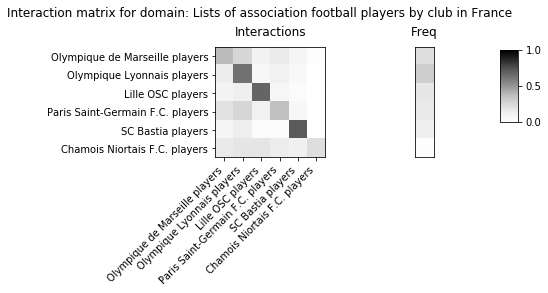

saving data in: ./WIKIdata/matrices2020/wikipedia_system_217.npz


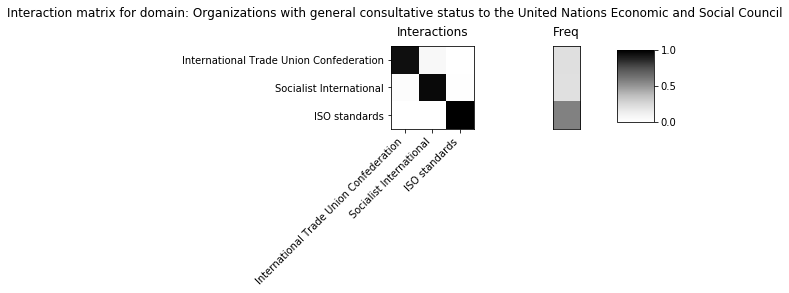

saving data in: ./WIKIdata/matrices2020/wikipedia_system_218.npz


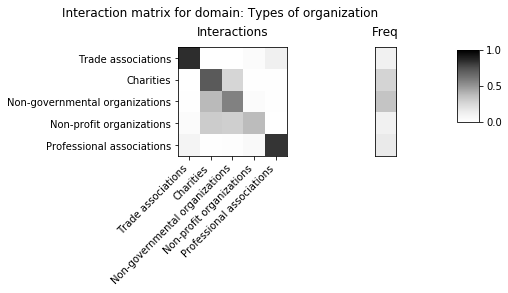

saving data in: ./WIKIdata/matrices2020/wikipedia_system_219.npz


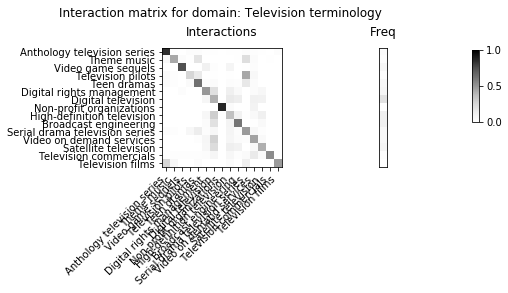

saving data in: ./WIKIdata/matrices2020/wikipedia_system_220.npz


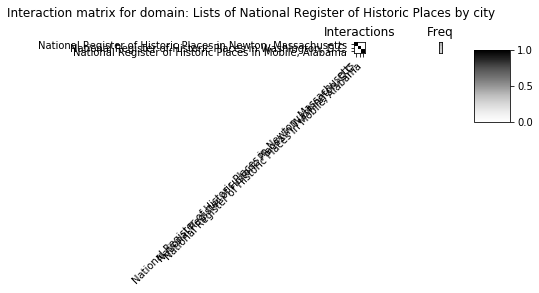

saving data in: ./WIKIdata/matrices2020/wikipedia_system_221.npz


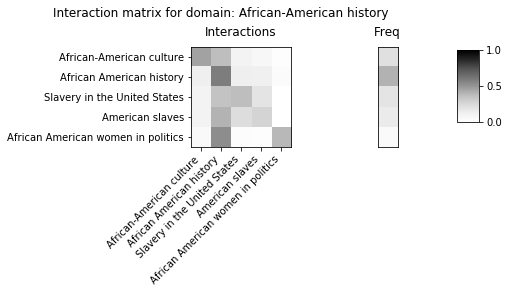

saving data in: ./WIKIdata/matrices2020/wikipedia_system_222.npz


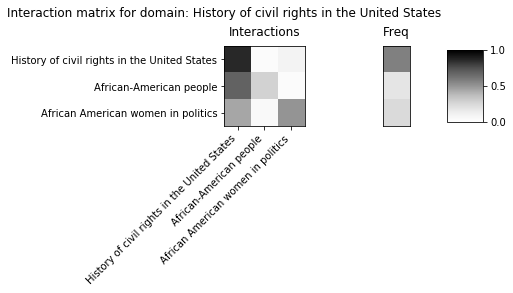

saving data in: ./WIKIdata/matrices2020/wikipedia_system_223.npz


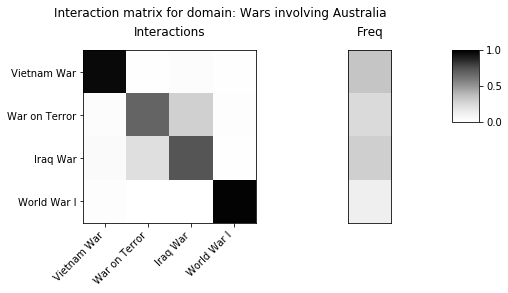

saving data in: ./WIKIdata/matrices2020/wikipedia_system_224.npz


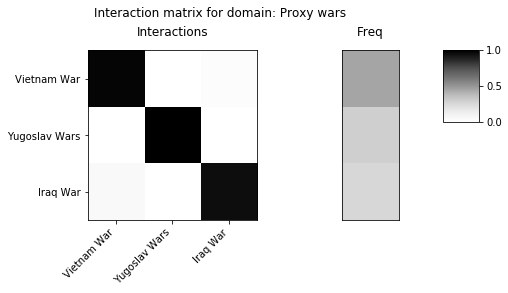

saving data in: ./WIKIdata/matrices2020/wikipedia_system_225.npz


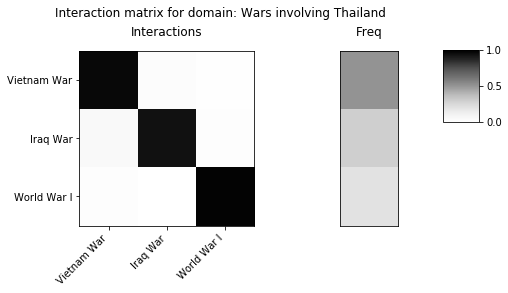

saving data in: ./WIKIdata/matrices2020/wikipedia_system_226.npz


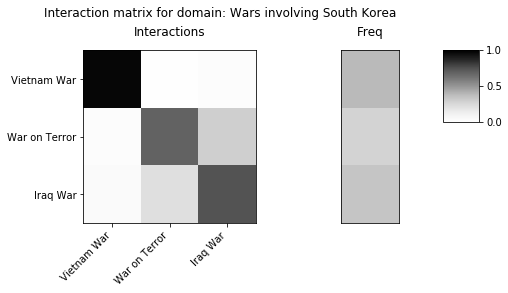

saving data in: ./WIKIdata/matrices2020/wikipedia_system_227.npz


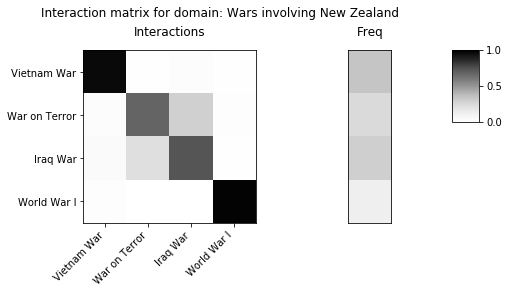

saving data in: ./WIKIdata/matrices2020/wikipedia_system_228.npz


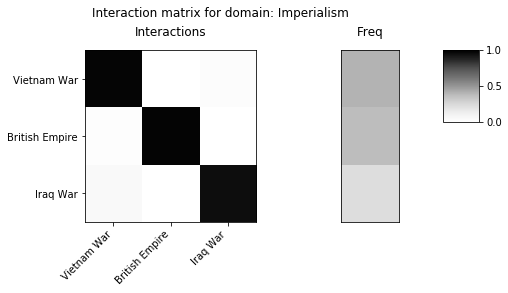

saving data in: ./WIKIdata/matrices2020/wikipedia_system_229.npz


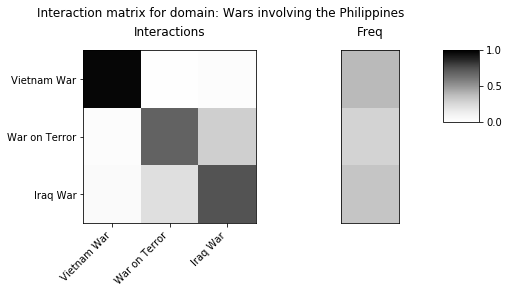

saving data in: ./WIKIdata/matrices2020/wikipedia_system_230.npz


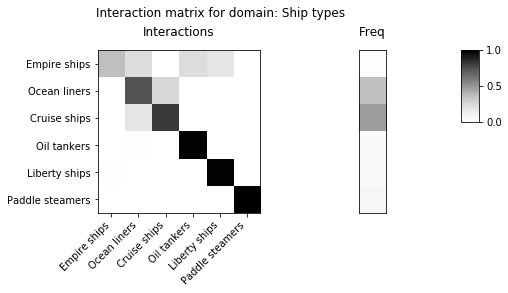

saving data in: ./WIKIdata/matrices2020/wikipedia_system_231.npz


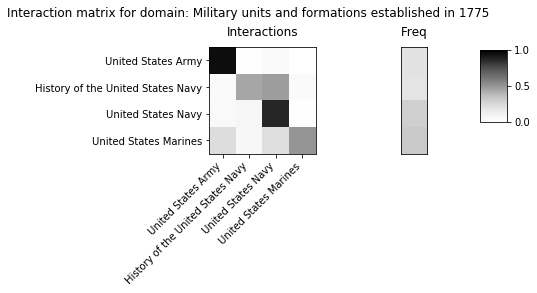

saving data in: ./WIKIdata/matrices2020/wikipedia_system_232.npz


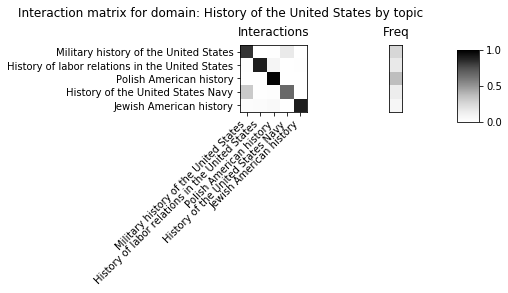

saving data in: ./WIKIdata/matrices2020/wikipedia_system_233.npz


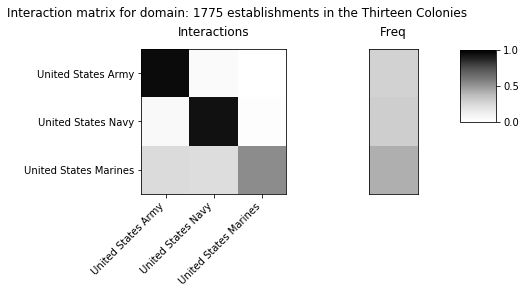

saving data in: ./WIKIdata/matrices2020/wikipedia_system_234.npz


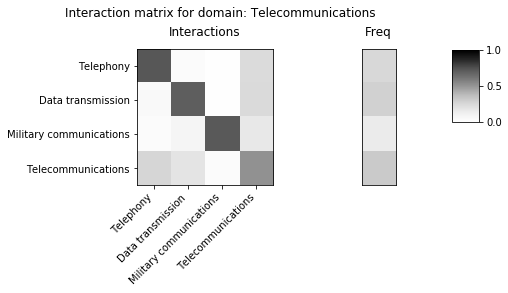

saving data in: ./WIKIdata/matrices2020/wikipedia_system_235.npz


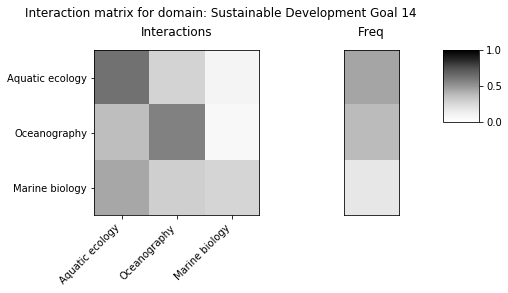

saving data in: ./WIKIdata/matrices2020/wikipedia_system_236.npz


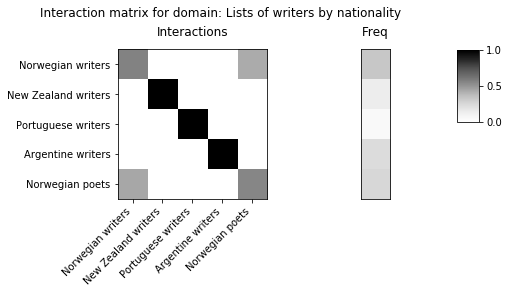

saving data in: ./WIKIdata/matrices2020/wikipedia_system_237.npz


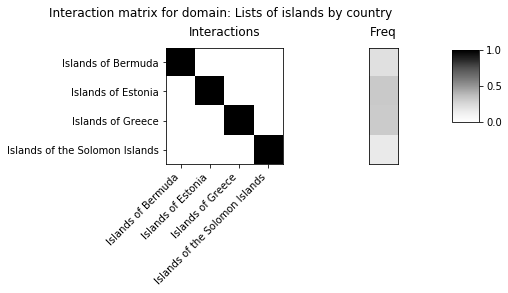

saving data in: ./WIKIdata/matrices2020/wikipedia_system_238.npz


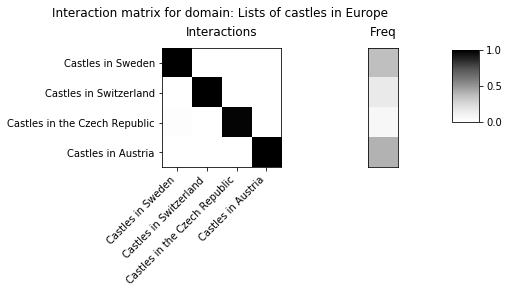

saving data in: ./WIKIdata/matrices2020/wikipedia_system_239.npz


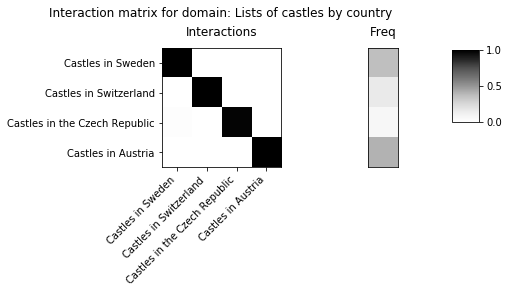

saving data in: ./WIKIdata/matrices2020/wikipedia_system_240.npz


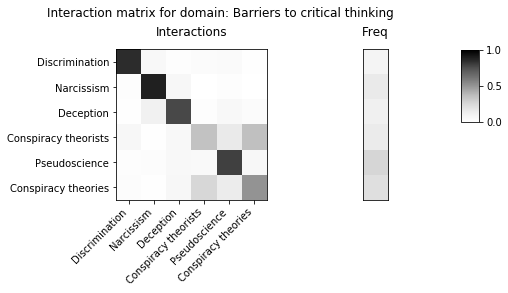

saving data in: ./WIKIdata/matrices2020/wikipedia_system_241.npz


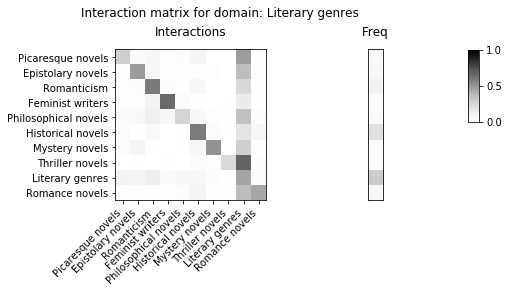

saving data in: ./WIKIdata/matrices2020/wikipedia_system_242.npz


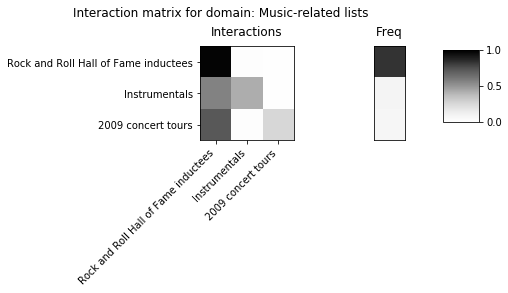

saving data in: ./WIKIdata/matrices2020/wikipedia_system_243.npz


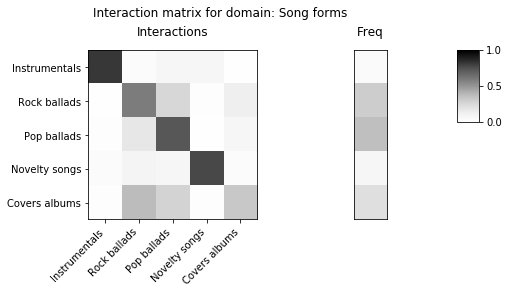

saving data in: ./WIKIdata/matrices2020/wikipedia_system_244.npz


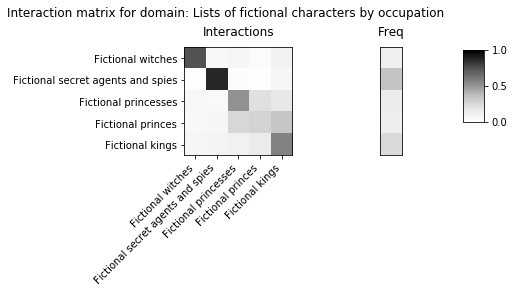

saving data in: ./WIKIdata/matrices2020/wikipedia_system_245.npz


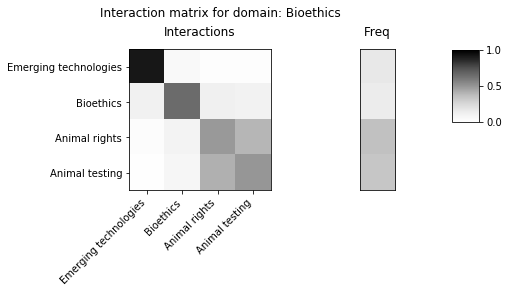

saving data in: ./WIKIdata/matrices2020/wikipedia_system_246.npz


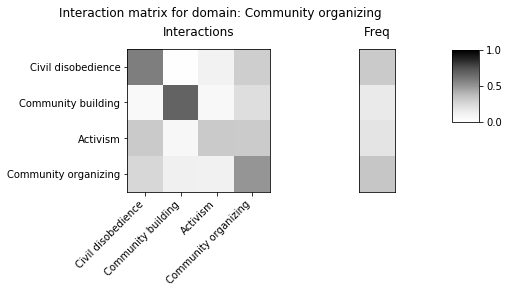

saving data in: ./WIKIdata/matrices2020/wikipedia_system_247.npz


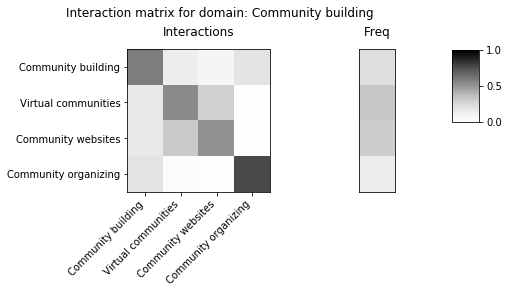

saving data in: ./WIKIdata/matrices2020/wikipedia_system_248.npz


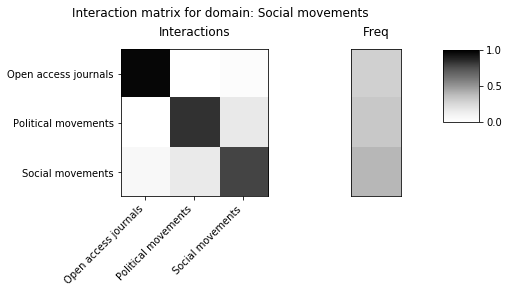

saving data in: ./WIKIdata/matrices2020/wikipedia_system_249.npz


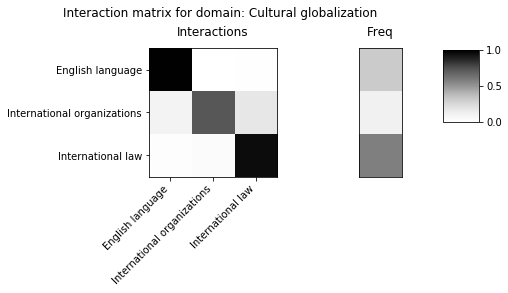

saving data in: ./WIKIdata/matrices2020/wikipedia_system_250.npz


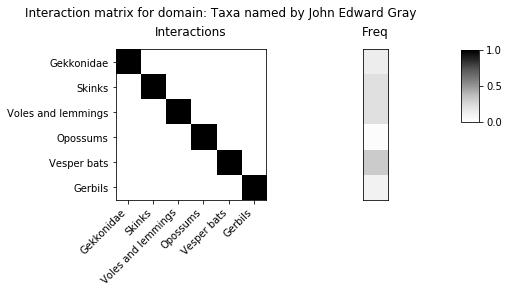

saving data in: ./WIKIdata/matrices2020/wikipedia_system_251.npz


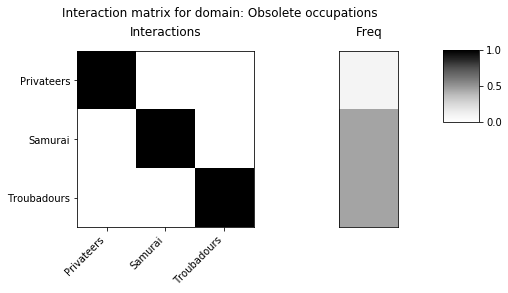

saving data in: ./WIKIdata/matrices2020/wikipedia_system_252.npz


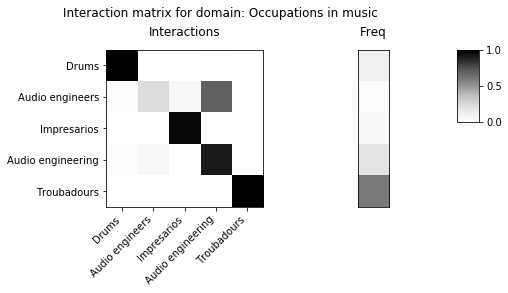

saving data in: ./WIKIdata/matrices2020/wikipedia_system_253.npz


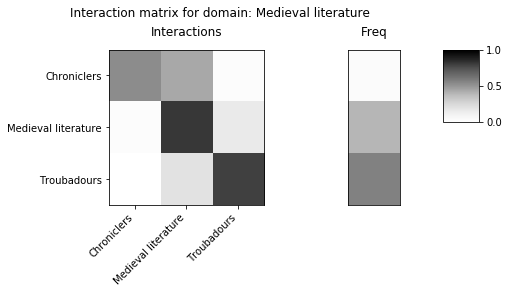

saving data in: ./WIKIdata/matrices2020/wikipedia_system_254.npz


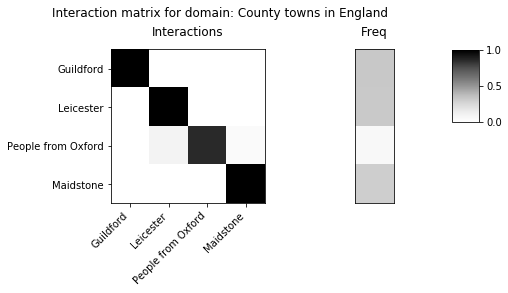

saving data in: ./WIKIdata/matrices2020/wikipedia_system_255.npz


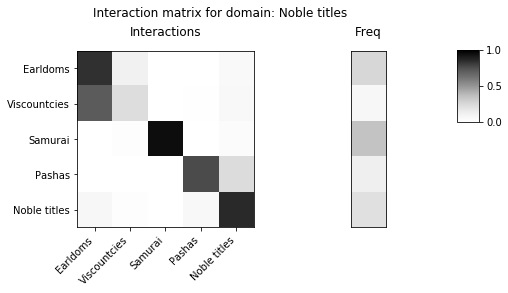

saving data in: ./WIKIdata/matrices2020/wikipedia_system_256.npz


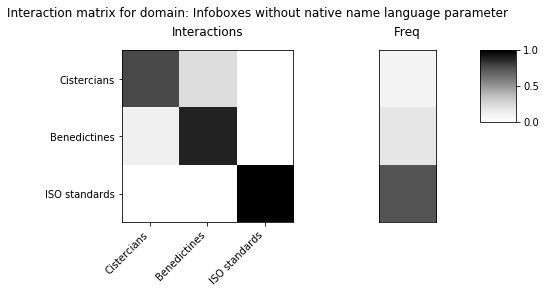

saving data in: ./WIKIdata/matrices2020/wikipedia_system_257.npz


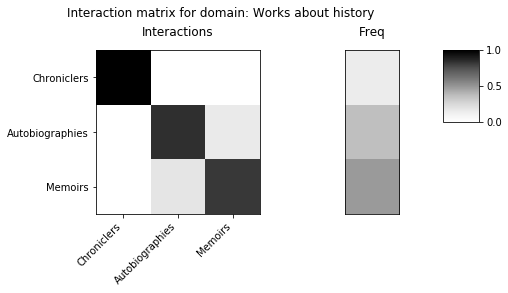

saving data in: ./WIKIdata/matrices2020/wikipedia_system_258.npz


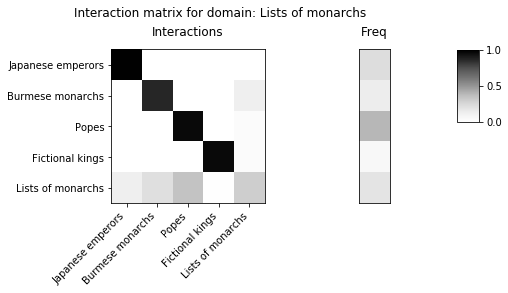

saving data in: ./WIKIdata/matrices2020/wikipedia_system_259.npz


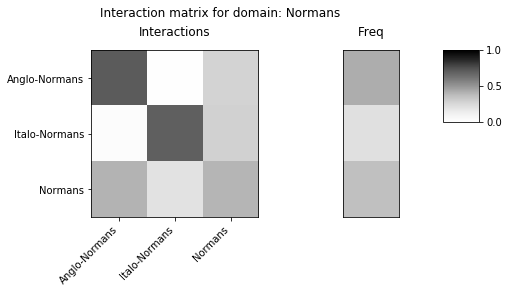

saving data in: ./WIKIdata/matrices2020/wikipedia_system_260.npz


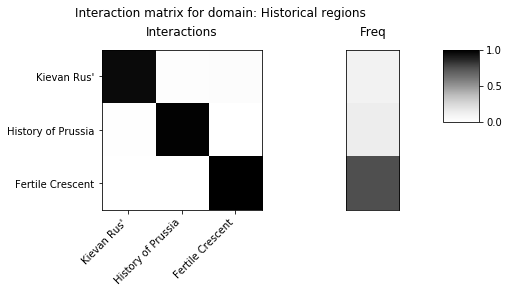

saving data in: ./WIKIdata/matrices2020/wikipedia_system_261.npz


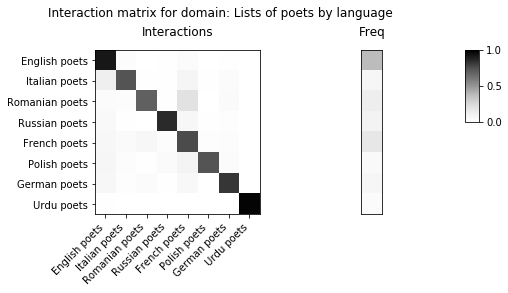

saving data in: ./WIKIdata/matrices2020/wikipedia_system_262.npz


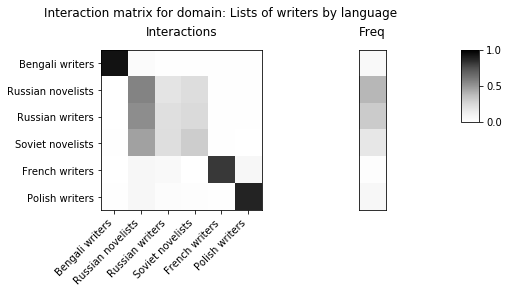

saving data in: ./WIKIdata/matrices2020/wikipedia_system_263.npz


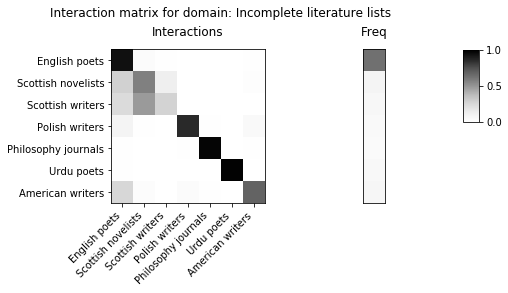

saving data in: ./WIKIdata/matrices2020/wikipedia_system_264.npz


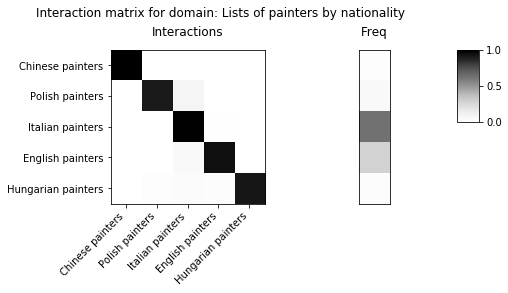

saving data in: ./WIKIdata/matrices2020/wikipedia_system_265.npz


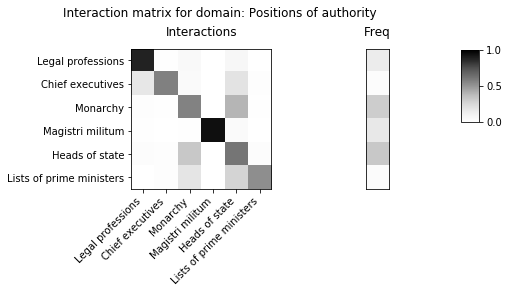

saving data in: ./WIKIdata/matrices2020/wikipedia_system_266.npz


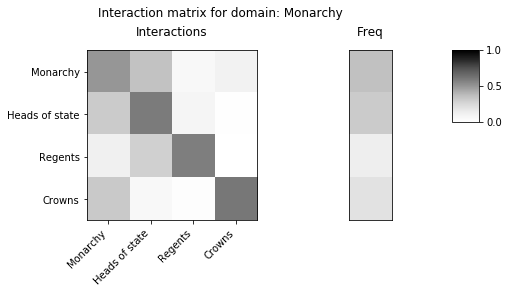

saving data in: ./WIKIdata/matrices2020/wikipedia_system_267.npz


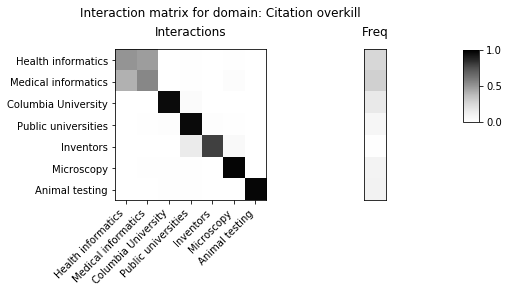

saving data in: ./WIKIdata/matrices2020/wikipedia_system_268.npz


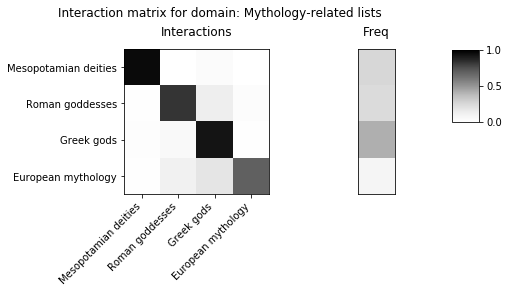

saving data in: ./WIKIdata/matrices2020/wikipedia_system_269.npz


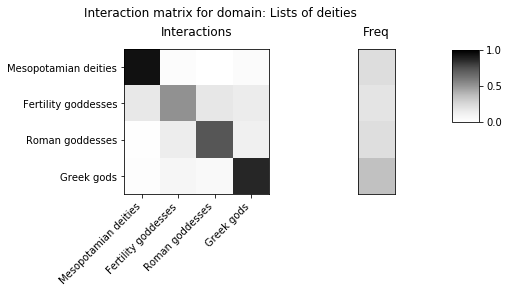

saving data in: ./WIKIdata/matrices2020/wikipedia_system_270.npz


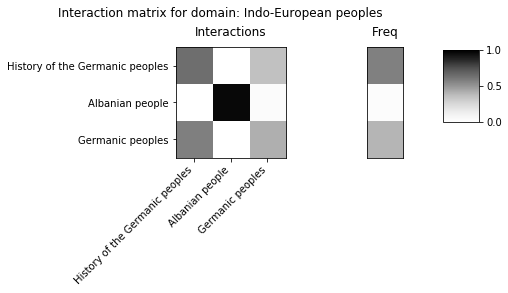

saving data in: ./WIKIdata/matrices2020/wikipedia_system_271.npz


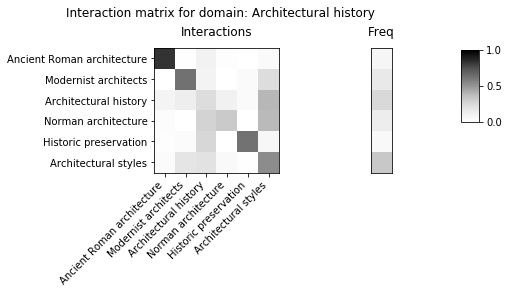

saving data in: ./WIKIdata/matrices2020/wikipedia_system_272.npz


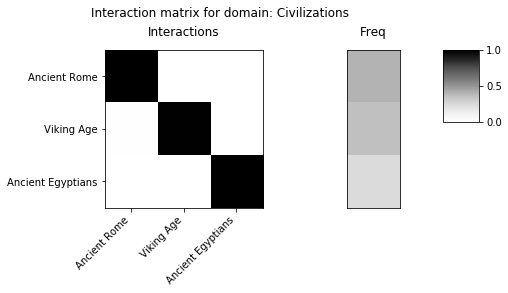

saving data in: ./WIKIdata/matrices2020/wikipedia_system_273.npz


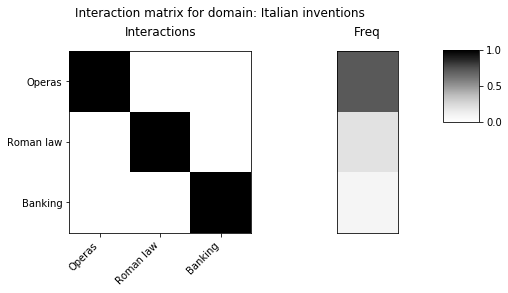

saving data in: ./WIKIdata/matrices2020/wikipedia_system_274.npz


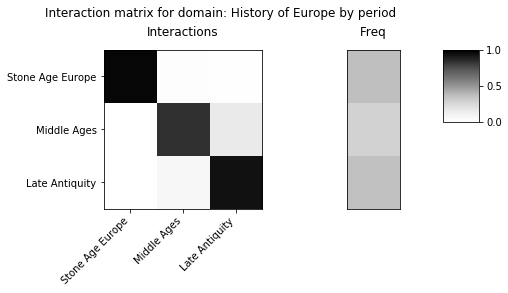

saving data in: ./WIKIdata/matrices2020/wikipedia_system_275.npz


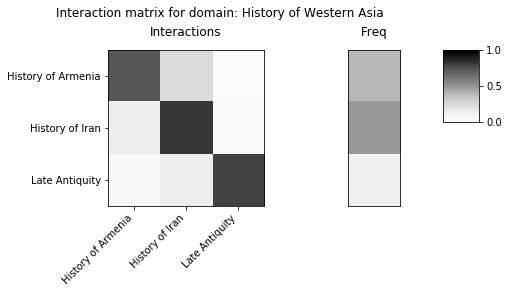

saving data in: ./WIKIdata/matrices2020/wikipedia_system_276.npz


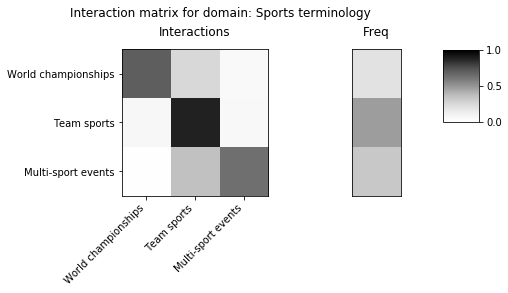

saving data in: ./WIKIdata/matrices2020/wikipedia_system_277.npz


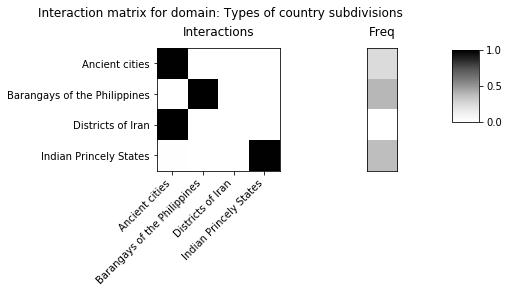

saving data in: ./WIKIdata/matrices2020/wikipedia_system_278.npz


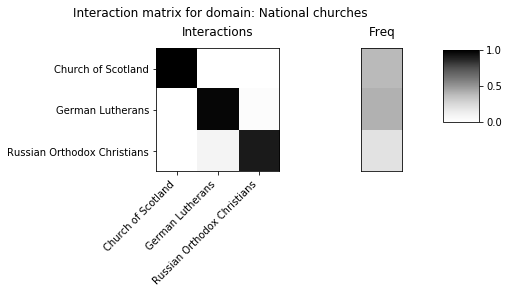

saving data in: ./WIKIdata/matrices2020/wikipedia_system_279.npz


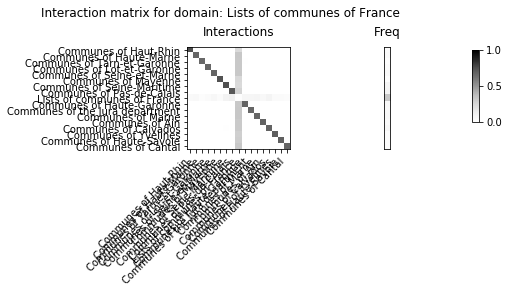

saving data in: ./WIKIdata/matrices2020/wikipedia_system_280.npz


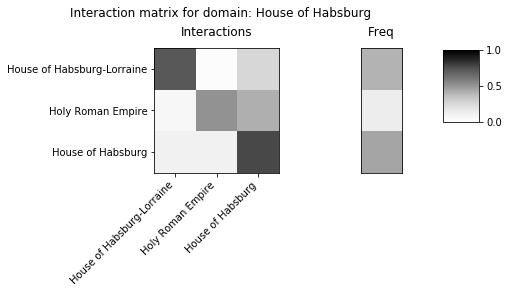

saving data in: ./WIKIdata/matrices2020/wikipedia_system_281.npz


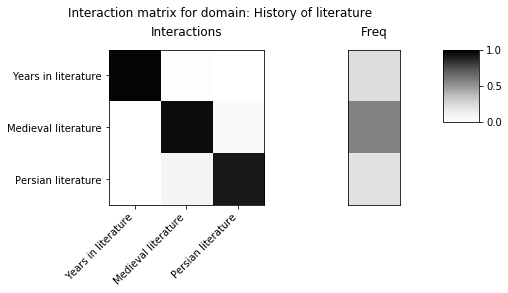

saving data in: ./WIKIdata/matrices2020/wikipedia_system_282.npz


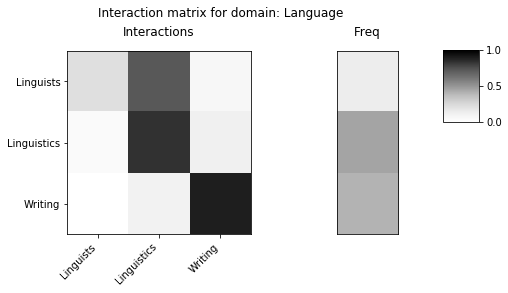

saving data in: ./WIKIdata/matrices2020/wikipedia_system_283.npz


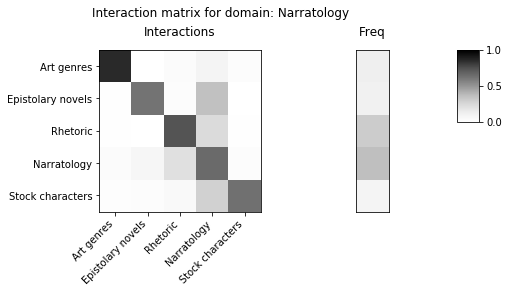

saving data in: ./WIKIdata/matrices2020/wikipedia_system_284.npz


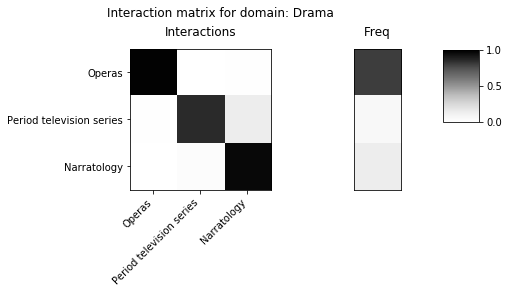

saving data in: ./WIKIdata/matrices2020/wikipedia_system_285.npz


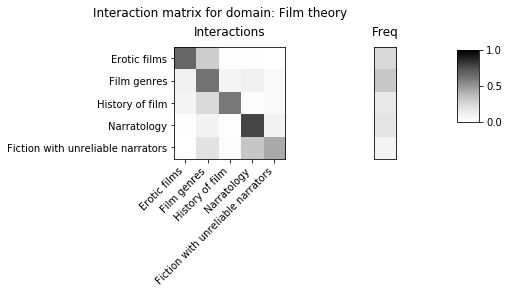

saving data in: ./WIKIdata/matrices2020/wikipedia_system_286.npz


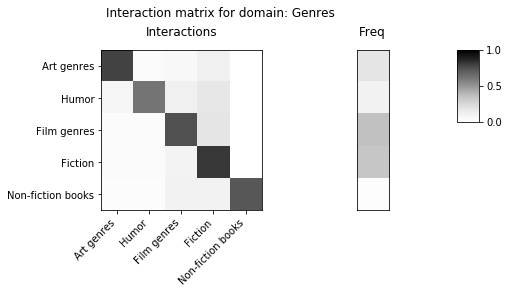

saving data in: ./WIKIdata/matrices2020/wikipedia_system_287.npz


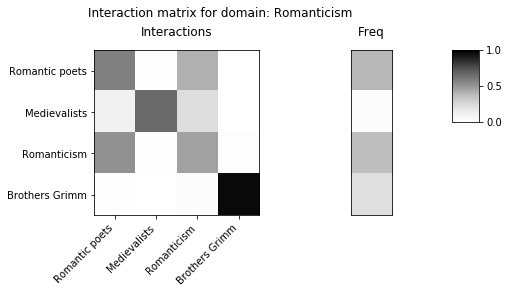

saving data in: ./WIKIdata/matrices2020/wikipedia_system_288.npz


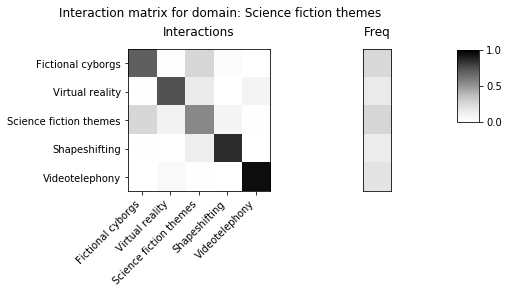

saving data in: ./WIKIdata/matrices2020/wikipedia_system_289.npz


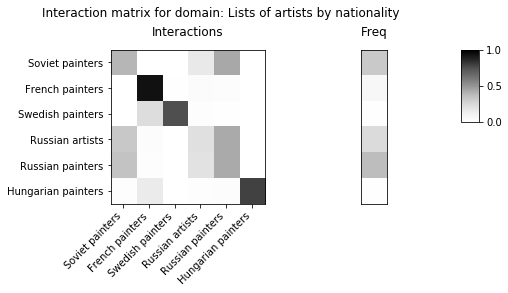

saving data in: ./WIKIdata/matrices2020/wikipedia_system_290.npz


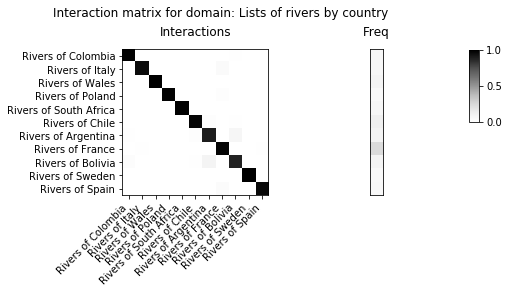

saving data in: ./WIKIdata/matrices2020/wikipedia_system_291.npz


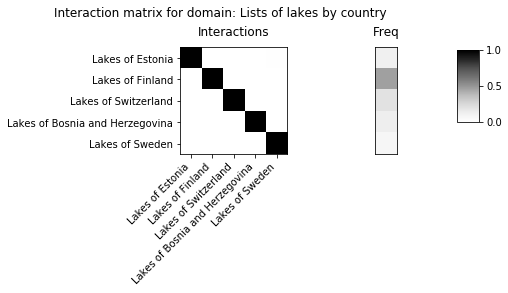

saving data in: ./WIKIdata/matrices2020/wikipedia_system_292.npz


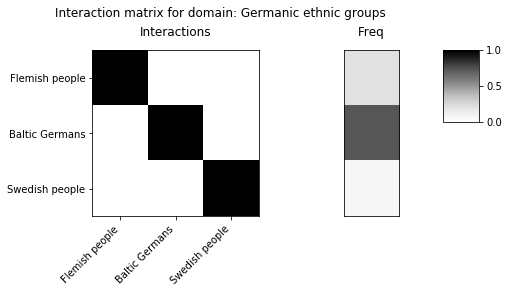

saving data in: ./WIKIdata/matrices2020/wikipedia_system_293.npz


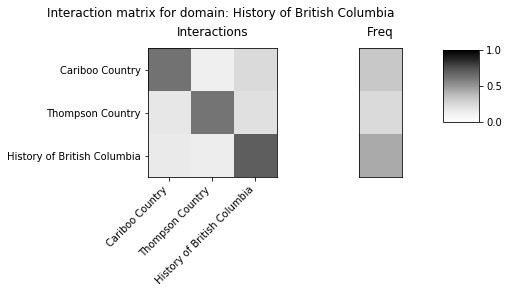

saving data in: ./WIKIdata/matrices2020/wikipedia_system_294.npz


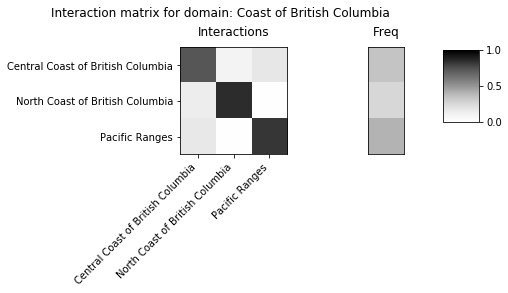

saving data in: ./WIKIdata/matrices2020/wikipedia_system_295.npz


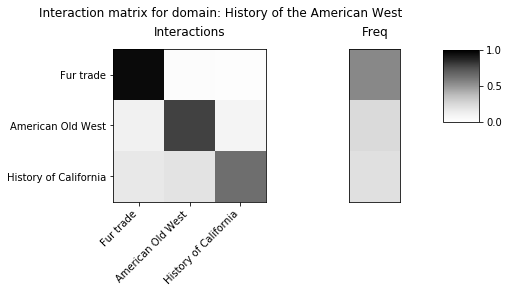

saving data in: ./WIKIdata/matrices2020/wikipedia_system_296.npz


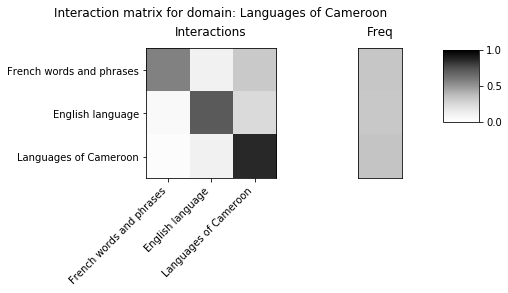

saving data in: ./WIKIdata/matrices2020/wikipedia_system_297.npz


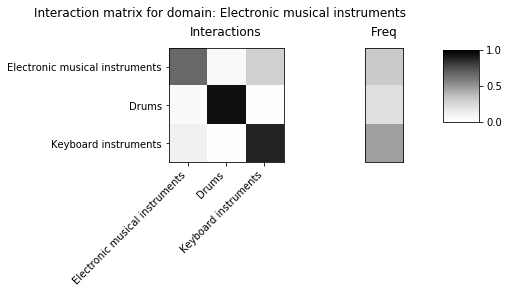

saving data in: ./WIKIdata/matrices2020/wikipedia_system_298.npz


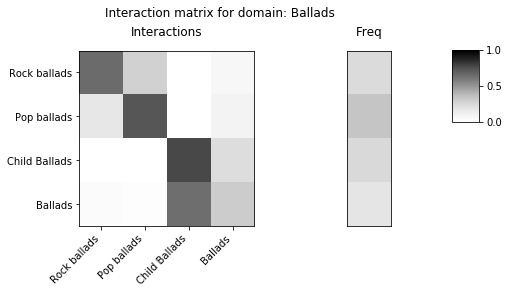

saving data in: ./WIKIdata/matrices2020/wikipedia_system_299.npz


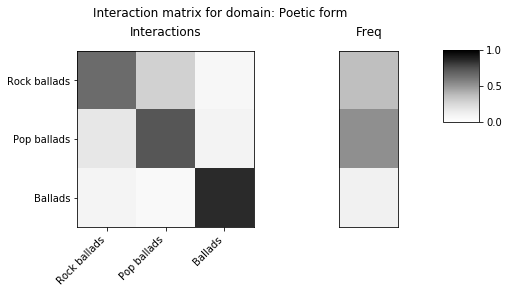

saving data in: ./WIKIdata/matrices2020/wikipedia_system_300.npz


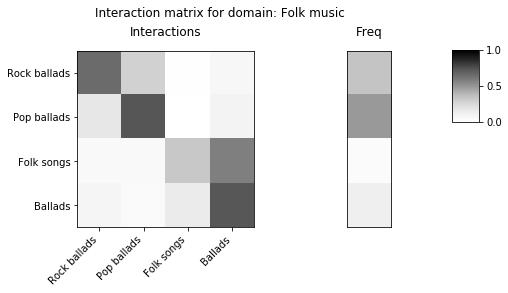

saving data in: ./WIKIdata/matrices2020/wikipedia_system_301.npz


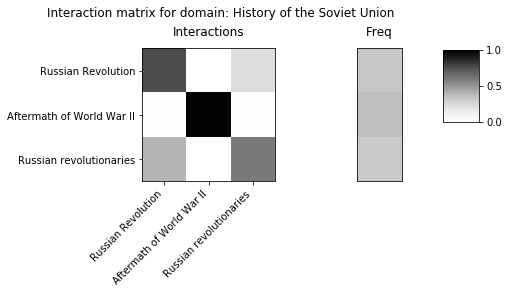

saving data in: ./WIKIdata/matrices2020/wikipedia_system_302.npz


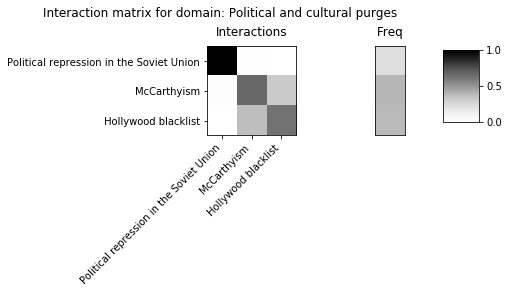

saving data in: ./WIKIdata/matrices2020/wikipedia_system_303.npz


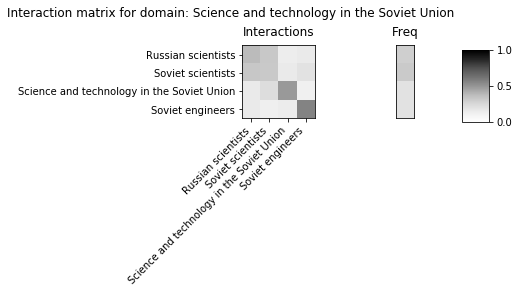

saving data in: ./WIKIdata/matrices2020/wikipedia_system_304.npz


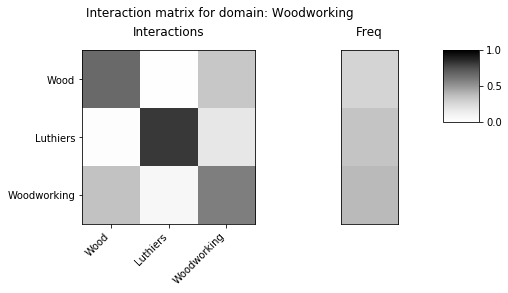

saving data in: ./WIKIdata/matrices2020/wikipedia_system_305.npz


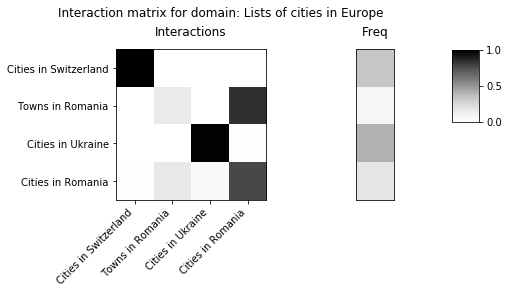

saving data in: ./WIKIdata/matrices2020/wikipedia_system_306.npz


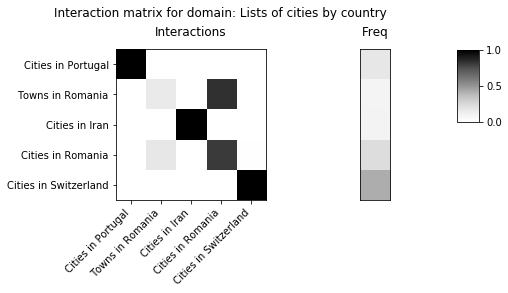

saving data in: ./WIKIdata/matrices2020/wikipedia_system_307.npz


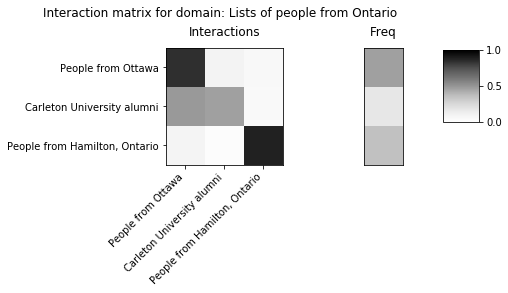

saving data in: ./WIKIdata/matrices2020/wikipedia_system_308.npz


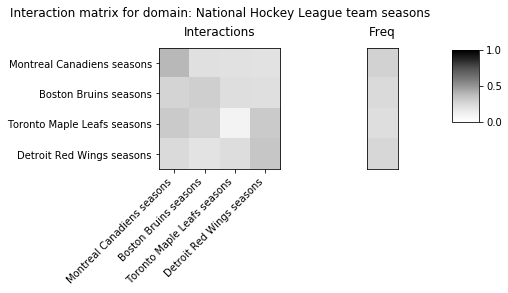

saving data in: ./WIKIdata/matrices2020/wikipedia_system_309.npz


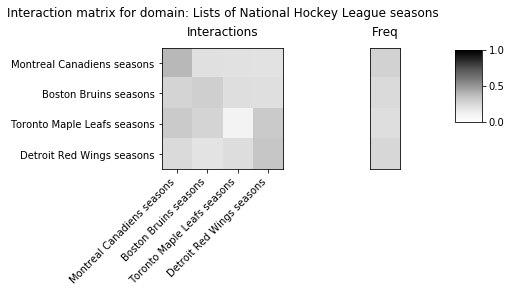

saving data in: ./WIKIdata/matrices2020/wikipedia_system_310.npz


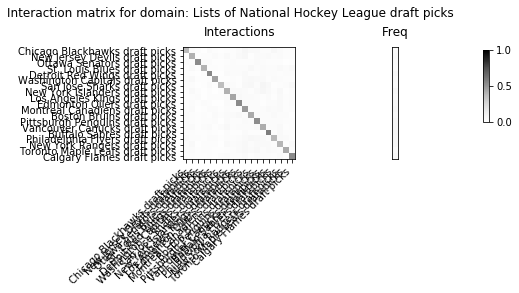

saving data in: ./WIKIdata/matrices2020/wikipedia_system_311.npz


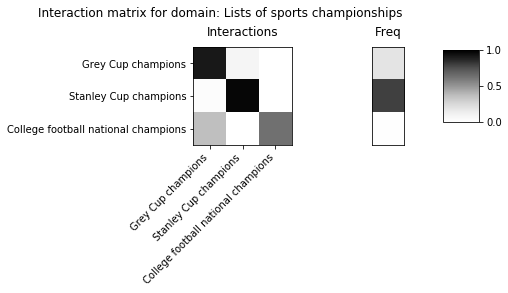

saving data in: ./WIKIdata/matrices2020/wikipedia_system_312.npz


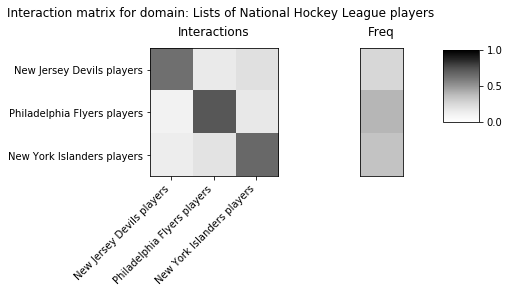

saving data in: ./WIKIdata/matrices2020/wikipedia_system_313.npz


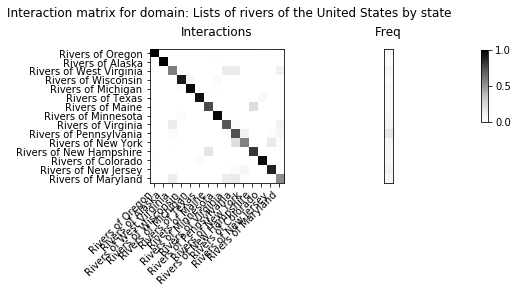

saving data in: ./WIKIdata/matrices2020/wikipedia_system_314.npz


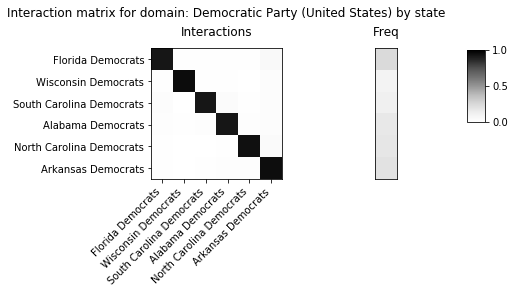

saving data in: ./WIKIdata/matrices2020/wikipedia_system_315.npz


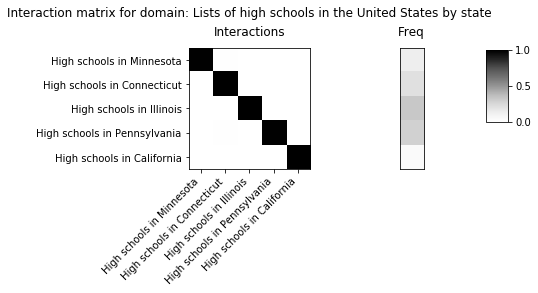

saving data in: ./WIKIdata/matrices2020/wikipedia_system_316.npz


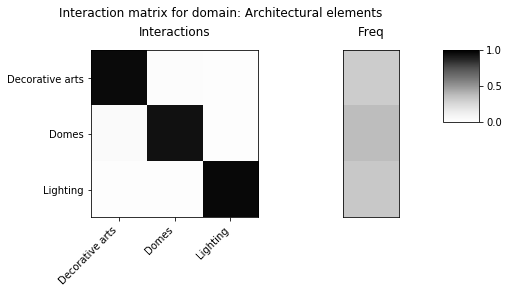

saving data in: ./WIKIdata/matrices2020/wikipedia_system_317.npz


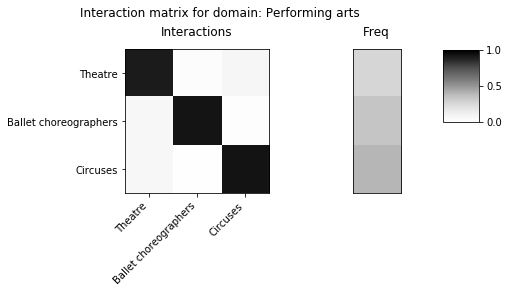

saving data in: ./WIKIdata/matrices2020/wikipedia_system_318.npz


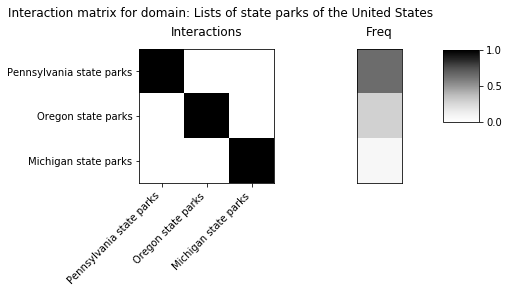

saving data in: ./WIKIdata/matrices2020/wikipedia_system_319.npz


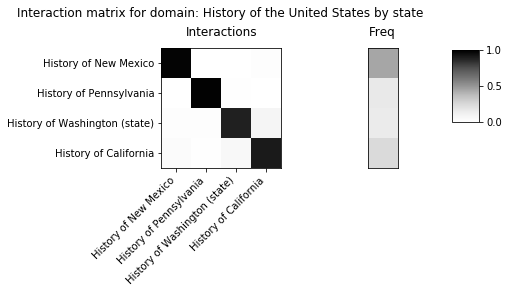

saving data in: ./WIKIdata/matrices2020/wikipedia_system_320.npz


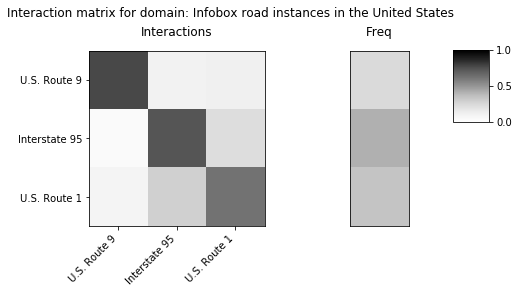

saving data in: ./WIKIdata/matrices2020/wikipedia_system_321.npz


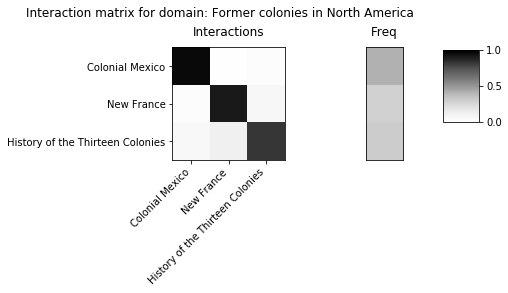

saving data in: ./WIKIdata/matrices2020/wikipedia_system_322.npz


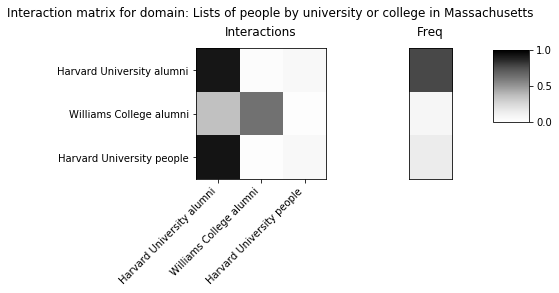

saving data in: ./WIKIdata/matrices2020/wikipedia_system_323.npz


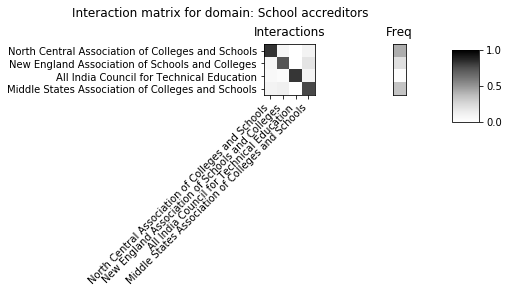

saving data in: ./WIKIdata/matrices2020/wikipedia_system_324.npz


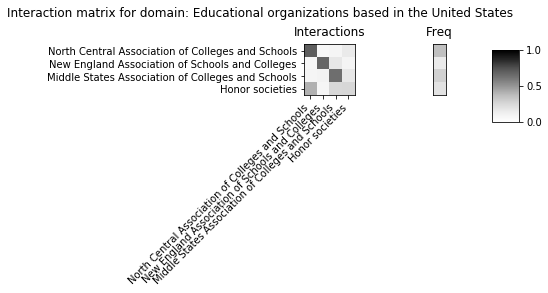

saving data in: ./WIKIdata/matrices2020/wikipedia_system_325.npz


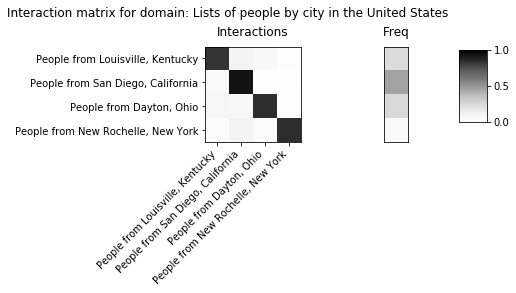

saving data in: ./WIKIdata/matrices2020/wikipedia_system_326.npz


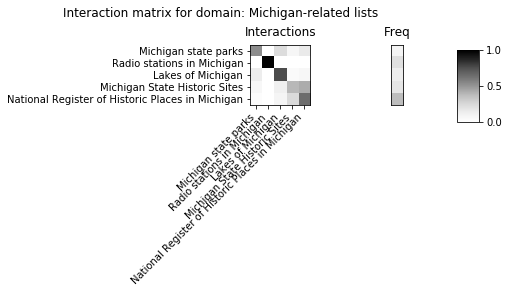

saving data in: ./WIKIdata/matrices2020/wikipedia_system_327.npz


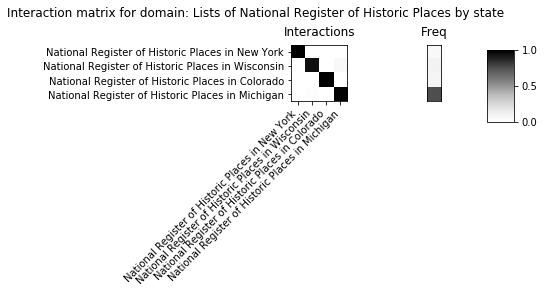

saving data in: ./WIKIdata/matrices2020/wikipedia_system_328.npz


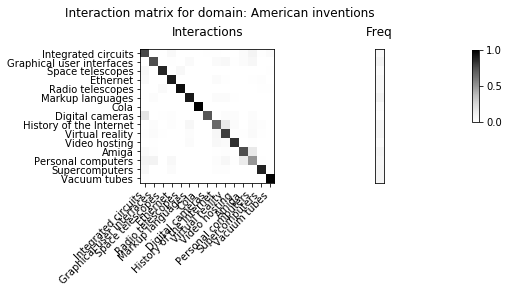

saving data in: ./WIKIdata/matrices2020/wikipedia_system_329.npz


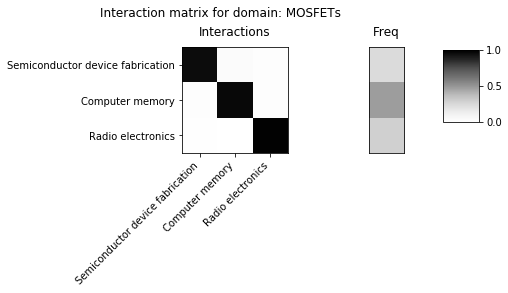

saving data in: ./WIKIdata/matrices2020/wikipedia_system_330.npz


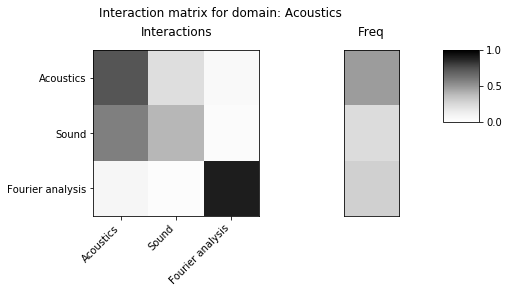

saving data in: ./WIKIdata/matrices2020/wikipedia_system_331.npz


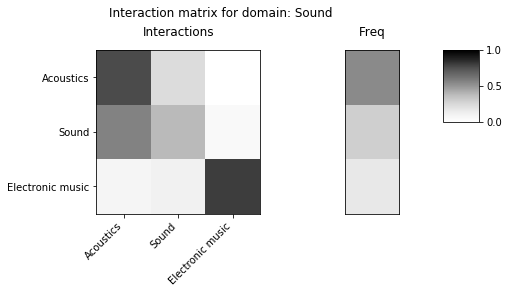

saving data in: ./WIKIdata/matrices2020/wikipedia_system_332.npz


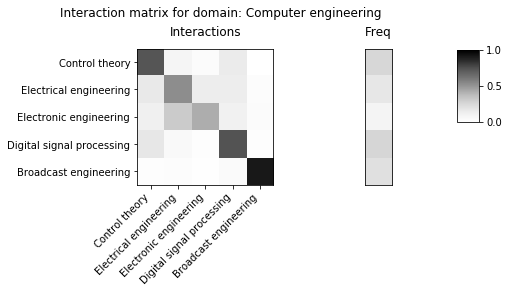

saving data in: ./WIKIdata/matrices2020/wikipedia_system_333.npz


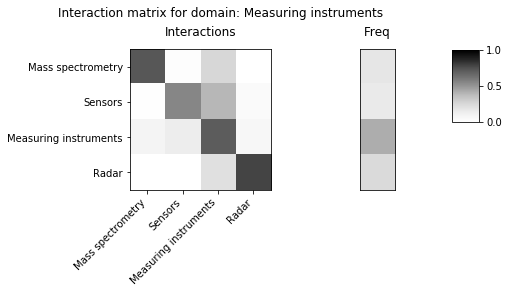

saving data in: ./WIKIdata/matrices2020/wikipedia_system_334.npz


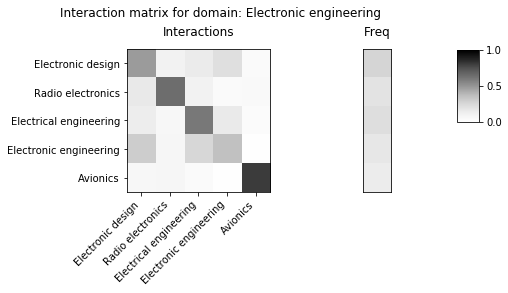

saving data in: ./WIKIdata/matrices2020/wikipedia_system_335.npz


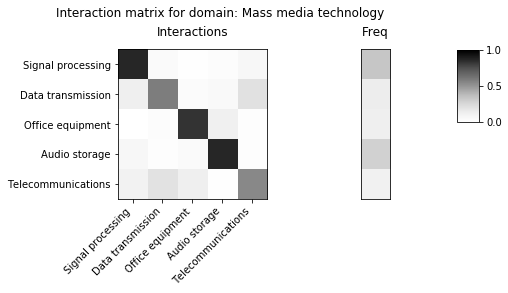

saving data in: ./WIKIdata/matrices2020/wikipedia_system_336.npz


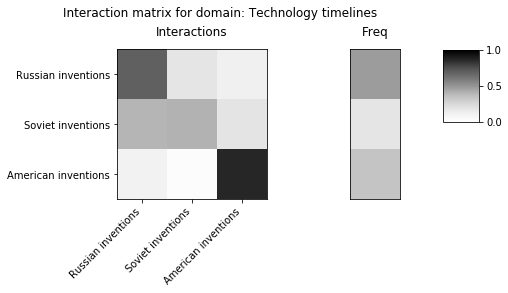

saving data in: ./WIKIdata/matrices2020/wikipedia_system_337.npz


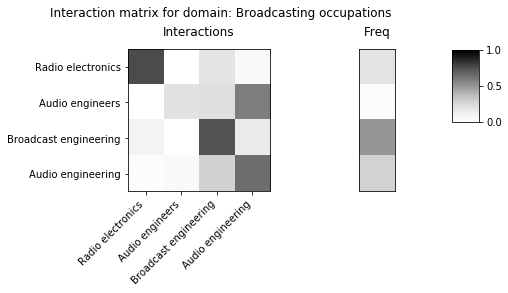

saving data in: ./WIKIdata/matrices2020/wikipedia_system_338.npz


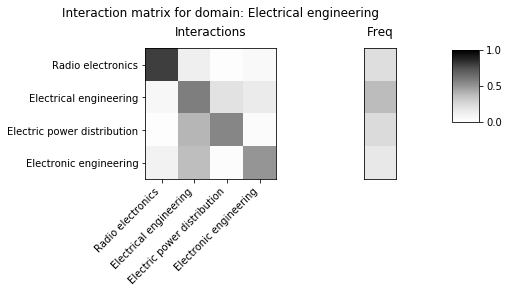

saving data in: ./WIKIdata/matrices2020/wikipedia_system_339.npz


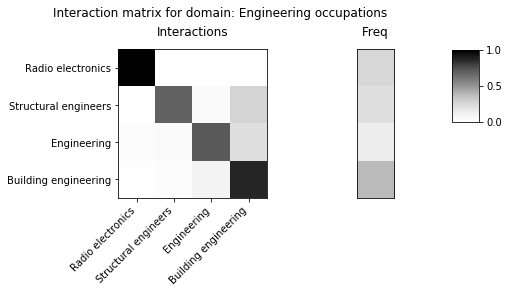

saving data in: ./WIKIdata/matrices2020/wikipedia_system_340.npz


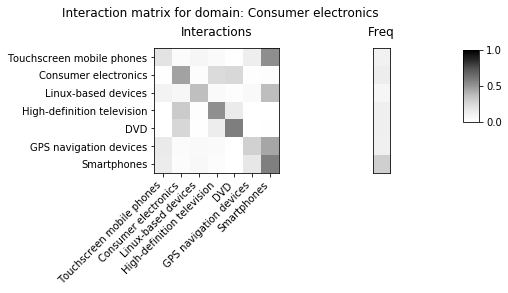

saving data in: ./WIKIdata/matrices2020/wikipedia_system_341.npz


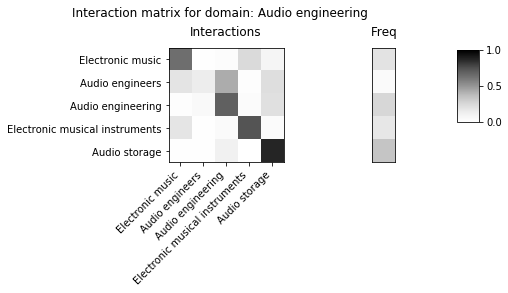

saving data in: ./WIKIdata/matrices2020/wikipedia_system_342.npz


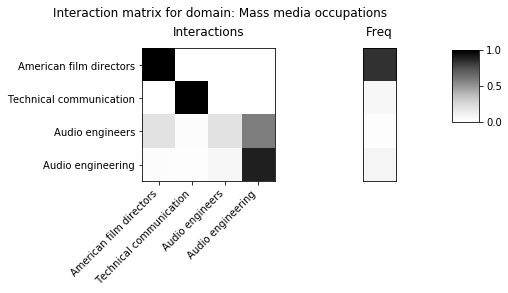

saving data in: ./WIKIdata/matrices2020/wikipedia_system_343.npz


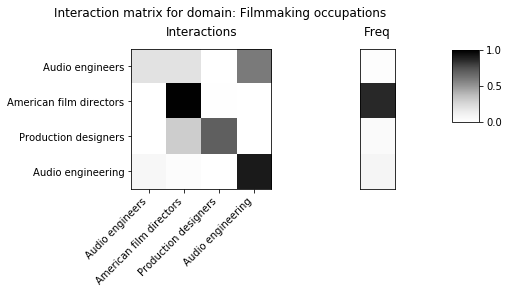

saving data in: ./WIKIdata/matrices2020/wikipedia_system_344.npz


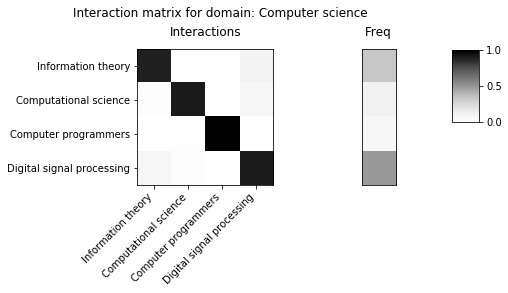

saving data in: ./WIKIdata/matrices2020/wikipedia_system_345.npz


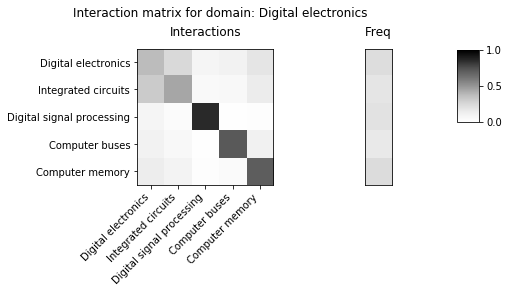

saving data in: ./WIKIdata/matrices2020/wikipedia_system_346.npz


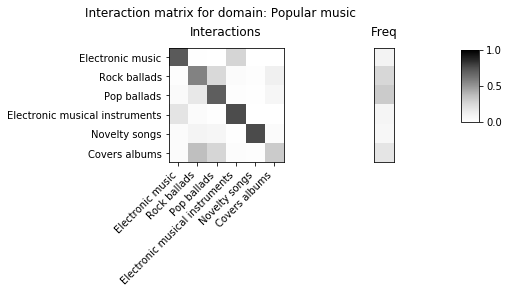

saving data in: ./WIKIdata/matrices2020/wikipedia_system_347.npz


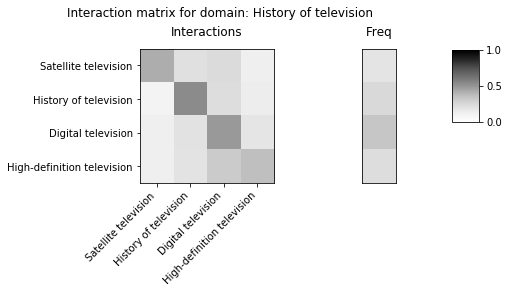

saving data in: ./WIKIdata/matrices2020/wikipedia_system_348.npz


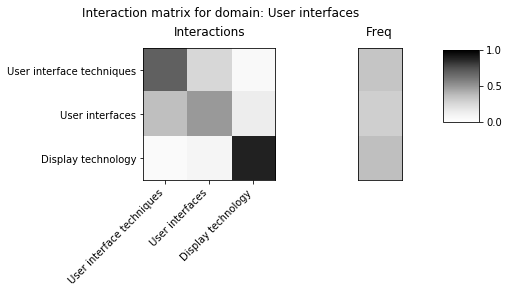

saving data in: ./WIKIdata/matrices2020/wikipedia_system_349.npz


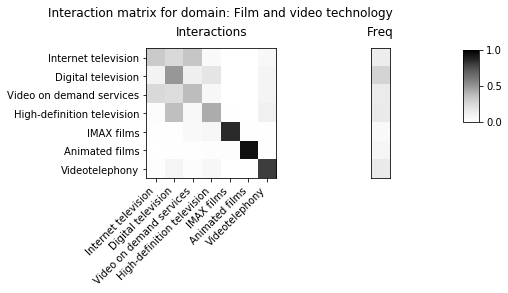

saving data in: ./WIKIdata/matrices2020/wikipedia_system_350.npz


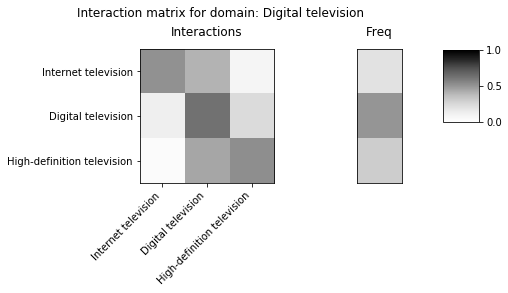

saving data in: ./WIKIdata/matrices2020/wikipedia_system_351.npz


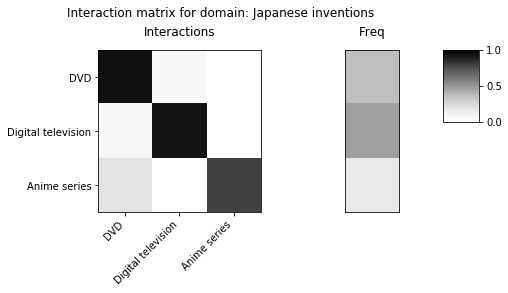

saving data in: ./WIKIdata/matrices2020/wikipedia_system_352.npz


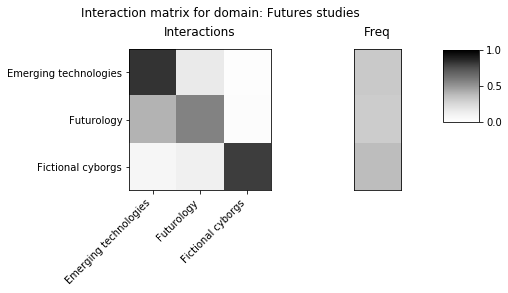

saving data in: ./WIKIdata/matrices2020/wikipedia_system_353.npz


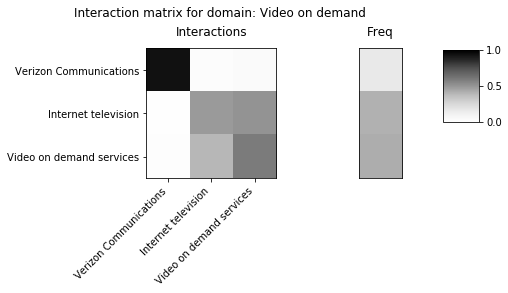

saving data in: ./WIKIdata/matrices2020/wikipedia_system_354.npz


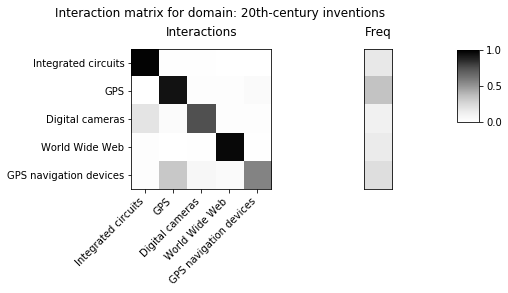

saving data in: ./WIKIdata/matrices2020/wikipedia_system_355.npz


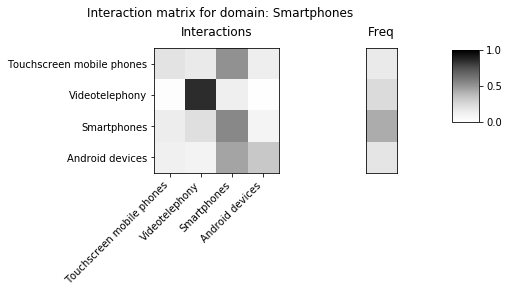

saving data in: ./WIKIdata/matrices2020/wikipedia_system_356.npz


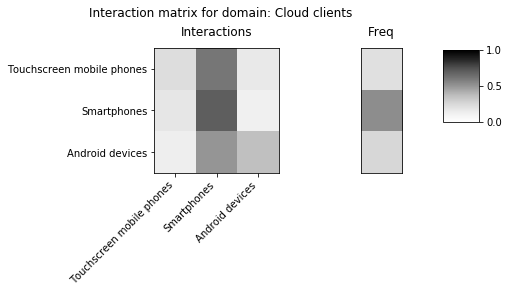

saving data in: ./WIKIdata/matrices2020/wikipedia_system_357.npz


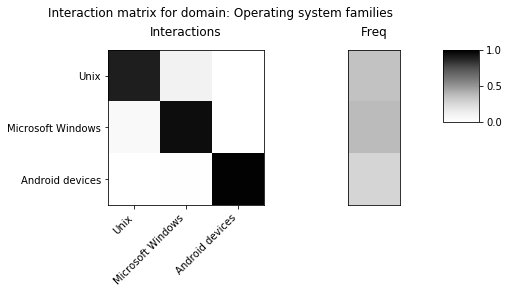

saving data in: ./WIKIdata/matrices2020/wikipedia_system_358.npz


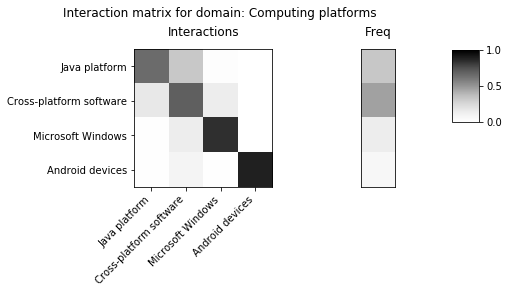

saving data in: ./WIKIdata/matrices2020/wikipedia_system_359.npz


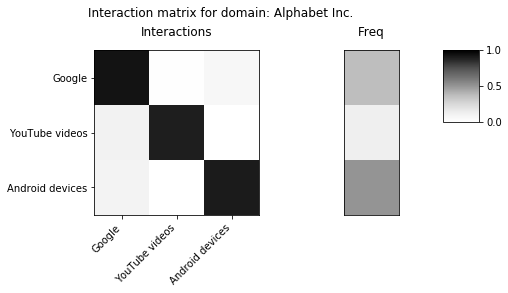

saving data in: ./WIKIdata/matrices2020/wikipedia_system_360.npz


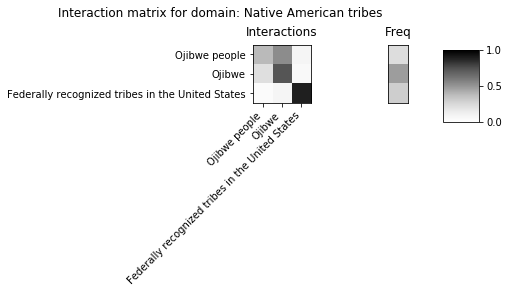

saving data in: ./WIKIdata/matrices2020/wikipedia_system_361.npz


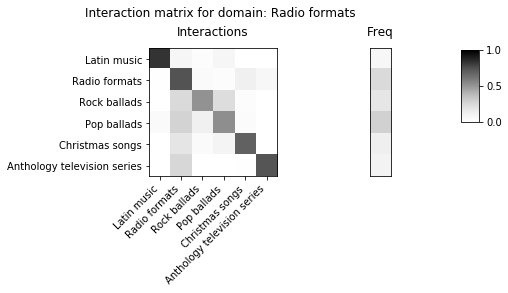

saving data in: ./WIKIdata/matrices2020/wikipedia_system_362.npz


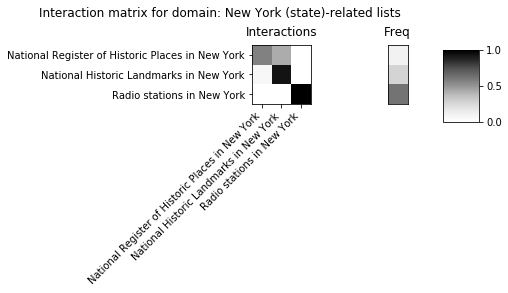

saving data in: ./WIKIdata/matrices2020/wikipedia_system_363.npz


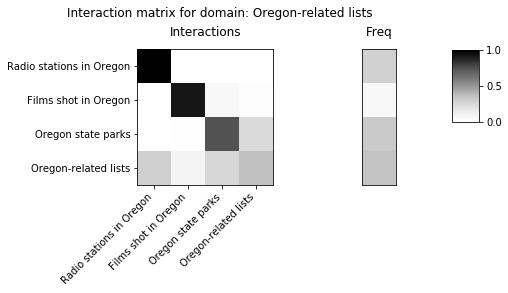

saving data in: ./WIKIdata/matrices2020/wikipedia_system_364.npz


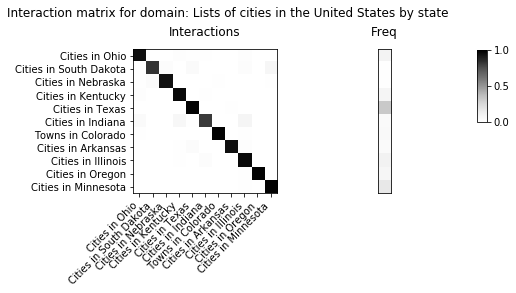

saving data in: ./WIKIdata/matrices2020/wikipedia_system_365.npz


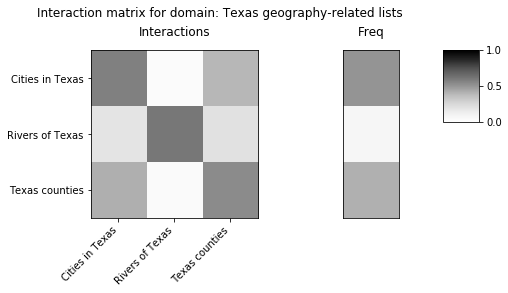

saving data in: ./WIKIdata/matrices2020/wikipedia_system_366.npz


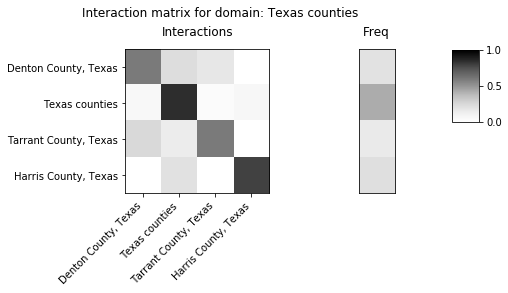

saving data in: ./WIKIdata/matrices2020/wikipedia_system_367.npz


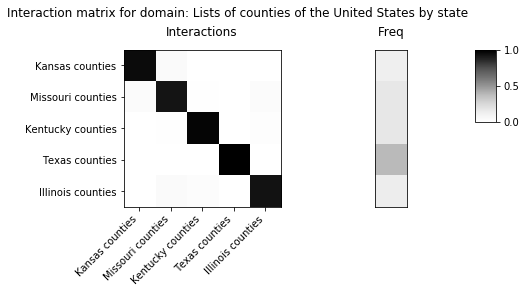

saving data in: ./WIKIdata/matrices2020/wikipedia_system_368.npz


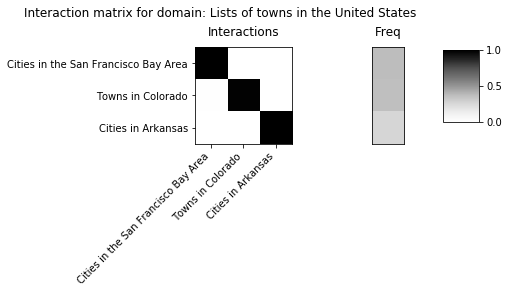

saving data in: ./WIKIdata/matrices2020/wikipedia_system_369.npz


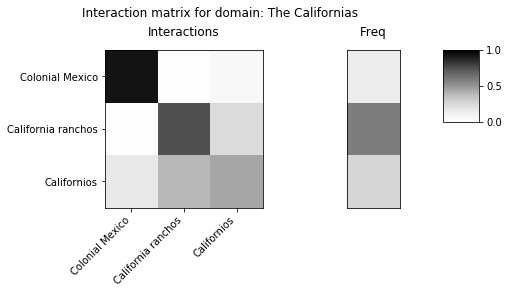

saving data in: ./WIKIdata/matrices2020/wikipedia_system_370.npz


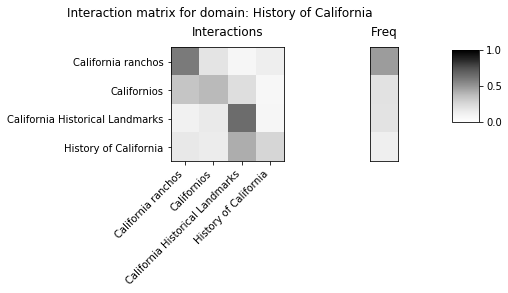

saving data in: ./WIKIdata/matrices2020/wikipedia_system_371.npz


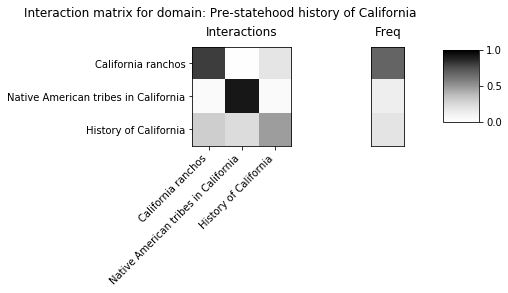

saving data in: ./WIKIdata/matrices2020/wikipedia_system_372.npz


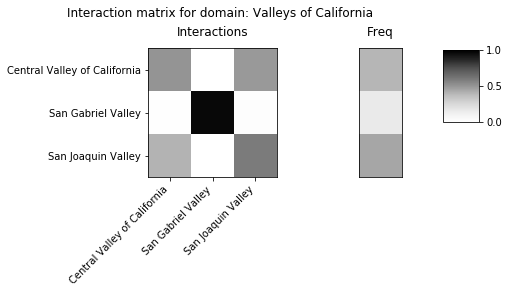

saving data in: ./WIKIdata/matrices2020/wikipedia_system_373.npz


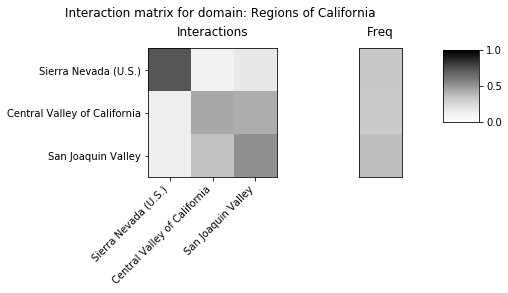

saving data in: ./WIKIdata/matrices2020/wikipedia_system_374.npz


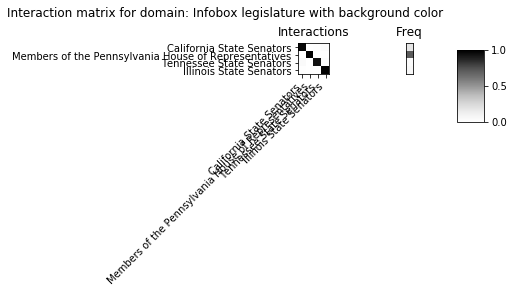

saving data in: ./WIKIdata/matrices2020/wikipedia_system_375.npz


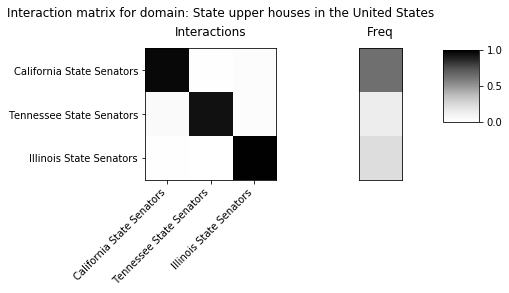

saving data in: ./WIKIdata/matrices2020/wikipedia_system_376.npz


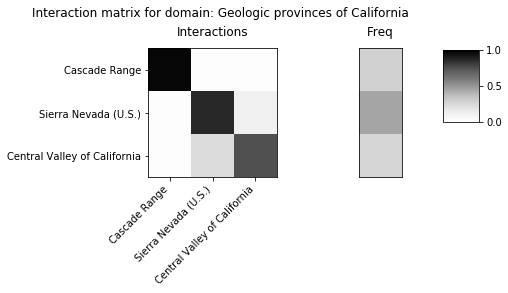

saving data in: ./WIKIdata/matrices2020/wikipedia_system_377.npz


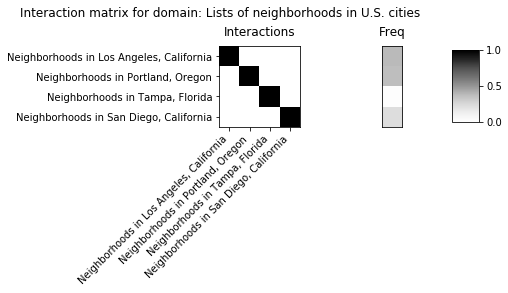

saving data in: ./WIKIdata/matrices2020/wikipedia_system_378.npz


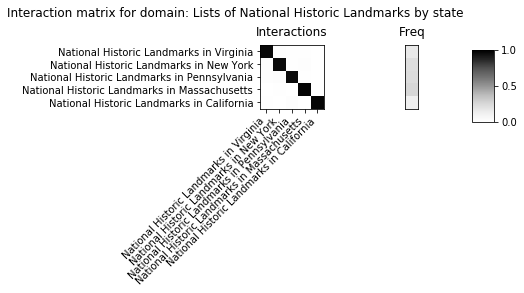

saving data in: ./WIKIdata/matrices2020/wikipedia_system_379.npz


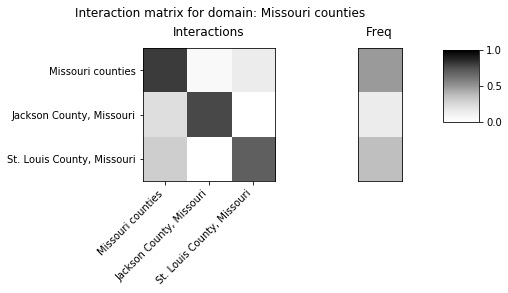

saving data in: ./WIKIdata/matrices2020/wikipedia_system_380.npz


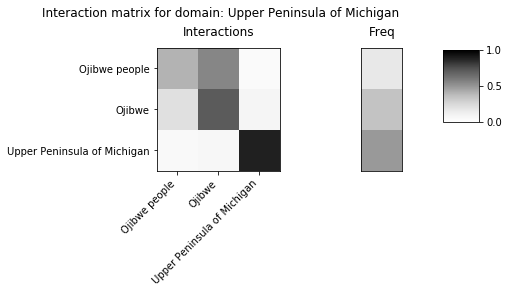

saving data in: ./WIKIdata/matrices2020/wikipedia_system_381.npz


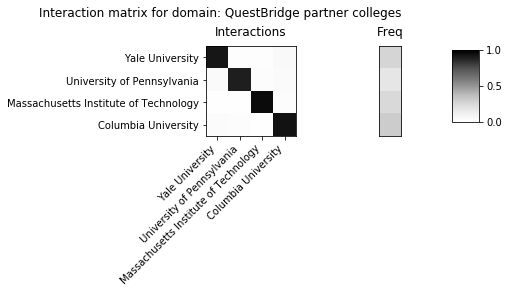

saving data in: ./WIKIdata/matrices2020/wikipedia_system_382.npz


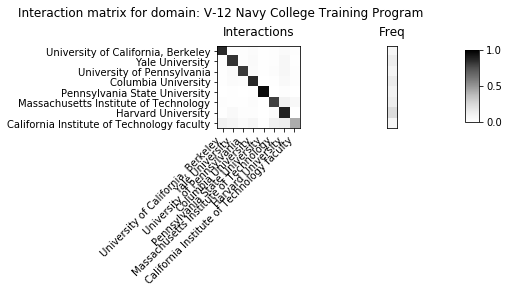

saving data in: ./WIKIdata/matrices2020/wikipedia_system_383.npz


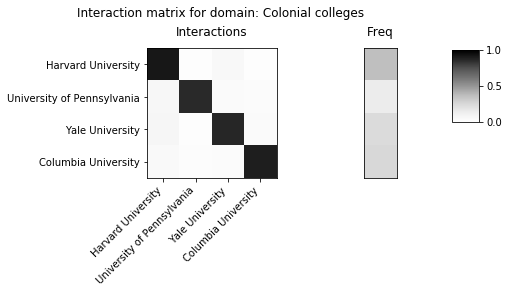

saving data in: ./WIKIdata/matrices2020/wikipedia_system_384.npz


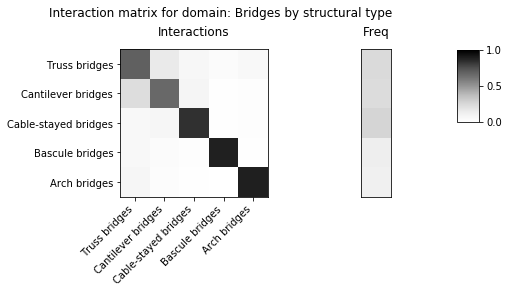

saving data in: ./WIKIdata/matrices2020/wikipedia_system_385.npz


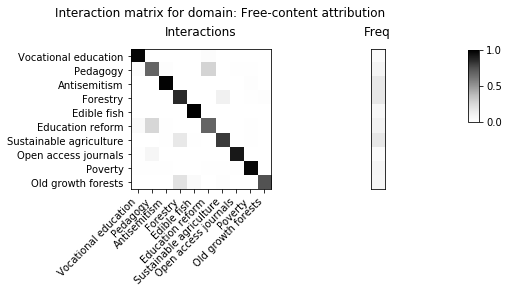

saving data in: ./WIKIdata/matrices2020/wikipedia_system_386.npz


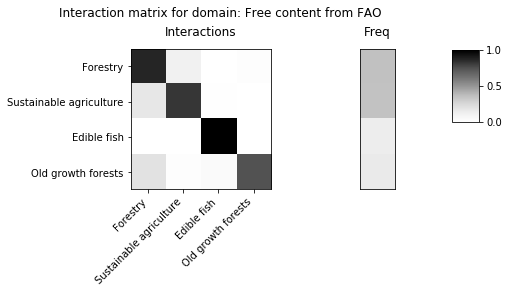

saving data in: ./WIKIdata/matrices2020/wikipedia_system_387.npz


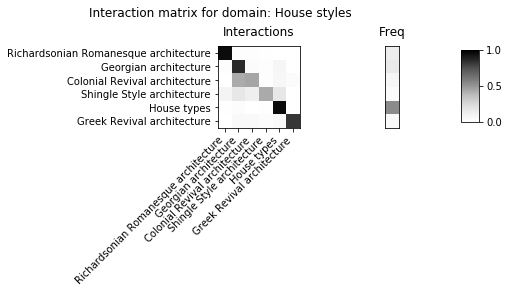

saving data in: ./WIKIdata/matrices2020/wikipedia_system_388.npz


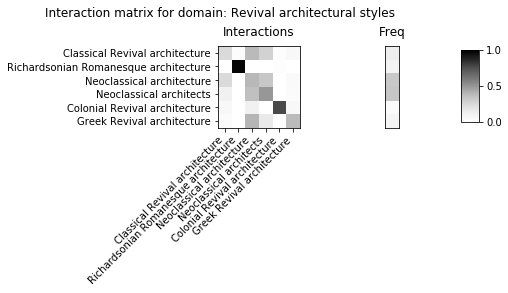

saving data in: ./WIKIdata/matrices2020/wikipedia_system_389.npz


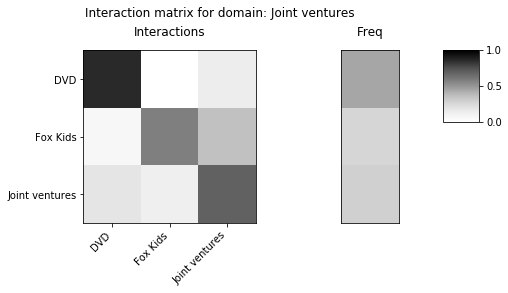

saving data in: ./WIKIdata/matrices2020/wikipedia_system_390.npz


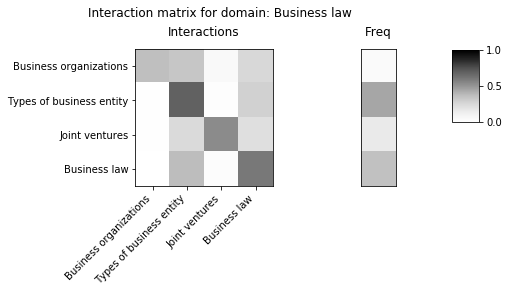

saving data in: ./WIKIdata/matrices2020/wikipedia_system_391.npz


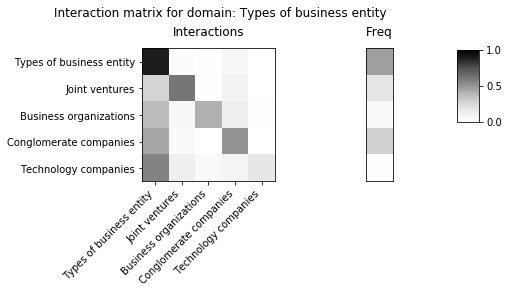

saving data in: ./WIKIdata/matrices2020/wikipedia_system_392.npz


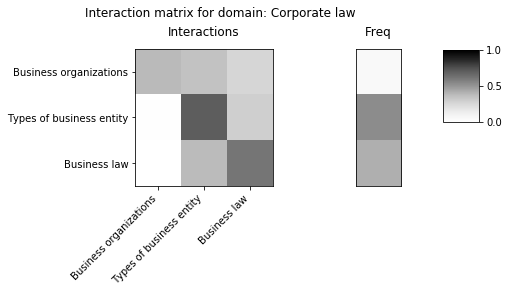

saving data in: ./WIKIdata/matrices2020/wikipedia_system_393.npz


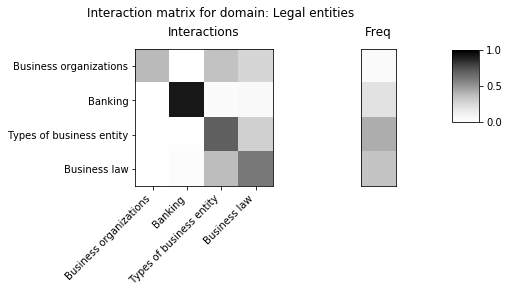

saving data in: ./WIKIdata/matrices2020/wikipedia_system_394.npz


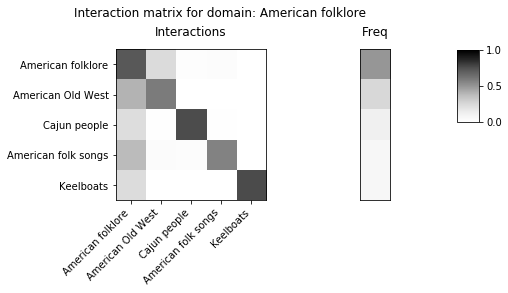

saving data in: ./WIKIdata/matrices2020/wikipedia_system_395.npz


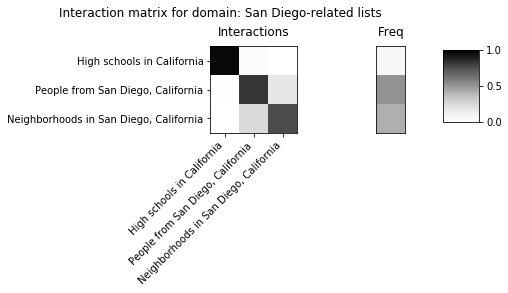

saving data in: ./WIKIdata/matrices2020/wikipedia_system_396.npz


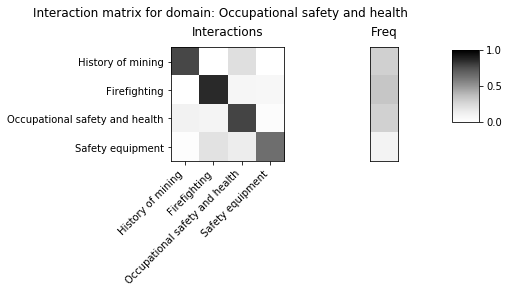

saving data in: ./WIKIdata/matrices2020/wikipedia_system_397.npz


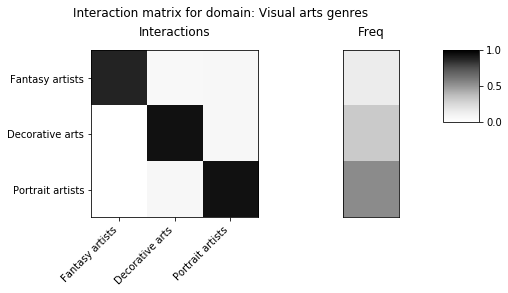

saving data in: ./WIKIdata/matrices2020/wikipedia_system_398.npz


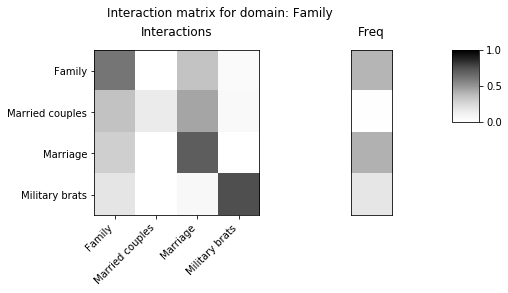

saving data in: ./WIKIdata/matrices2020/wikipedia_system_399.npz


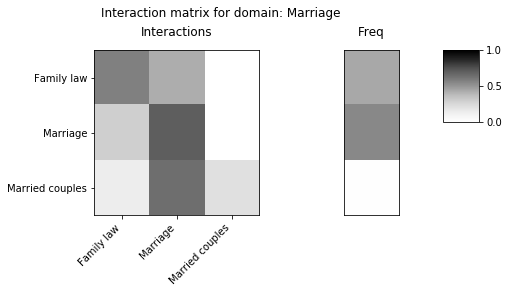

saving data in: ./WIKIdata/matrices2020/wikipedia_system_400.npz


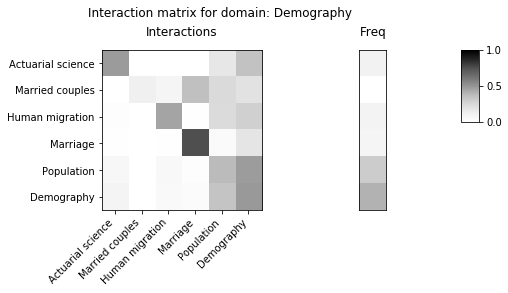

saving data in: ./WIKIdata/matrices2020/wikipedia_system_401.npz


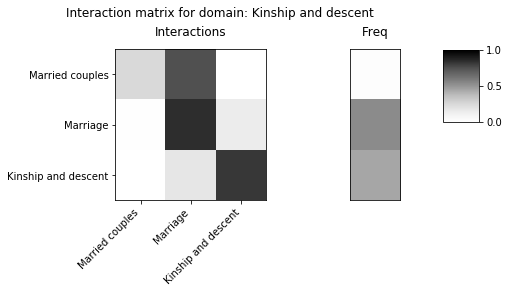

saving data in: ./WIKIdata/matrices2020/wikipedia_system_402.npz


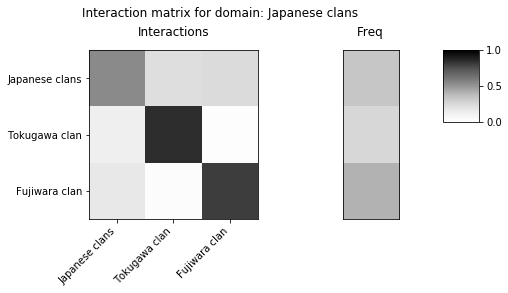

saving data in: ./WIKIdata/matrices2020/wikipedia_system_403.npz


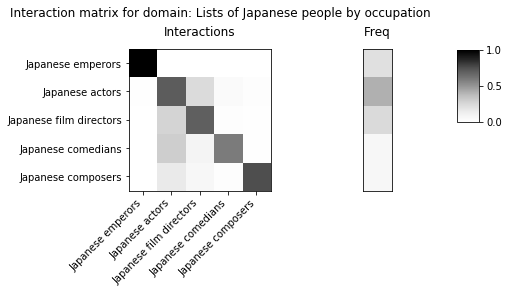

saving data in: ./WIKIdata/matrices2020/wikipedia_system_404.npz


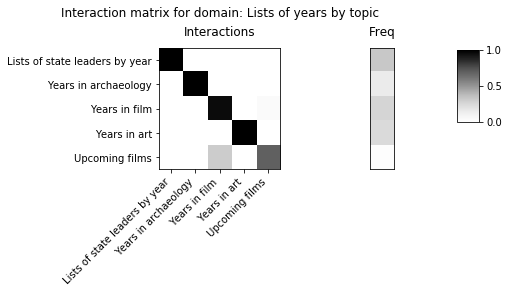

saving data in: ./WIKIdata/matrices2020/wikipedia_system_405.npz


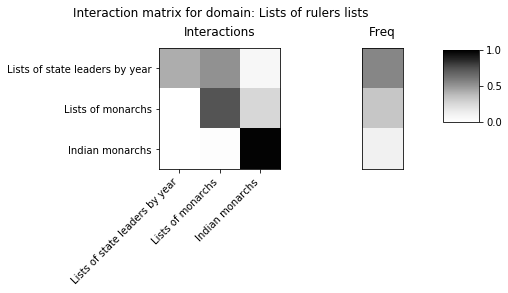

saving data in: ./WIKIdata/matrices2020/wikipedia_system_406.npz


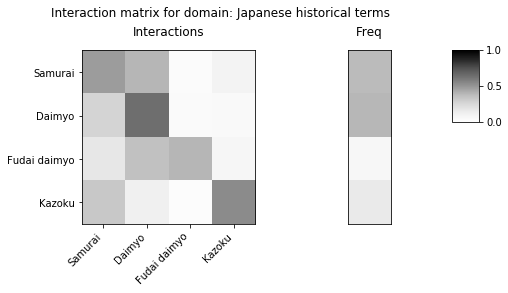

saving data in: ./WIKIdata/matrices2020/wikipedia_system_407.npz


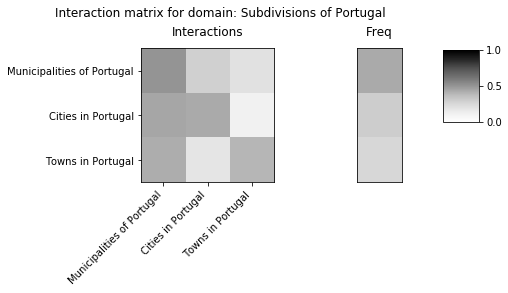

saving data in: ./WIKIdata/matrices2020/wikipedia_system_408.npz


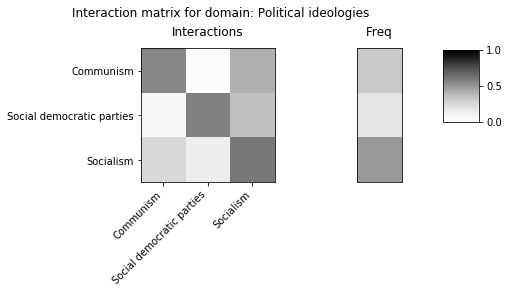

saving data in: ./WIKIdata/matrices2020/wikipedia_system_409.npz


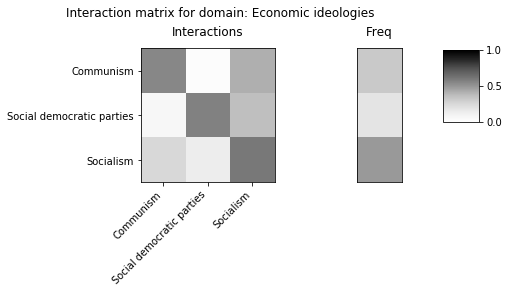

saving data in: ./WIKIdata/matrices2020/wikipedia_system_410.npz


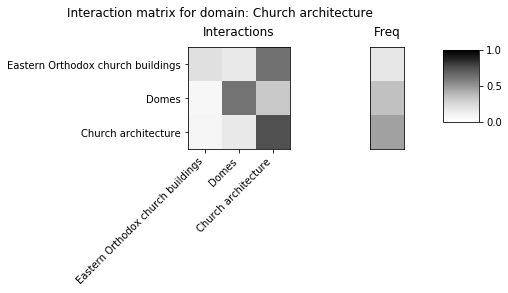

saving data in: ./WIKIdata/matrices2020/wikipedia_system_411.npz


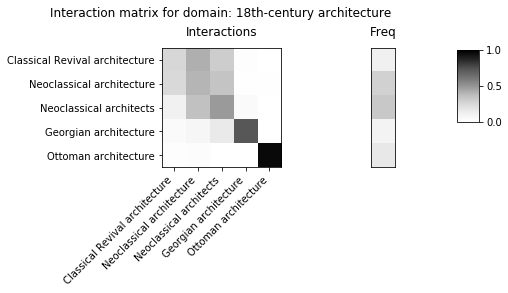

saving data in: ./WIKIdata/matrices2020/wikipedia_system_412.npz


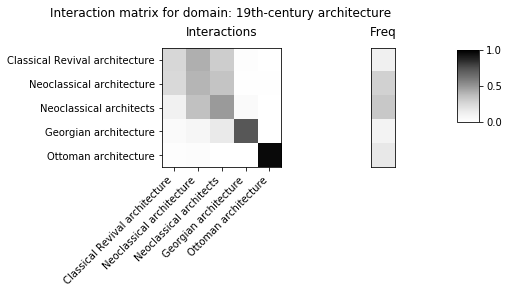

saving data in: ./WIKIdata/matrices2020/wikipedia_system_413.npz


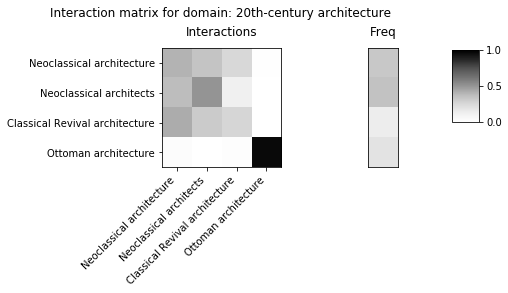

saving data in: ./WIKIdata/matrices2020/wikipedia_system_414.npz


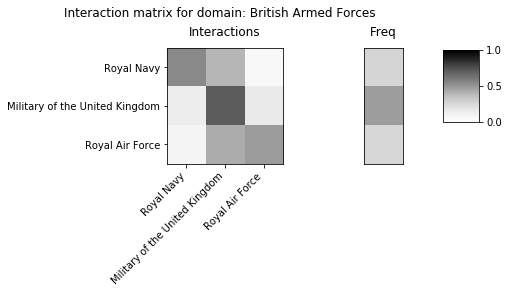

saving data in: ./WIKIdata/matrices2020/wikipedia_system_415.npz


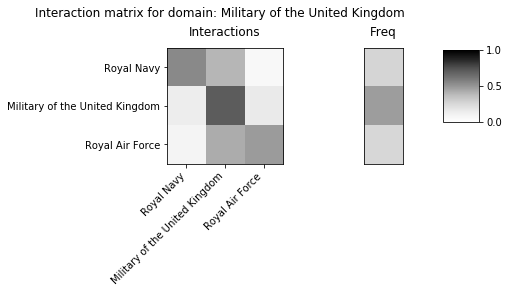

saving data in: ./WIKIdata/matrices2020/wikipedia_system_416.npz


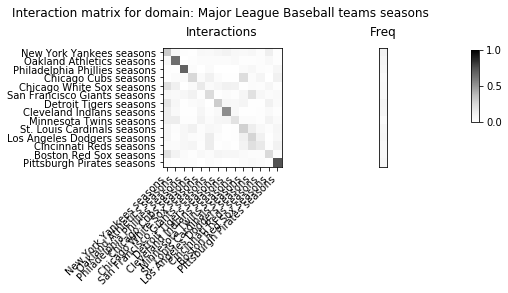

saving data in: ./WIKIdata/matrices2020/wikipedia_system_417.npz


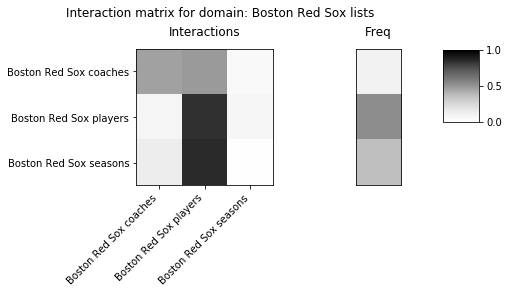

saving data in: ./WIKIdata/matrices2020/wikipedia_system_418.npz


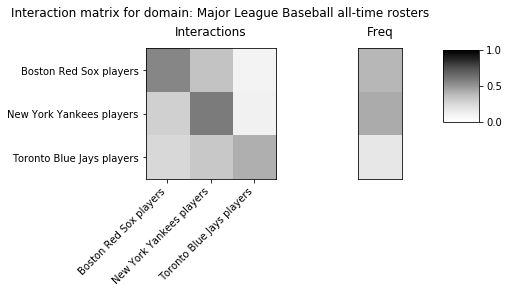

saving data in: ./WIKIdata/matrices2020/wikipedia_system_419.npz


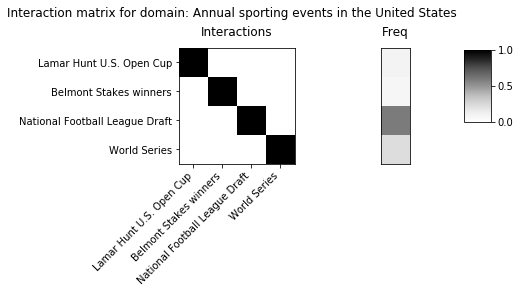

saving data in: ./WIKIdata/matrices2020/wikipedia_system_420.npz


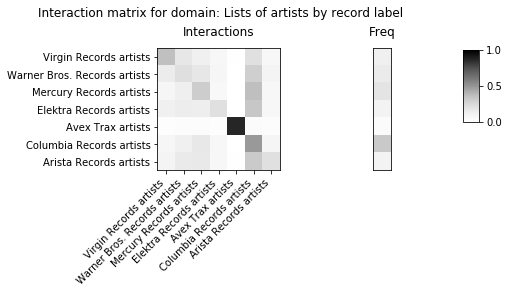

saving data in: ./WIKIdata/matrices2020/wikipedia_system_421.npz


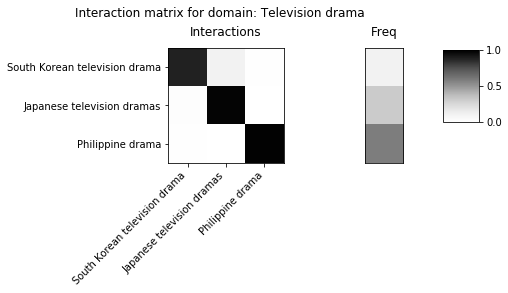

saving data in: ./WIKIdata/matrices2020/wikipedia_system_422.npz


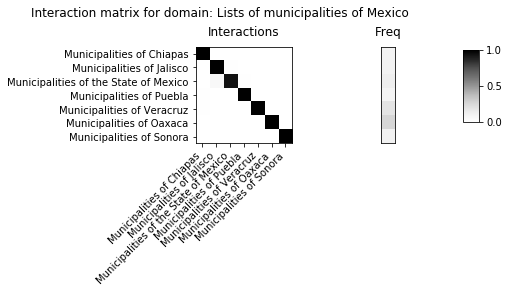

saving data in: ./WIKIdata/matrices2020/wikipedia_system_423.npz


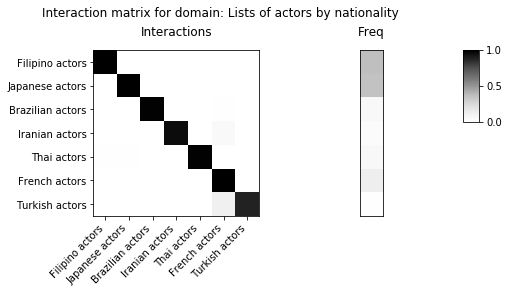

saving data in: ./WIKIdata/matrices2020/wikipedia_system_424.npz


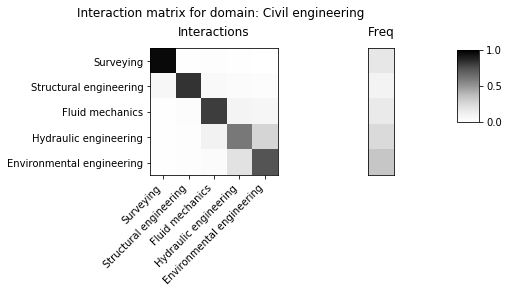

saving data in: ./WIKIdata/matrices2020/wikipedia_system_425.npz


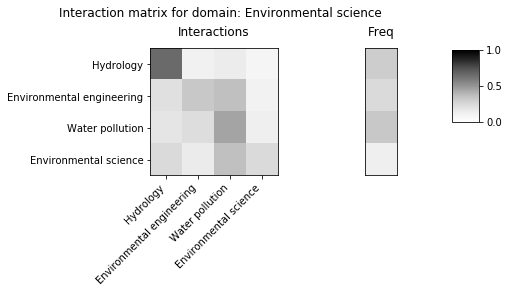

saving data in: ./WIKIdata/matrices2020/wikipedia_system_426.npz


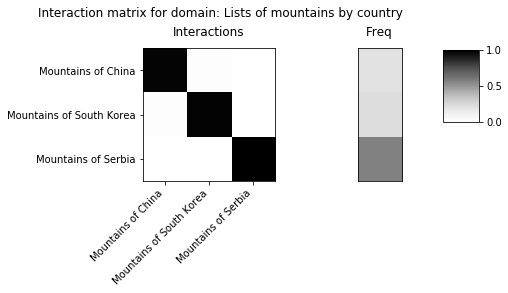

saving data in: ./WIKIdata/matrices2020/wikipedia_system_427.npz


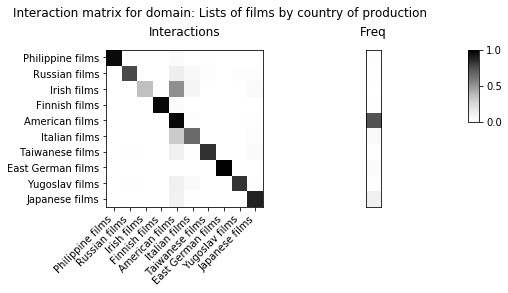

saving data in: ./WIKIdata/matrices2020/wikipedia_system_428.npz


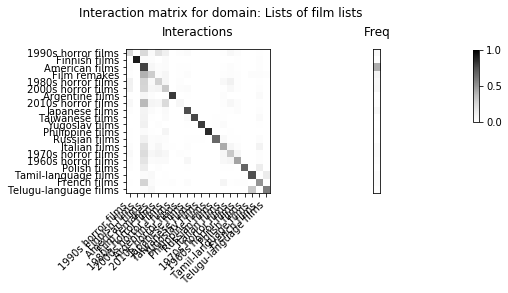

saving data in: ./WIKIdata/matrices2020/wikipedia_system_429.npz


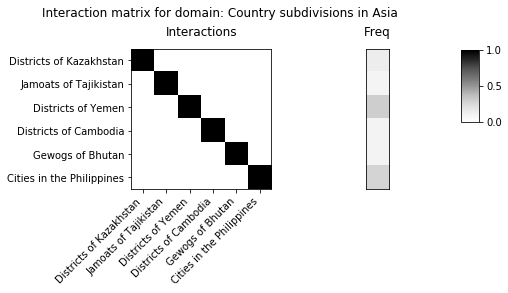

saving data in: ./WIKIdata/matrices2020/wikipedia_system_430.npz


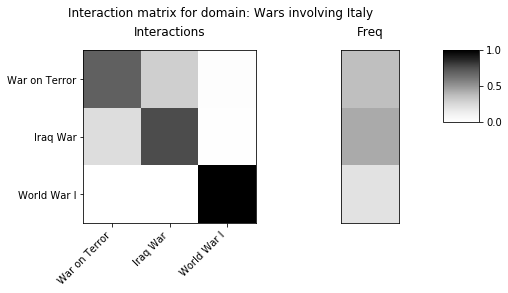

saving data in: ./WIKIdata/matrices2020/wikipedia_system_431.npz


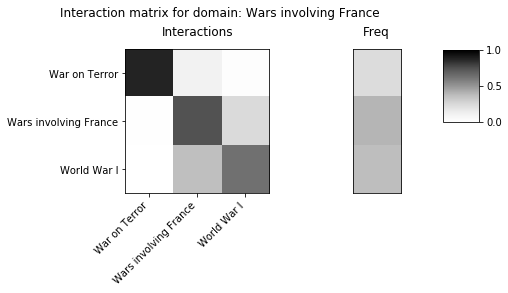

saving data in: ./WIKIdata/matrices2020/wikipedia_system_432.npz


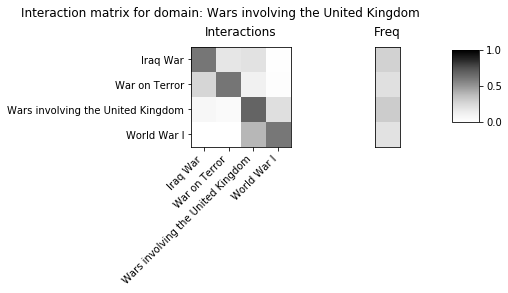

saving data in: ./WIKIdata/matrices2020/wikipedia_system_433.npz


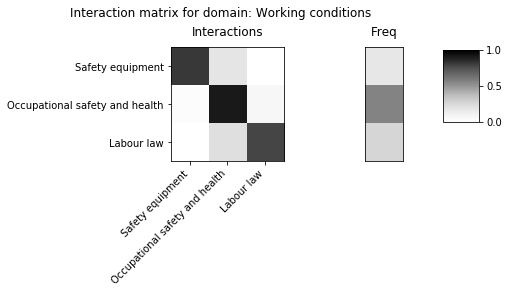

saving data in: ./WIKIdata/matrices2020/wikipedia_system_434.npz


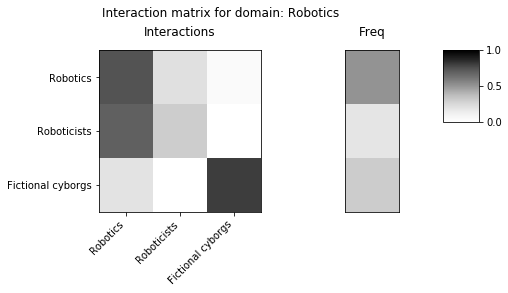

saving data in: ./WIKIdata/matrices2020/wikipedia_system_435.npz


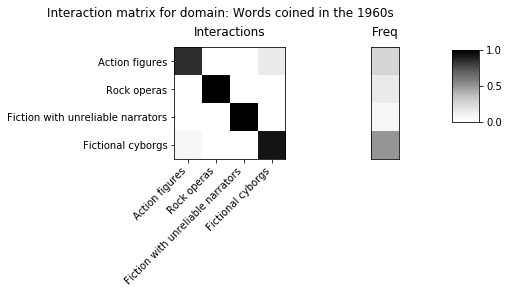

saving data in: ./WIKIdata/matrices2020/wikipedia_system_436.npz


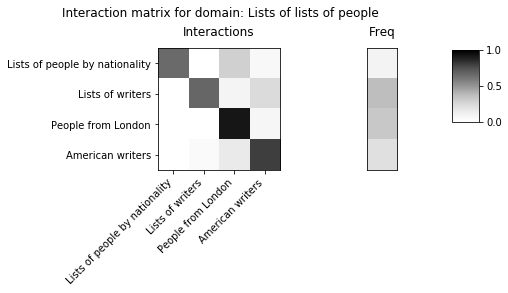

saving data in: ./WIKIdata/matrices2020/wikipedia_system_437.npz


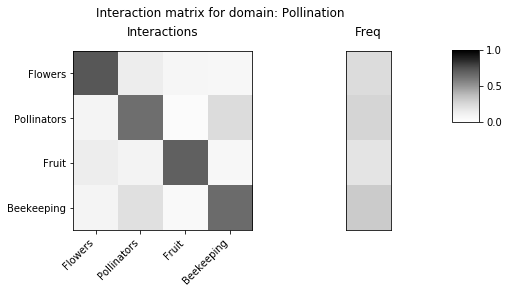

saving data in: ./WIKIdata/matrices2020/wikipedia_system_438.npz


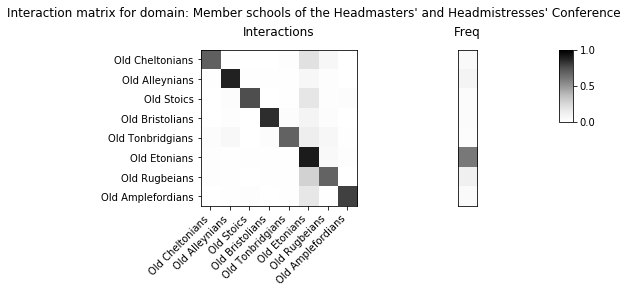

saving data in: ./WIKIdata/matrices2020/wikipedia_system_439.npz


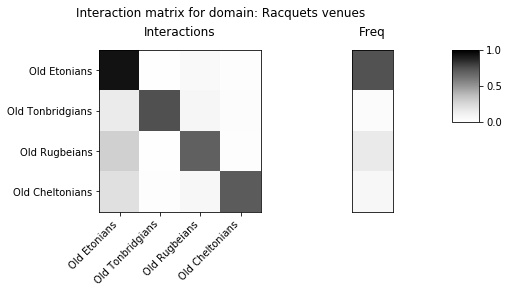

saving data in: ./WIKIdata/matrices2020/wikipedia_system_440.npz


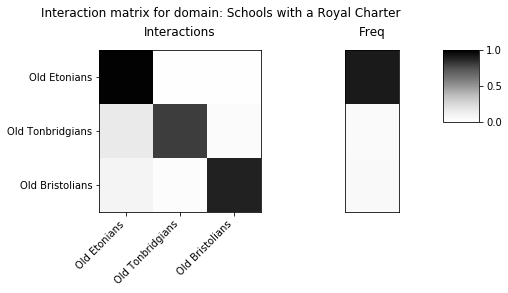

saving data in: ./WIKIdata/matrices2020/wikipedia_system_441.npz


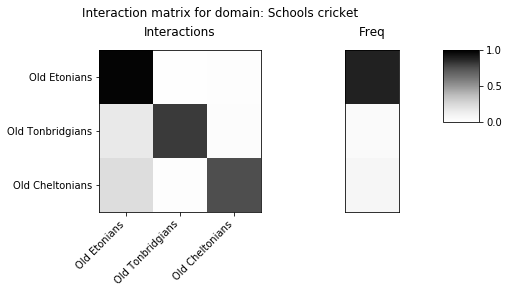

saving data in: ./WIKIdata/matrices2020/wikipedia_system_442.npz


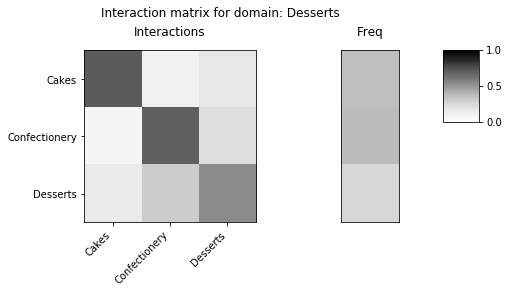

saving data in: ./WIKIdata/matrices2020/wikipedia_system_443.npz


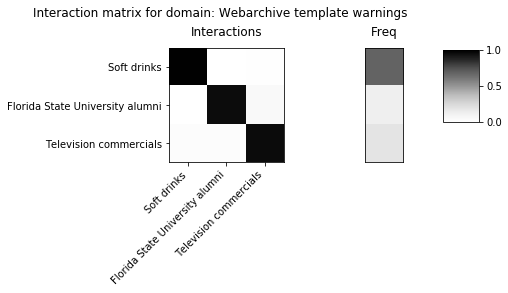

saving data in: ./WIKIdata/matrices2020/wikipedia_system_444.npz


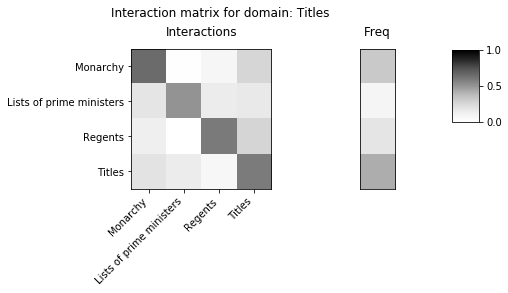

saving data in: ./WIKIdata/matrices2020/wikipedia_system_445.npz


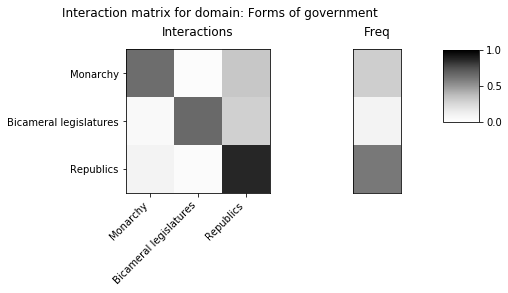

saving data in: ./WIKIdata/matrices2020/wikipedia_system_446.npz


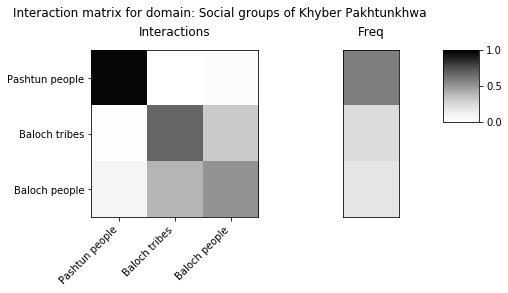

saving data in: ./WIKIdata/matrices2020/wikipedia_system_447.npz


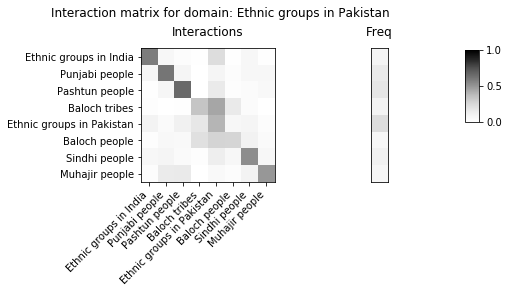

saving data in: ./WIKIdata/matrices2020/wikipedia_system_448.npz


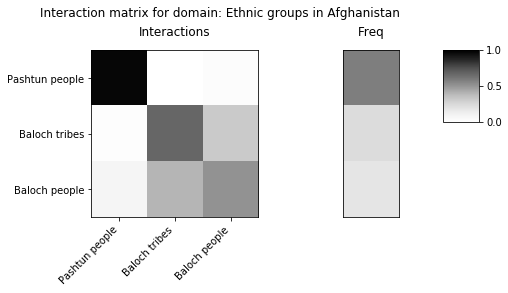

saving data in: ./WIKIdata/matrices2020/wikipedia_system_449.npz


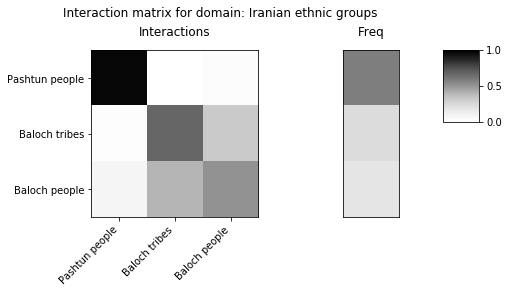

saving data in: ./WIKIdata/matrices2020/wikipedia_system_450.npz


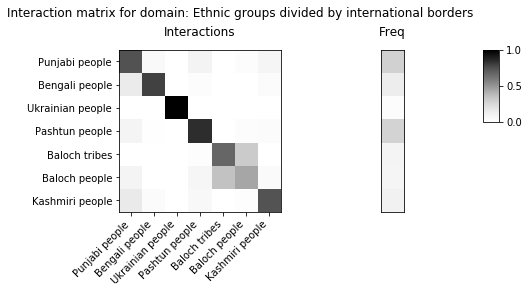

saving data in: ./WIKIdata/matrices2020/wikipedia_system_451.npz


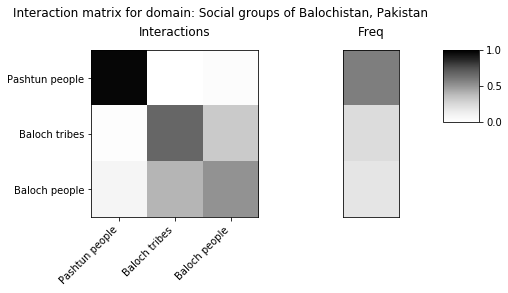

saving data in: ./WIKIdata/matrices2020/wikipedia_system_452.npz


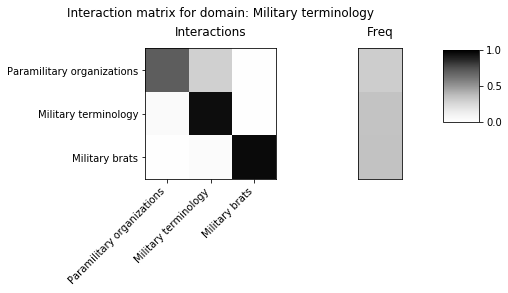

saving data in: ./WIKIdata/matrices2020/wikipedia_system_453.npz


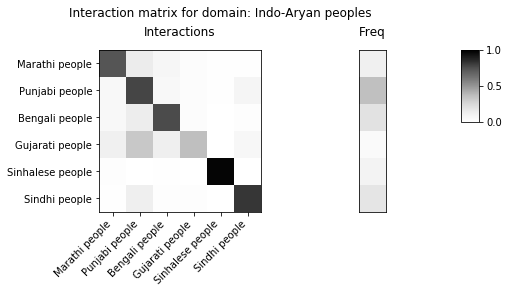

saving data in: ./WIKIdata/matrices2020/wikipedia_system_454.npz


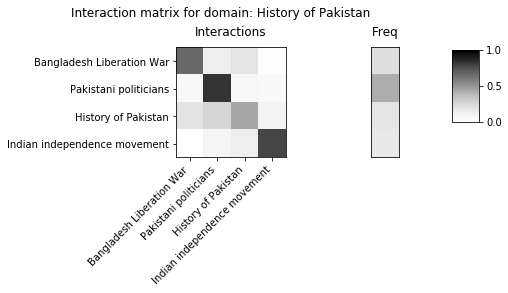

saving data in: ./WIKIdata/matrices2020/wikipedia_system_455.npz


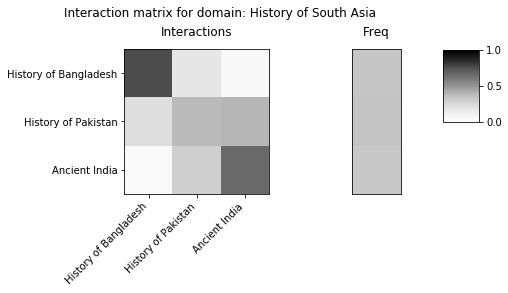

saving data in: ./WIKIdata/matrices2020/wikipedia_system_456.npz


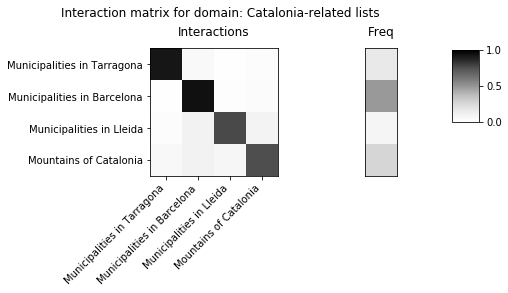

saving data in: ./WIKIdata/matrices2020/wikipedia_system_457.npz


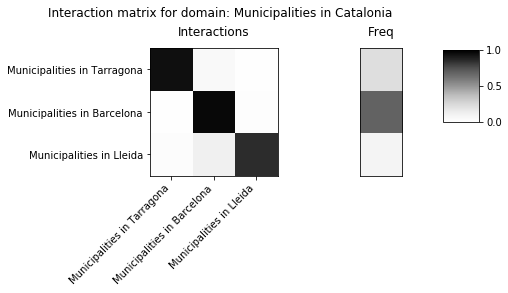

saving data in: ./WIKIdata/matrices2020/wikipedia_system_458.npz


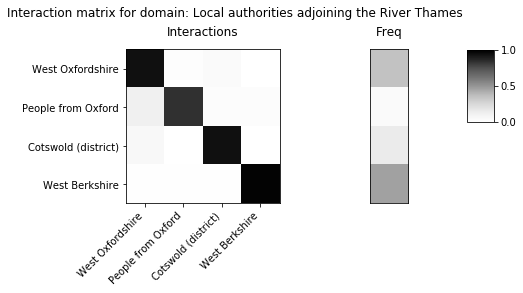

saving data in: ./WIKIdata/matrices2020/wikipedia_system_459.npz


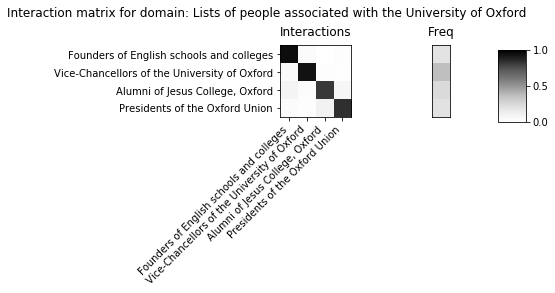

saving data in: ./WIKIdata/matrices2020/wikipedia_system_460.npz


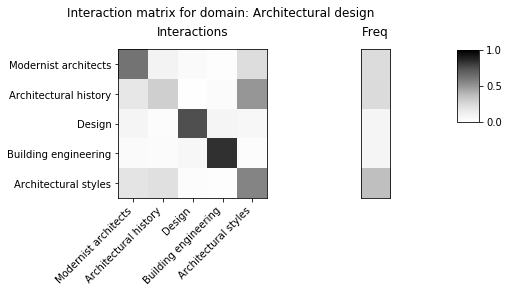

saving data in: ./WIKIdata/matrices2020/wikipedia_system_461.npz


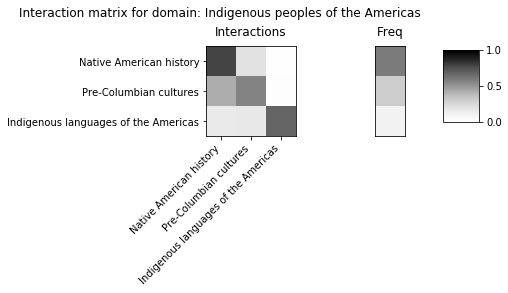

saving data in: ./WIKIdata/matrices2020/wikipedia_system_462.npz


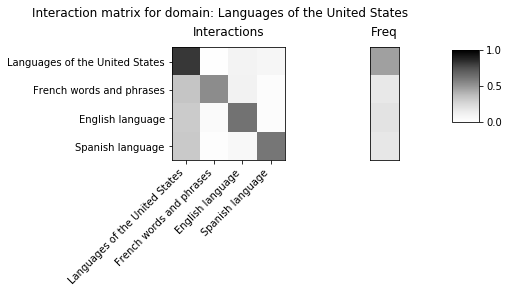

saving data in: ./WIKIdata/matrices2020/wikipedia_system_463.npz


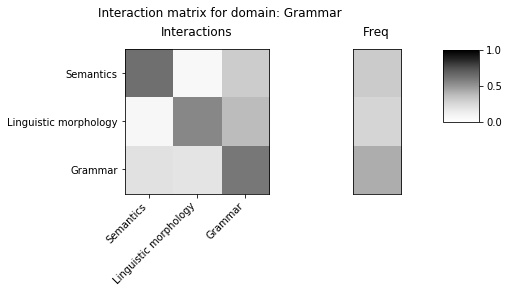

saving data in: ./WIKIdata/matrices2020/wikipedia_system_464.npz


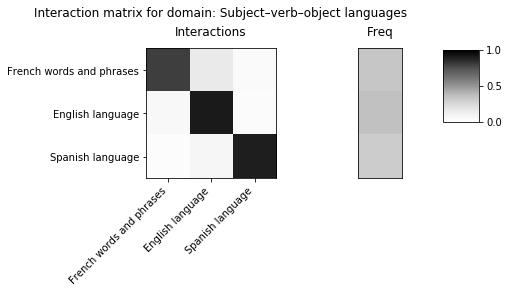

saving data in: ./WIKIdata/matrices2020/wikipedia_system_465.npz


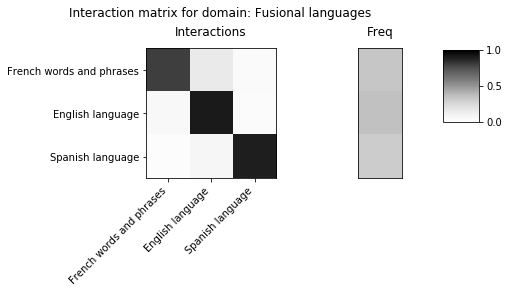

saving data in: ./WIKIdata/matrices2020/wikipedia_system_466.npz


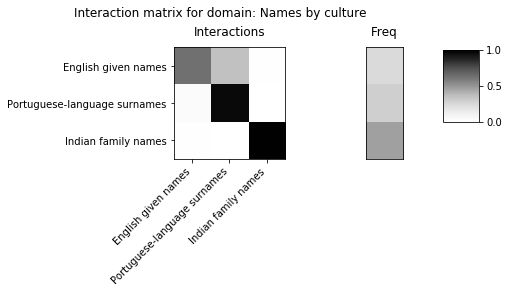

saving data in: ./WIKIdata/matrices2020/wikipedia_system_467.npz


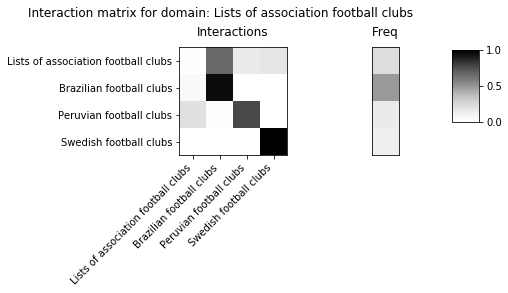

saving data in: ./WIKIdata/matrices2020/wikipedia_system_468.npz


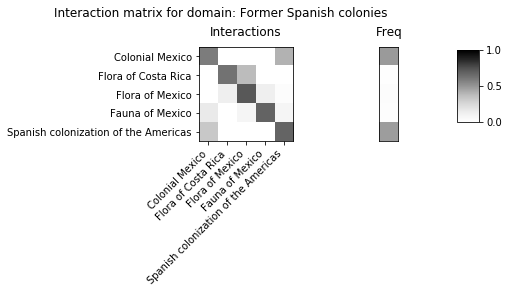

saving data in: ./WIKIdata/matrices2020/wikipedia_system_469.npz


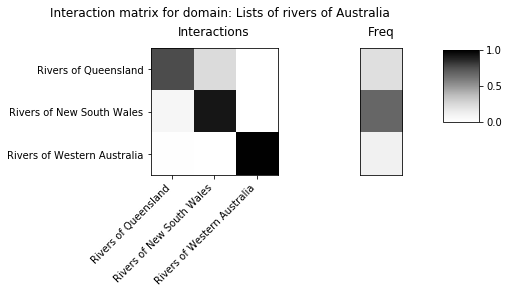

saving data in: ./WIKIdata/matrices2020/wikipedia_system_470.npz


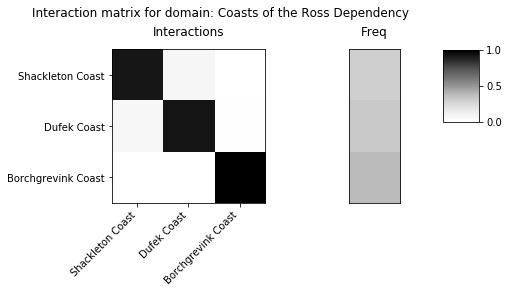

saving data in: ./WIKIdata/matrices2020/wikipedia_system_471.npz


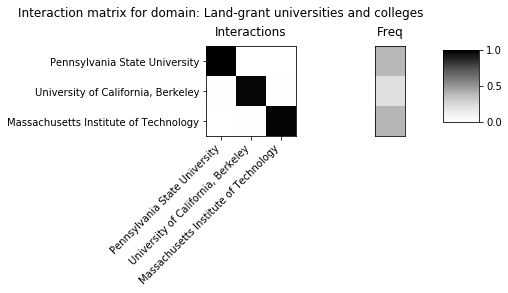

saving data in: ./WIKIdata/matrices2020/wikipedia_system_472.npz


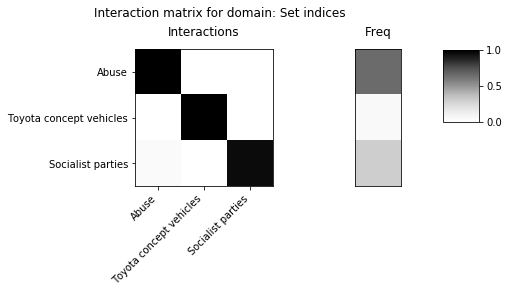

saving data in: ./WIKIdata/matrices2020/wikipedia_system_473.npz


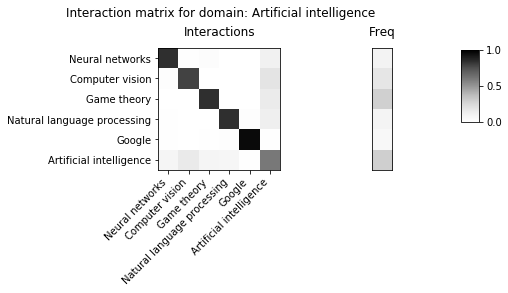

saving data in: ./WIKIdata/matrices2020/wikipedia_system_474.npz


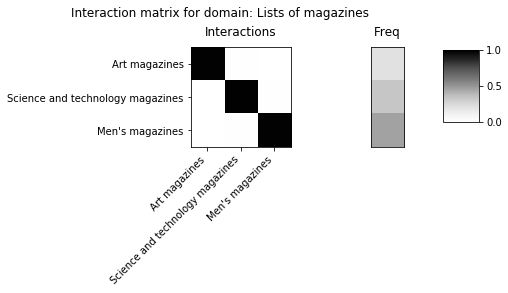

saving data in: ./WIKIdata/matrices2020/wikipedia_system_475.npz


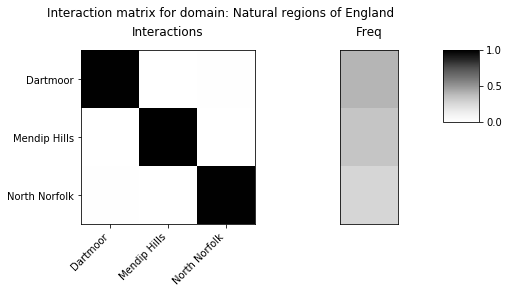

saving data in: ./WIKIdata/matrices2020/wikipedia_system_476.npz


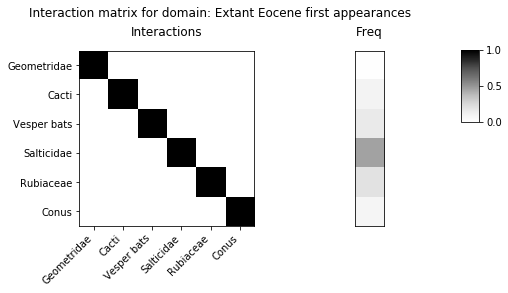

saving data in: ./WIKIdata/matrices2020/wikipedia_system_477.npz


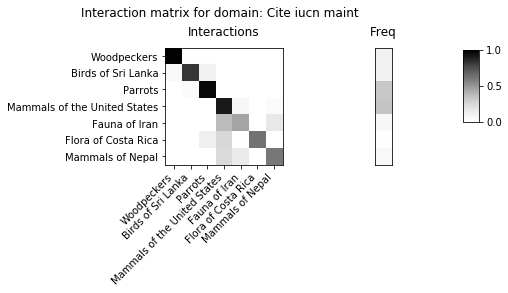

saving data in: ./WIKIdata/matrices2020/wikipedia_system_478.npz


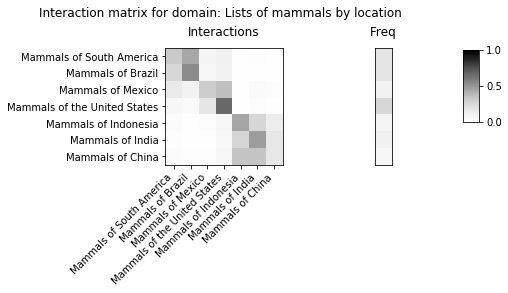

saving data in: ./WIKIdata/matrices2020/wikipedia_system_479.npz


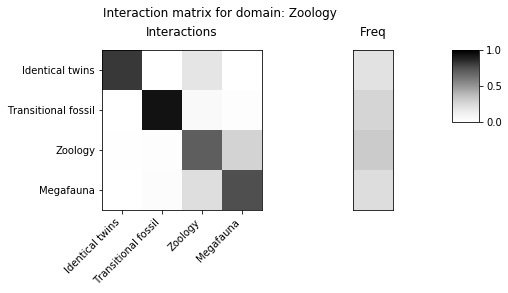

saving data in: ./WIKIdata/matrices2020/wikipedia_system_480.npz


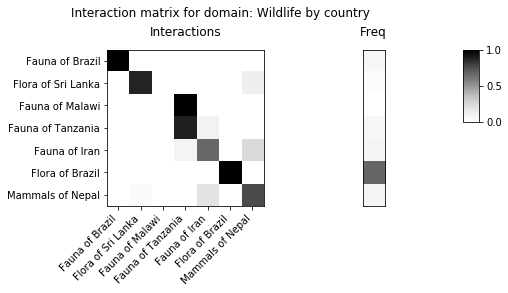

saving data in: ./WIKIdata/matrices2020/wikipedia_system_481.npz


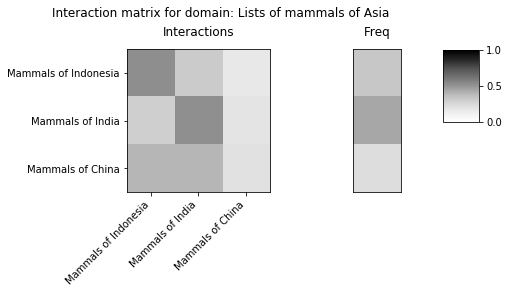

saving data in: ./WIKIdata/matrices2020/wikipedia_system_482.npz


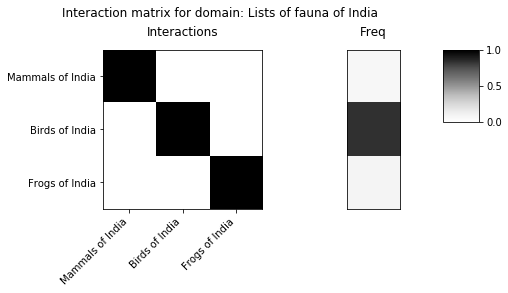

saving data in: ./WIKIdata/matrices2020/wikipedia_system_483.npz


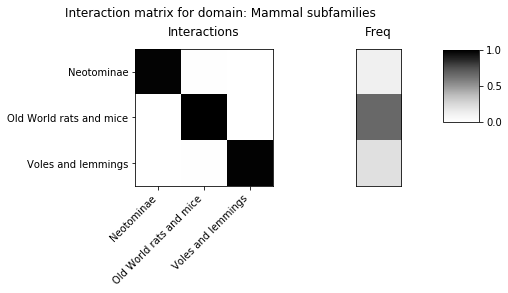

saving data in: ./WIKIdata/matrices2020/wikipedia_system_484.npz


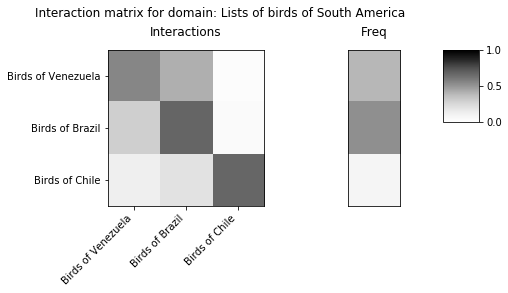

saving data in: ./WIKIdata/matrices2020/wikipedia_system_485.npz


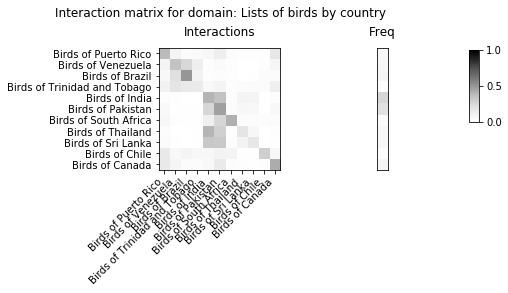

saving data in: ./WIKIdata/matrices2020/wikipedia_system_486.npz


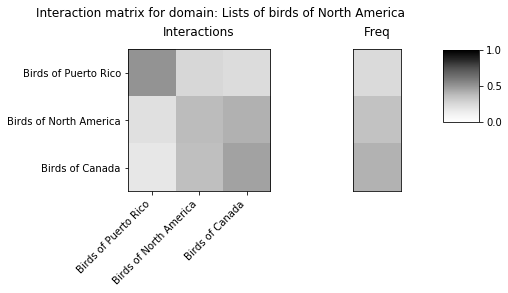

saving data in: ./WIKIdata/matrices2020/wikipedia_system_487.npz


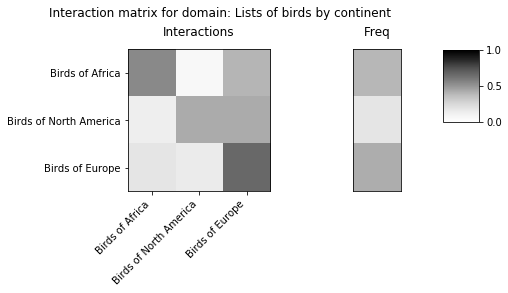

saving data in: ./WIKIdata/matrices2020/wikipedia_system_488.npz


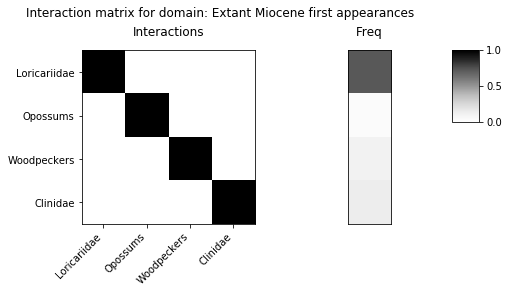

saving data in: ./WIKIdata/matrices2020/wikipedia_system_489.npz


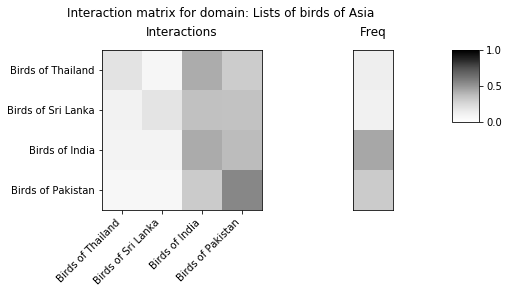

saving data in: ./WIKIdata/matrices2020/wikipedia_system_490.npz


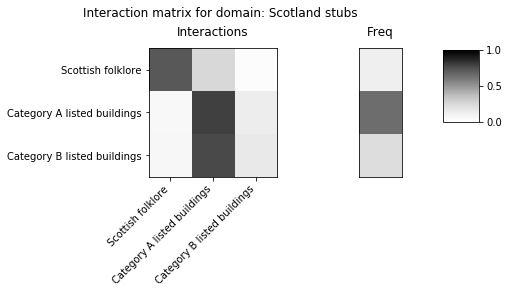

saving data in: ./WIKIdata/matrices2020/wikipedia_system_491.npz


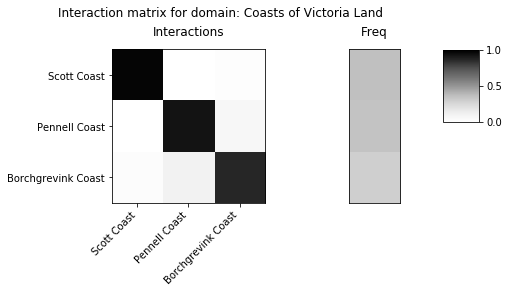

saving data in: ./WIKIdata/matrices2020/wikipedia_system_492.npz


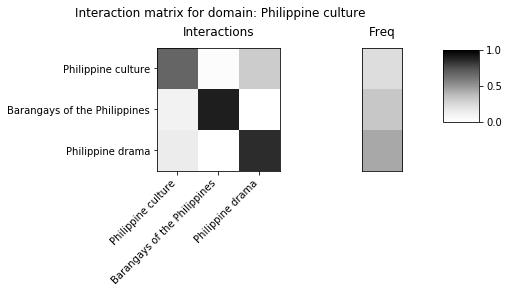

saving data in: ./WIKIdata/matrices2020/wikipedia_system_493.npz


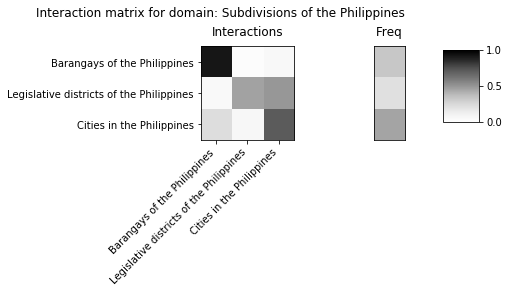

saving data in: ./WIKIdata/matrices2020/wikipedia_system_494.npz


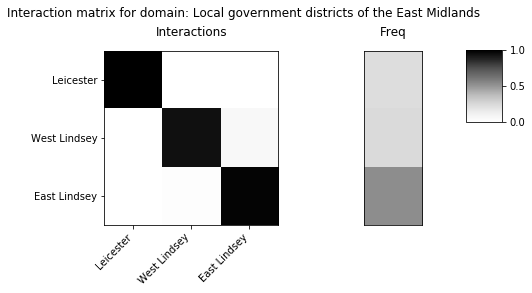

saving data in: ./WIKIdata/matrices2020/wikipedia_system_495.npz


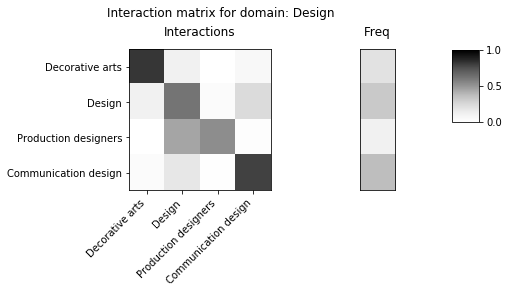

saving data in: ./WIKIdata/matrices2020/wikipedia_system_496.npz


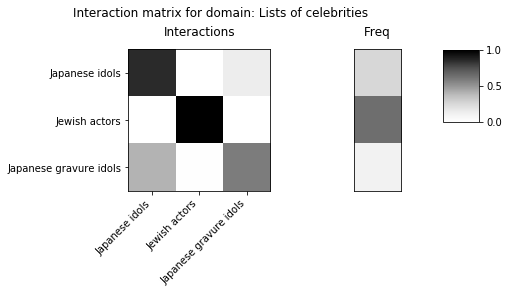

saving data in: ./WIKIdata/matrices2020/wikipedia_system_497.npz


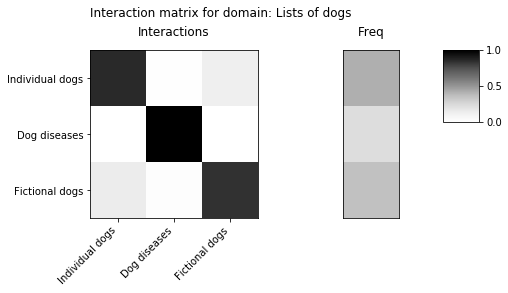

saving data in: ./WIKIdata/matrices2020/wikipedia_system_498.npz


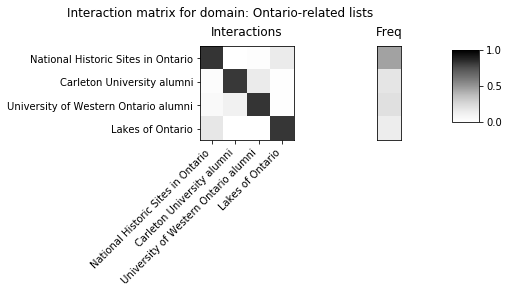

saving data in: ./WIKIdata/matrices2020/wikipedia_system_499.npz


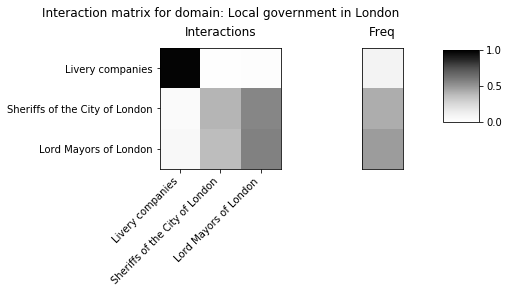

saving data in: ./WIKIdata/matrices2020/wikipedia_system_500.npz


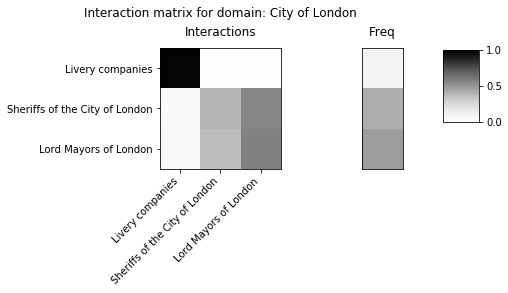

saving data in: ./WIKIdata/matrices2020/wikipedia_system_501.npz


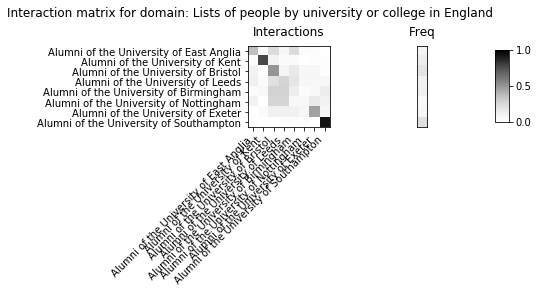

saving data in: ./WIKIdata/matrices2020/wikipedia_system_502.npz


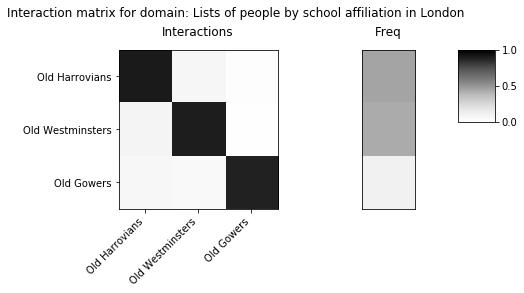

saving data in: ./WIKIdata/matrices2020/wikipedia_system_503.npz


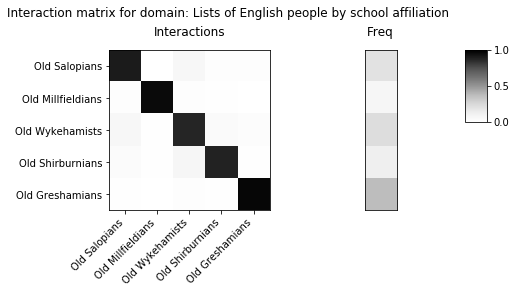

saving data in: ./WIKIdata/matrices2020/wikipedia_system_504.npz


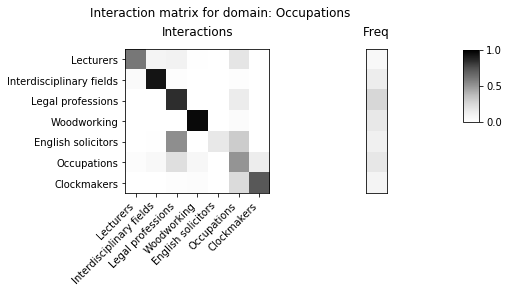

saving data in: ./WIKIdata/matrices2020/wikipedia_system_505.npz


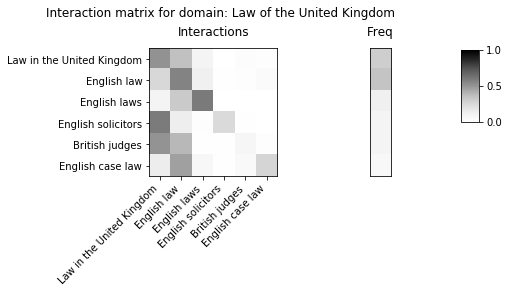

saving data in: ./WIKIdata/matrices2020/wikipedia_system_506.npz


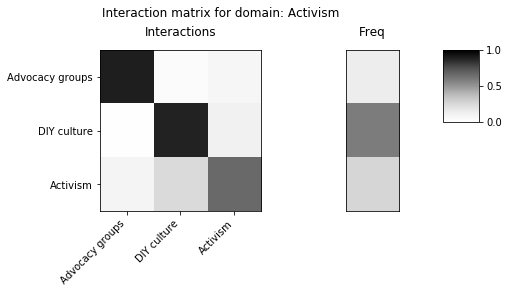

saving data in: ./WIKIdata/matrices2020/wikipedia_system_507.npz


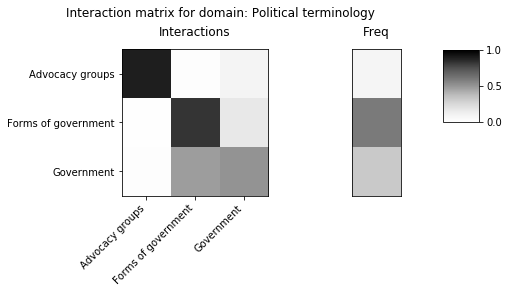

saving data in: ./WIKIdata/matrices2020/wikipedia_system_508.npz


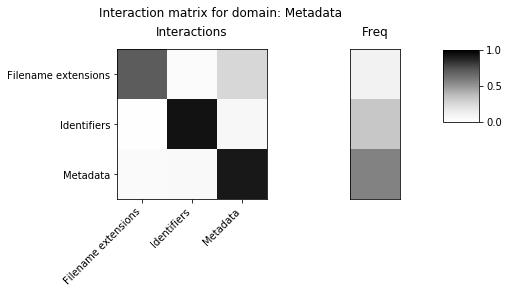

saving data in: ./WIKIdata/matrices2020/wikipedia_system_509.npz


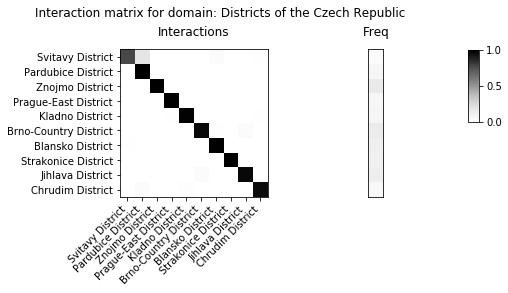

saving data in: ./WIKIdata/matrices2020/wikipedia_system_510.npz


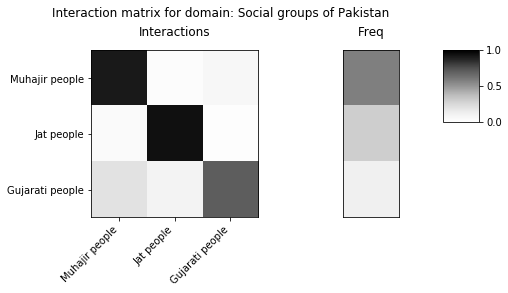

saving data in: ./WIKIdata/matrices2020/wikipedia_system_511.npz


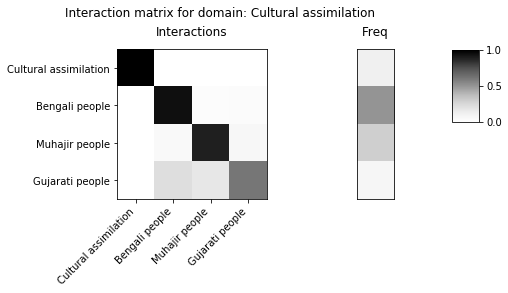

saving data in: ./WIKIdata/matrices2020/wikipedia_system_512.npz


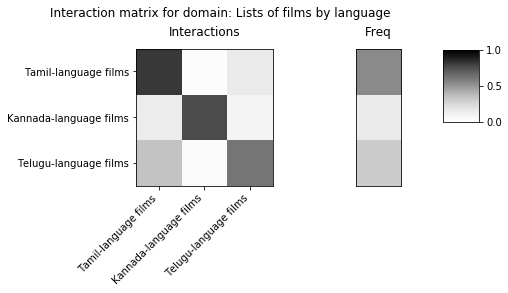

saving data in: ./WIKIdata/matrices2020/wikipedia_system_513.npz


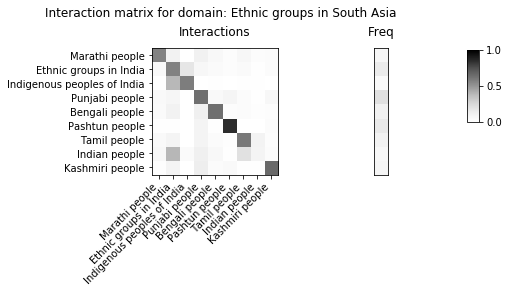

saving data in: ./WIKIdata/matrices2020/wikipedia_system_514.npz


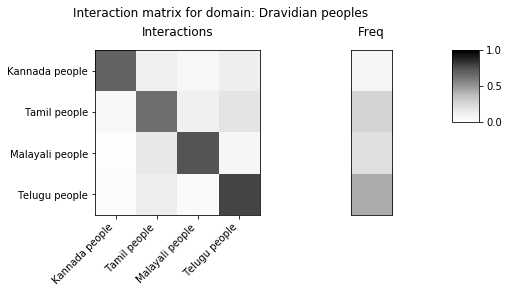

saving data in: ./WIKIdata/matrices2020/wikipedia_system_515.npz


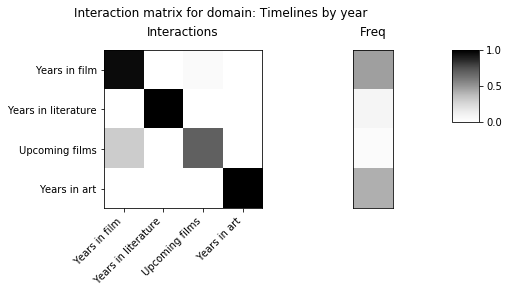

saving data in: ./WIKIdata/matrices2020/wikipedia_system_516.npz


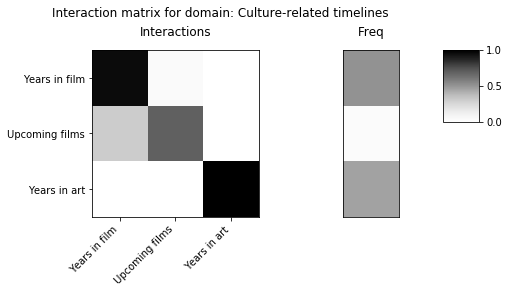

saving data in: ./WIKIdata/matrices2020/wikipedia_system_517.npz


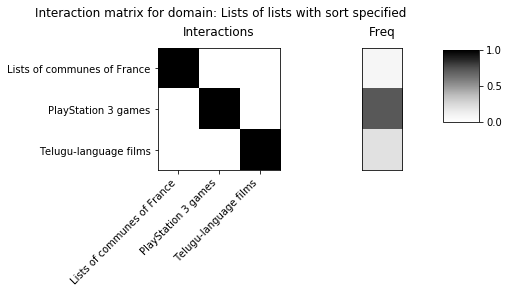

saving data in: ./WIKIdata/matrices2020/wikipedia_system_518.npz


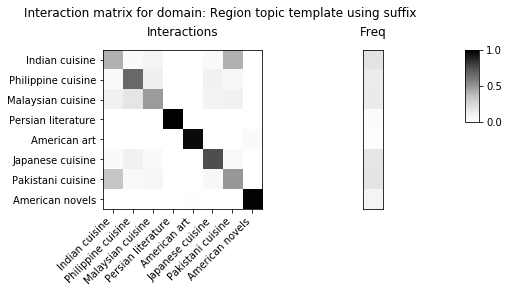

saving data in: ./WIKIdata/matrices2020/wikipedia_system_519.npz


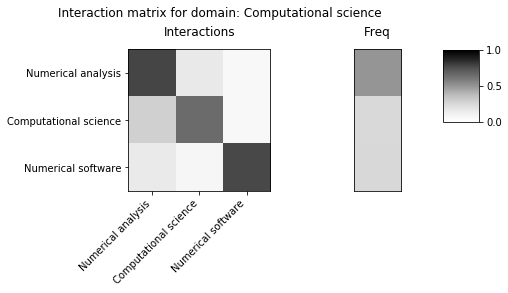

saving data in: ./WIKIdata/matrices2020/wikipedia_system_520.npz


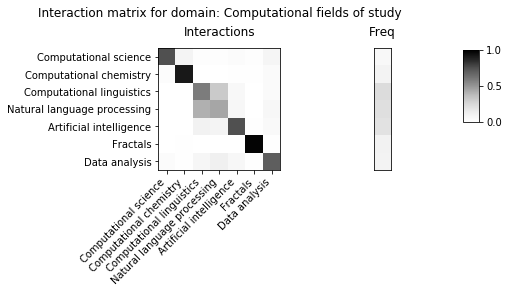

saving data in: ./WIKIdata/matrices2020/wikipedia_system_521.npz


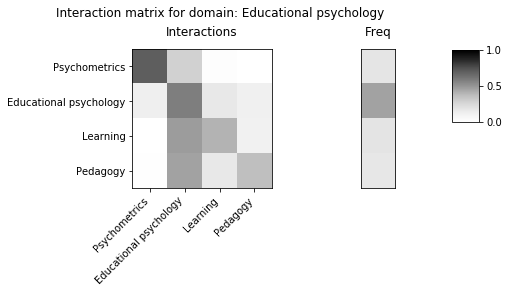

saving data in: ./WIKIdata/matrices2020/wikipedia_system_522.npz


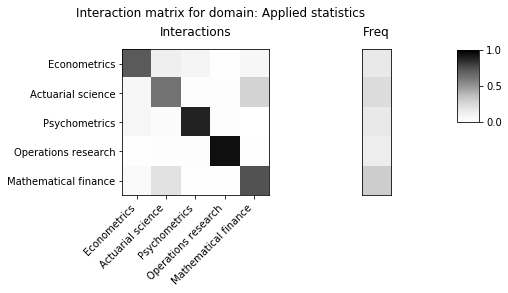

saving data in: ./WIKIdata/matrices2020/wikipedia_system_523.npz


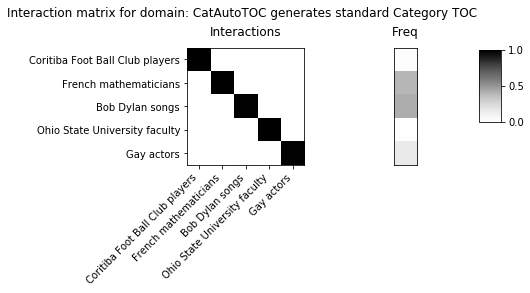

saving data in: ./WIKIdata/matrices2020/wikipedia_system_524.npz


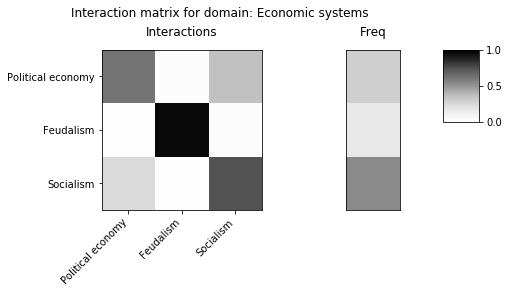

saving data in: ./WIKIdata/matrices2020/wikipedia_system_525.npz


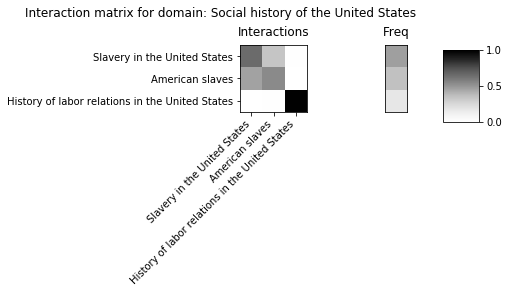

saving data in: ./WIKIdata/matrices2020/wikipedia_system_526.npz


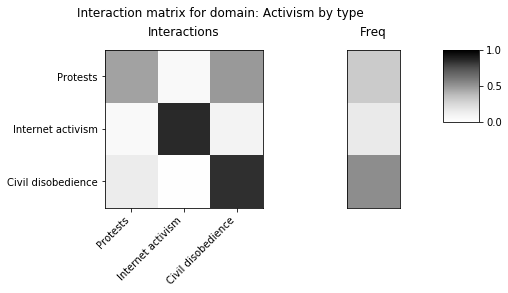

saving data in: ./WIKIdata/matrices2020/wikipedia_system_527.npz


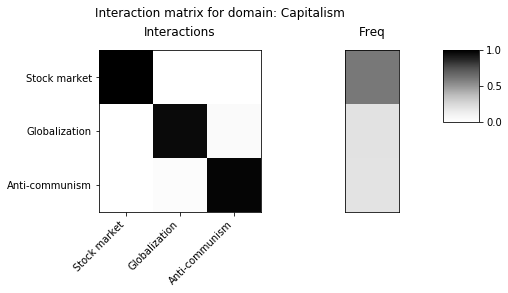

saving data in: ./WIKIdata/matrices2020/wikipedia_system_528.npz


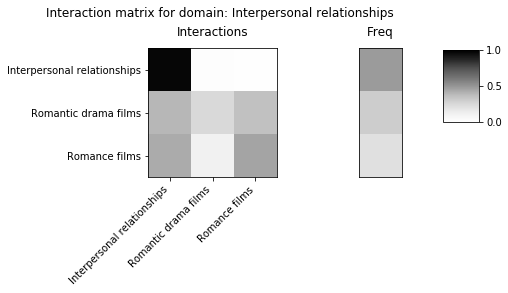

saving data in: ./WIKIdata/matrices2020/wikipedia_system_529.npz


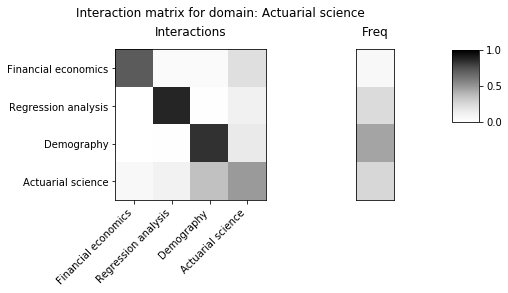

saving data in: ./WIKIdata/matrices2020/wikipedia_system_530.npz


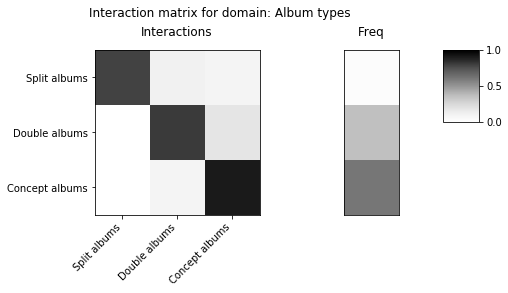

saving data in: ./WIKIdata/matrices2020/wikipedia_system_531.npz


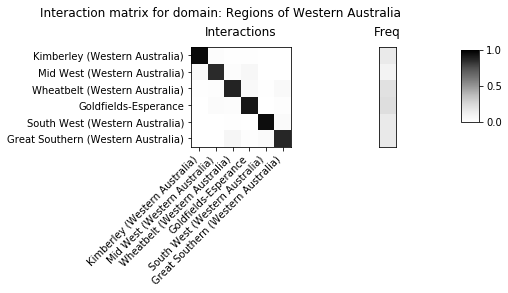

saving data in: ./WIKIdata/matrices2020/wikipedia_system_532.npz


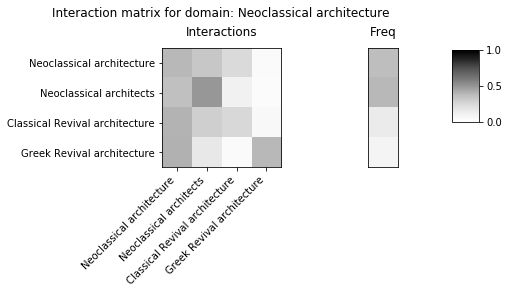

saving data in: ./WIKIdata/matrices2020/wikipedia_system_533.npz


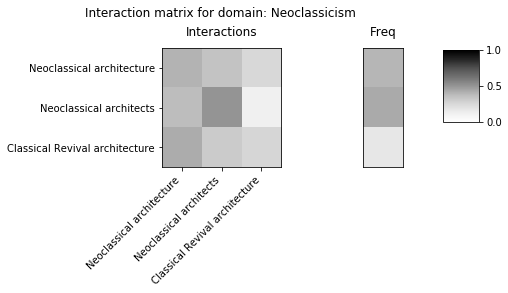

saving data in: ./WIKIdata/matrices2020/wikipedia_system_534.npz


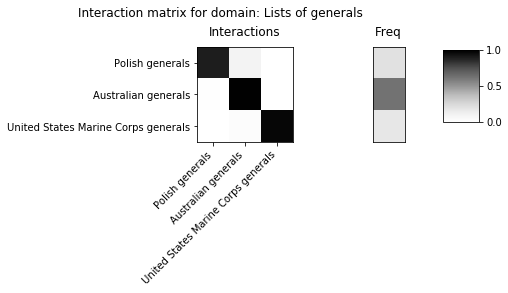

saving data in: ./WIKIdata/matrices2020/wikipedia_system_535.npz


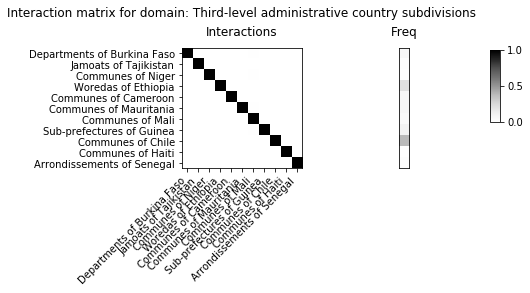

saving data in: ./WIKIdata/matrices2020/wikipedia_system_536.npz


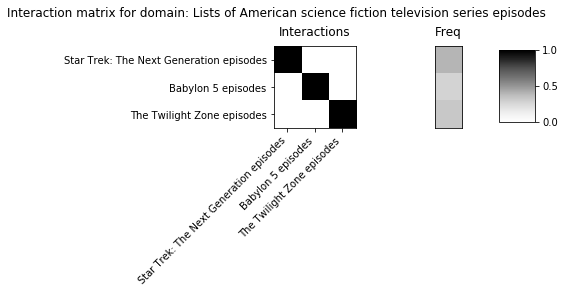

saving data in: ./WIKIdata/matrices2020/wikipedia_system_537.npz


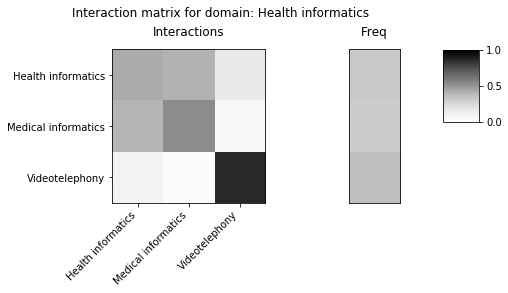

saving data in: ./WIKIdata/matrices2020/wikipedia_system_538.npz


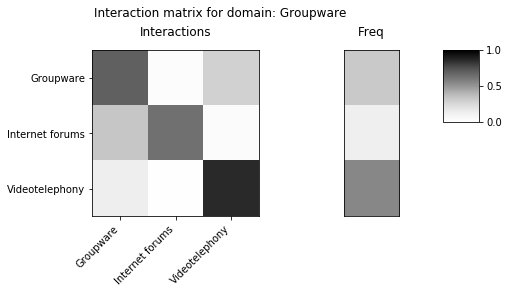

saving data in: ./WIKIdata/matrices2020/wikipedia_system_539.npz


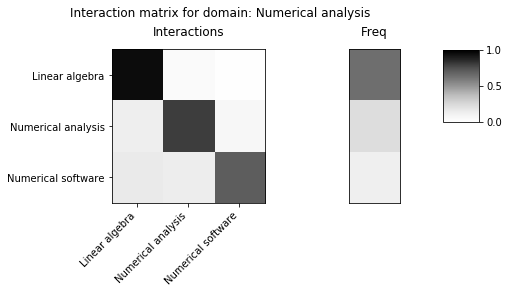

saving data in: ./WIKIdata/matrices2020/wikipedia_system_540.npz


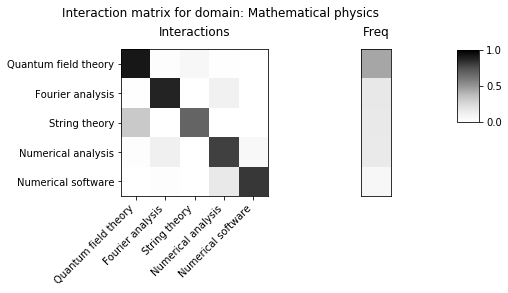

saving data in: ./WIKIdata/matrices2020/wikipedia_system_541.npz


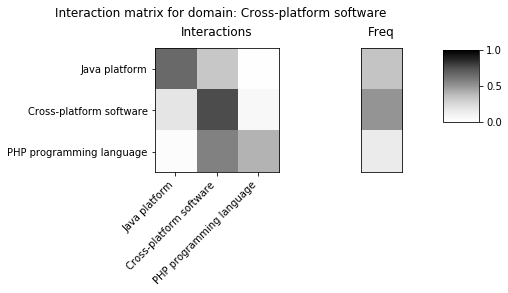

saving data in: ./WIKIdata/matrices2020/wikipedia_system_542.npz


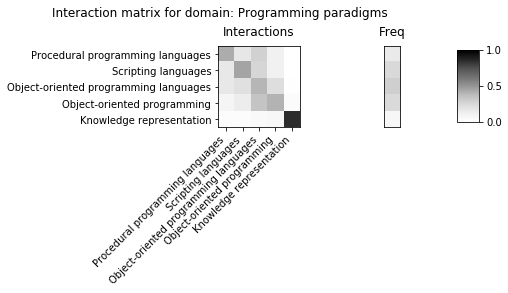

saving data in: ./WIKIdata/matrices2020/wikipedia_system_543.npz


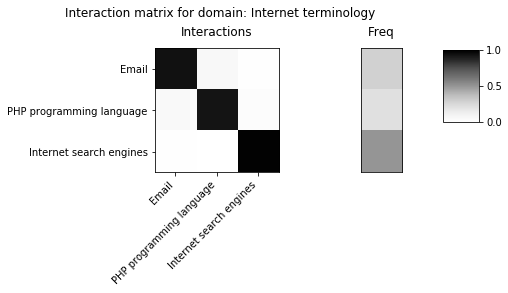

saving data in: ./WIKIdata/matrices2020/wikipedia_system_544.npz


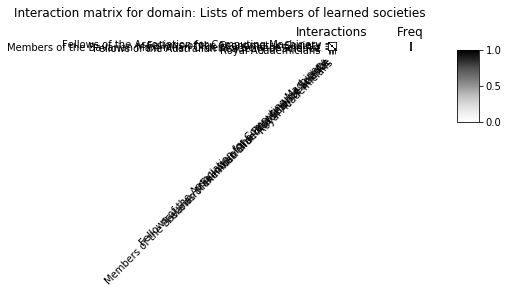

saving data in: ./WIKIdata/matrices2020/wikipedia_system_545.npz


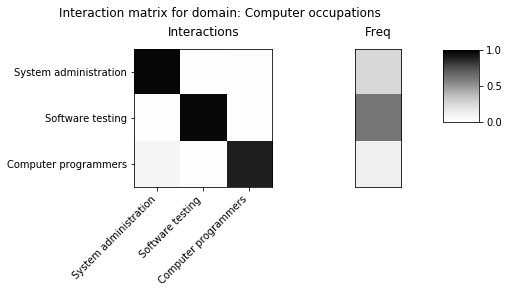

saving data in: ./WIKIdata/matrices2020/wikipedia_system_546.npz


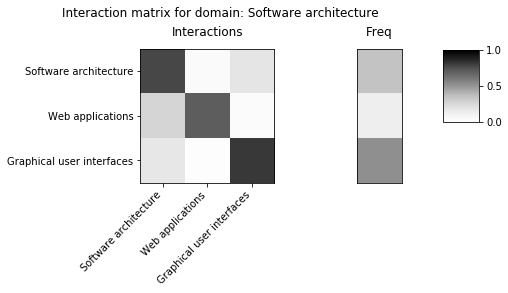

saving data in: ./WIKIdata/matrices2020/wikipedia_system_547.npz


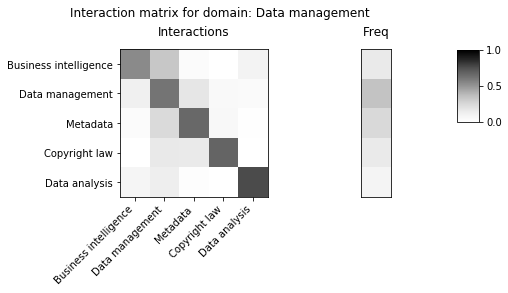

saving data in: ./WIKIdata/matrices2020/wikipedia_system_548.npz


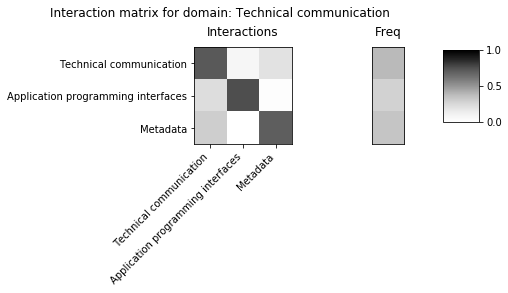

saving data in: ./WIKIdata/matrices2020/wikipedia_system_549.npz


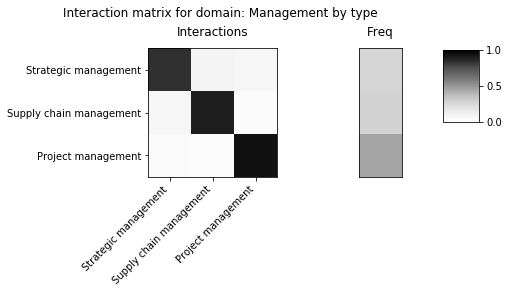

saving data in: ./WIKIdata/matrices2020/wikipedia_system_550.npz


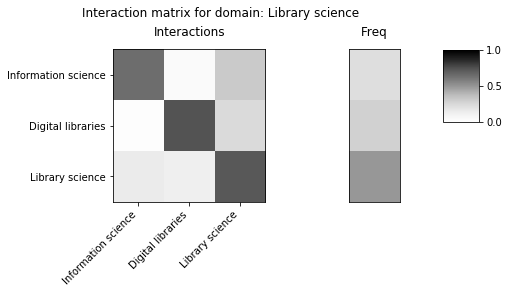

saving data in: ./WIKIdata/matrices2020/wikipedia_system_551.npz


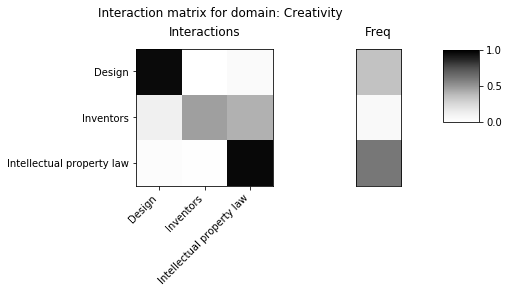

saving data in: ./WIKIdata/matrices2020/wikipedia_system_552.npz


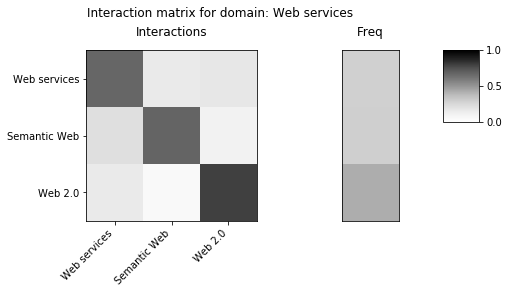

saving data in: ./WIKIdata/matrices2020/wikipedia_system_553.npz


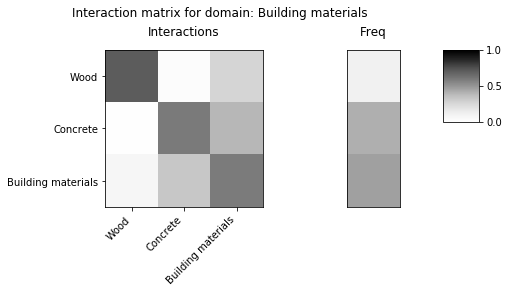

saving data in: ./WIKIdata/matrices2020/wikipedia_system_554.npz


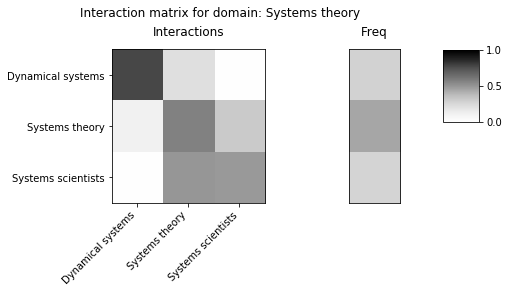

saving data in: ./WIKIdata/matrices2020/wikipedia_system_555.npz


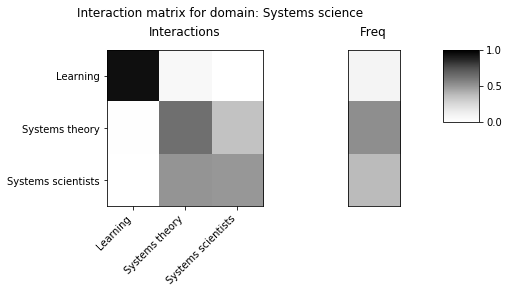

saving data in: ./WIKIdata/matrices2020/wikipedia_system_556.npz


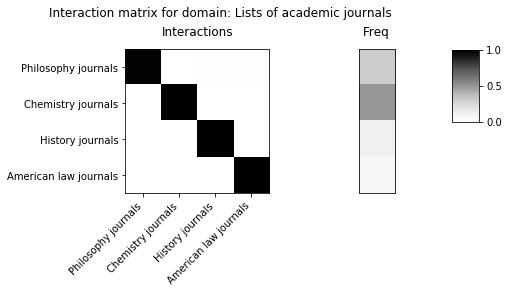

saving data in: ./WIKIdata/matrices2020/wikipedia_system_557.npz


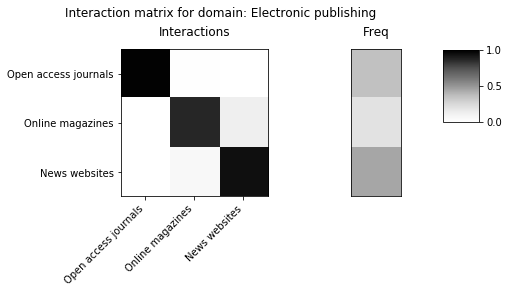

saving data in: ./WIKIdata/matrices2020/wikipedia_system_558.npz


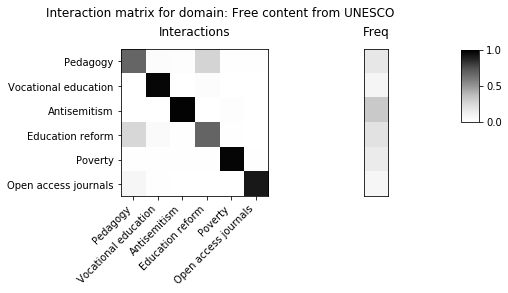

saving data in: ./WIKIdata/matrices2020/wikipedia_system_559.npz


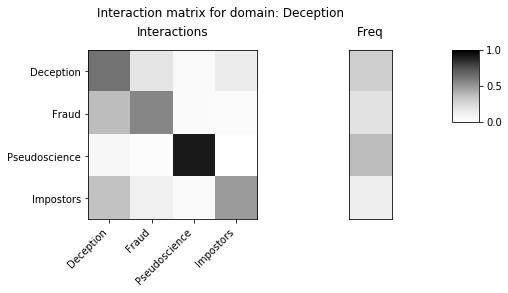

saving data in: ./WIKIdata/matrices2020/wikipedia_system_560.npz


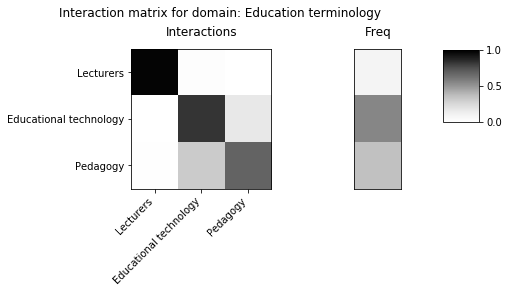

saving data in: ./WIKIdata/matrices2020/wikipedia_system_561.npz


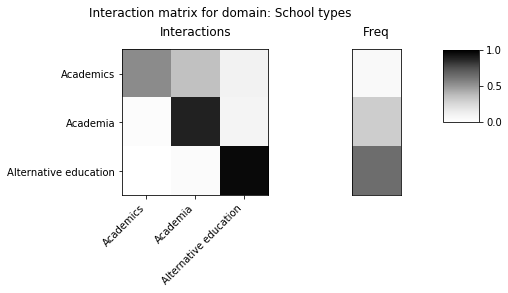

saving data in: ./WIKIdata/matrices2020/wikipedia_system_562.npz


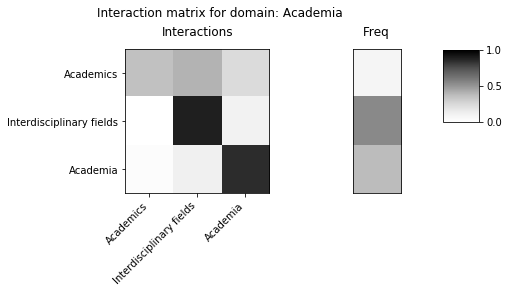

saving data in: ./WIKIdata/matrices2020/wikipedia_system_563.npz


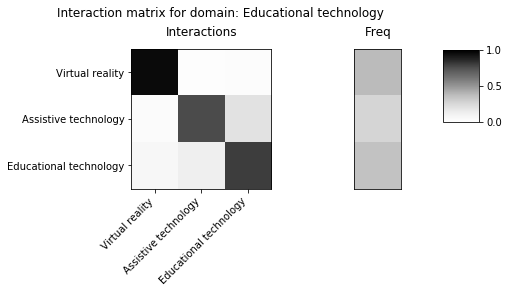

saving data in: ./WIKIdata/matrices2020/wikipedia_system_564.npz


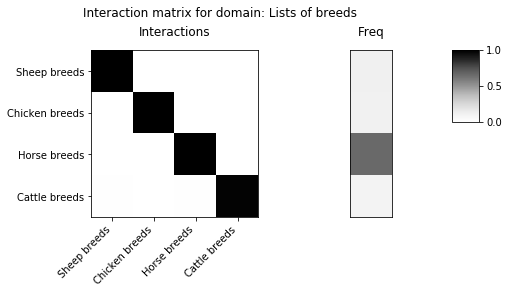

saving data in: ./WIKIdata/matrices2020/wikipedia_system_565.npz


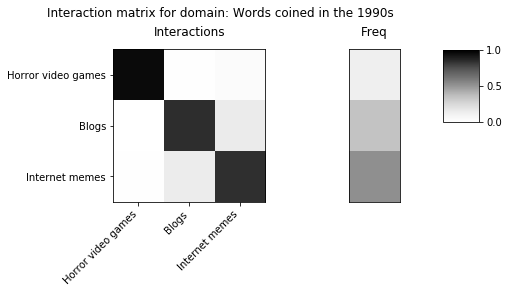

saving data in: ./WIKIdata/matrices2020/wikipedia_system_566.npz


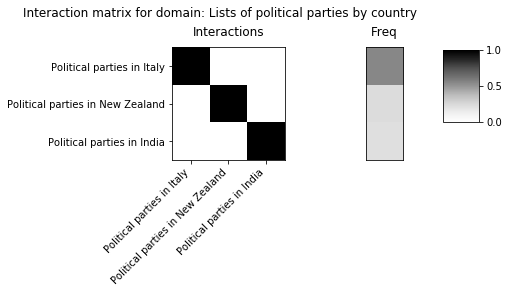

saving data in: ./WIKIdata/matrices2020/wikipedia_system_567.npz


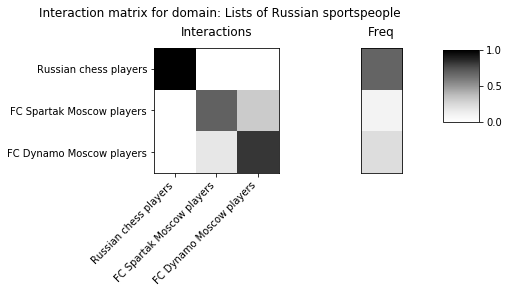

saving data in: ./WIKIdata/matrices2020/wikipedia_system_568.npz


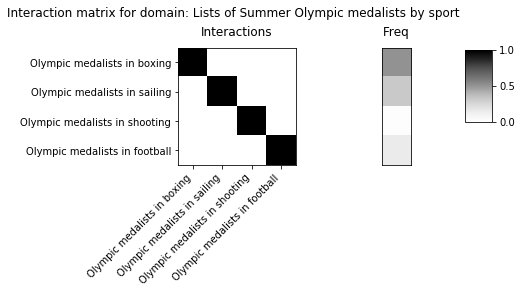

saving data in: ./WIKIdata/matrices2020/wikipedia_system_569.npz


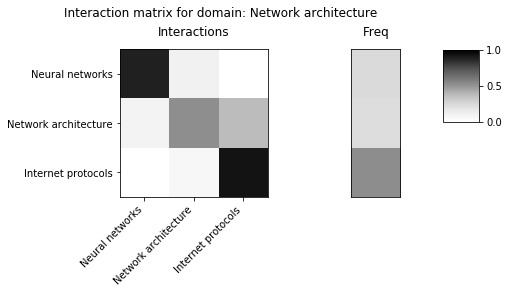

saving data in: ./WIKIdata/matrices2020/wikipedia_system_570.npz


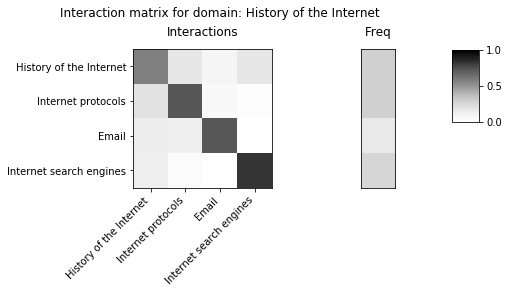

saving data in: ./WIKIdata/matrices2020/wikipedia_system_571.npz


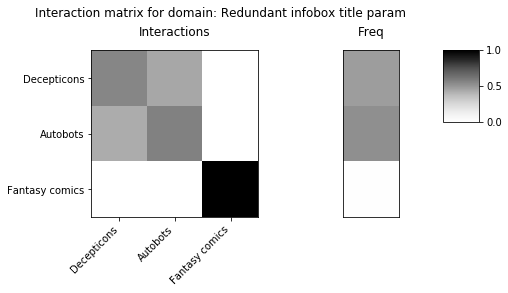

saving data in: ./WIKIdata/matrices2020/wikipedia_system_572.npz


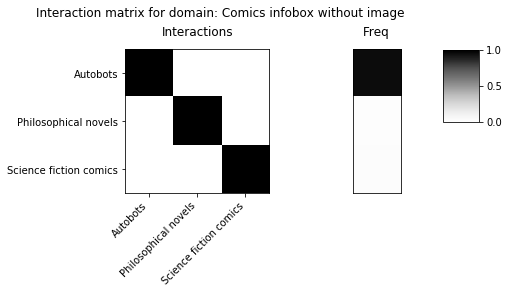

saving data in: ./WIKIdata/matrices2020/wikipedia_system_573.npz


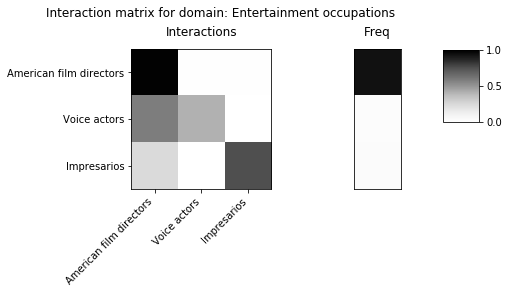

saving data in: ./WIKIdata/matrices2020/wikipedia_system_574.npz


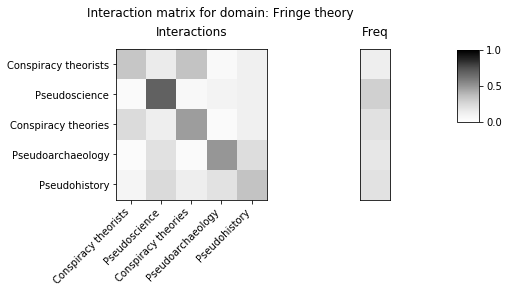

saving data in: ./WIKIdata/matrices2020/wikipedia_system_575.npz


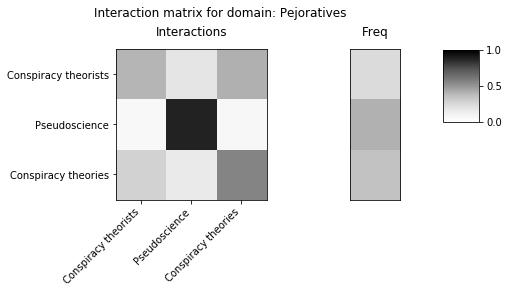

saving data in: ./WIKIdata/matrices2020/wikipedia_system_576.npz


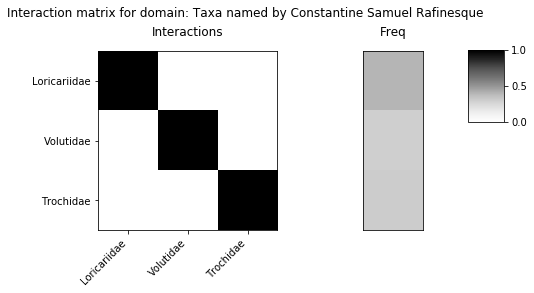

saving data in: ./WIKIdata/matrices2020/wikipedia_system_577.npz


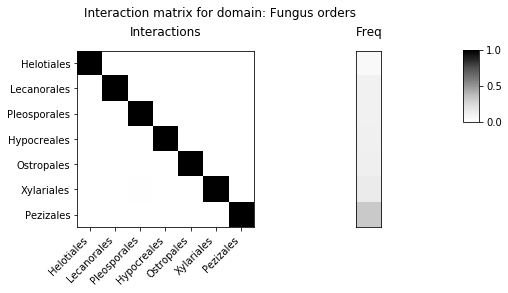

saving data in: ./WIKIdata/matrices2020/wikipedia_system_578.npz


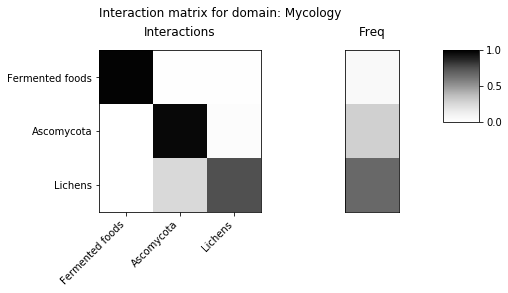

saving data in: ./WIKIdata/matrices2020/wikipedia_system_579.npz


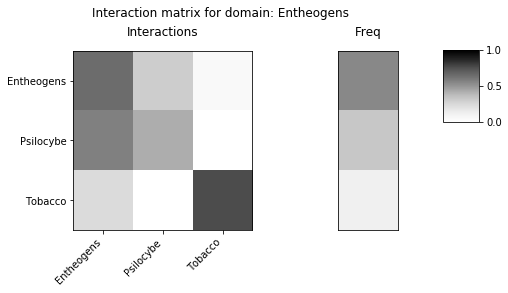

saving data in: ./WIKIdata/matrices2020/wikipedia_system_580.npz


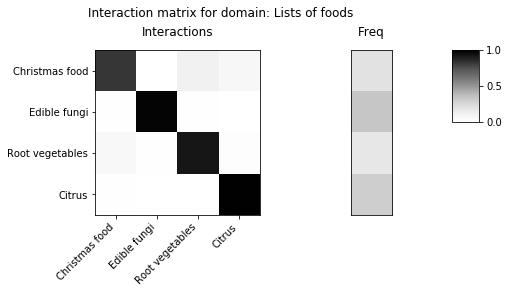

saving data in: ./WIKIdata/matrices2020/wikipedia_system_581.npz


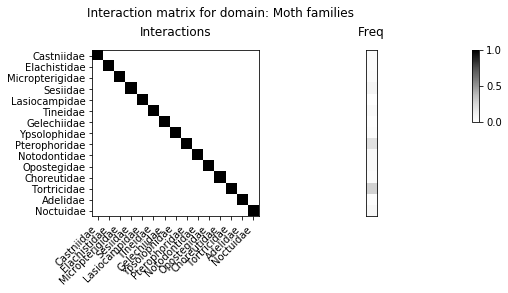

saving data in: ./WIKIdata/matrices2020/wikipedia_system_582.npz


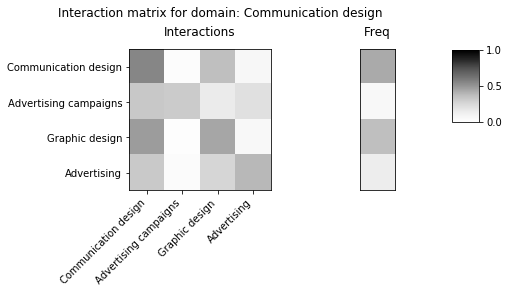

saving data in: ./WIKIdata/matrices2020/wikipedia_system_583.npz


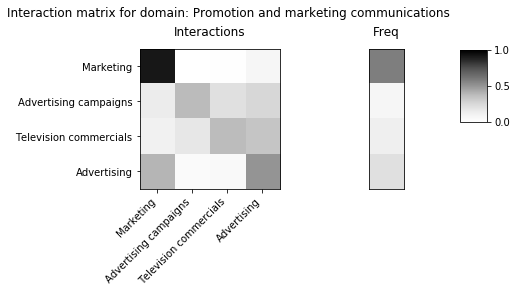

saving data in: ./WIKIdata/matrices2020/wikipedia_system_584.npz


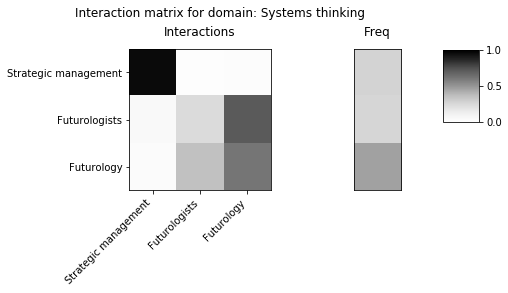

saving data in: ./WIKIdata/matrices2020/wikipedia_system_585.npz


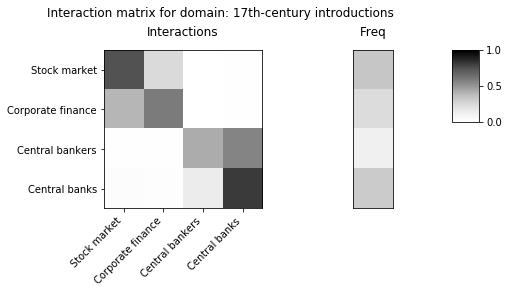

saving data in: ./WIKIdata/matrices2020/wikipedia_system_586.npz


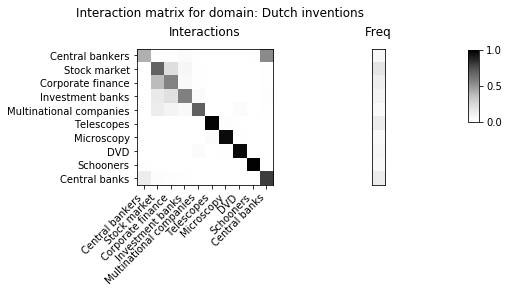

saving data in: ./WIKIdata/matrices2020/wikipedia_system_587.npz


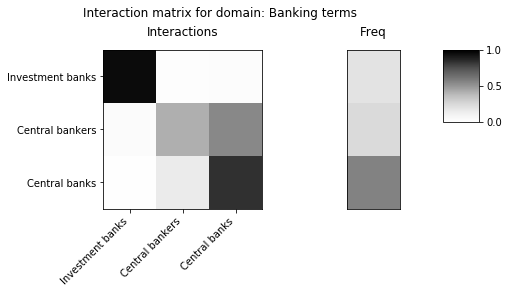

saving data in: ./WIKIdata/matrices2020/wikipedia_system_588.npz


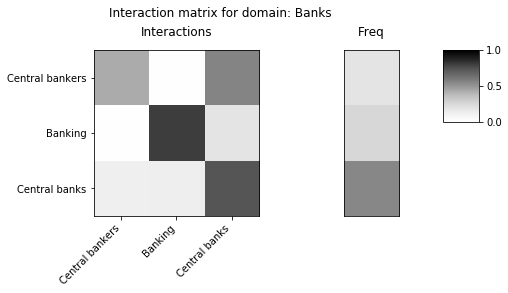

saving data in: ./WIKIdata/matrices2020/wikipedia_system_589.npz


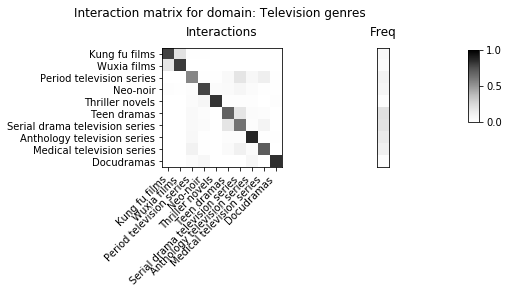

saving data in: ./WIKIdata/matrices2020/wikipedia_system_590.npz


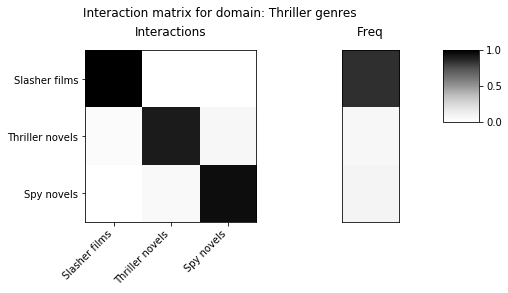

saving data in: ./WIKIdata/matrices2020/wikipedia_system_591.npz


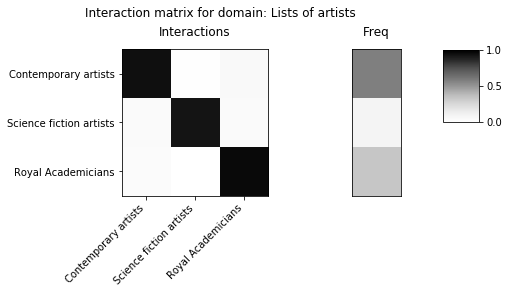

saving data in: ./WIKIdata/matrices2020/wikipedia_system_592.npz


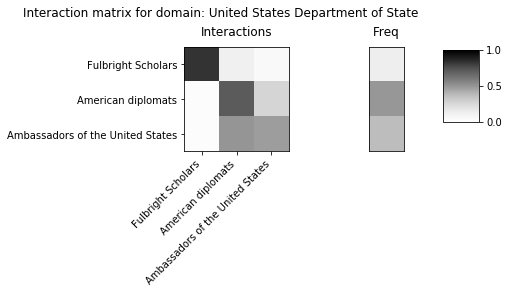

saving data in: ./WIKIdata/matrices2020/wikipedia_system_593.npz


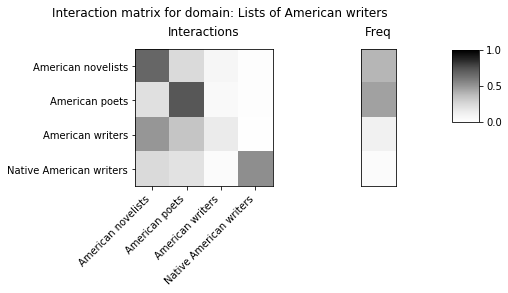

saving data in: ./WIKIdata/matrices2020/wikipedia_system_594.npz


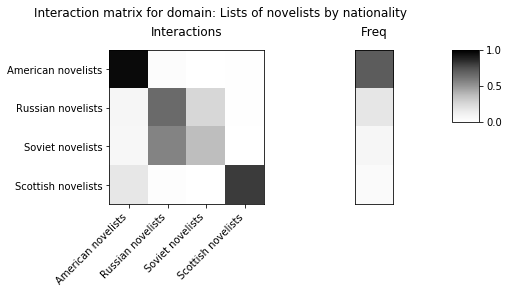

saving data in: ./WIKIdata/matrices2020/wikipedia_system_595.npz


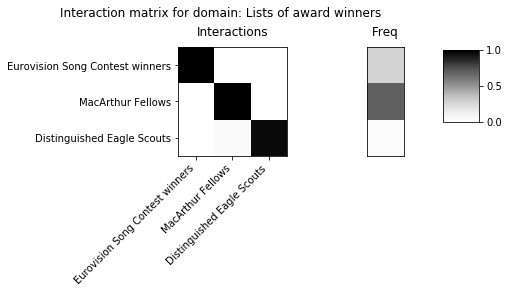

saving data in: ./WIKIdata/matrices2020/wikipedia_system_596.npz


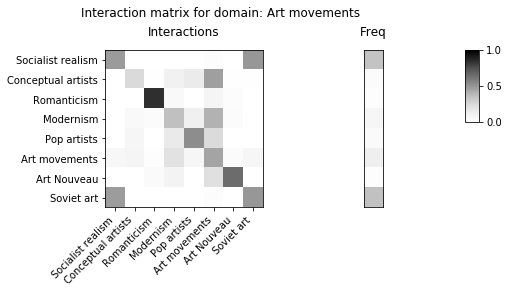

saving data in: ./WIKIdata/matrices2020/wikipedia_system_597.npz


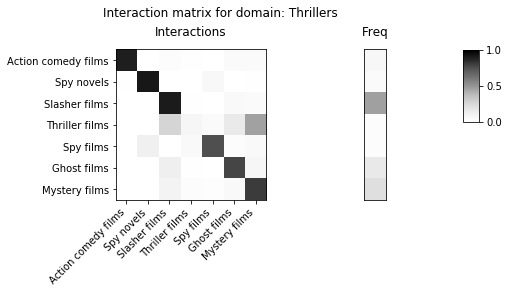

saving data in: ./WIKIdata/matrices2020/wikipedia_system_598.npz


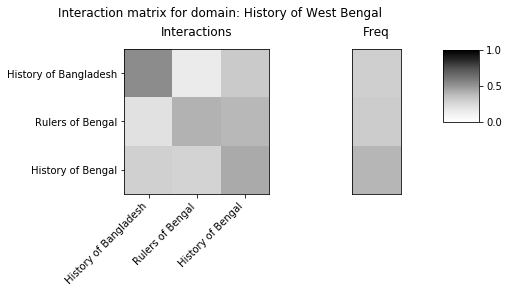

saving data in: ./WIKIdata/matrices2020/wikipedia_system_599.npz


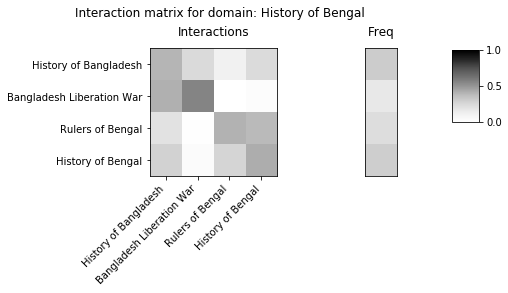

saving data in: ./WIKIdata/matrices2020/wikipedia_system_600.npz


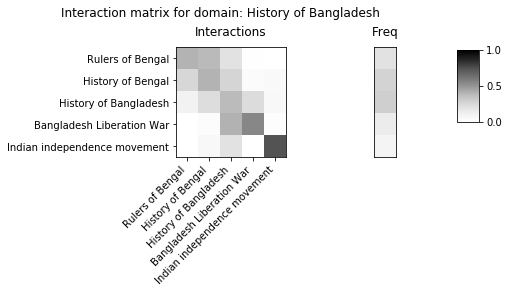

saving data in: ./WIKIdata/matrices2020/wikipedia_system_601.npz


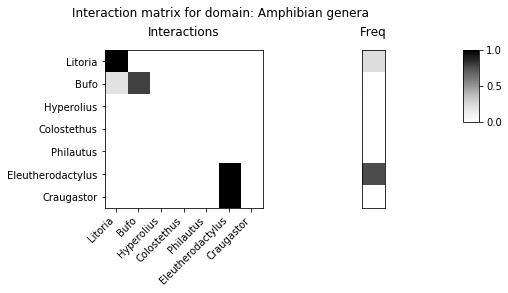

saving data in: ./WIKIdata/matrices2020/wikipedia_system_602.npz


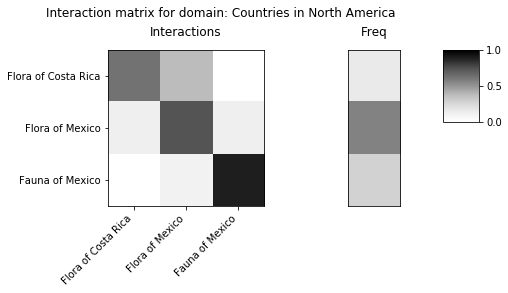

saving data in: ./WIKIdata/matrices2020/wikipedia_system_603.npz


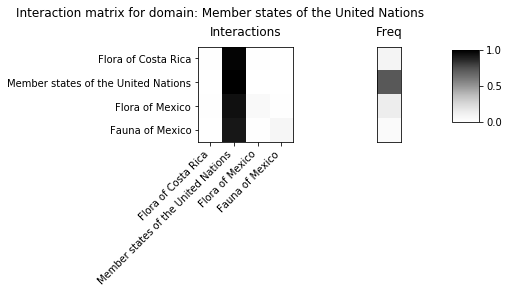

saving data in: ./WIKIdata/matrices2020/wikipedia_system_604.npz


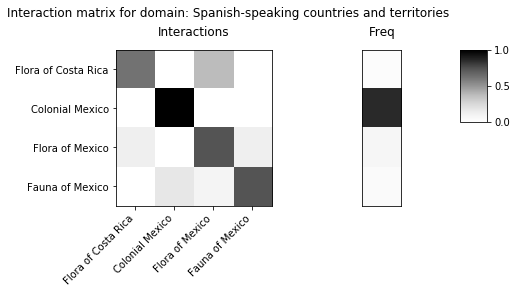

saving data in: ./WIKIdata/matrices2020/wikipedia_system_605.npz


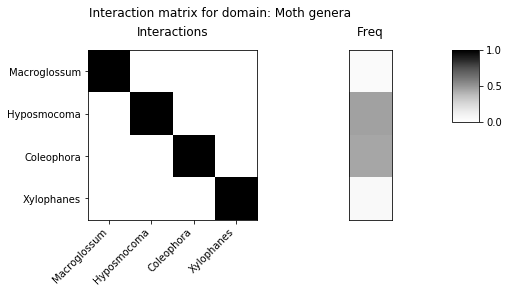

saving data in: ./WIKIdata/matrices2020/wikipedia_system_606.npz


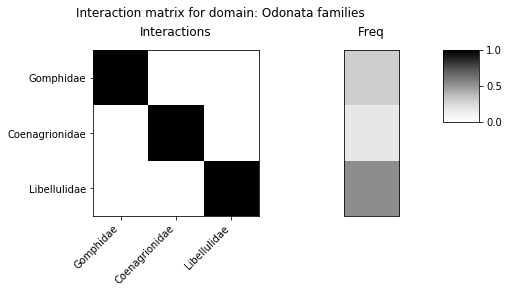

saving data in: ./WIKIdata/matrices2020/wikipedia_system_607.npz


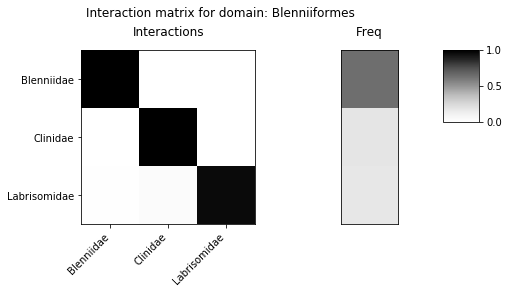

saving data in: ./WIKIdata/matrices2020/wikipedia_system_608.npz


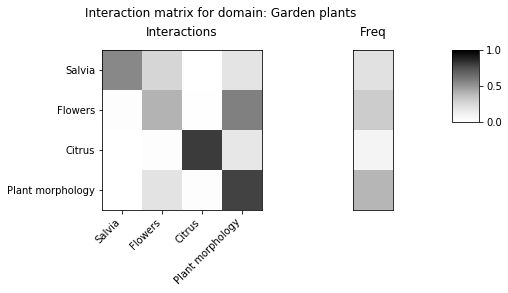

saving data in: ./WIKIdata/matrices2020/wikipedia_system_609.npz


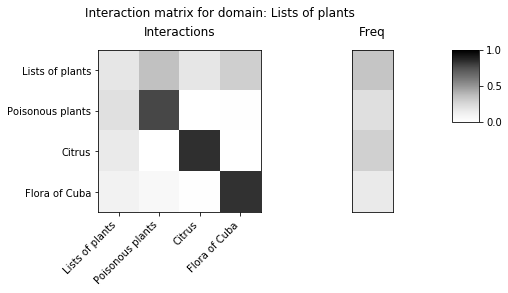

saving data in: ./WIKIdata/matrices2020/wikipedia_system_610.npz


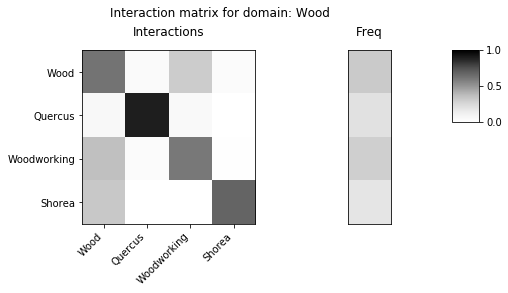

saving data in: ./WIKIdata/matrices2020/wikipedia_system_611.npz


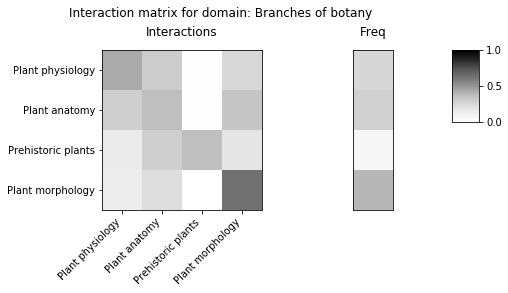

saving data in: ./WIKIdata/matrices2020/wikipedia_system_612.npz


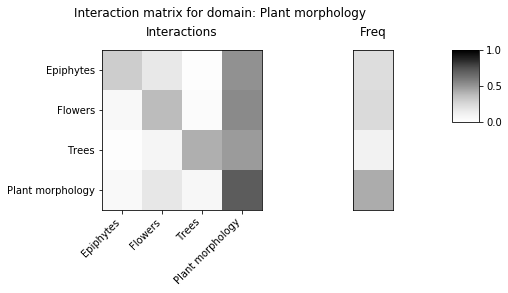

saving data in: ./WIKIdata/matrices2020/wikipedia_system_613.npz


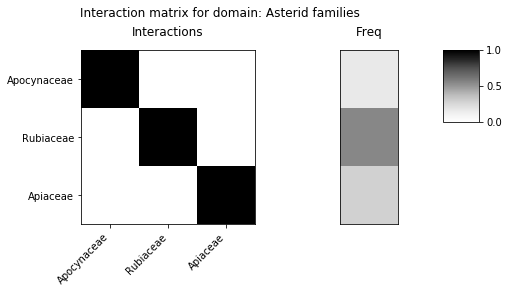

saving data in: ./WIKIdata/matrices2020/wikipedia_system_614.npz


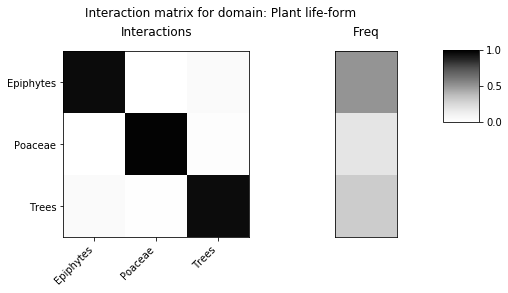

saving data in: ./WIKIdata/matrices2020/wikipedia_system_615.npz


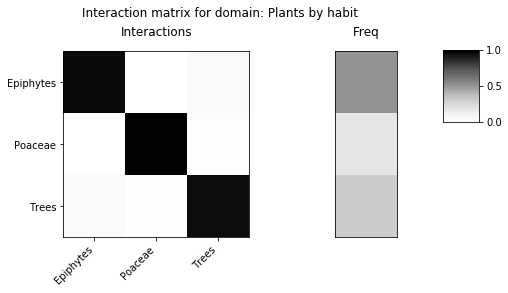

saving data in: ./WIKIdata/matrices2020/wikipedia_system_616.npz


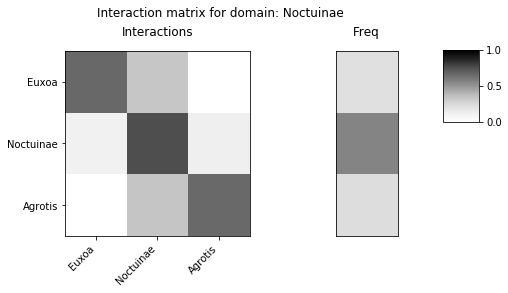

saving data in: ./WIKIdata/matrices2020/wikipedia_system_617.npz


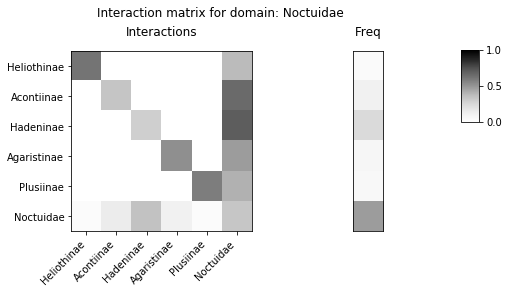

saving data in: ./WIKIdata/matrices2020/wikipedia_system_618.npz


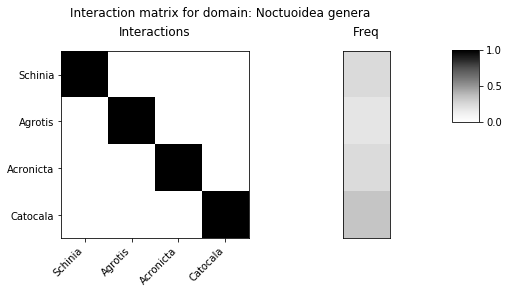

saving data in: ./WIKIdata/matrices2020/wikipedia_system_619.npz


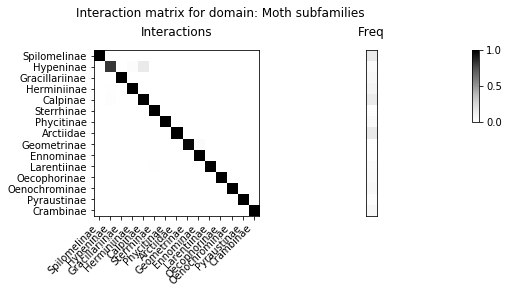

saving data in: ./WIKIdata/matrices2020/wikipedia_system_620.npz


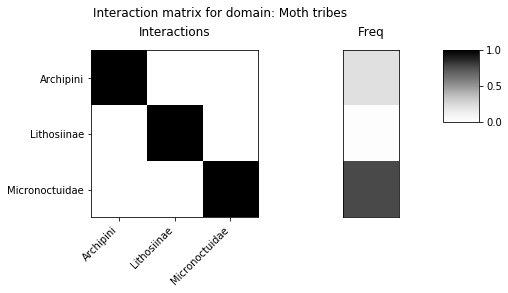

saving data in: ./WIKIdata/matrices2020/wikipedia_system_621.npz


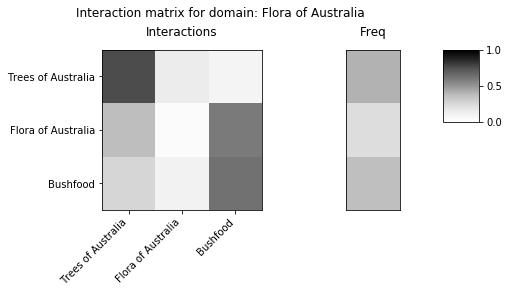

saving data in: ./WIKIdata/matrices2020/wikipedia_system_622.npz


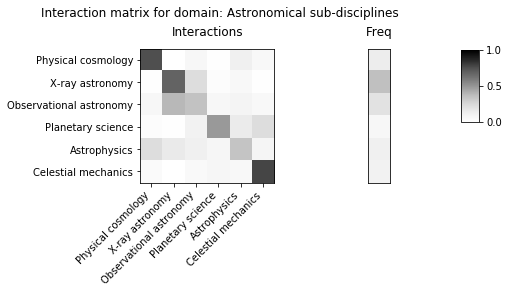

saving data in: ./WIKIdata/matrices2020/wikipedia_system_623.npz


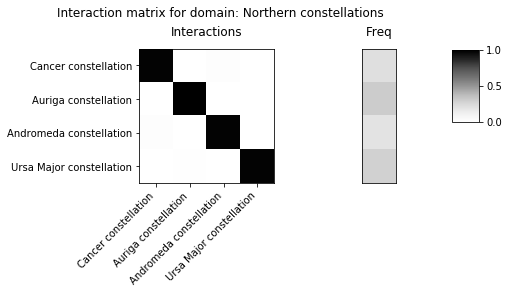

saving data in: ./WIKIdata/matrices2020/wikipedia_system_624.npz


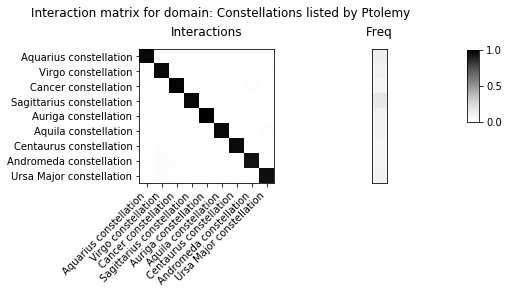

saving data in: ./WIKIdata/matrices2020/wikipedia_system_625.npz


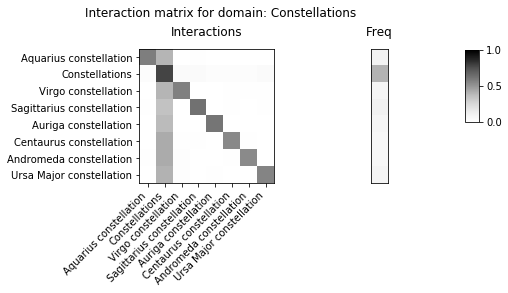

saving data in: ./WIKIdata/matrices2020/wikipedia_system_626.npz


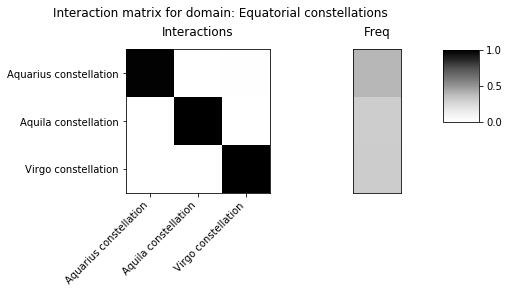

saving data in: ./WIKIdata/matrices2020/wikipedia_system_627.npz


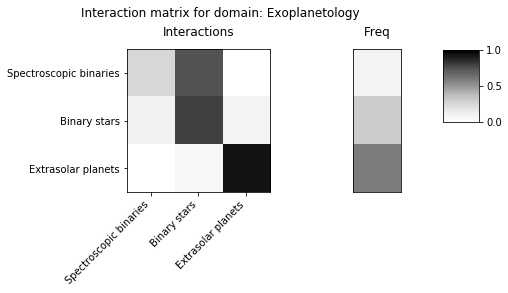

saving data in: ./WIKIdata/matrices2020/wikipedia_system_628.npz


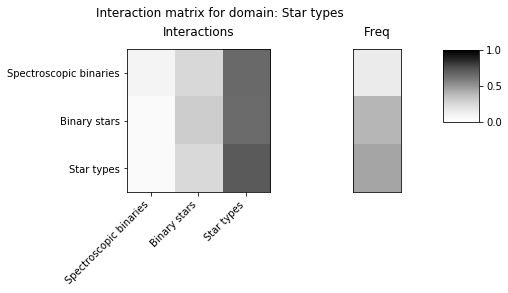

saving data in: ./WIKIdata/matrices2020/wikipedia_system_629.npz


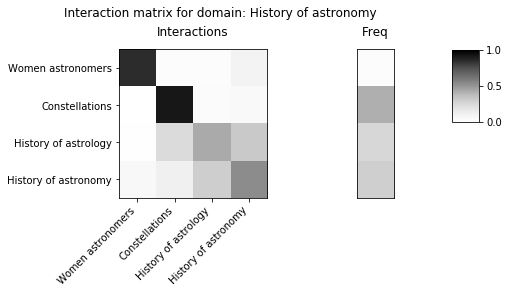

saving data in: ./WIKIdata/matrices2020/wikipedia_system_630.npz


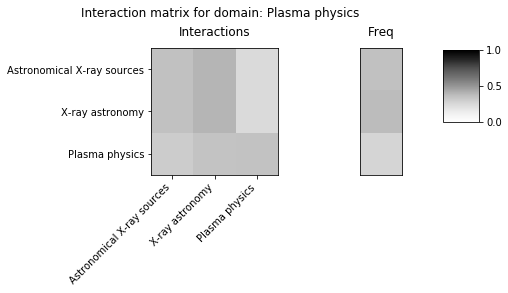

saving data in: ./WIKIdata/matrices2020/wikipedia_system_631.npz


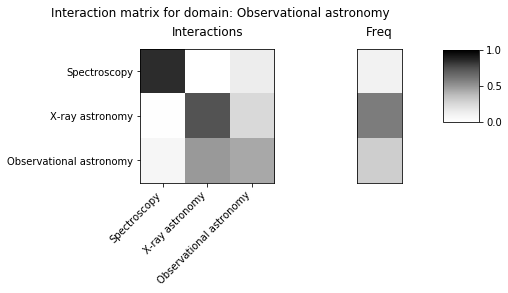

saving data in: ./WIKIdata/matrices2020/wikipedia_system_632.npz


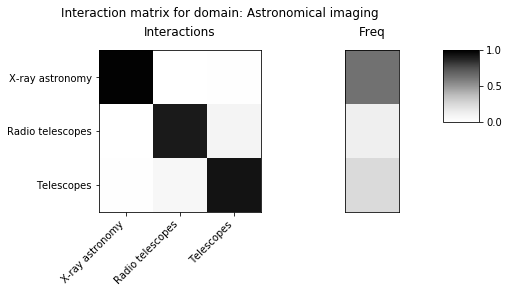

saving data in: ./WIKIdata/matrices2020/wikipedia_system_633.npz


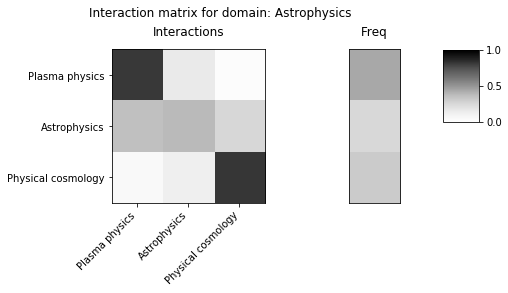

saving data in: ./WIKIdata/matrices2020/wikipedia_system_634.npz


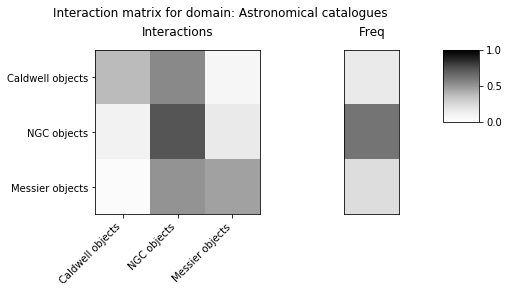

saving data in: ./WIKIdata/matrices2020/wikipedia_system_635.npz


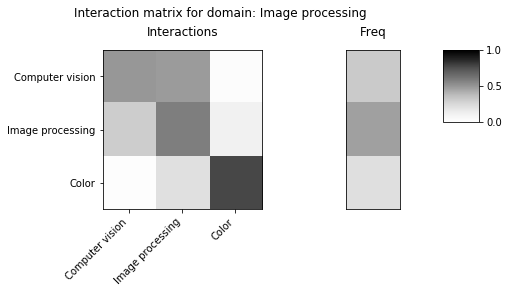

saving data in: ./WIKIdata/matrices2020/wikipedia_system_636.npz


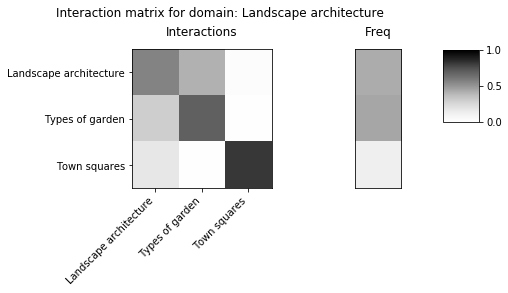

saving data in: ./WIKIdata/matrices2020/wikipedia_system_637.npz


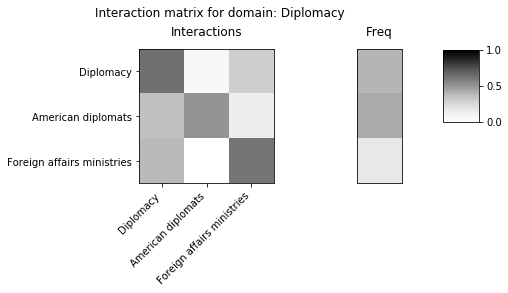

saving data in: ./WIKIdata/matrices2020/wikipedia_system_638.npz


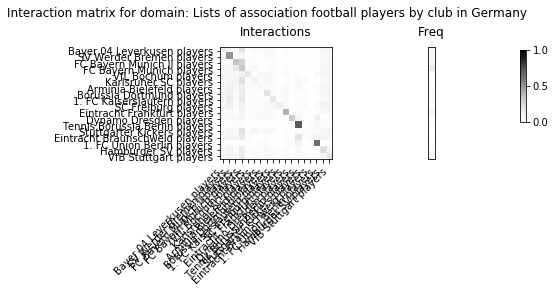

saving data in: ./WIKIdata/matrices2020/wikipedia_system_639.npz


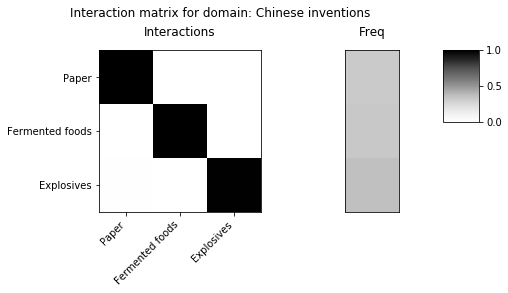

saving data in: ./WIKIdata/matrices2020/wikipedia_system_640.npz


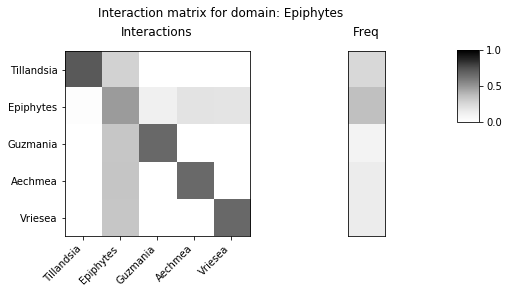

saving data in: ./WIKIdata/matrices2020/wikipedia_system_641.npz


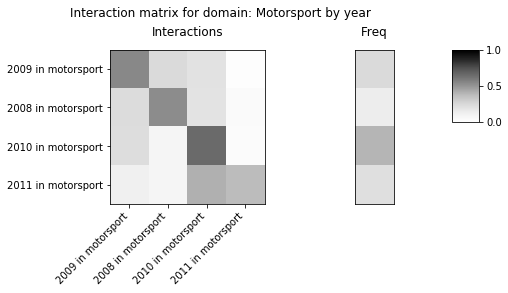

saving data in: ./WIKIdata/matrices2020/wikipedia_system_642.npz


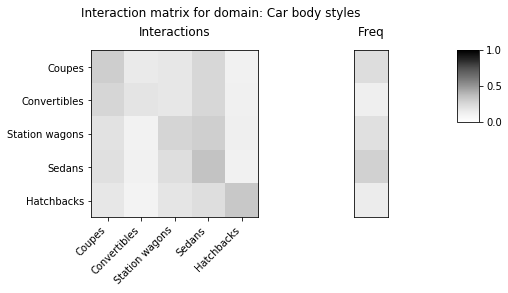

saving data in: ./WIKIdata/matrices2020/wikipedia_system_643.npz


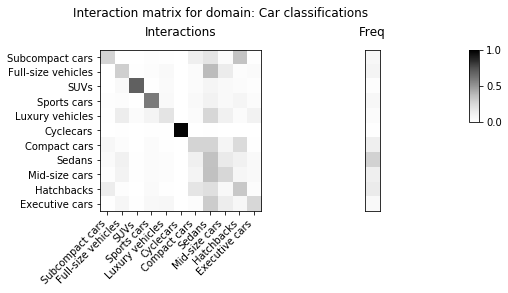

saving data in: ./WIKIdata/matrices2020/wikipedia_system_644.npz


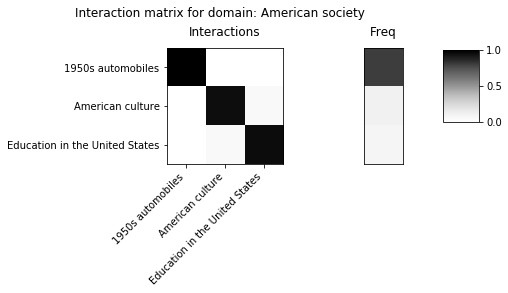

saving data in: ./WIKIdata/matrices2020/wikipedia_system_645.npz


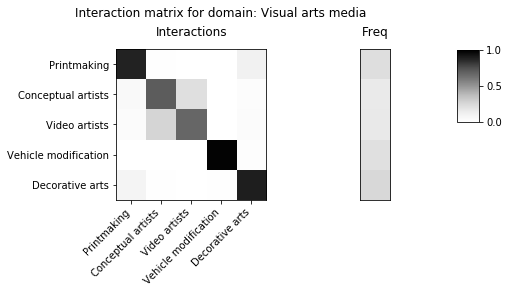

saving data in: ./WIKIdata/matrices2020/wikipedia_system_646.npz


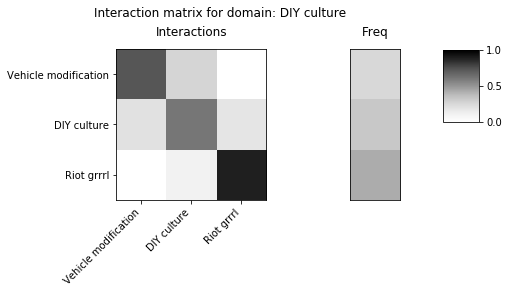

saving data in: ./WIKIdata/matrices2020/wikipedia_system_647.npz


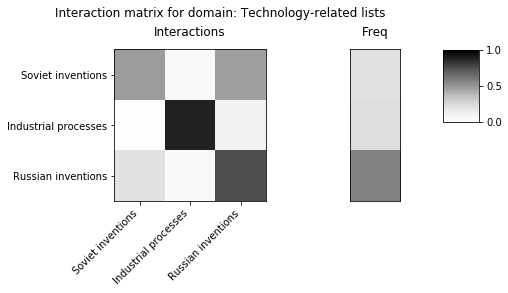

saving data in: ./WIKIdata/matrices2020/wikipedia_system_648.npz


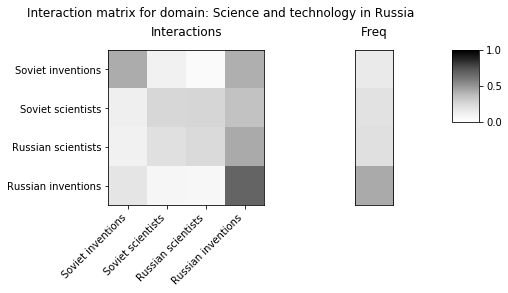

saving data in: ./WIKIdata/matrices2020/wikipedia_system_649.npz


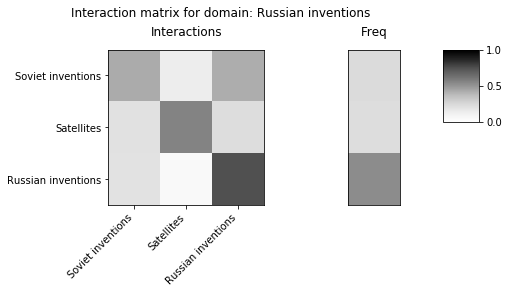

saving data in: ./WIKIdata/matrices2020/wikipedia_system_650.npz


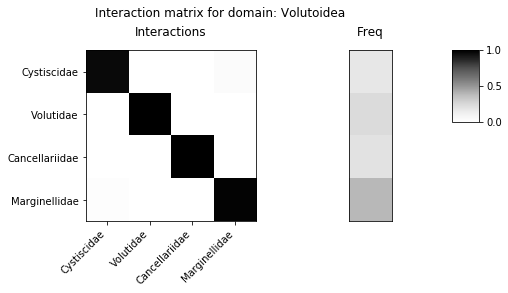

saving data in: ./WIKIdata/matrices2020/wikipedia_system_651.npz


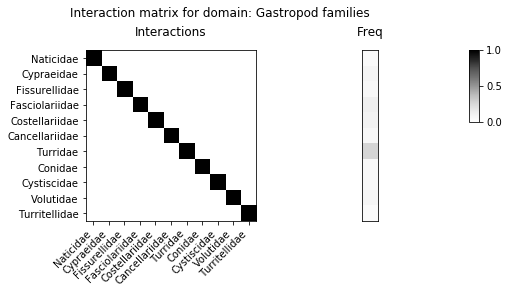

saving data in: ./WIKIdata/matrices2020/wikipedia_system_652.npz


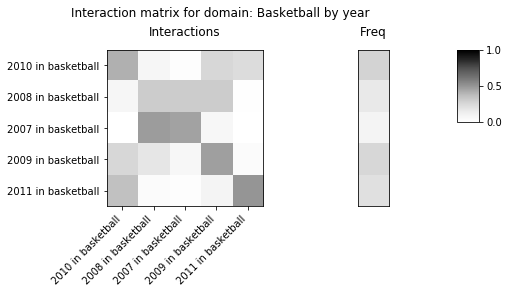

saving data in: ./WIKIdata/matrices2020/wikipedia_system_653.npz


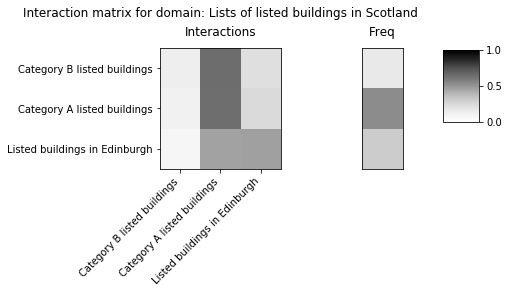

saving data in: ./WIKIdata/matrices2020/wikipedia_system_654.npz


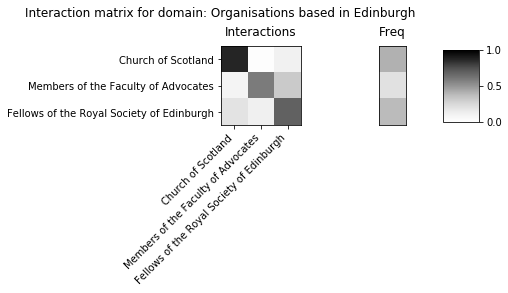

saving data in: ./WIKIdata/matrices2020/wikipedia_system_655.npz


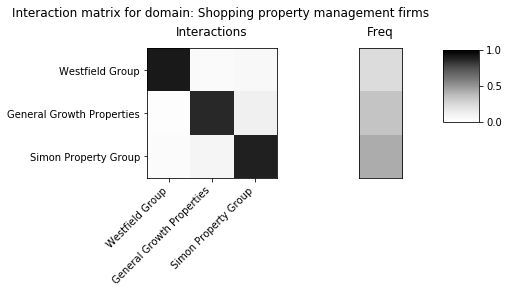

saving data in: ./WIKIdata/matrices2020/wikipedia_system_656.npz


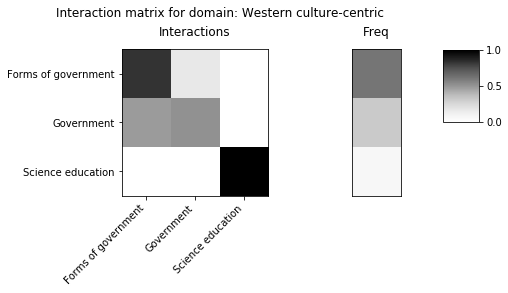

saving data in: ./WIKIdata/matrices2020/wikipedia_system_657.npz


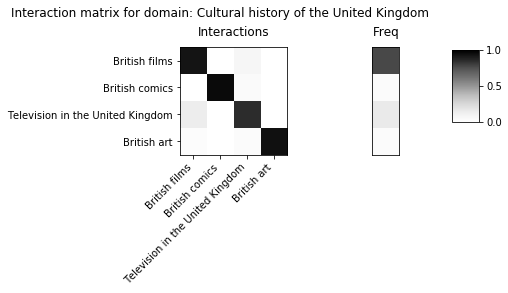

saving data in: ./WIKIdata/matrices2020/wikipedia_system_658.npz


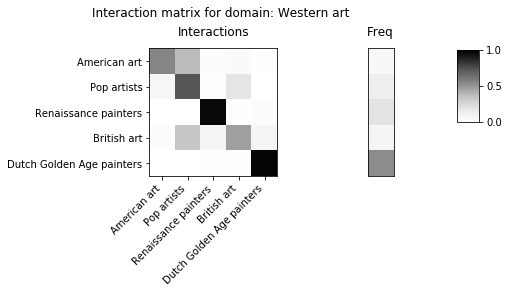

saving data in: ./WIKIdata/matrices2020/wikipedia_system_659.npz


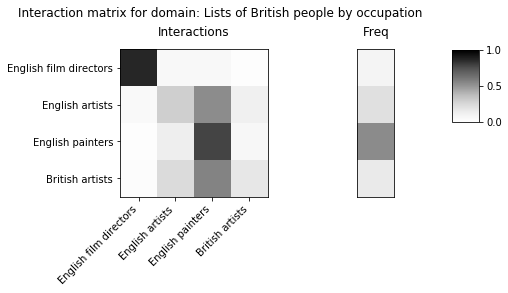

saving data in: ./WIKIdata/matrices2020/wikipedia_system_660.npz


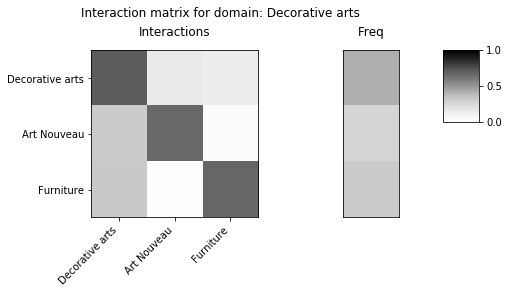

saving data in: ./WIKIdata/matrices2020/wikipedia_system_661.npz


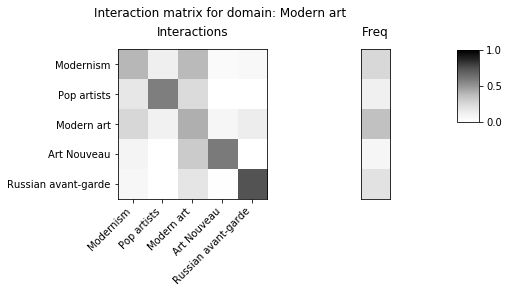

saving data in: ./WIKIdata/matrices2020/wikipedia_system_662.npz


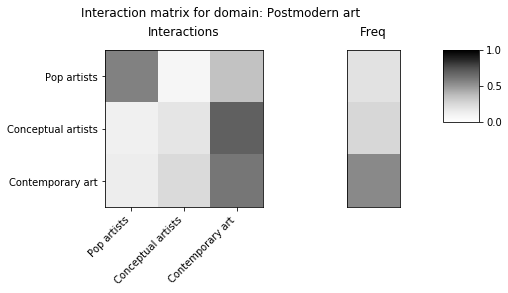

saving data in: ./WIKIdata/matrices2020/wikipedia_system_663.npz


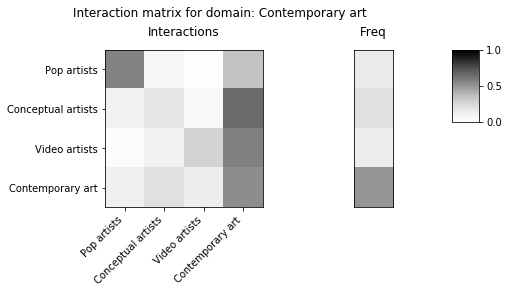

saving data in: ./WIKIdata/matrices2020/wikipedia_system_664.npz


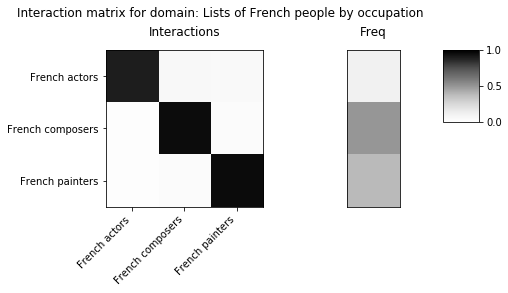

saving data in: ./WIKIdata/matrices2020/wikipedia_system_665.npz


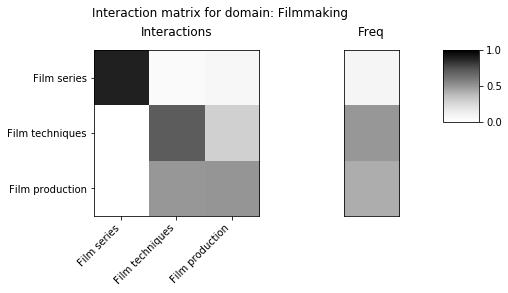

saving data in: ./WIKIdata/matrices2020/wikipedia_system_666.npz


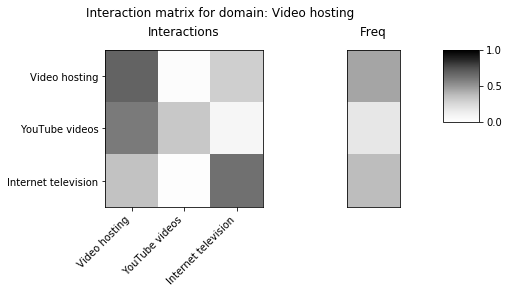

saving data in: ./WIKIdata/matrices2020/wikipedia_system_667.npz


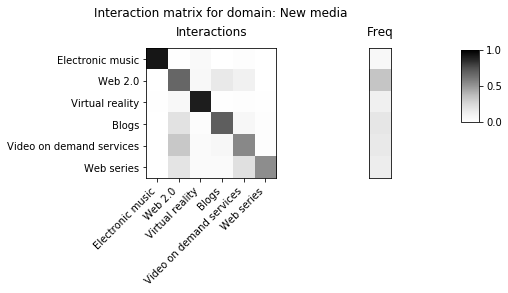

saving data in: ./WIKIdata/matrices2020/wikipedia_system_668.npz


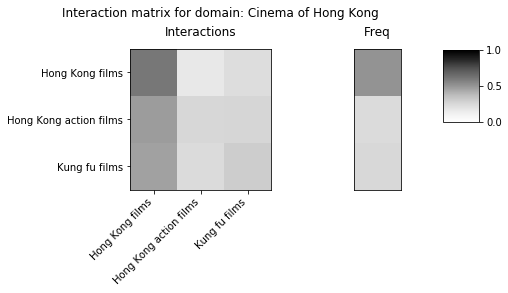

saving data in: ./WIKIdata/matrices2020/wikipedia_system_669.npz


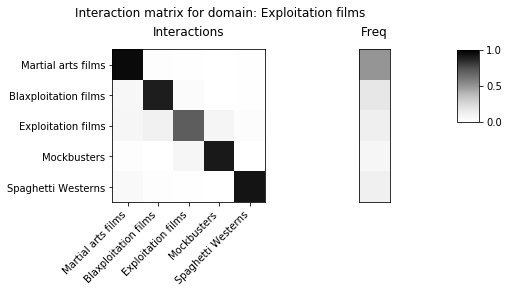

saving data in: ./WIKIdata/matrices2020/wikipedia_system_670.npz


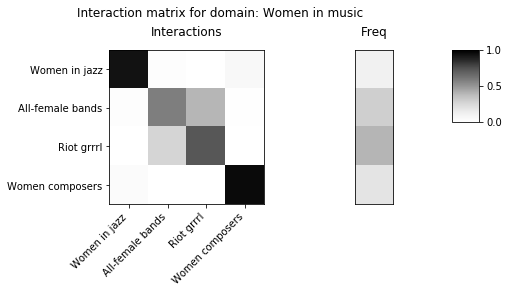

saving data in: ./WIKIdata/matrices2020/wikipedia_system_671.npz


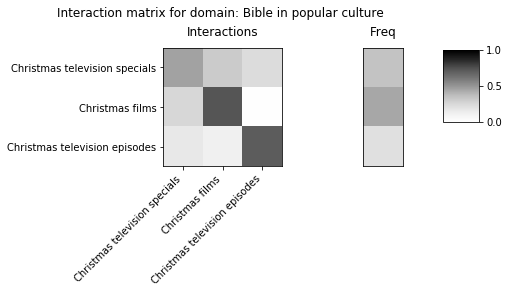

saving data in: ./WIKIdata/matrices2020/wikipedia_system_672.npz


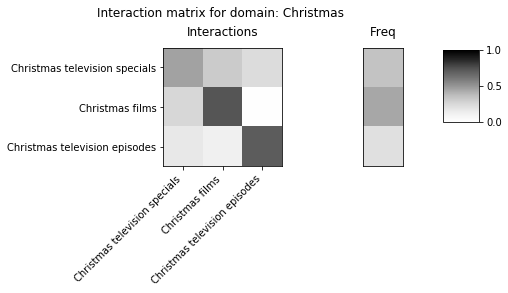

saving data in: ./WIKIdata/matrices2020/wikipedia_system_673.npz


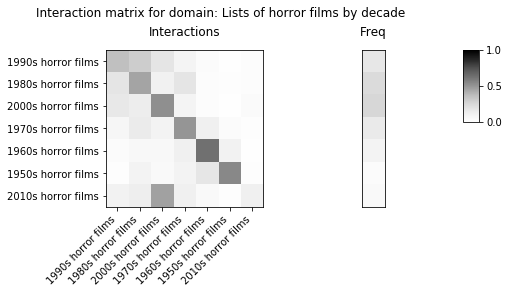

saving data in: ./WIKIdata/matrices2020/wikipedia_system_674.npz


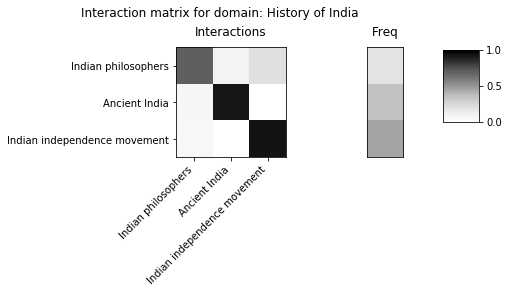

saving data in: ./WIKIdata/matrices2020/wikipedia_system_675.npz


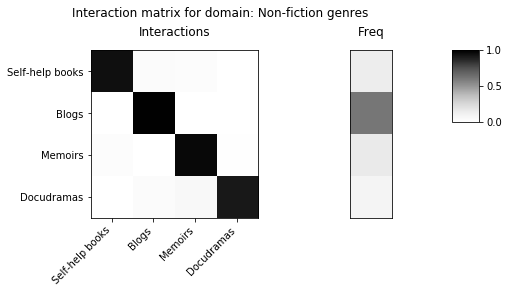

saving data in: ./WIKIdata/matrices2020/wikipedia_system_676.npz


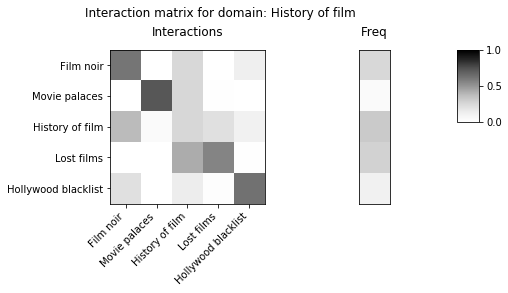

saving data in: ./WIKIdata/matrices2020/wikipedia_system_677.npz


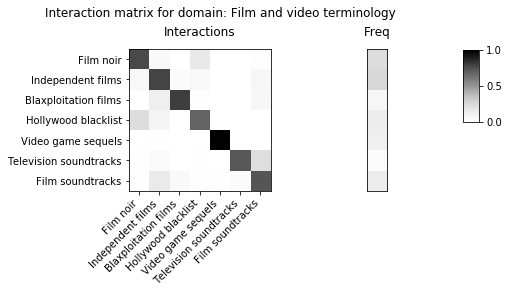

saving data in: ./WIKIdata/matrices2020/wikipedia_system_678.npz


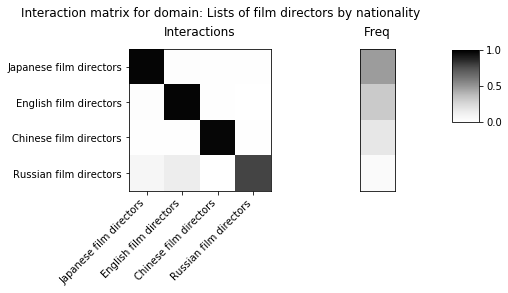

saving data in: ./WIKIdata/matrices2020/wikipedia_system_679.npz


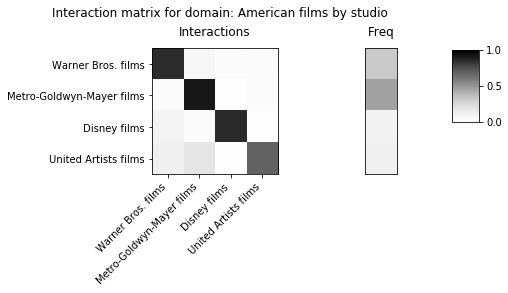

saving data in: ./WIKIdata/matrices2020/wikipedia_system_680.npz


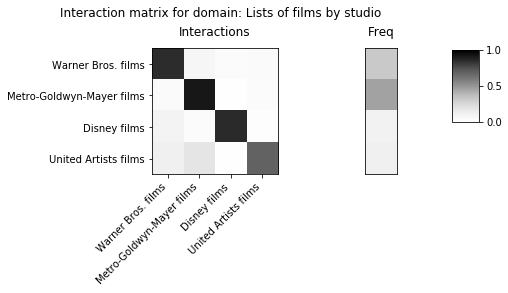

saving data in: ./WIKIdata/matrices2020/wikipedia_system_681.npz


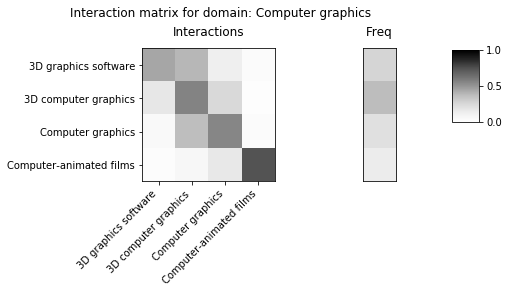

saving data in: ./WIKIdata/matrices2020/wikipedia_system_682.npz


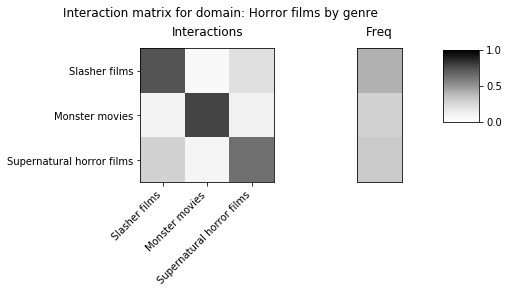

saving data in: ./WIKIdata/matrices2020/wikipedia_system_683.npz


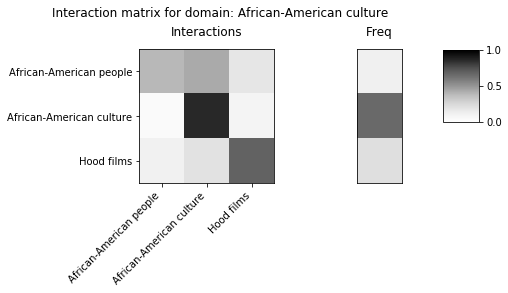

saving data in: ./WIKIdata/matrices2020/wikipedia_system_684.npz


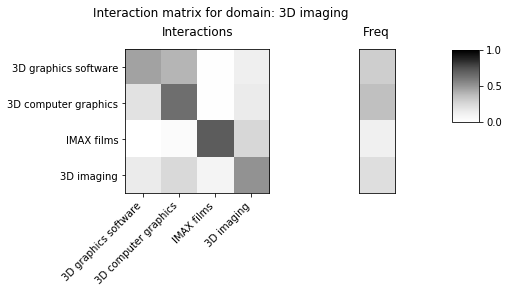

saving data in: ./WIKIdata/matrices2020/wikipedia_system_685.npz


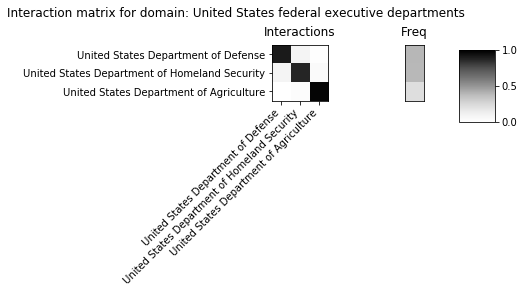

saving data in: ./WIKIdata/matrices2020/wikipedia_system_686.npz


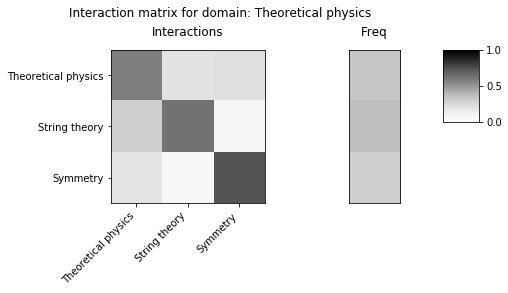

saving data in: ./WIKIdata/matrices2020/wikipedia_system_687.npz


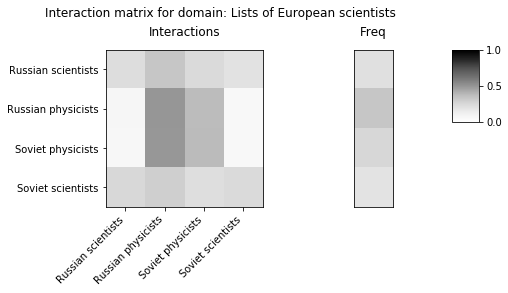

saving data in: ./WIKIdata/matrices2020/wikipedia_system_688.npz


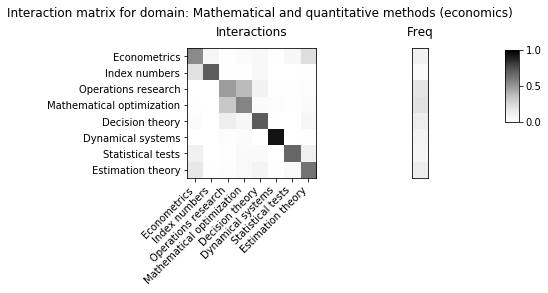

saving data in: ./WIKIdata/matrices2020/wikipedia_system_689.npz


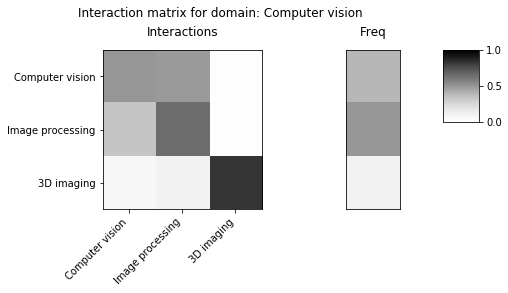

saving data in: ./WIKIdata/matrices2020/wikipedia_system_690.npz


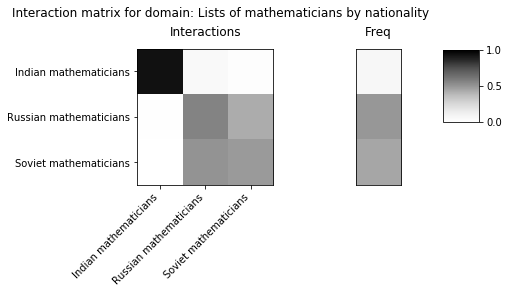

saving data in: ./WIKIdata/matrices2020/wikipedia_system_691.npz


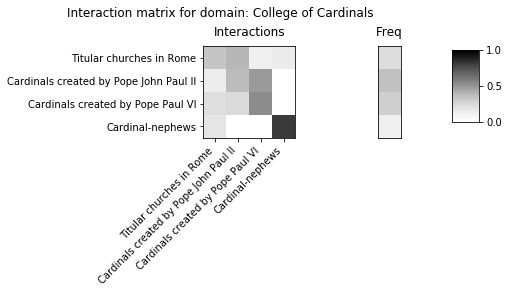

saving data in: ./WIKIdata/matrices2020/wikipedia_system_692.npz


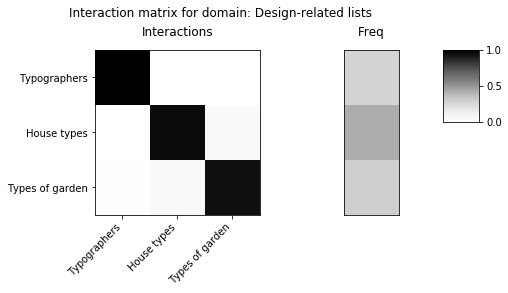

saving data in: ./WIKIdata/matrices2020/wikipedia_system_693.npz


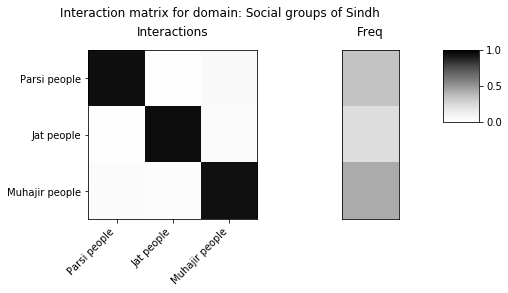

saving data in: ./WIKIdata/matrices2020/wikipedia_system_694.npz


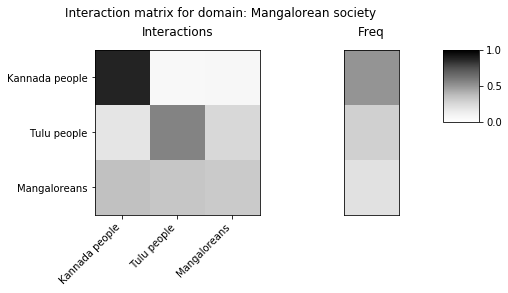

saving data in: ./WIKIdata/matrices2020/wikipedia_system_695.npz


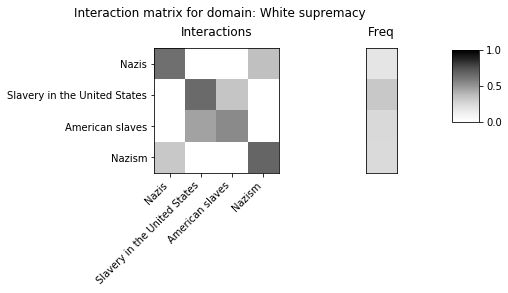

saving data in: ./WIKIdata/matrices2020/wikipedia_system_696.npz


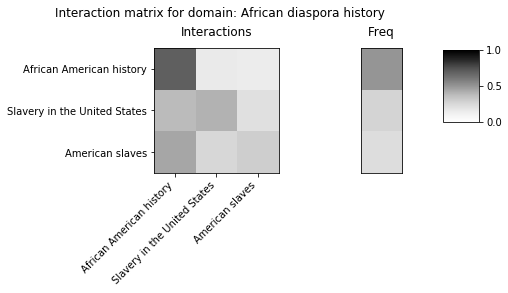

saving data in: ./WIKIdata/matrices2020/wikipedia_system_697.npz


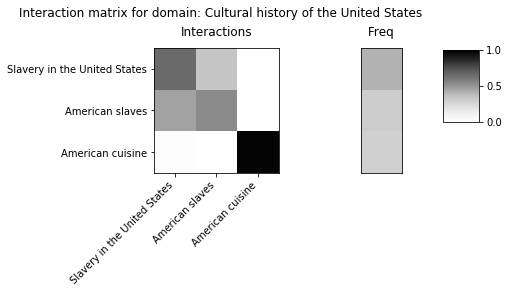

saving data in: ./WIKIdata/matrices2020/wikipedia_system_698.npz


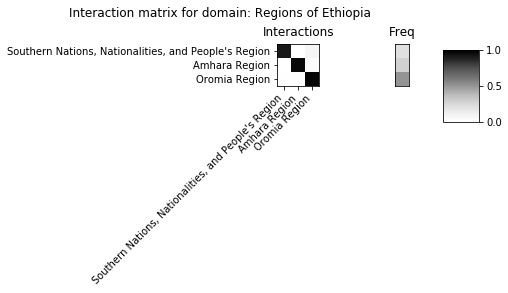

saving data in: ./WIKIdata/matrices2020/wikipedia_system_699.npz


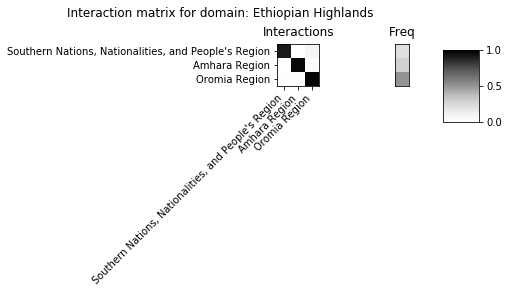

saving data in: ./WIKIdata/matrices2020/wikipedia_system_700.npz


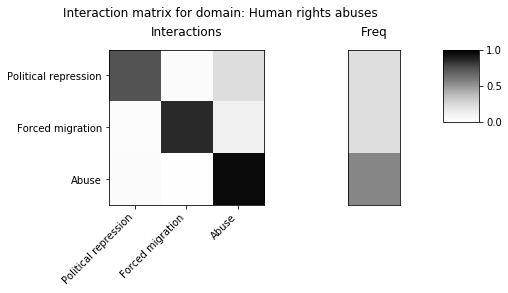

saving data in: ./WIKIdata/matrices2020/wikipedia_system_701.npz


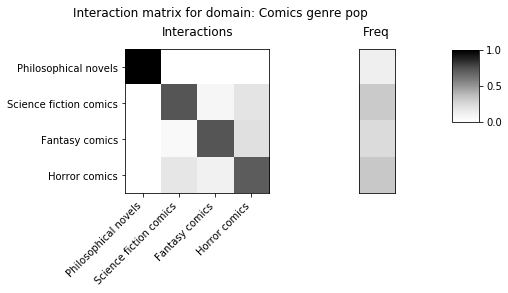

saving data in: ./WIKIdata/matrices2020/wikipedia_system_702.npz


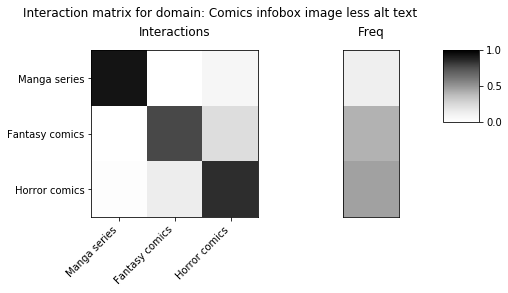

saving data in: ./WIKIdata/matrices2020/wikipedia_system_703.npz


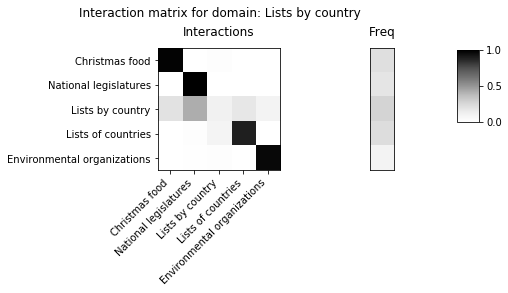

saving data in: ./WIKIdata/matrices2020/wikipedia_system_704.npz


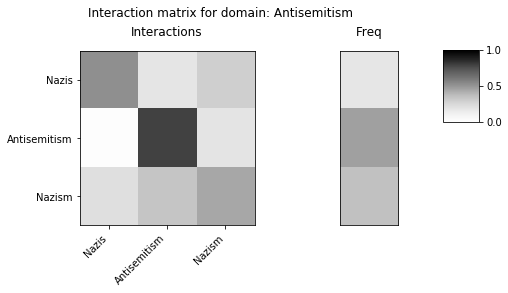

saving data in: ./WIKIdata/matrices2020/wikipedia_system_705.npz


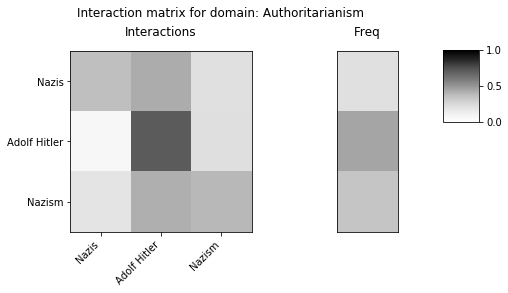

saving data in: ./WIKIdata/matrices2020/wikipedia_system_706.npz


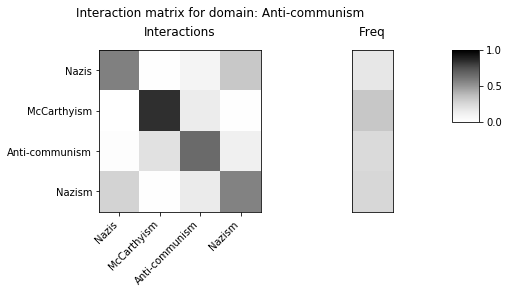

saving data in: ./WIKIdata/matrices2020/wikipedia_system_707.npz


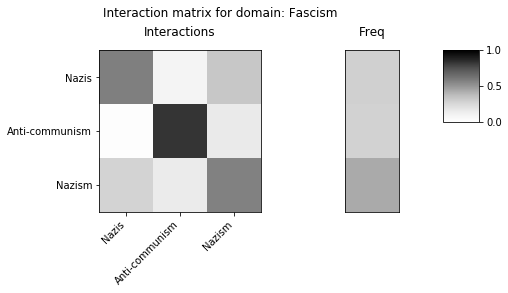

saving data in: ./WIKIdata/matrices2020/wikipedia_system_708.npz


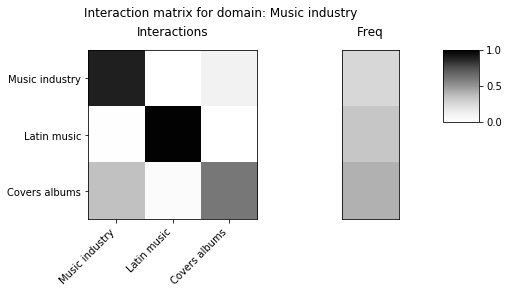

saving data in: ./WIKIdata/matrices2020/wikipedia_system_709.npz


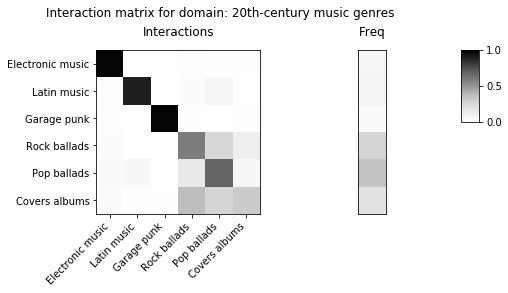

saving data in: ./WIKIdata/matrices2020/wikipedia_system_710.npz


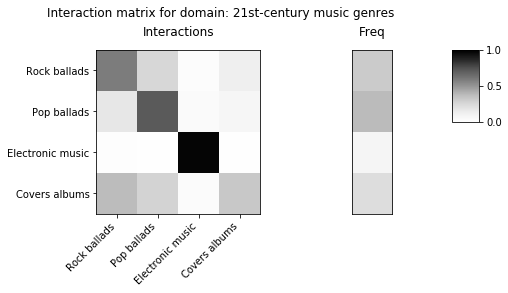

saving data in: ./WIKIdata/matrices2020/wikipedia_system_711.npz


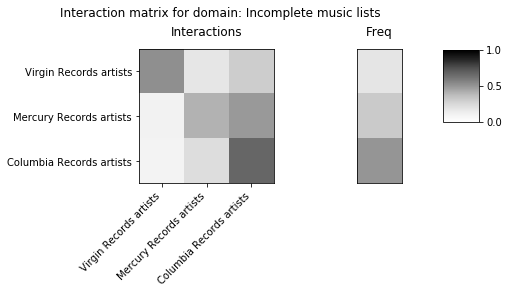

saving data in: ./WIKIdata/matrices2020/wikipedia_system_712.npz


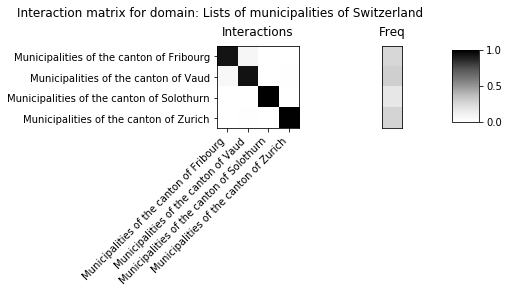

saving data in: ./WIKIdata/matrices2020/wikipedia_system_713.npz


/Users/ruairidh/miniconda3/envs/blockmodels/lib/python3.7/site-packages/matplotlib/_constrained_layout.py:226: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  warnings.warn('constrained_layout not applied.  At least '


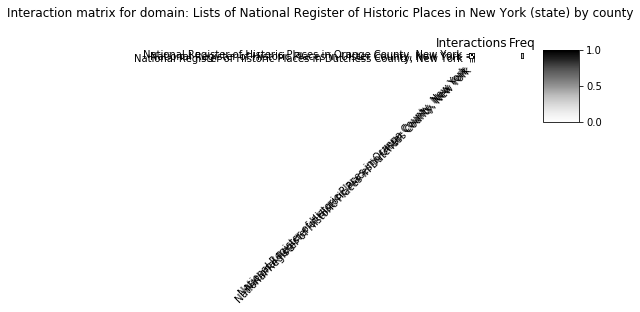

saving data in: ./WIKIdata/matrices2020/wikipedia_system_714.npz


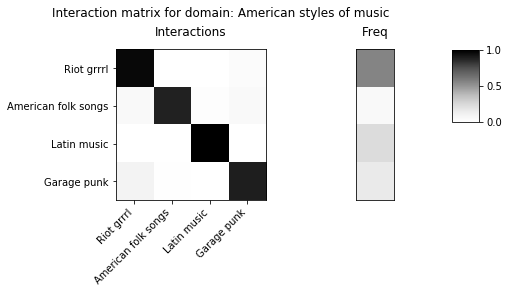

saving data in: ./WIKIdata/matrices2020/wikipedia_system_715.npz


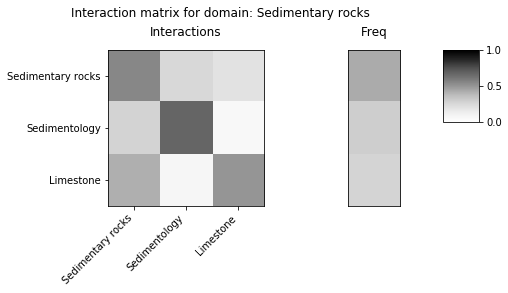

saving data in: ./WIKIdata/matrices2020/wikipedia_system_716.npz


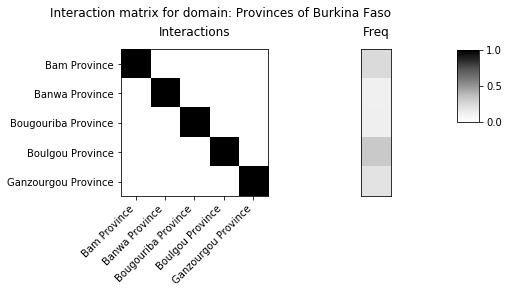

saving data in: ./WIKIdata/matrices2020/wikipedia_system_717.npz


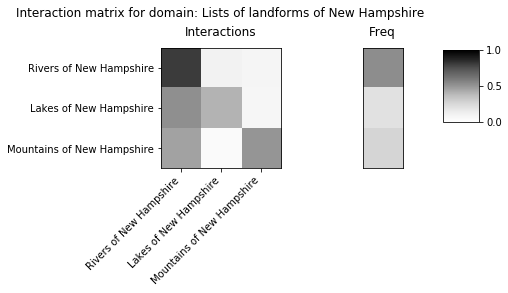

saving data in: ./WIKIdata/matrices2020/wikipedia_system_718.npz


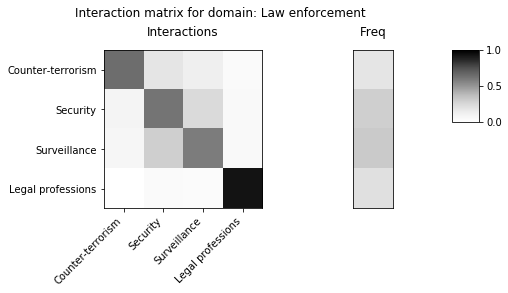

saving data in: ./WIKIdata/matrices2020/wikipedia_system_719.npz


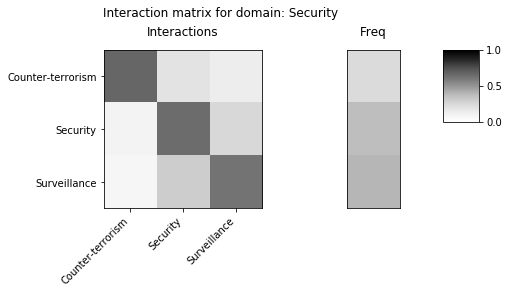

saving data in: ./WIKIdata/matrices2020/wikipedia_system_720.npz


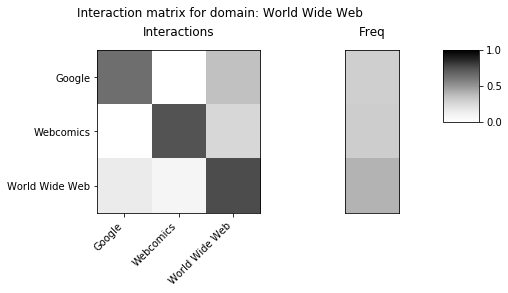

saving data in: ./WIKIdata/matrices2020/wikipedia_system_721.npz


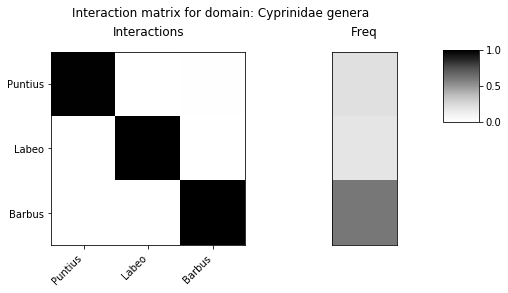

saving data in: ./WIKIdata/matrices2020/wikipedia_system_722.npz


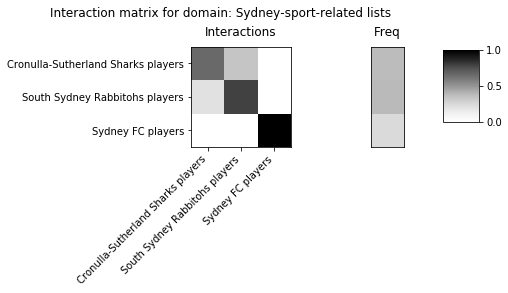

saving data in: ./WIKIdata/matrices2020/wikipedia_system_723.npz


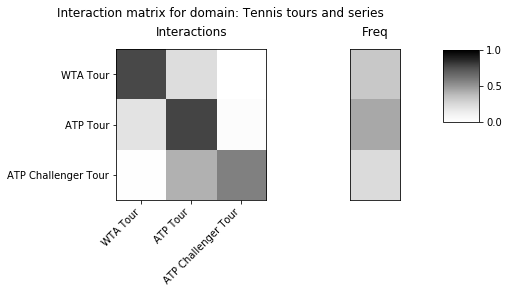

saving data in: ./WIKIdata/matrices2020/wikipedia_system_724.npz


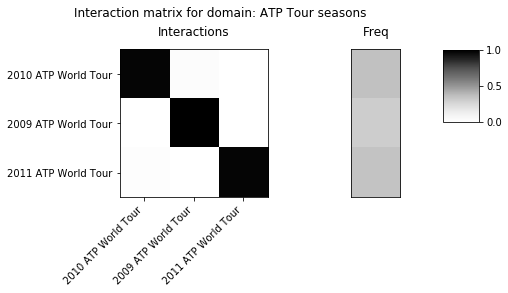

saving data in: ./WIKIdata/matrices2020/wikipedia_system_725.npz


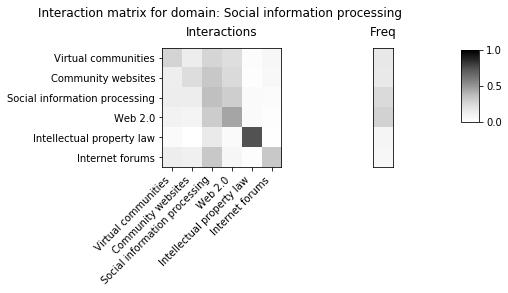

saving data in: ./WIKIdata/matrices2020/wikipedia_system_726.npz


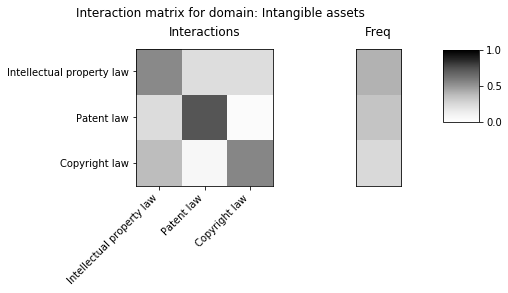

saving data in: ./WIKIdata/matrices2020/wikipedia_system_727.npz


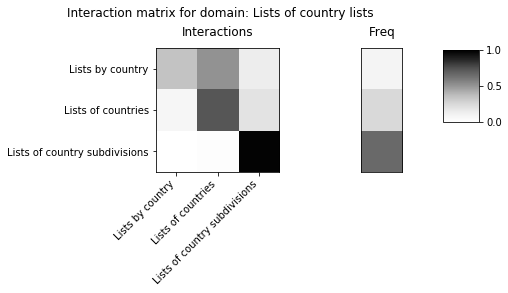

saving data in: ./WIKIdata/matrices2020/wikipedia_system_728.npz


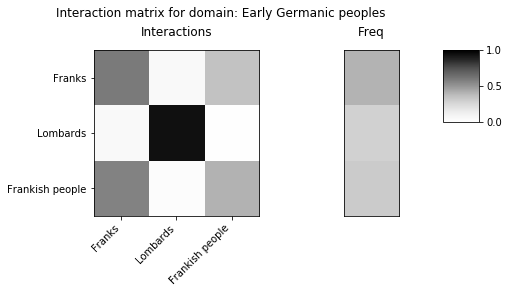

saving data in: ./WIKIdata/matrices2020/wikipedia_system_729.npz


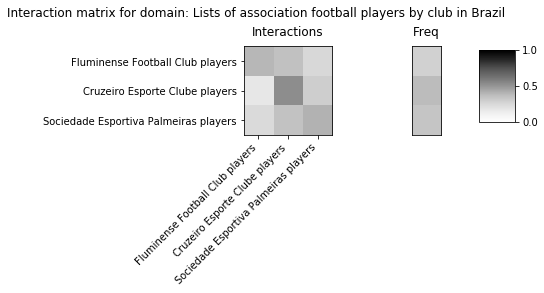

saving data in: ./WIKIdata/matrices2020/wikipedia_system_730.npz


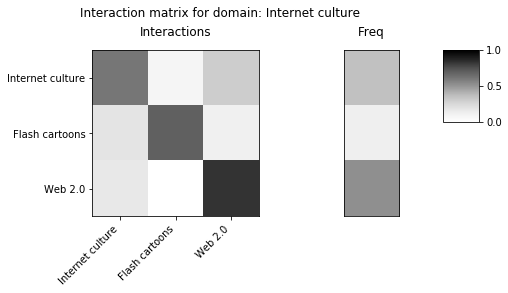

saving data in: ./WIKIdata/matrices2020/wikipedia_system_731.npz


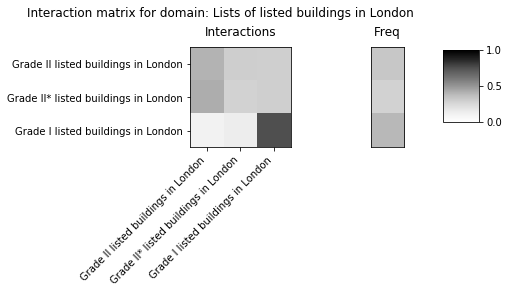

saving data in: ./WIKIdata/matrices2020/wikipedia_system_732.npz


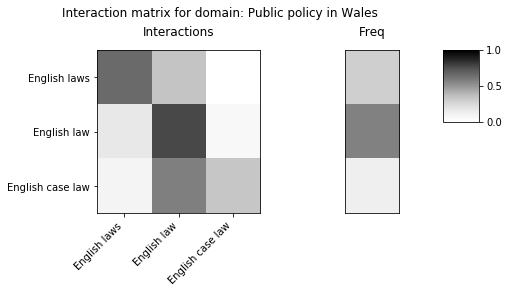

saving data in: ./WIKIdata/matrices2020/wikipedia_system_733.npz


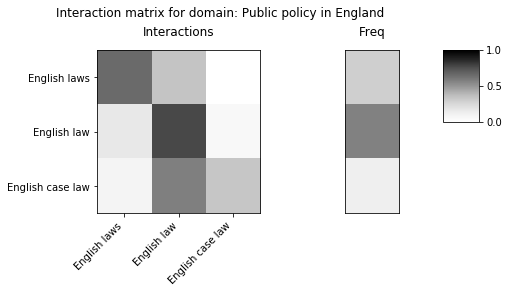

saving data in: ./WIKIdata/matrices2020/wikipedia_system_734.npz


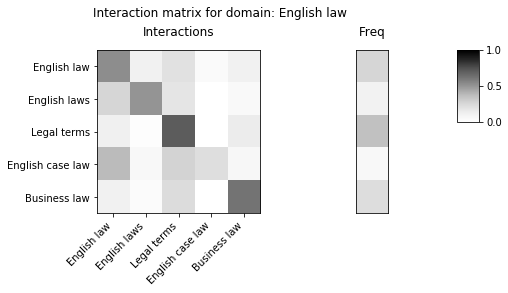

saving data in: ./WIKIdata/matrices2020/wikipedia_system_735.npz


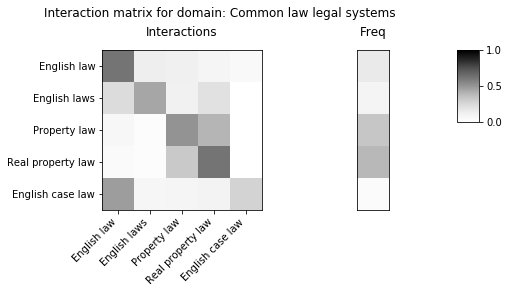

saving data in: ./WIKIdata/matrices2020/wikipedia_system_736.npz


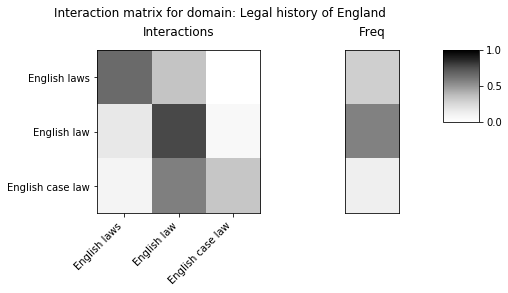

saving data in: ./WIKIdata/matrices2020/wikipedia_system_737.npz


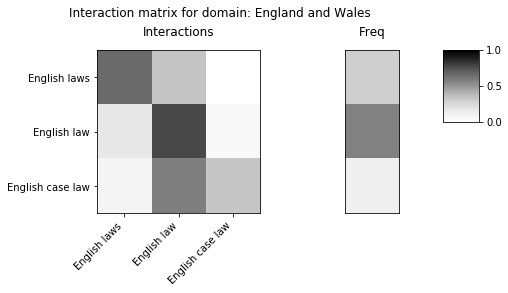

saving data in: ./WIKIdata/matrices2020/wikipedia_system_738.npz


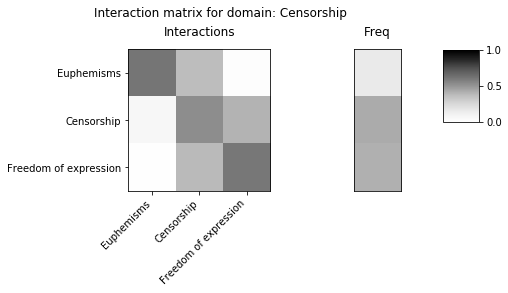

saving data in: ./WIKIdata/matrices2020/wikipedia_system_739.npz


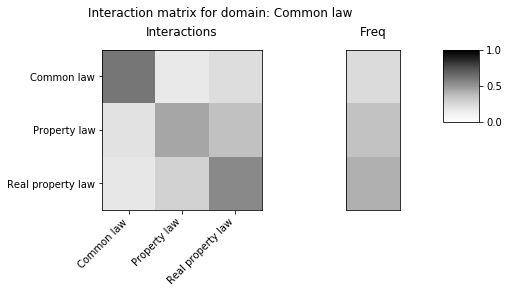

saving data in: ./WIKIdata/matrices2020/wikipedia_system_740.npz


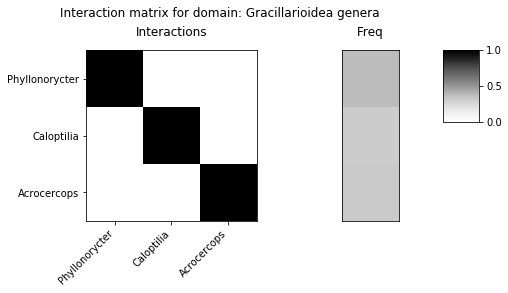

saving data in: ./WIKIdata/matrices2020/wikipedia_system_741.npz


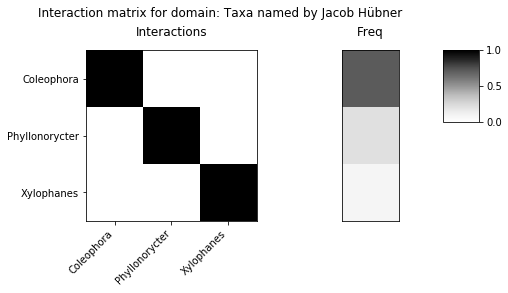

saving data in: ./WIKIdata/matrices2020/wikipedia_system_742.npz


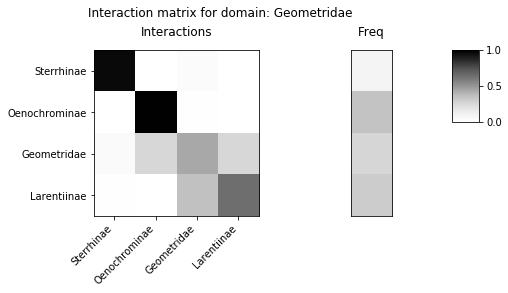

saving data in: ./WIKIdata/matrices2020/wikipedia_system_743.npz


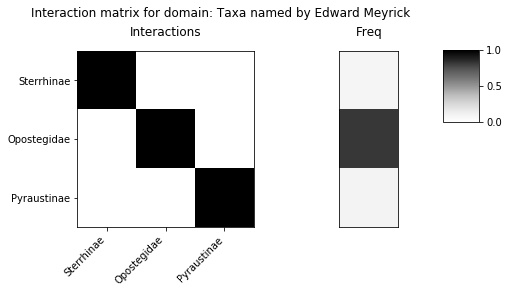

saving data in: ./WIKIdata/matrices2020/wikipedia_system_744.npz


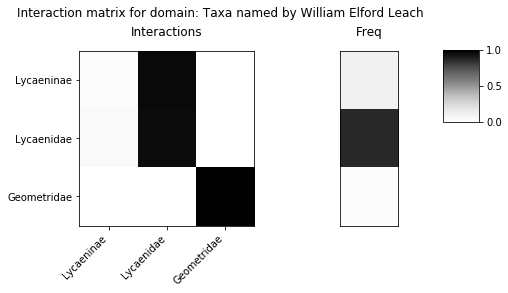

saving data in: ./WIKIdata/matrices2020/wikipedia_system_745.npz


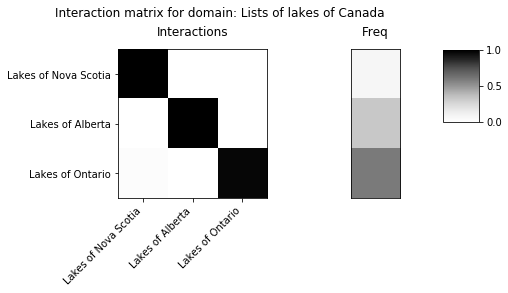

saving data in: ./WIKIdata/matrices2020/wikipedia_system_746.npz


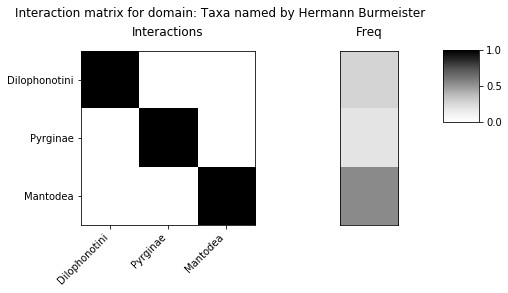

saving data in: ./WIKIdata/matrices2020/wikipedia_system_747.npz


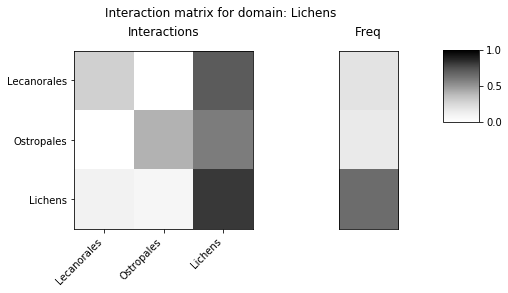

saving data in: ./WIKIdata/matrices2020/wikipedia_system_748.npz


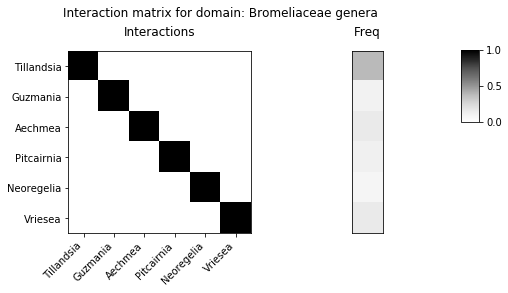

saving data in: ./WIKIdata/matrices2020/wikipedia_system_749.npz


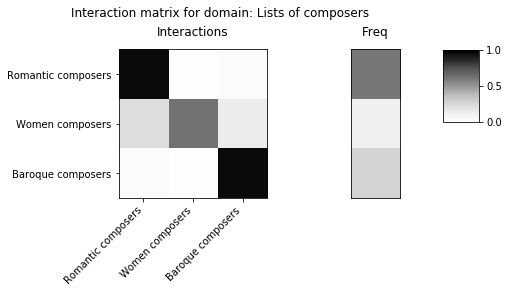

saving data in: ./WIKIdata/matrices2020/wikipedia_system_750.npz


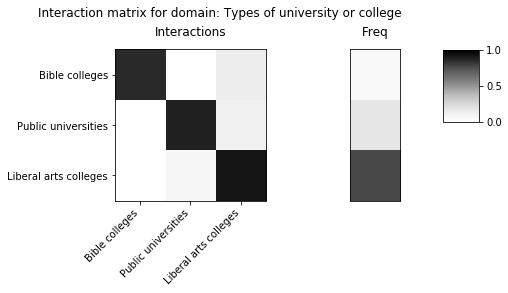

saving data in: ./WIKIdata/matrices2020/wikipedia_system_751.npz


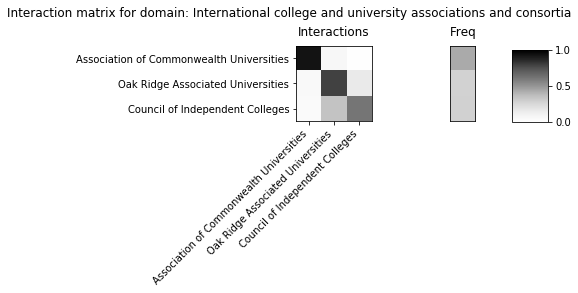

saving data in: ./WIKIdata/matrices2020/wikipedia_system_752.npz


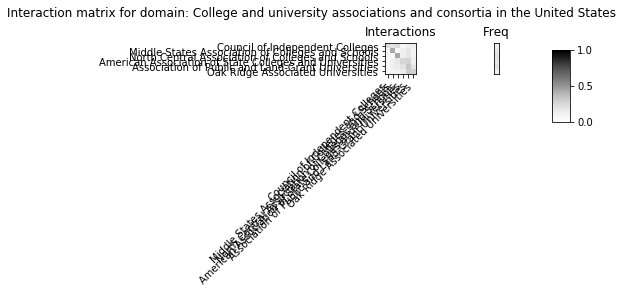

saving data in: ./WIKIdata/matrices2020/wikipedia_system_753.npz


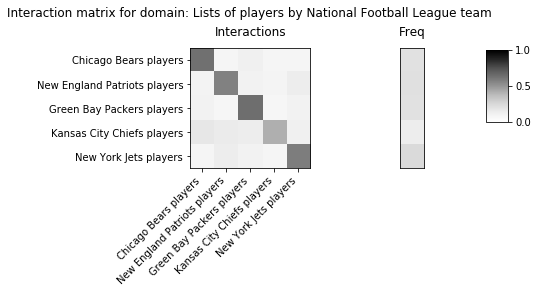

saving data in: ./WIKIdata/matrices2020/wikipedia_system_754.npz


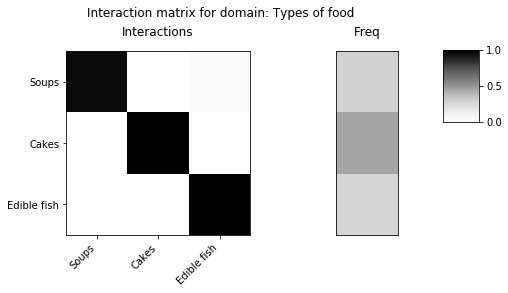

saving data in: ./WIKIdata/matrices2020/wikipedia_system_755.npz


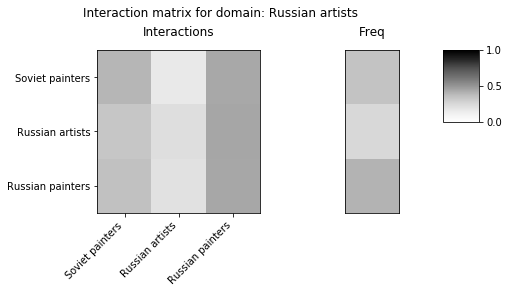

saving data in: ./WIKIdata/matrices2020/wikipedia_system_756.npz


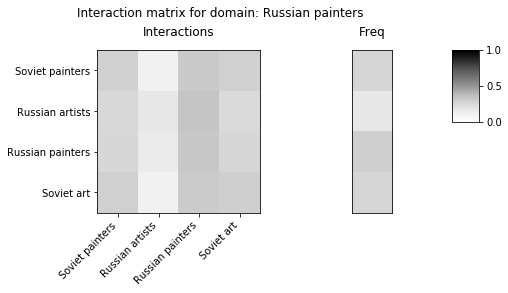

saving data in: ./WIKIdata/matrices2020/wikipedia_system_757.npz


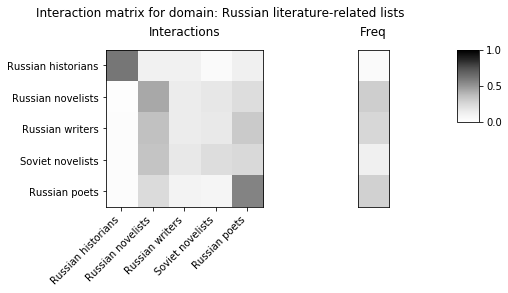

saving data in: ./WIKIdata/matrices2020/wikipedia_system_758.npz


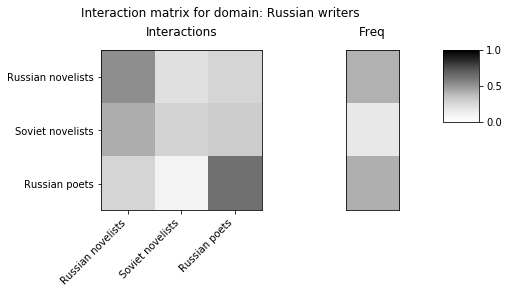

saving data in: ./WIKIdata/matrices2020/wikipedia_system_759.npz


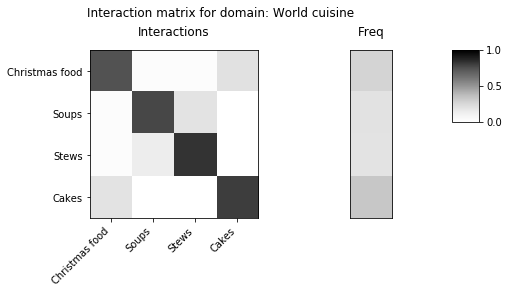

saving data in: ./WIKIdata/matrices2020/wikipedia_system_760.npz


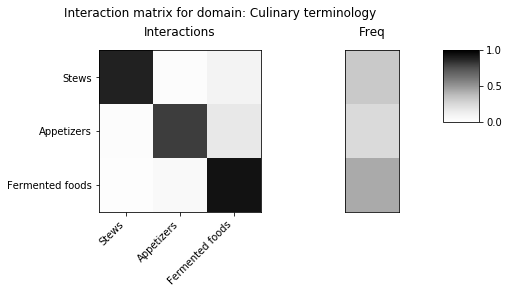

something wrong with building freq or int mat: interactionMatrix[0, :]        sum not 1: instead, [nan nan  1. nan]
something wrong with building freq or int mat: interactionMatrix[0, :]        sum not 1: instead, [nan nan  1. nan]
saving data in: ./WIKIdata/matrices2020/wikipedia_system_761.npz


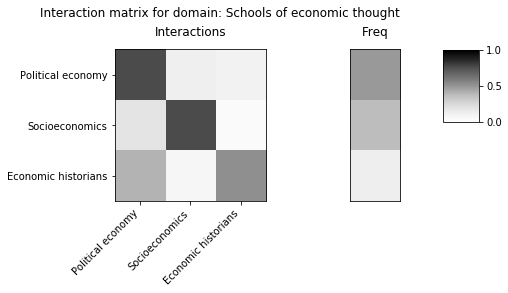

saving data in: ./WIKIdata/matrices2020/wikipedia_system_762.npz


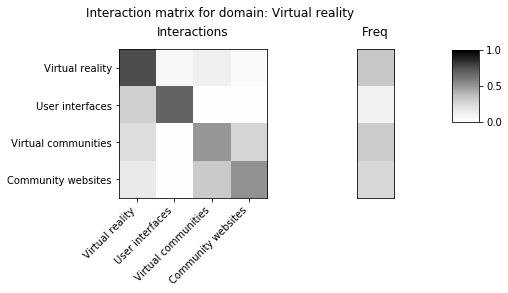

saving data in: ./WIKIdata/matrices2020/wikipedia_system_763.npz


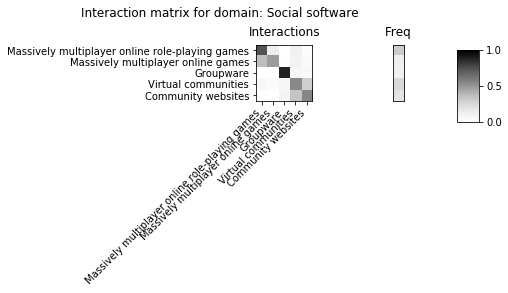

saving data in: ./WIKIdata/matrices2020/wikipedia_system_764.npz


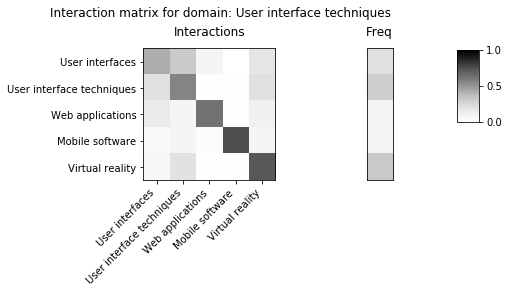

saving data in: ./WIKIdata/matrices2020/wikipedia_system_765.npz


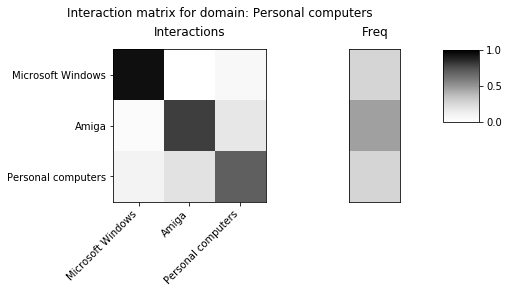

saving data in: ./WIKIdata/matrices2020/wikipedia_system_766.npz


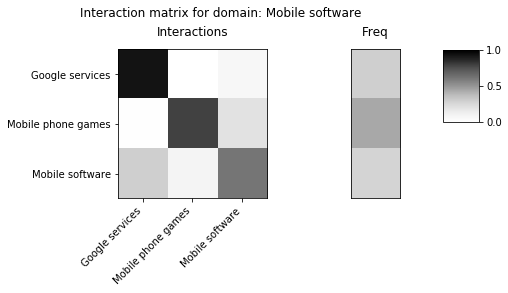

saving data in: ./WIKIdata/matrices2020/wikipedia_system_767.npz


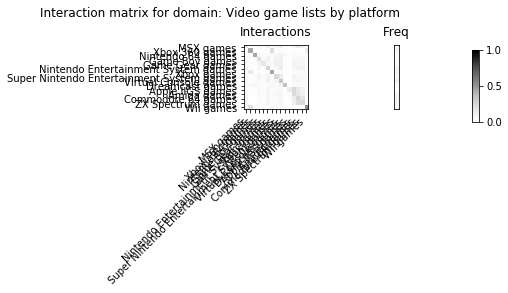

saving data in: ./WIKIdata/matrices2020/wikipedia_system_768.npz


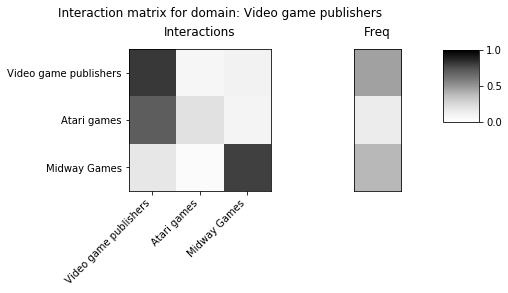

saving data in: ./WIKIdata/matrices2020/wikipedia_system_769.npz


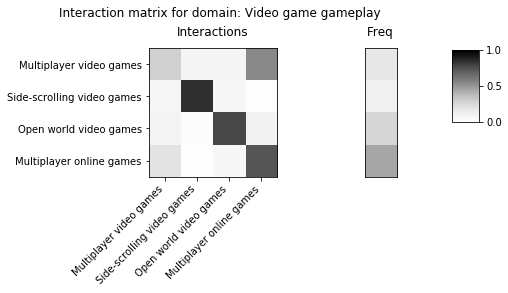

saving data in: ./WIKIdata/matrices2020/wikipedia_system_770.npz


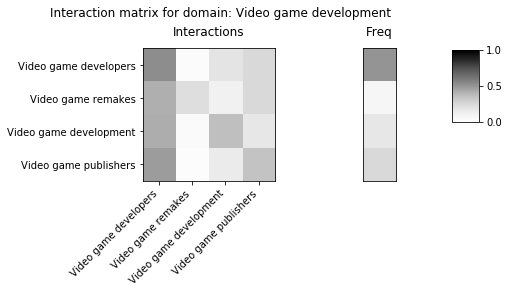

saving data in: ./WIKIdata/matrices2020/wikipedia_system_771.npz


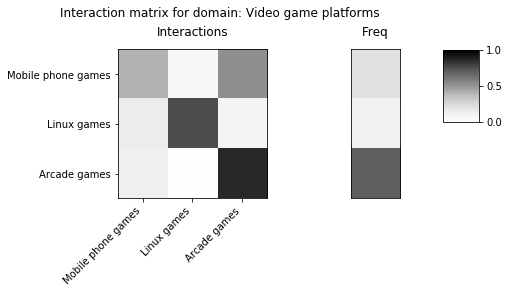

saving data in: ./WIKIdata/matrices2020/wikipedia_system_772.npz


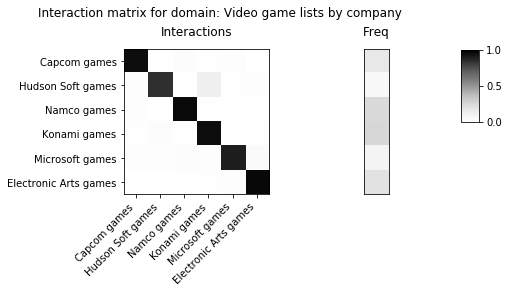

saving data in: ./WIKIdata/matrices2020/wikipedia_system_773.npz


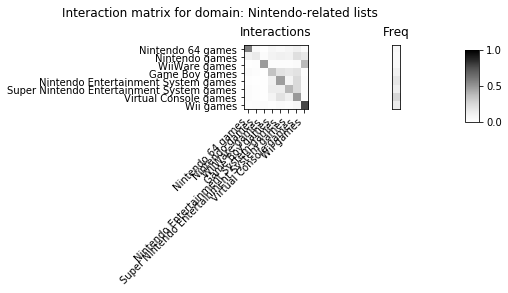

saving data in: ./WIKIdata/matrices2020/wikipedia_system_774.npz


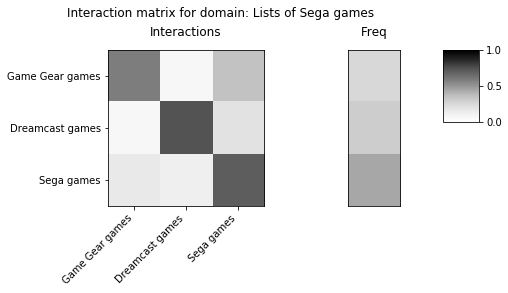

saving data in: ./WIKIdata/matrices2020/wikipedia_system_775.npz


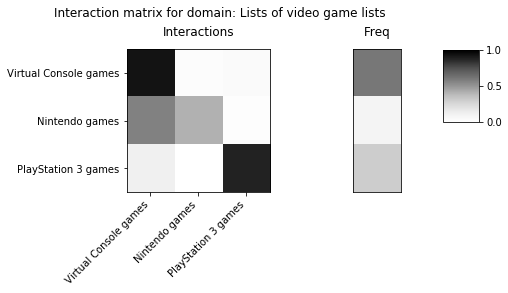

saving data in: ./WIKIdata/matrices2020/wikipedia_system_776.npz


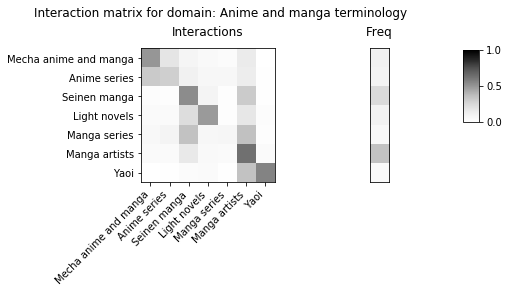

saving data in: ./WIKIdata/matrices2020/wikipedia_system_777.npz


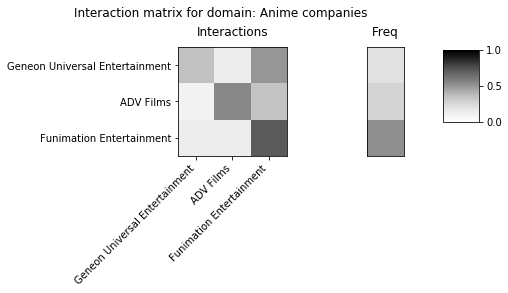

saving data in: ./WIKIdata/matrices2020/wikipedia_system_778.npz


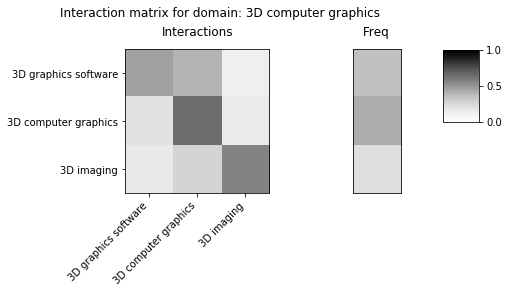

saving data in: ./WIKIdata/matrices2020/wikipedia_system_779.npz


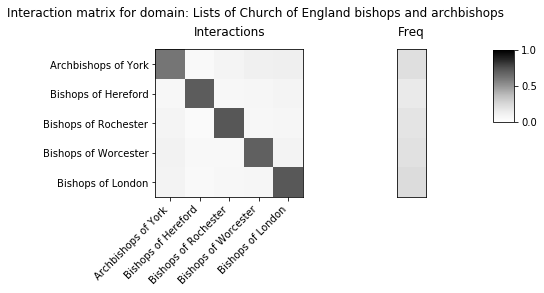

saving data in: ./WIKIdata/matrices2020/wikipedia_system_780.npz


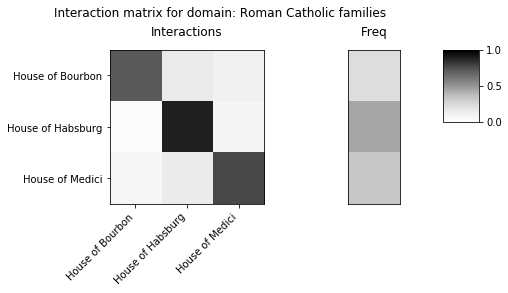

In [11]:
# this dictionary will hold all domain objects and allowed them to be slowly filled
domainDict = {}
for categoryIdx in categoryIdxs: # already an ascending range
    edgeDict = catsCatsMappings[categoryIdx] # this will give a counter for that category for edges to other cats
    domainIdxs = catDomMappings[categoryIdx] # gives domain idxs of category
    
    for domainIdx in domainIdxs: # add edges to each of these domains
        if domainIdx in domainDict.keys(): # if already initialized, add 
            domainDict[domainIdx].categoryIdxs.append(categoryIdx) # add category to domain
            domainDict[domainIdx].edges[categoryIdx] = edgeDict # add its edges in counter format
        else: # else, initialize
            domainDict[domainIdx] = domainObject(domainNames[domainIdx], domainIdx)
            domainDict[domainIdx].categoryIdxs.append(categoryIdx) # add category to domain
            domainDict[domainIdx].edges[categoryIdx] = edgeDict # add its edges in counter format


counter = 0 # reindex domains in case that limits have changed from generation phase

# iterate over all domains
for domain in list(domainDict.values()):
    domain.reduce_categories(categoryNames) # this takes global category information and reindexes it to be local to domain
    if domain.C >=lower_limit and domain.C <= upper_limit:
        domain.reduce_edges(categoryNames) # reduces edge dictionaries for every source to only contain categories in domain
        try:
            domain.create_interaction_matrix() # runs through dictionaries and adds counts to interaction matrix.
            # above function creates frequency vector as byproduct from normalized row and column sum.
        except Exception as e:
            print('something wrong with building freq or int mat: {}'.format(e))
            continue
            
        domain.old_idx = domain.idx
        domain.idx = counter # only save kept domains in increasing order; this will no longer be consistent with any mappings
        domain.save_matrices('{0}/{1}/wikipedia_system_{2}.npz'.format(dataDir, matDir, domain.idx))
        
        #domain.save_matrices('{0}/{1}/wikipedia_system_{2}_C_{3}.npz'.format(dataDir, matDir, domain.idx, domain.C))
        domain.plot_interaction_matrix('{0}/{1}/{2}_{3}_figs'.format(dataDir, figDir, domain.idx, domain.name))
        plt.close('all')
        counter += 1
        
    else:
        print('Error: {} categories in domain'.format(domain.C))
        break

